In [14]:
# Задание https://docs.google.com/document/d/1AI1QMdibC_VvZpWQ13KHGZiPAlAftPM5mt8DFSoUKOs/edit?usp=sharing

In [15]:
# import tensorflow as tf
# print(tf.__version__)

In [16]:
# IMPORTS 
import math
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import fastparquet
import os
import seaborn as sns
import tensorflow as tf


from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import shapiro
from statsmodels.stats.diagnostic import acorr_ljungbox, het_white
from sklearn.model_selection import train_test_split
from collections import defaultdict
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from datetime import date
from scipy import stats
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score

In [17]:
# Читаем датасеты
CITIES_LIST = os.listdir('data')
if ".DS_Store" in CITIES_LIST:
    CITIES_LIST.remove(".DS_Store")

print(CITIES_LIST)

def read_data(city_name: str) -> pd.DataFrame:
    """Читает данные из папки по названию города"""
    dataet_list = os.listdir(f"data/{city_name}")
    if ".DS_Store" in dataet_list:
        dataet_list.remove(".DS_Store")
        
    df = pd.DataFrame()
    for dataset_name in dataet_list:
        sub_df = pd.read_parquet(f"data/{city_name}/{dataset_name}", engine='fastparquet')
        df = pd.concat([df, sub_df], ignore_index=True)

    return df

df_nak = read_data(city_name=CITIES_LIST[0])
df_msc = read_data(city_name=CITIES_LIST[1])
df_bla = read_data(city_name=CITIES_LIST[2])
df_spb = read_data(city_name=CITIES_LIST[3])
df_soc = read_data(city_name=CITIES_LIST[4])
df_gel = read_data(city_name=CITIES_LIST[5])
dfs = [df_nak, df_msc, df_bla, df_spb, df_soc, df_gel]

['Nakhodka', 'Moscow', 'Blagoveshchensk', 'Saint-Petersburg', 'Sochi', 'Gelendzhik']


In [18]:
for df in [df_nak, df_msc, df_bla, df_spb, df_soc, df_gel]:
    display(df.head())

,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,weathercode,wind_speed_10m,surface_pressure
0,-11.6,45,0.0,0.0,0.0,0,13.7,1022.799988
1,-12.1,46,0.0,0.0,0.0,0,13.9,1023.000000
2,-12.4,46,0.0,0.0,0.0,0,14.8,1022.799988
3,-12.8,47,0.0,0.0,0.0,0,11.8,1023.000000
4,-13.1,46,0.0,0.0,0.0,0,5.1,1023.599976


,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,weathercode,wind_speed_10m,surface_pressure
0,-1.9,87,0.1,0.0,0.07,71,12.7,985.400024
1,-2.4,86,0.3,0.0,0.21,73,13.5,986.400024
2,-2.3,86,0.0,0.0,0.00,3,14.6,987.299988
3,-3.3,85,0.0,0.0,0.00,1,14.6,988.099976
4,-4.2,85,0.0,0.0,0.00,2,13.5,988.400024


,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,weathercode,wind_speed_10m,surface_pressure
0,-23.700001,67,0.0,0.0,0.0,0,9.8,1003.900024
1,-23.500000,67,0.0,0.0,0.0,0,10.5,1004.099976
2,-23.200001,67,0.0,0.0,0.0,0,10.5,1004.200012
3,-23.100000,67,0.0,0.0,0.0,0,10.6,1004.299988
4,-23.000000,66,0.0,0.0,0.0,0,10.6,1004.099976


,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,weathercode,wind_speed_10m,surface_pressure
0,-1.6,69,0.0,0.0,0.0,3,18.900000,1006.599976
1,-1.3,67,0.0,0.0,0.0,3,16.799999,1006.799988
2,-1.4,69,0.0,0.0,0.0,3,14.700000,1006.500000
3,-1.4,69,0.0,0.0,0.0,3,13.400000,1006.900024
4,-1.3,76,0.0,0.0,0.0,3,10.300000,1006.299988


,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,weathercode,wind_speed_10m,surface_pressure
0,8.3,88,2.0,2.0,0.0,61,19.299999,1017.799988
1,8.1,92,3.2,3.2,0.0,63,14.800000,1017.799988
2,7.9,92,3.7,3.7,0.0,63,9.700000,1018.000000
3,8.1,88,3.1,3.1,0.0,63,10.600000,1017.700012
4,7.9,87,1.2,1.2,0.0,55,13.200000,1017.200012


,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,weathercode,wind_speed_10m,surface_pressure
0,4.5,94,0.3,0.3,0.0,51,5.5,1023.200012
1,4.3,94,0.5,0.5,0.0,53,6.8,1023.500000
2,3.9,96,0.1,0.1,0.0,51,7.7,1024.000000
3,4.6,94,0.0,0.0,0.0,2,8.4,1023.799988
4,4.0,96,0.0,0.0,0.0,2,9.5,1024.199951


Задние №2.1. Разведочный анализ данных (EDA)

---- Построение графиков для Nakhodka ----
Проверка на пропуски...
Пропусков в данных нет!
Построение линии тренда...


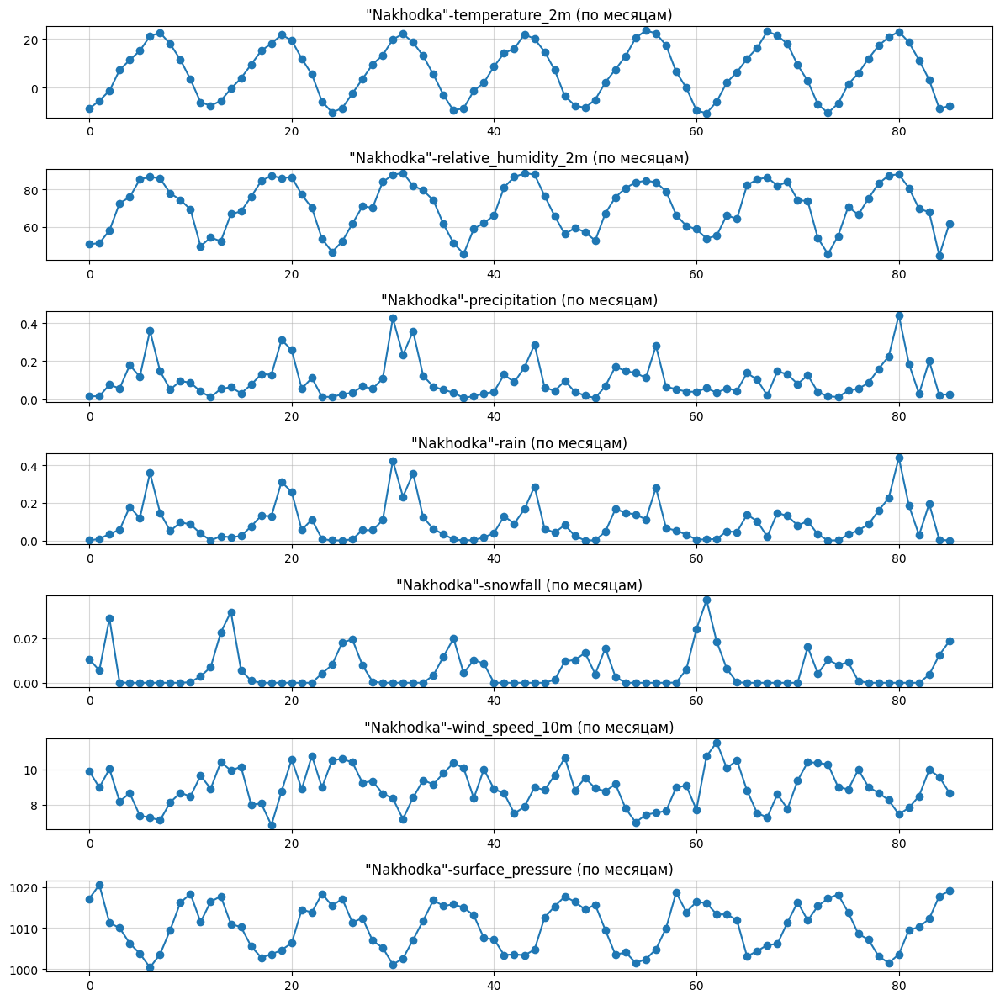

Построение суточной сезонности...


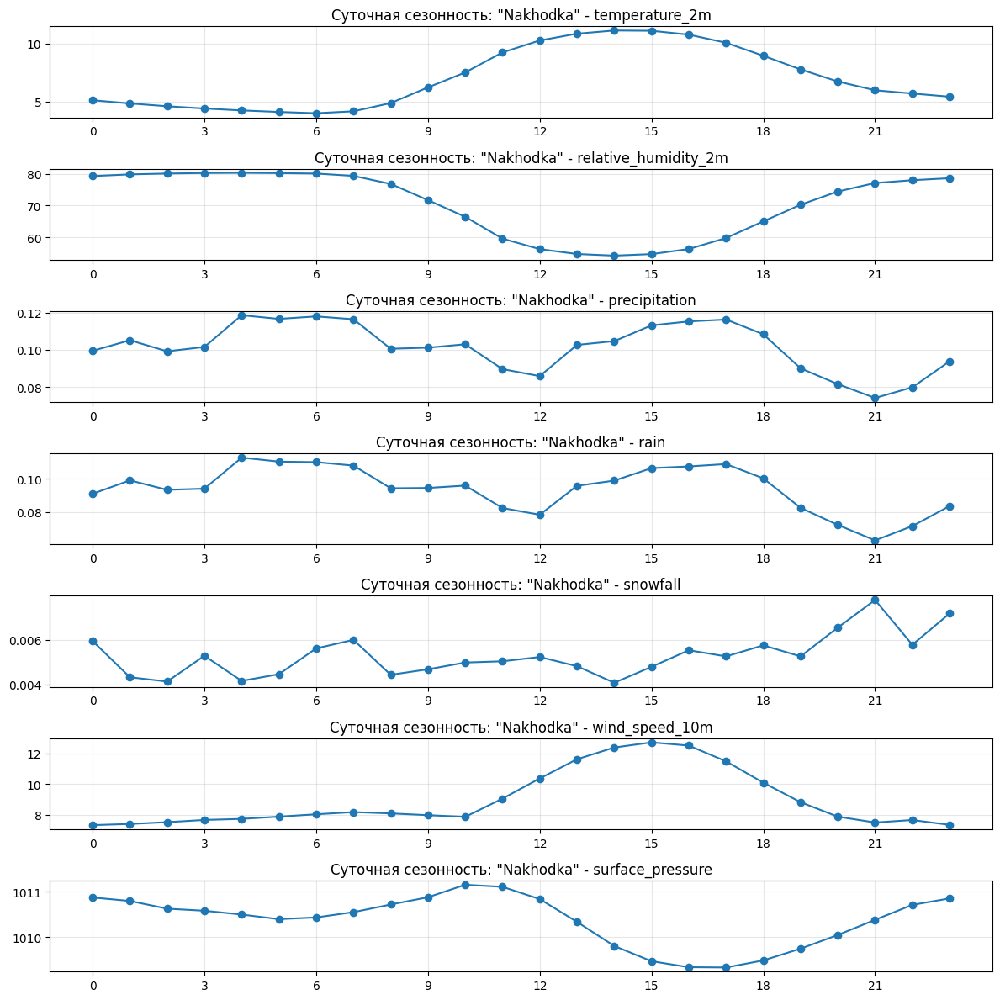

Построение годовой сезонности...


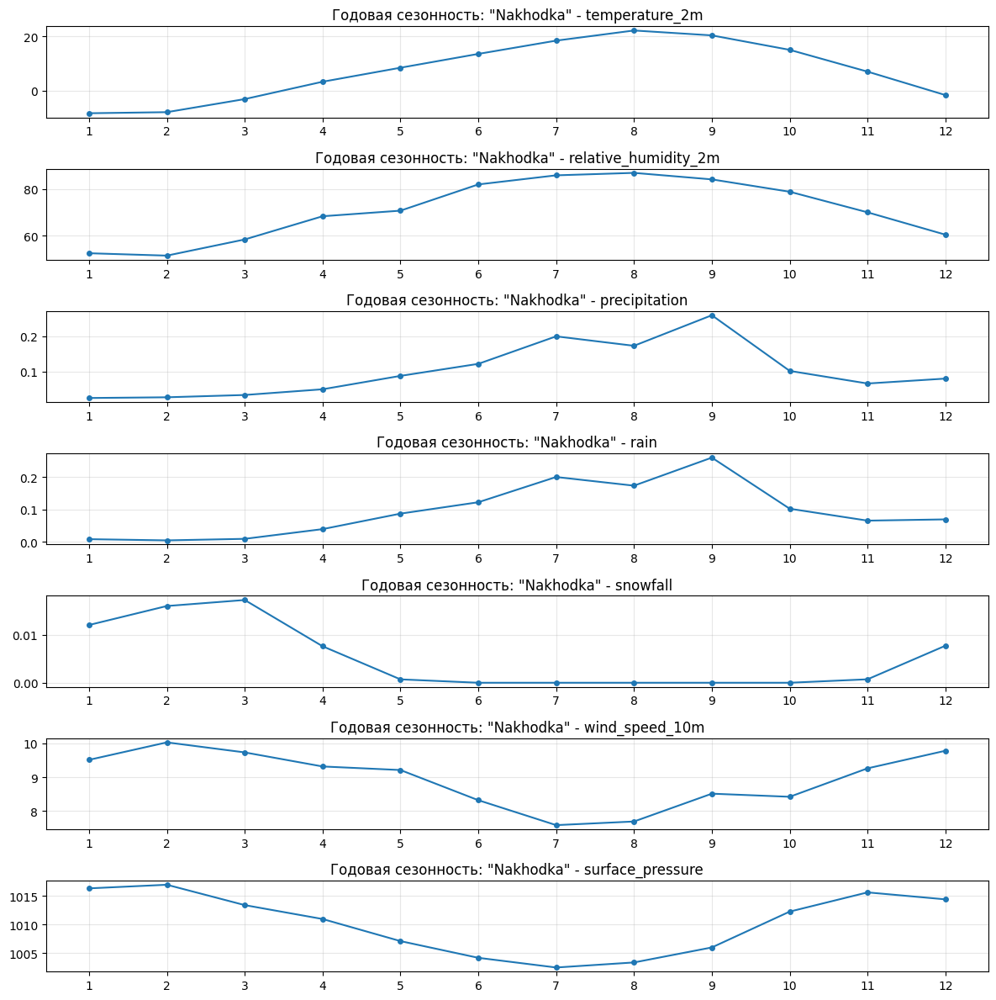

Построение ящика с усами...


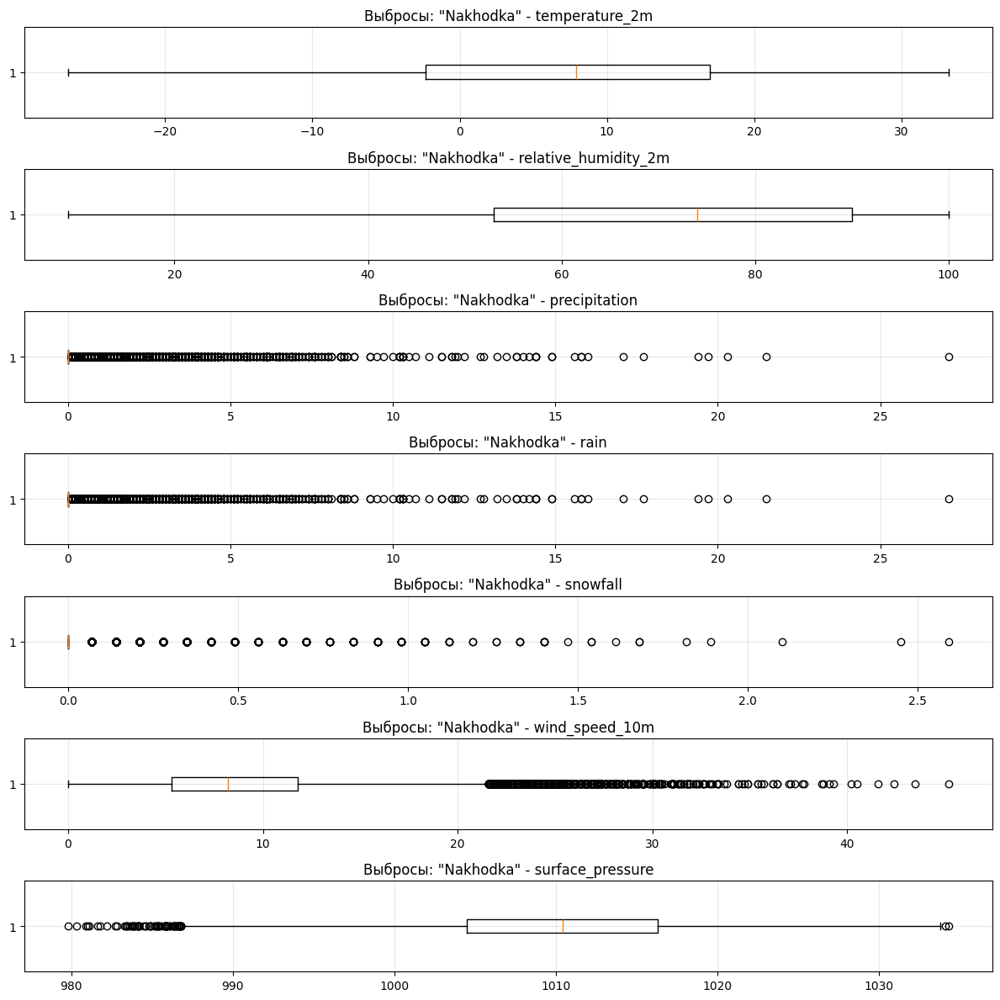

---- Построение графиков для Moscow ----
Проверка на пропуски...
Пропусков в данных нет!
Построение линии тренда...


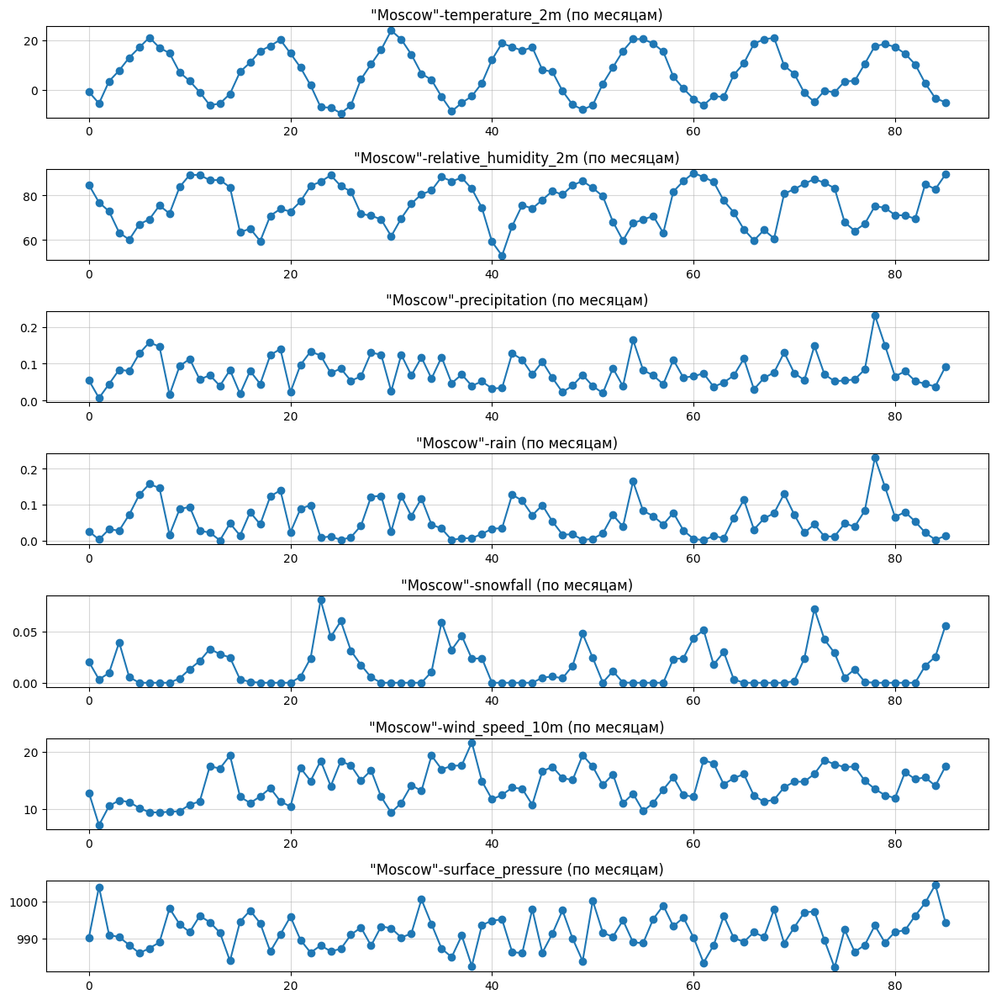

Построение суточной сезонности...


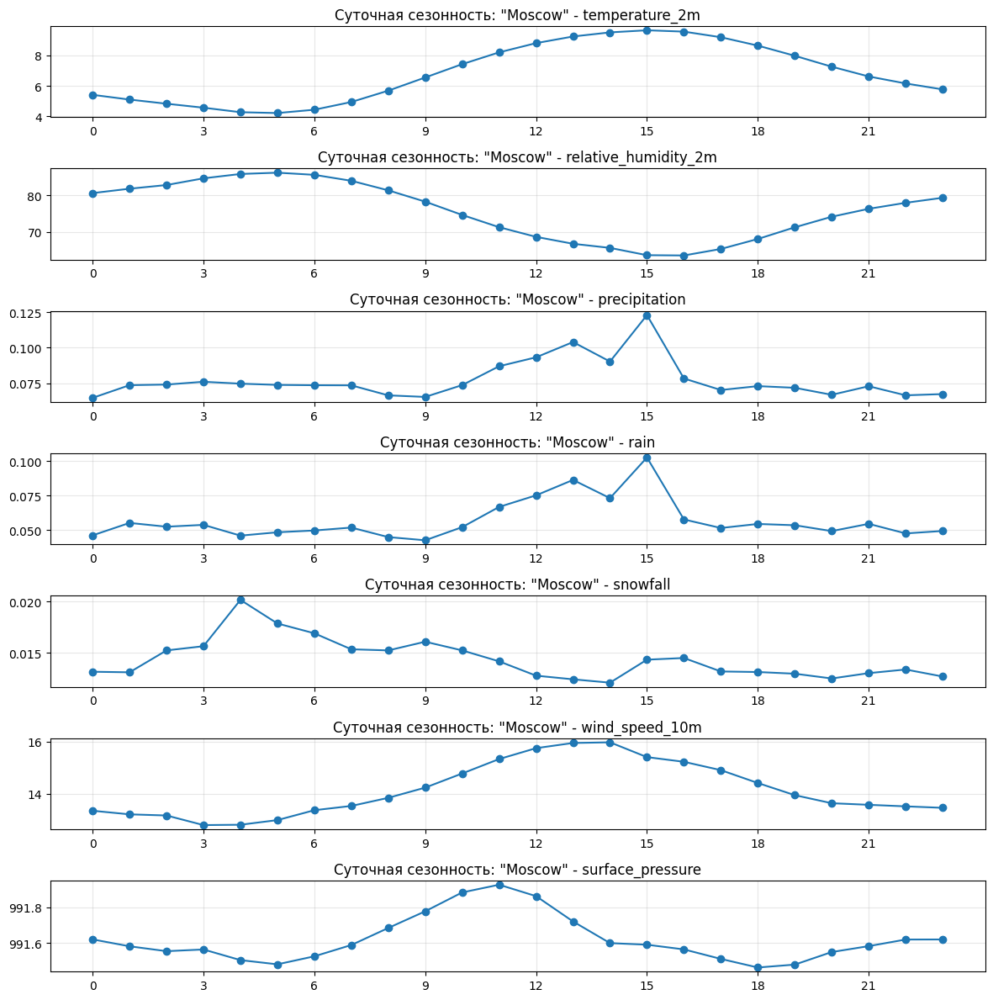

Построение годовой сезонности...


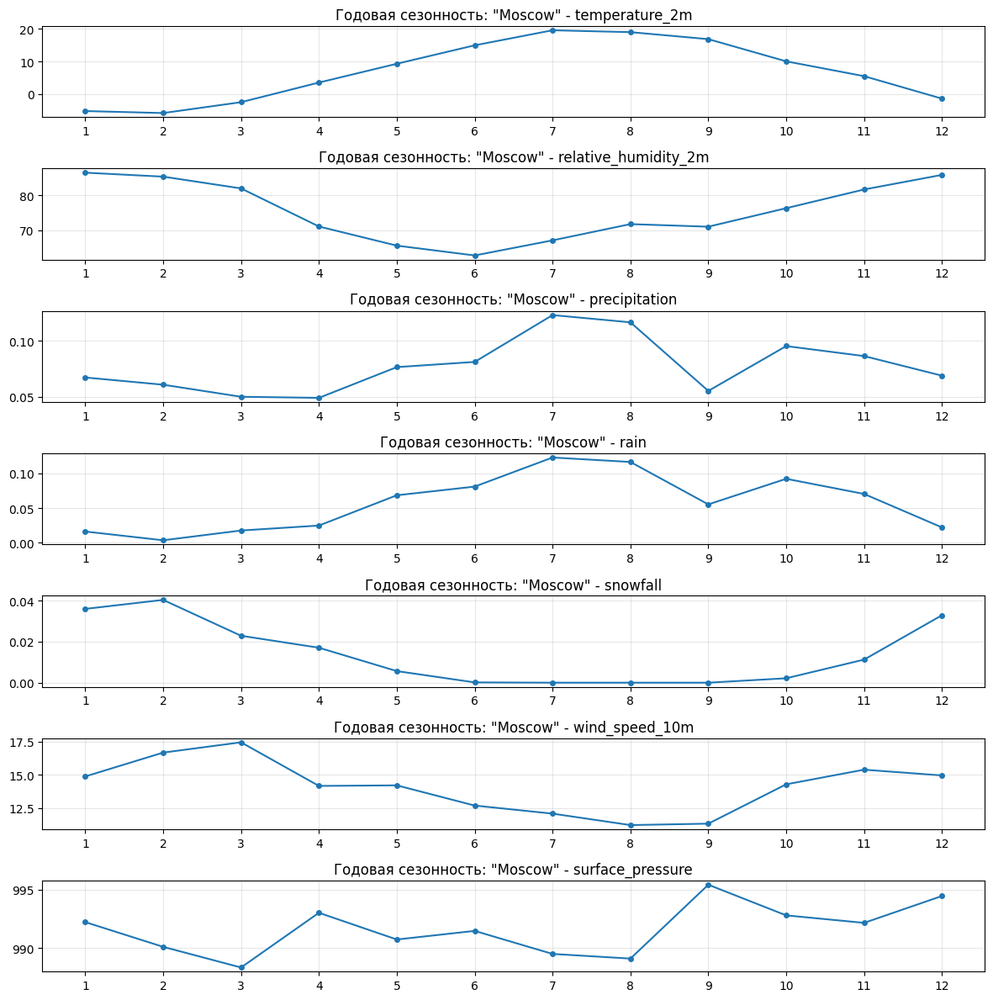

Построение ящика с усами...


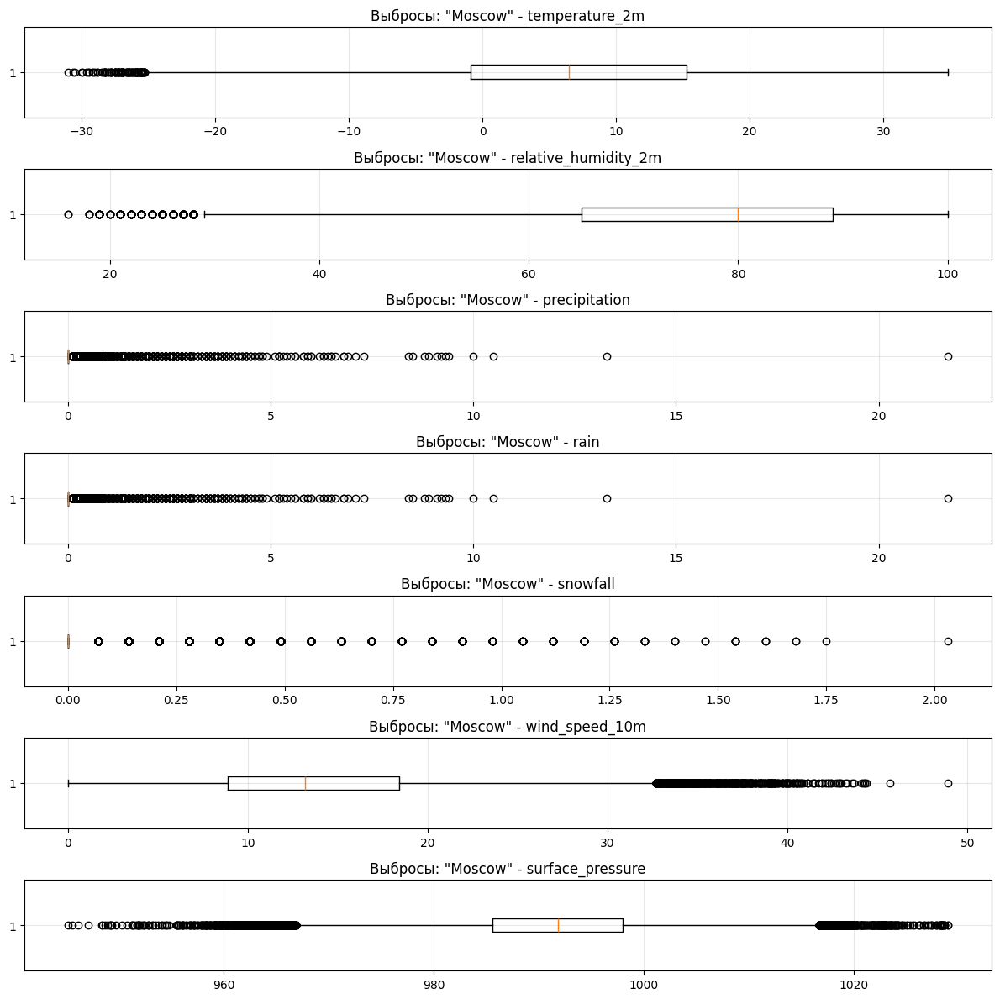

---- Построение графиков для Blagoveshchensk ----
Проверка на пропуски...
Пропусков в данных нет!
Построение линии тренда...


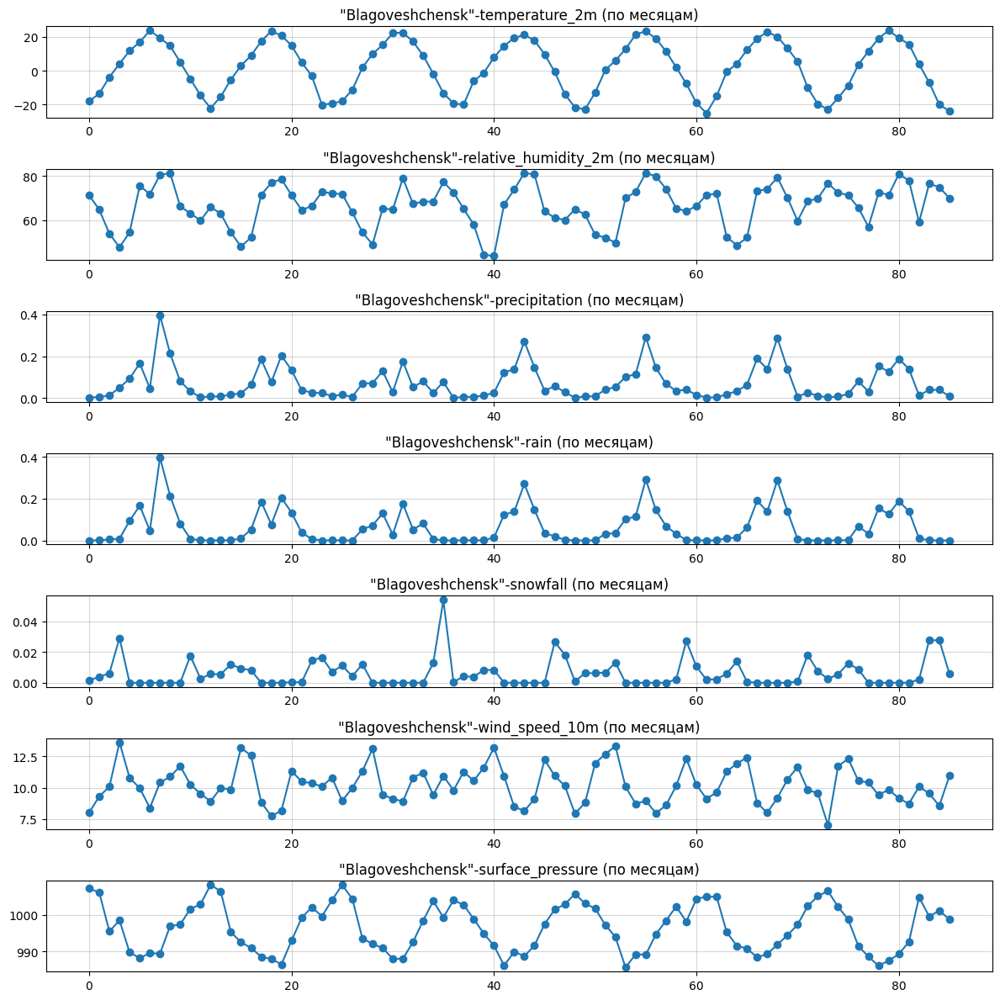

Построение суточной сезонности...


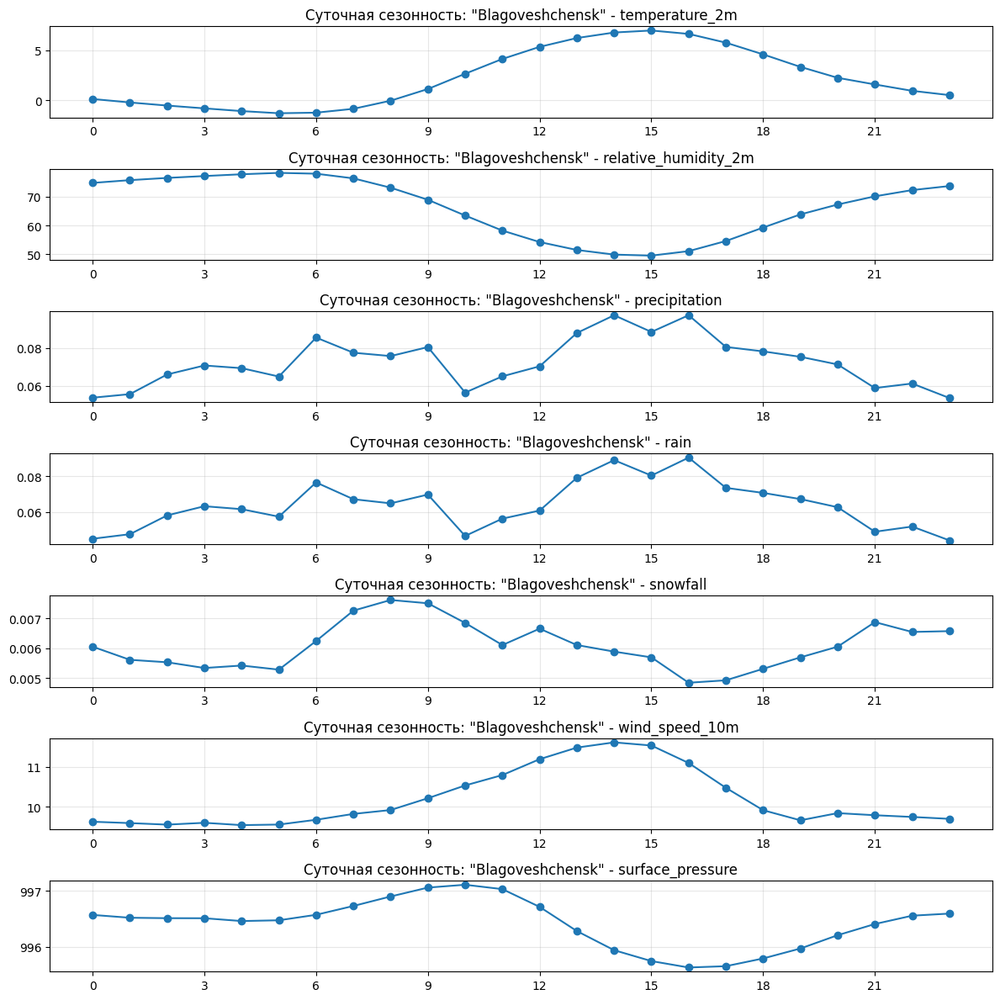

Построение годовой сезонности...


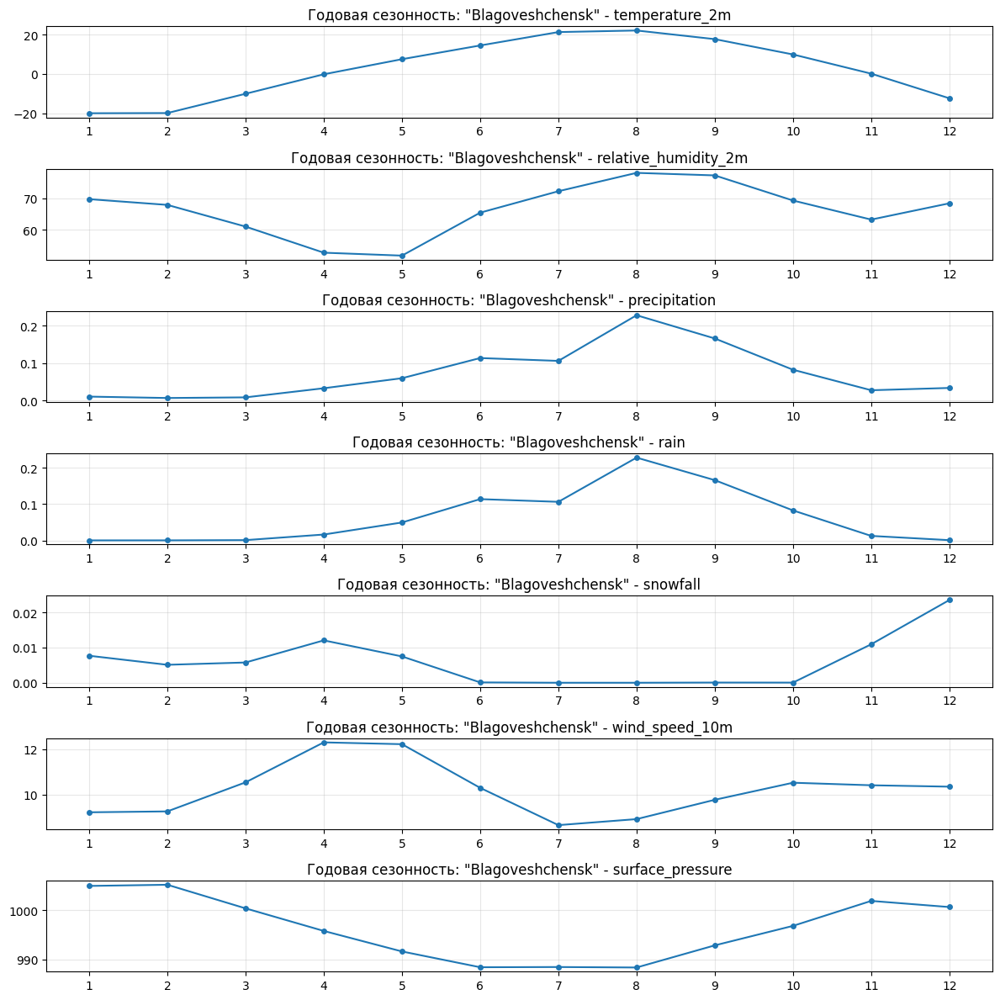

Построение ящика с усами...


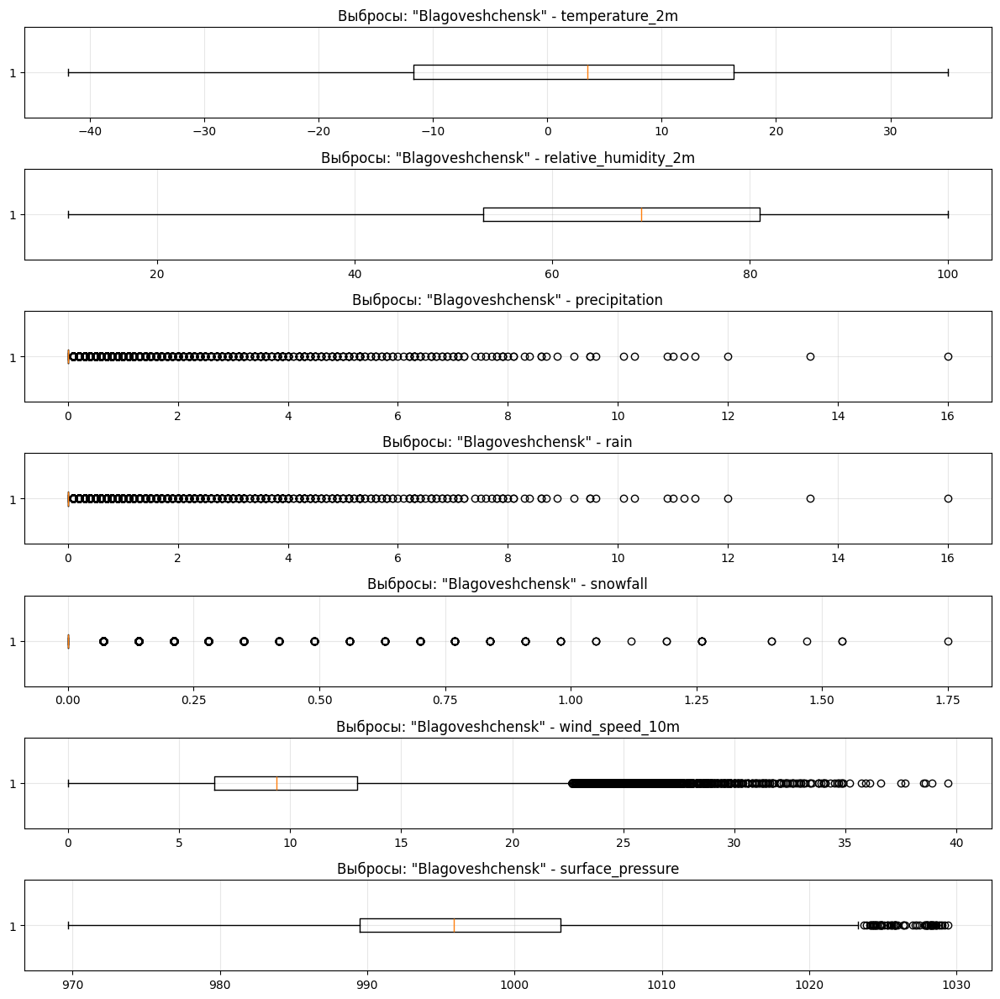

---- Построение графиков для Saint-Petersburg ----
Проверка на пропуски...
Пропусков в данных нет!
Построение линии тренда...


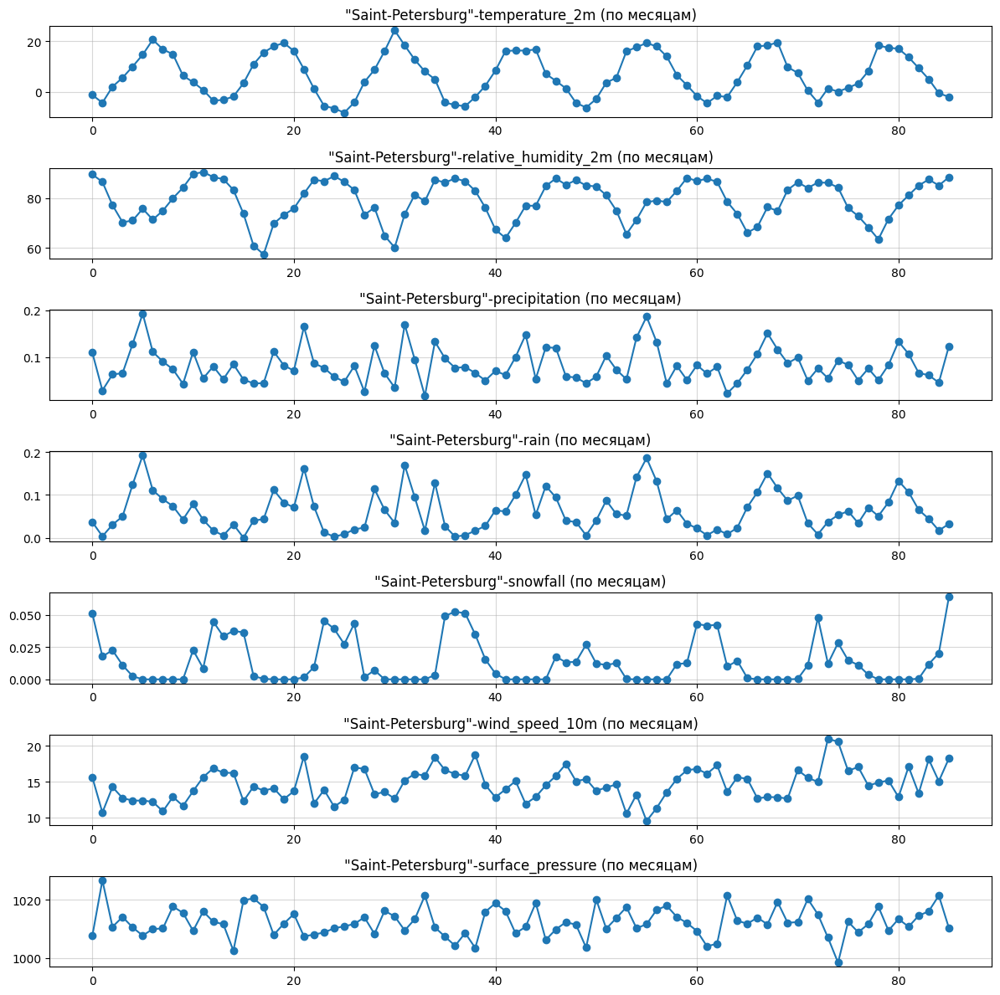

Построение суточной сезонности...


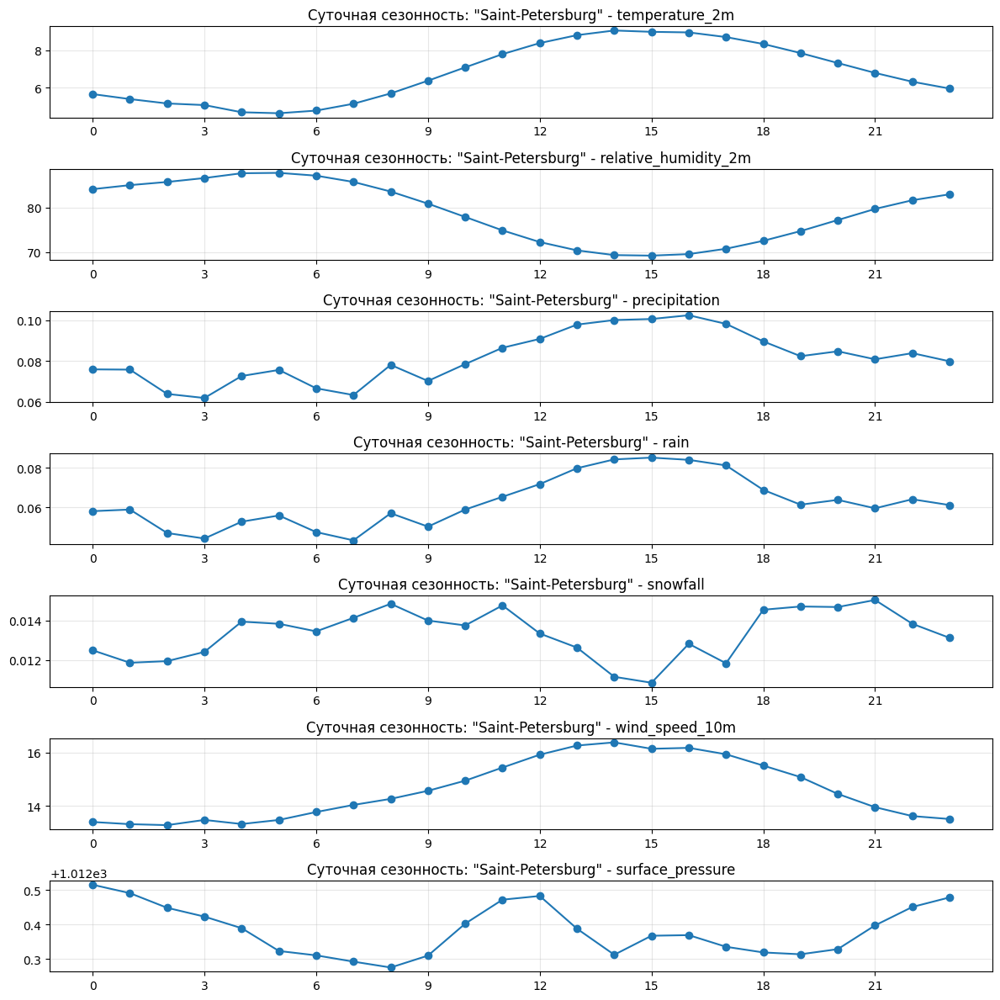

Построение годовой сезонности...


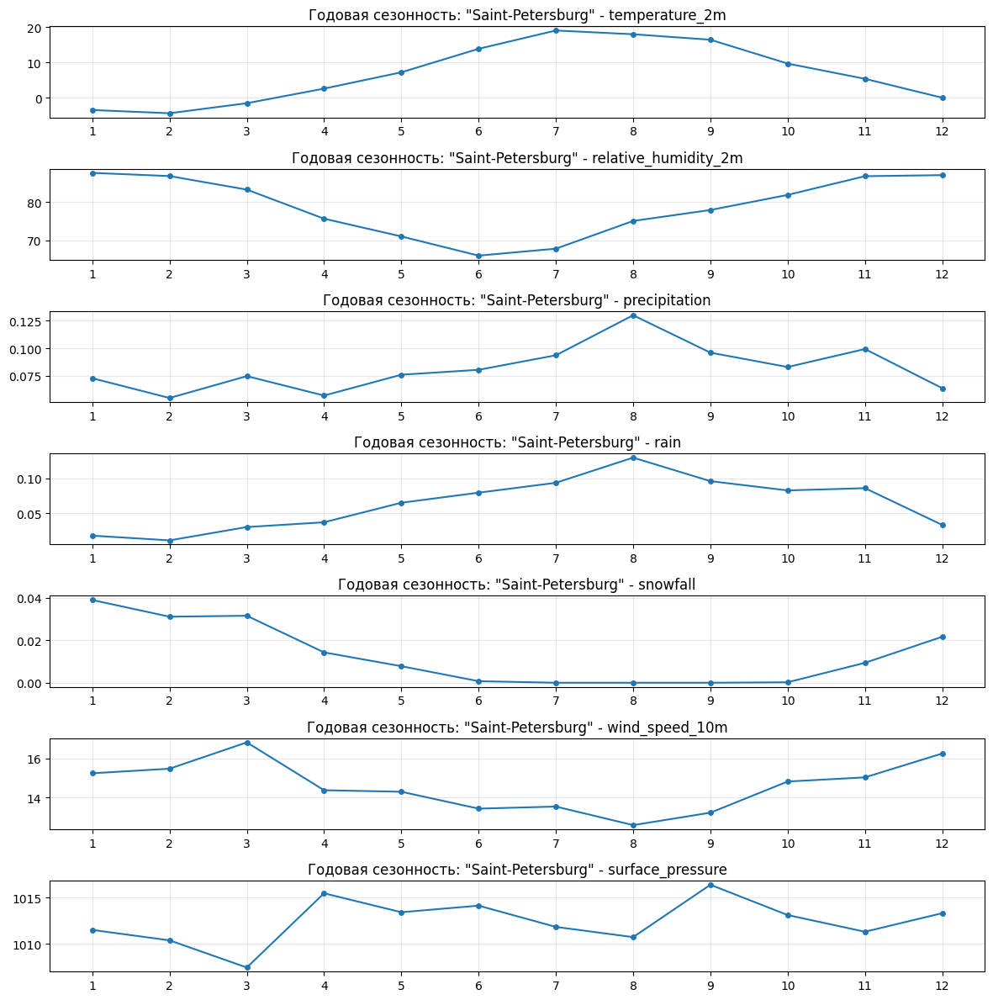

Построение ящика с усами...


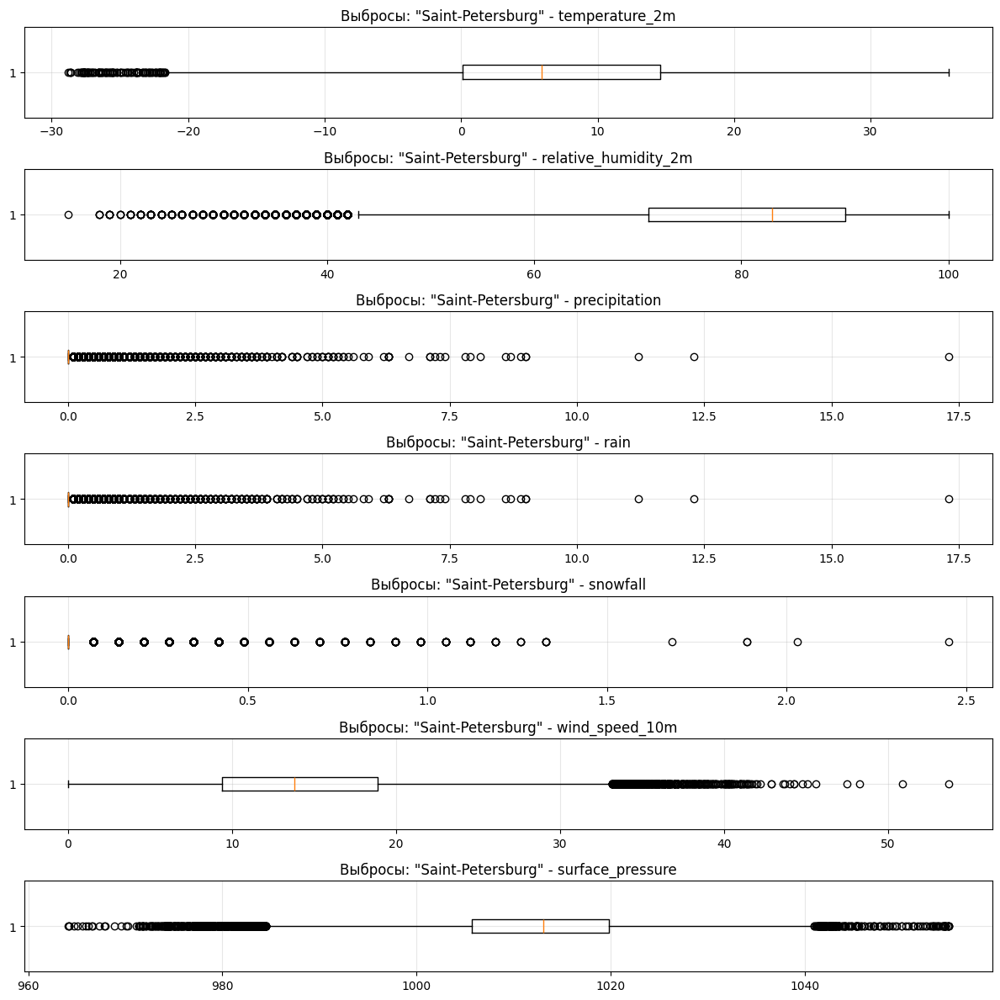

---- Построение графиков для Sochi ----
Проверка на пропуски...
Пропусков в данных нет!
Построение линии тренда...


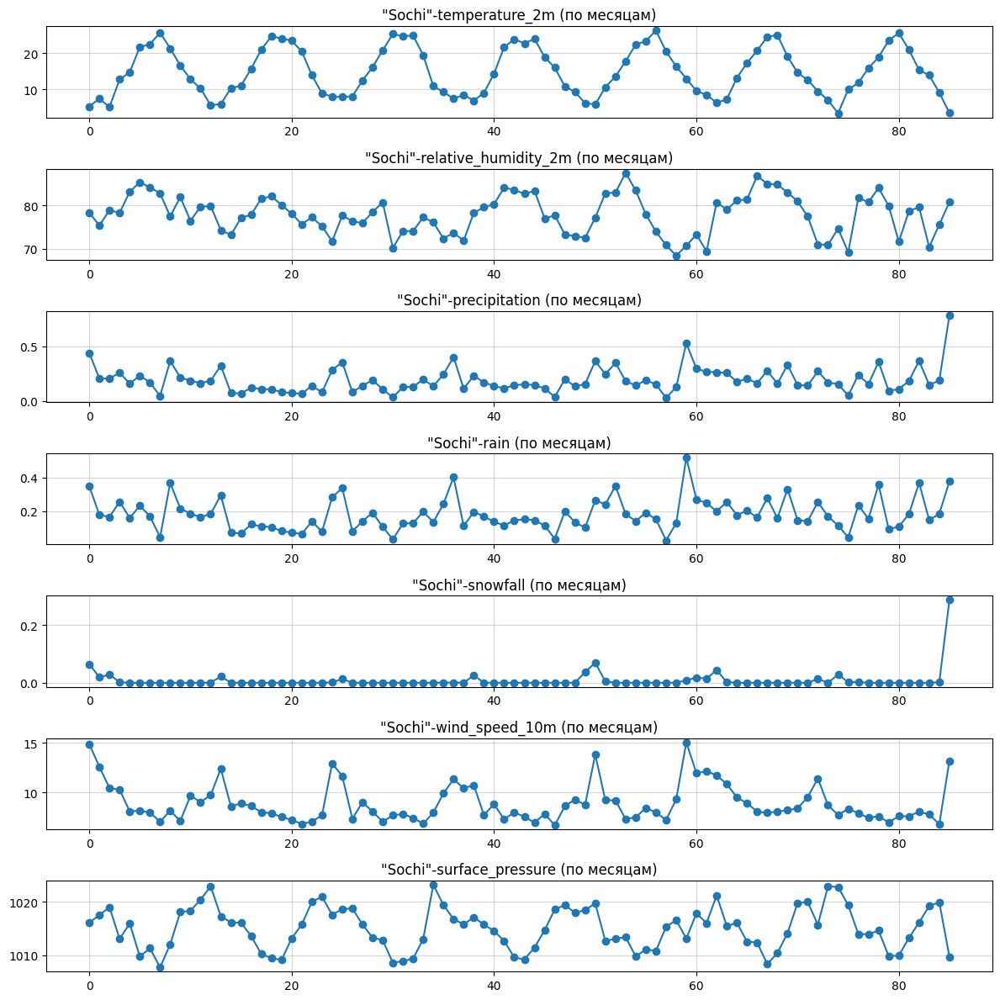

Построение суточной сезонности...


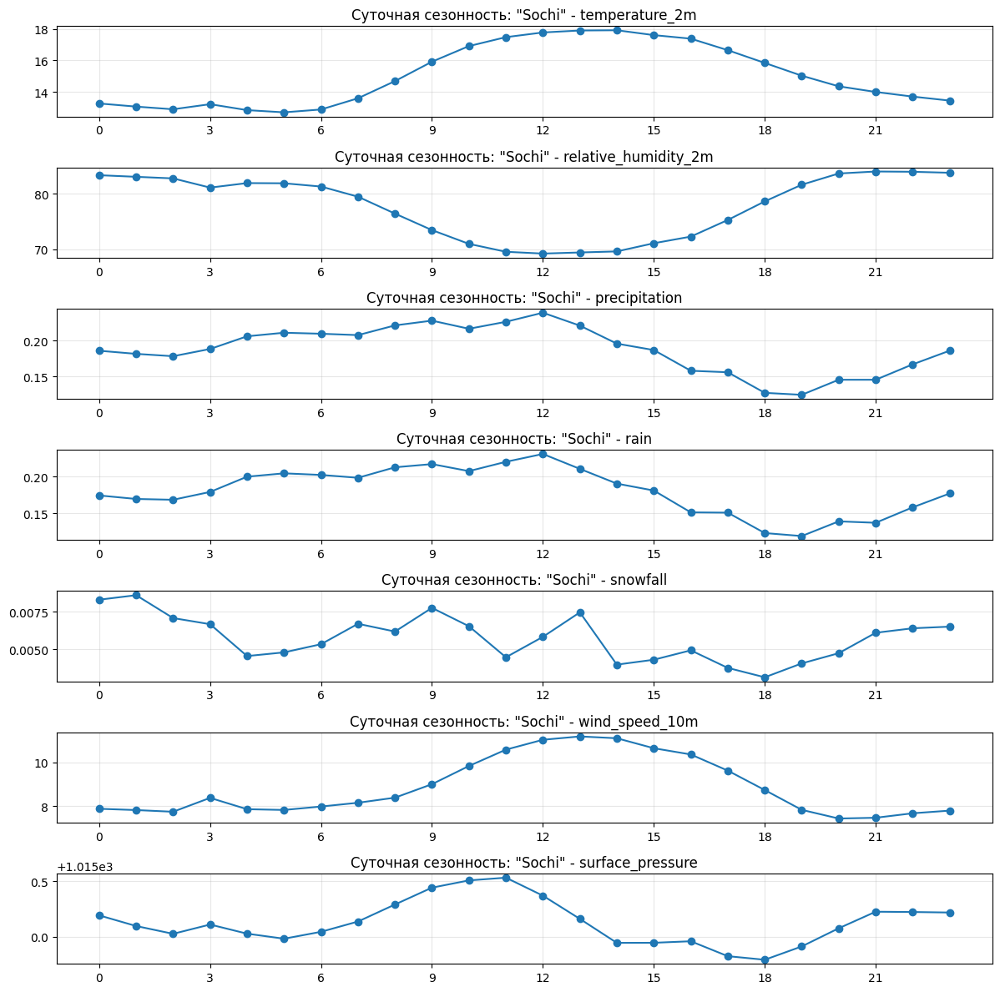

Построение годовой сезонности...


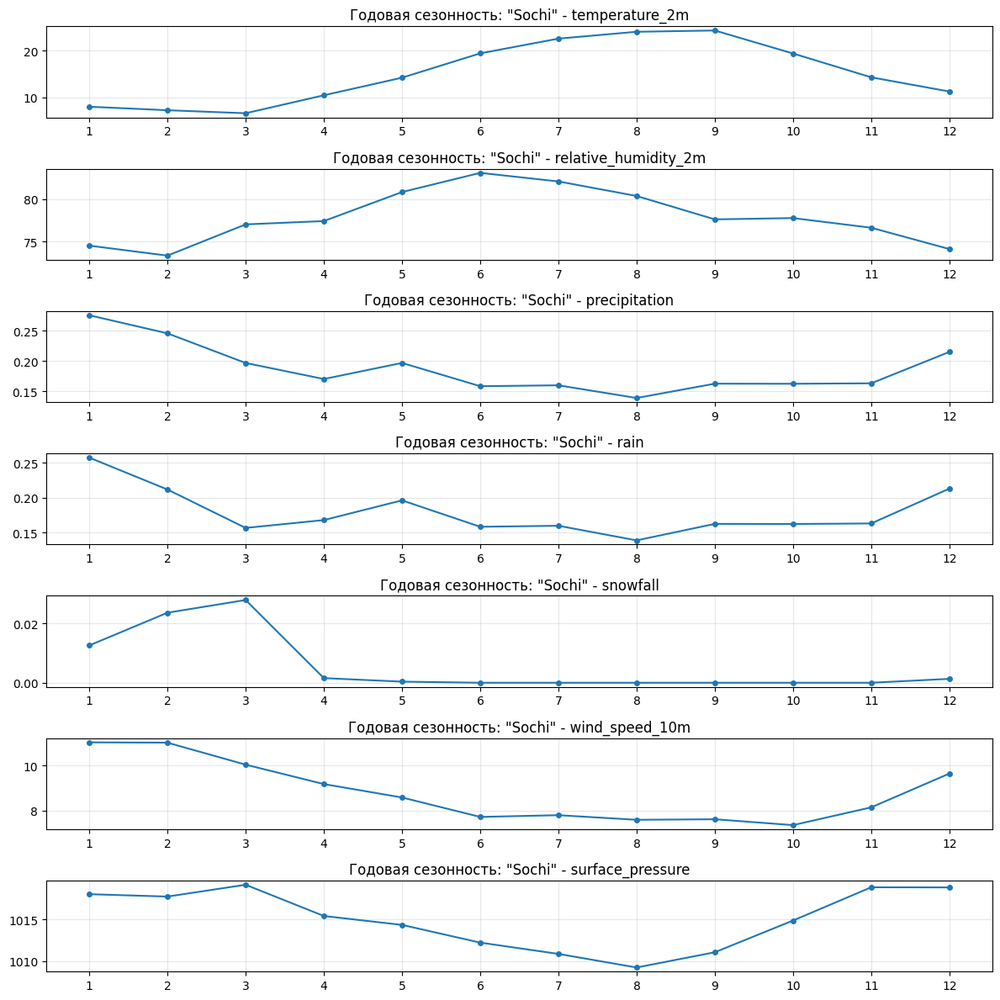

Построение ящика с усами...


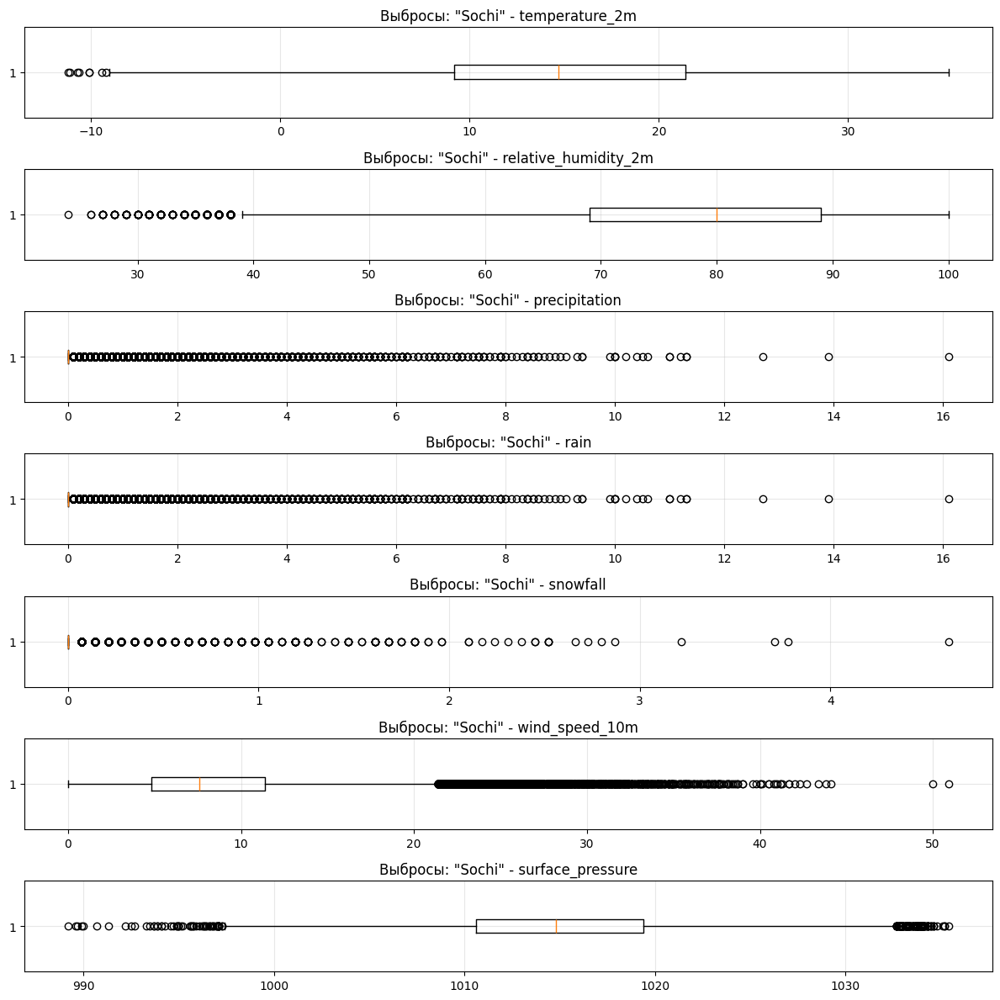

---- Построение графиков для Gelendzhik ----
Проверка на пропуски...
Пропусков в данных нет!
Построение линии тренда...


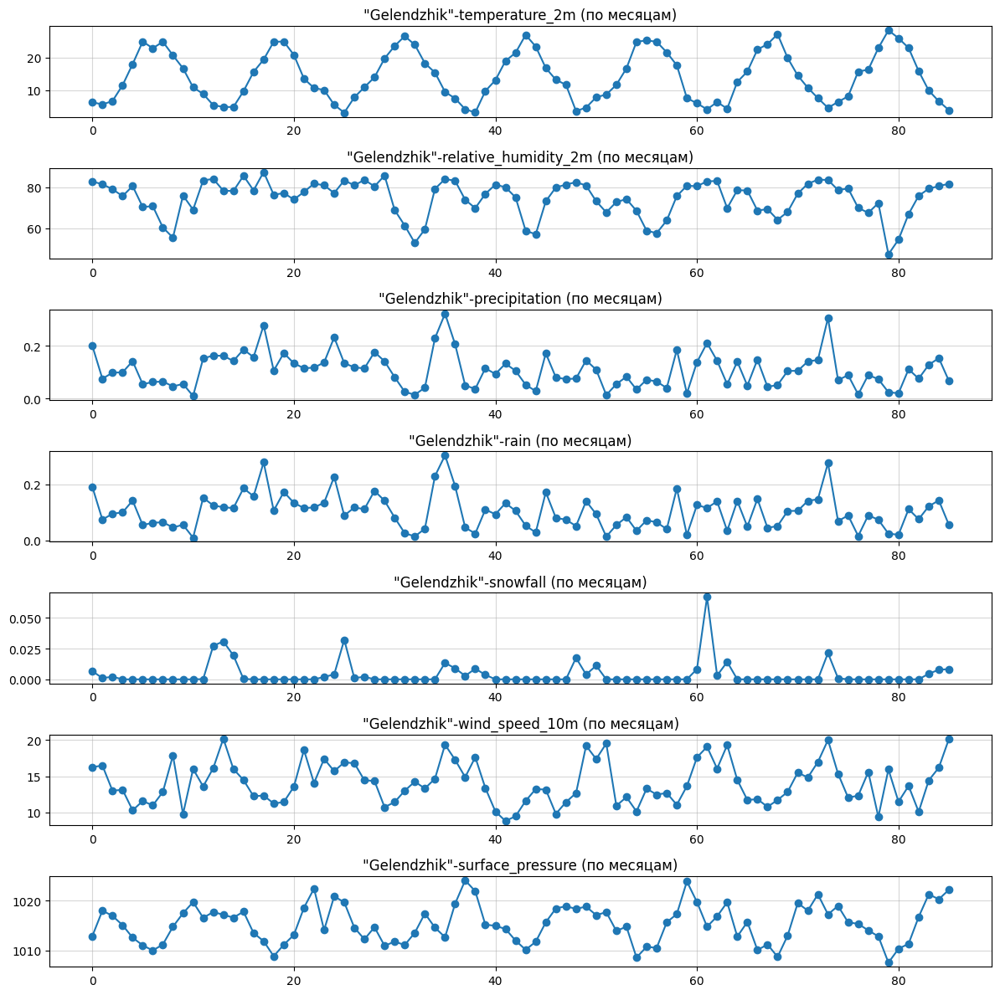

Построение суточной сезонности...


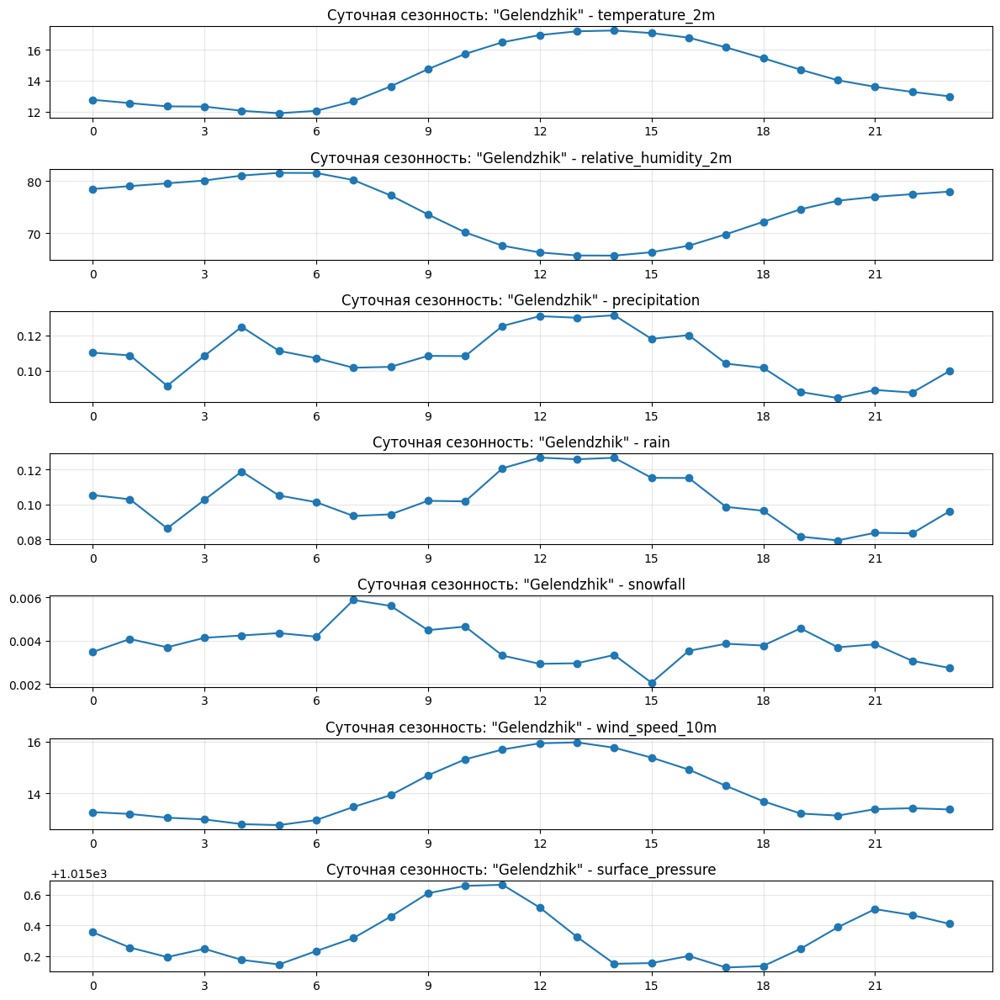

Построение годовой сезонности...


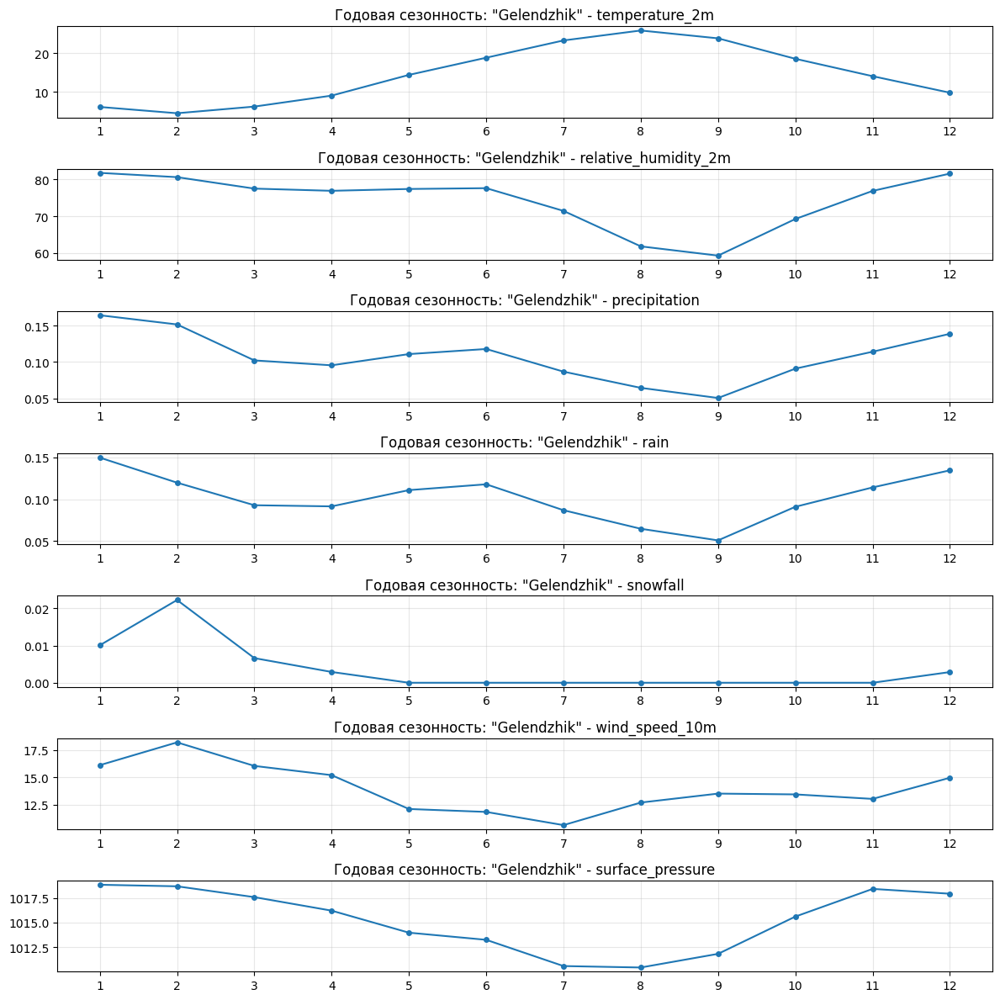

Построение ящика с усами...


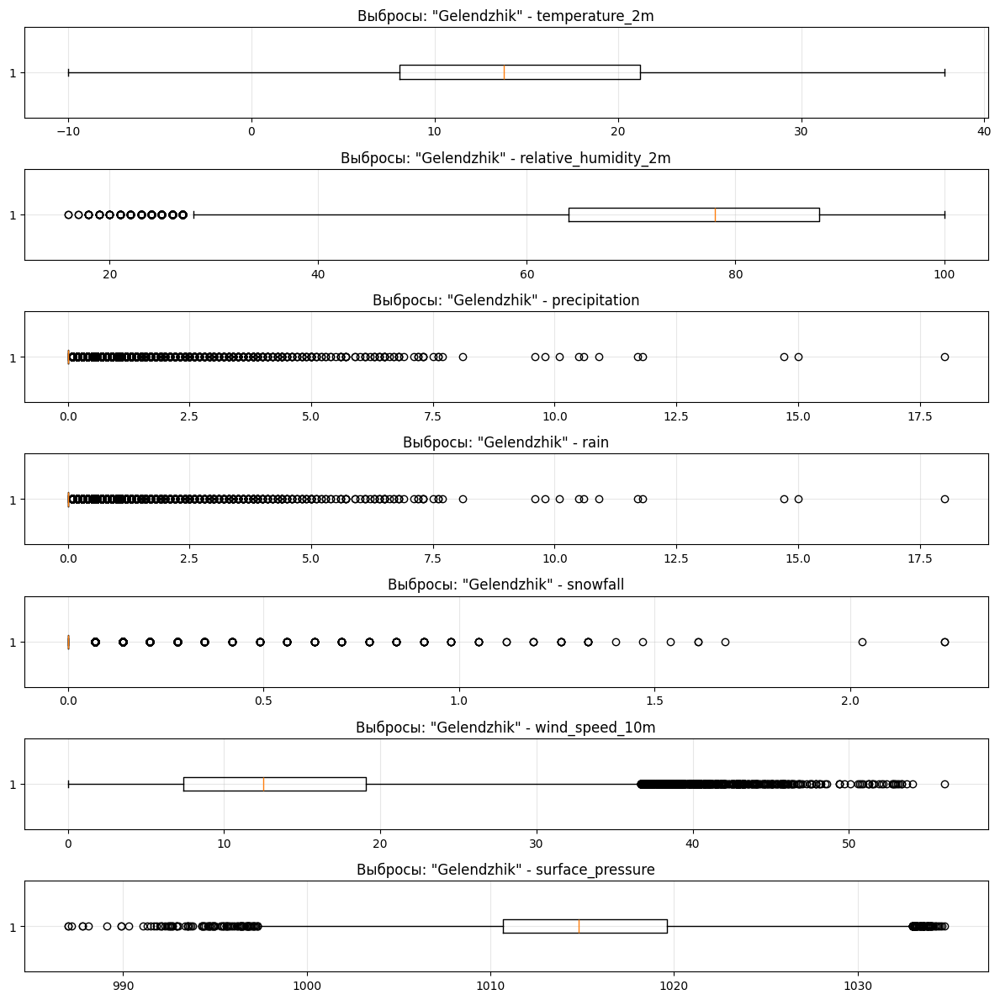

In [19]:
# Провести визуальный анализ всех показателей телеметрии: тренды, сезонность (суточная, годовая), выбросы, пропуски
def eda_analize(df: pd.DataFrame, df_name: str) -> None:
    """ 
        Построение графиков:
            - телеметрия;
            - тренды;
            - сезонность (суточная, годовая);
            - выбросы;
            - пропуски
    """
    print(f"---- Построение графиков для {df_name} ----")
    figsize_x, figsize_y = 12, 12

    # пропуски
    miss_count = df.isnull().sum()
    miss_count = miss_count[miss_count > 0]

    print("Проверка на пропуски...")
    if len(miss_count) > 0:
        plt.figure(figsize=(figsize_x, figsize_y))
        miss_count.plot(kind='bar')
        plt.title(f'Анализ пропусков в данных: "{df_name}"')
        plt.show()
    else:
        print("Пропусков в данных нет!")

    # тренды по месяцам
    print("Построение линии тренда...")

    cols = ['temperature_2m', 'relative_humidity_2m', 'precipitation', 
                    'rain', 'snowfall', 'wind_speed_10m', 'surface_pressure']
    months = df.index // 720
    df_month = df.groupby(months)[cols].mean()

    fig, axes = plt.subplots(len(cols), 1, figsize=(figsize_x, figsize_y))
    
    for i in range(len(cols)):
        axes[i].plot(df_month.index, df_month[cols[i]], marker='o')
        axes[i].set_title(f'"{df_name}"-{cols[i]} (по месяцам)')
        axes[i].grid(True, alpha=0.5)
    
    plt.tight_layout()
    plt.show()

    # сезонность (суточная, годовая)
    print("Построение суточной сезонности...")

    hour_num = df.index % 24
    hourly_avg = df.groupby(hour_num)[cols].mean()

    fig, axes = plt.subplots(len(cols), 1, figsize=(figsize_x, figsize_y))

    for i in range(len(cols)):
        axes[i].plot(hourly_avg.index, hourly_avg[cols[i]], marker='o')
        axes[i].set_title(f'Суточная сезонность: "{df_name}" - {cols[i]}')
        axes[i].set_xticks(range(0, 24, 3))
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("Построение годовой сезонности...")

    month_num = (df.index // 720) % 12
    monthly_avg = df.groupby(month_num)[cols].mean()

    fig, axes = plt.subplots(len(cols), 1, figsize=(figsize_x, figsize_y))

    for i in range(len(cols)):
        axes[i].plot(monthly_avg.index + 1, monthly_avg[cols[i]], marker='o', markersize=4)
        axes[i].set_title(f'Годовая сезонность: "{df_name}" - {cols[i]}')
        axes[i].set_xticks(range(1, 13))
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Выбросы 
    print("Построение ящика с усами...")
    fig, axes = plt.subplots(len(cols), 1, figsize=(figsize_x, figsize_y))

    for i in range(len(cols)):
        axes[i].boxplot(df[cols[i]].dropna(), vert=False)
        axes[i].set_title(f'Выбросы: "{df_name}" - {cols[i]}')
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

for sub_df, df_name in zip(dfs, CITIES_LIST):
    eda_analize(df=sub_df, df_name=df_name)

- Находка: Данные повторяются из года в год без каких-либо изменений в целом. Летом тепло и влажно (более 20), зимой холодно и сухо (до -10), основные дожди приходятся на август–сентябрь. В течение дня температура растёт к обеду, влажность падает. Из аномалий — иногда бывают очень сильные ливни и резкие порывы ветра.

- Москва: Картина похожая, но зима значительно холоднее — в среднем около -5, а в отдельные дни температура падала до -35. Осадки идут равномернее на протяжении всего года, снег лежит дольше. Ветер в целом сильнее, чем в Находке, и экстремальные порывы встречаются чаще.

- Благовещенск: Самый резкий температурный диапазон из всех городов — зимой до -20 и ниже, летом более 20. Осадки сильно сконцентрированы в июле–августе, зимой почти сухо, что типично для муссонного климата. Суточный ход стандартный — тепло к обеду, влажность падает. Из аномалий — очень сильные порывы ветра (до 40 м/с) и редкие экстремальные морозы до -40.

- Санкт-Петербург: Климат заметно мягче и влажнее — зима около 0 в среднем, лето более 20. Осадки распределены равномерно весь год без выраженного пика, влажность постоянно высокая (~85% зимой). Снег есть с ноября по март, но его меньше, чем в Москве. Ветер в целом самый сильный среди рассмотренных городов — средние значения 13–16 м/с, с выбросами до 50 м/с.

- Сочи: Самый тёплый город в выборке — зимой около +9, летом более 22, температура никогда не опускается ниже -10. Осадки идут круглый год, но чуть больше их зимой и весной, снег бывает крайне редко. Суточный ход стандартный, влажность держится высокой весь день (~70–80%). Аномалий по температуре почти нет, зато ветер иногда достигает 50 м/с.

- Геленджик: Климат очень похож на Сочи — тёплая зима (около +8) и жаркое лето (более 22). Главное отличие — заметно более сильный ветер в среднем (10–18 м/с), что связано с особенностями рельефа, и осадки скорее зимой, чем летом. Влажность летом падает сильнее, чем в Сочи. Выбросы по ветру достигают 50+ м/с, что выделяет Геленджик среди всех городов.

- Пропуски не обнаружены.

---- Анализ распределений для Nakhodka ----
Построение гистограмм...


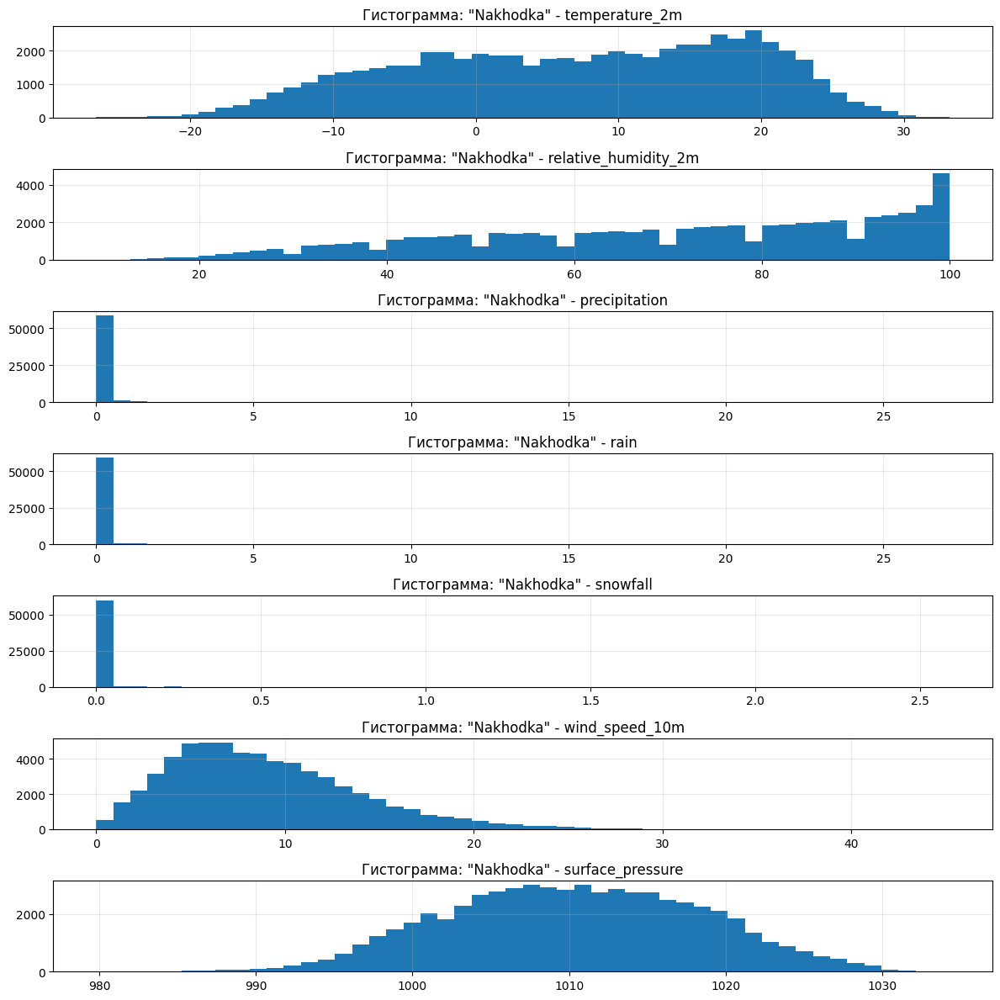

Построение Q-Q plot...


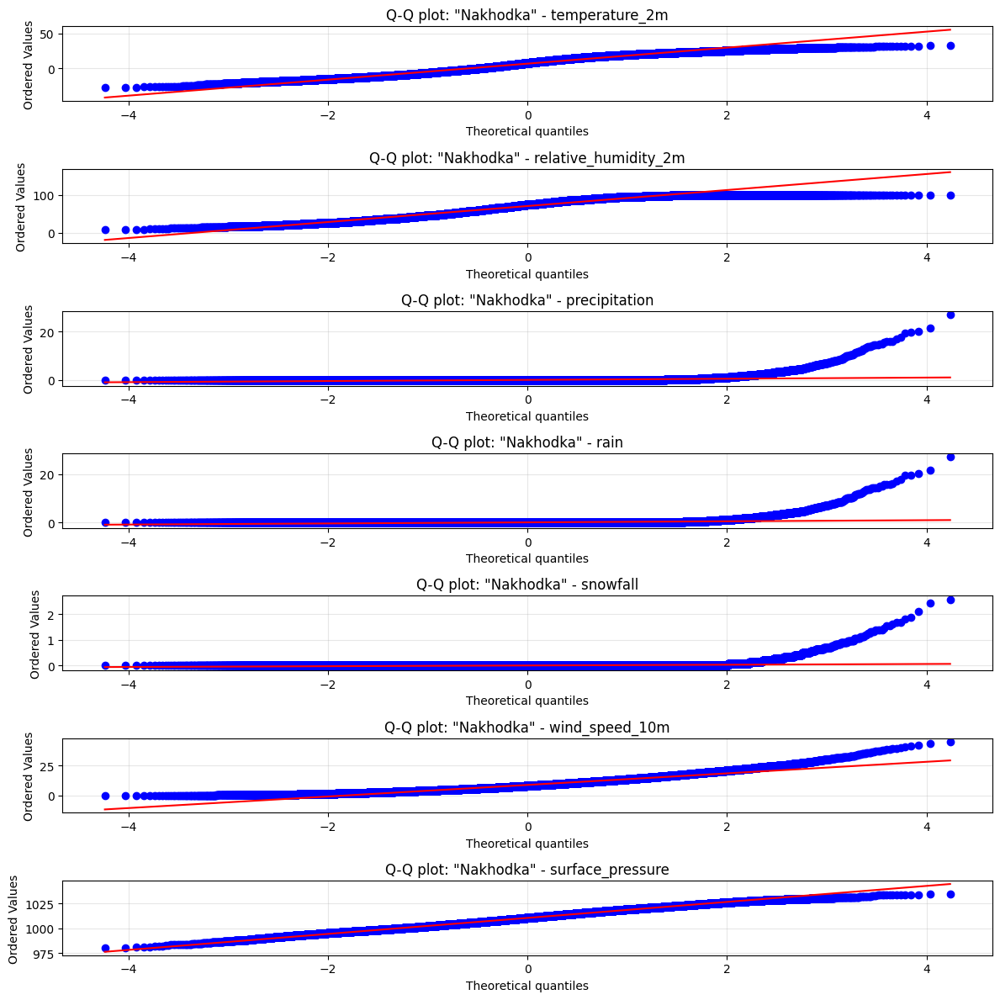

---- Анализ распределений для Moscow ----
Построение гистограмм...


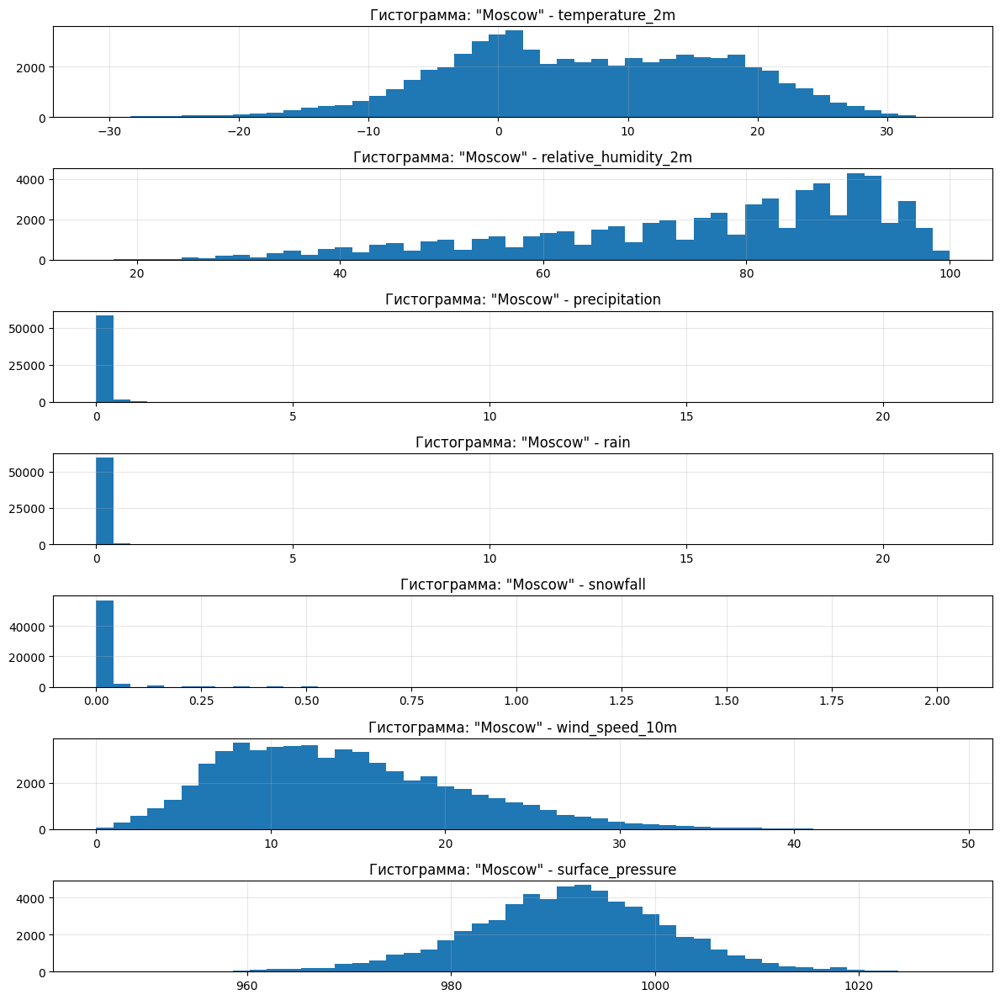

Построение Q-Q plot...


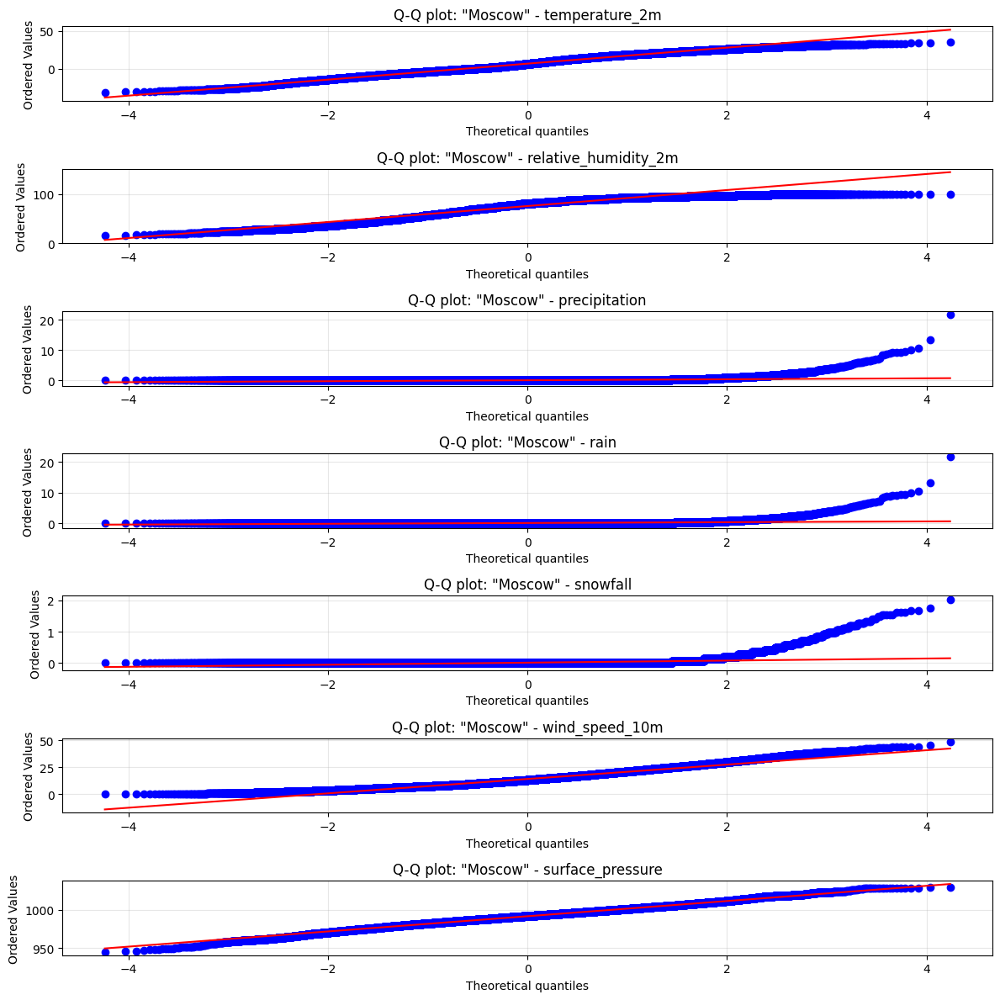

---- Анализ распределений для Blagoveshchensk ----
Построение гистограмм...


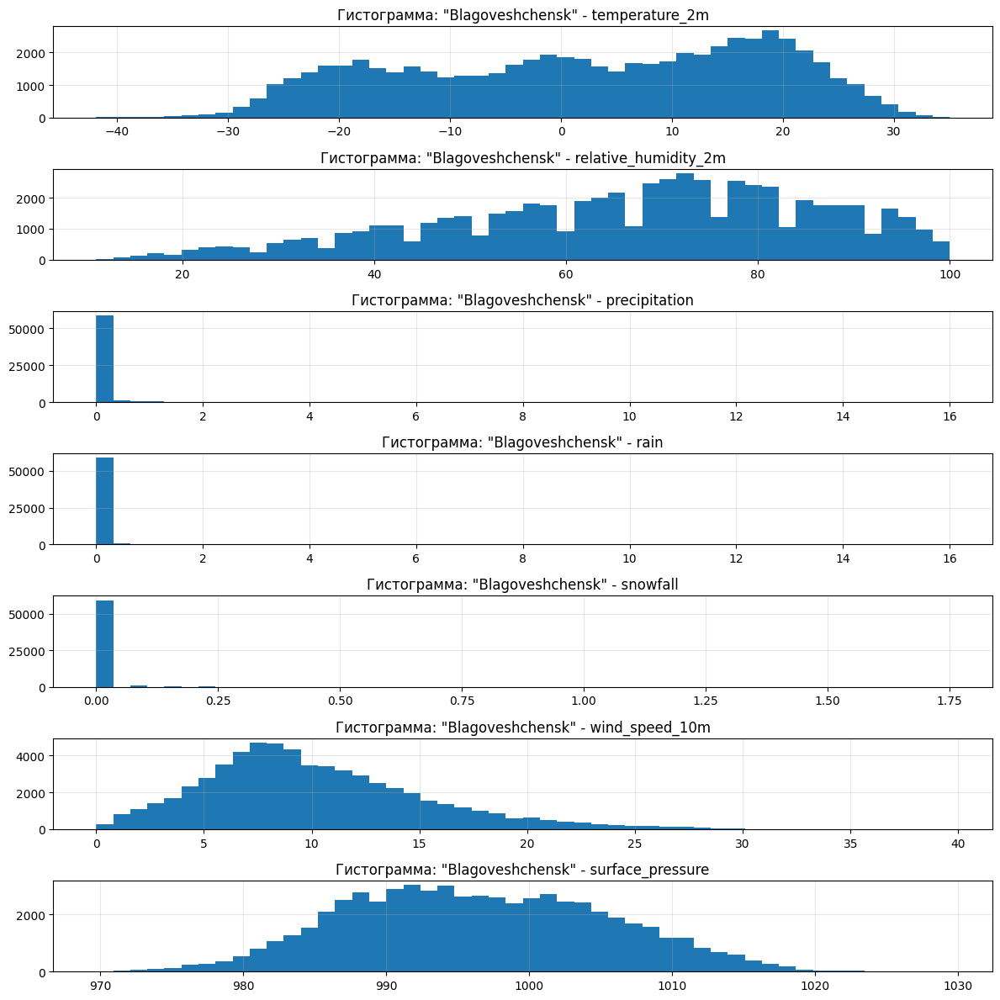

Построение Q-Q plot...


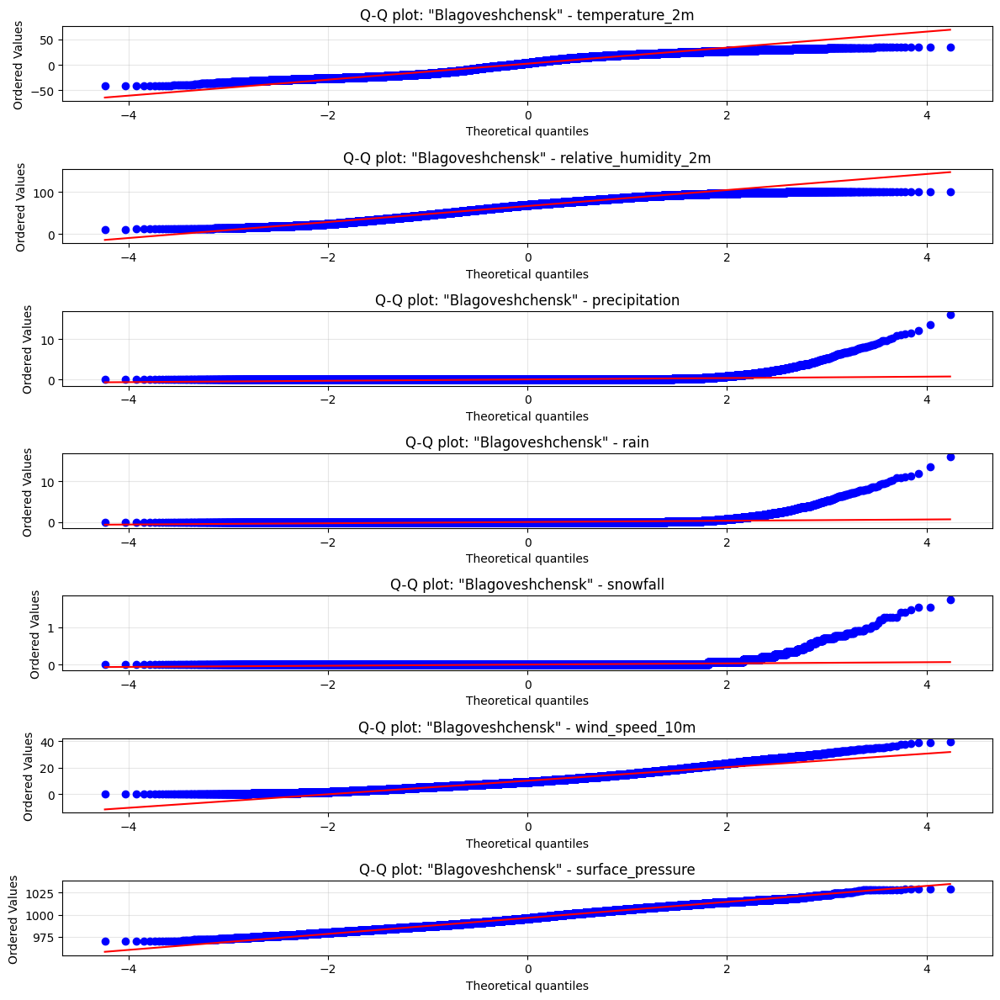

---- Анализ распределений для Saint-Petersburg ----
Построение гистограмм...


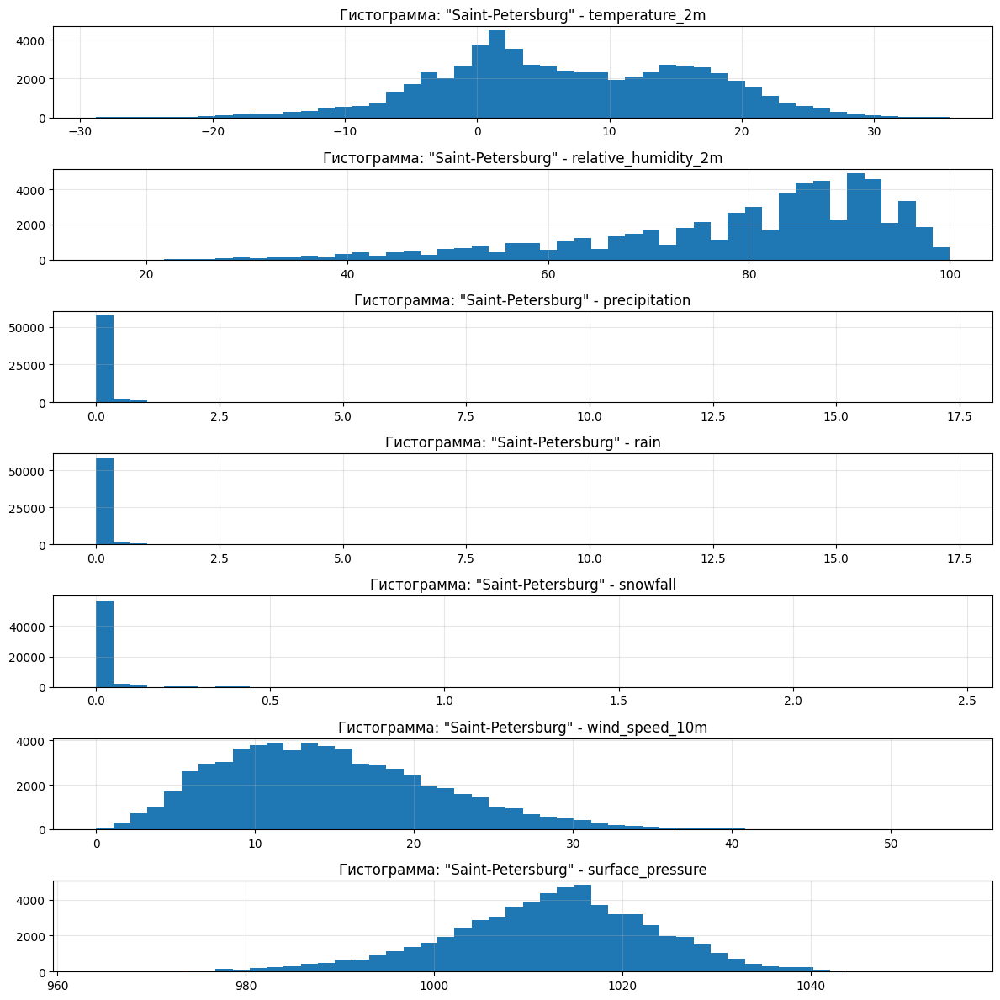

Построение Q-Q plot...


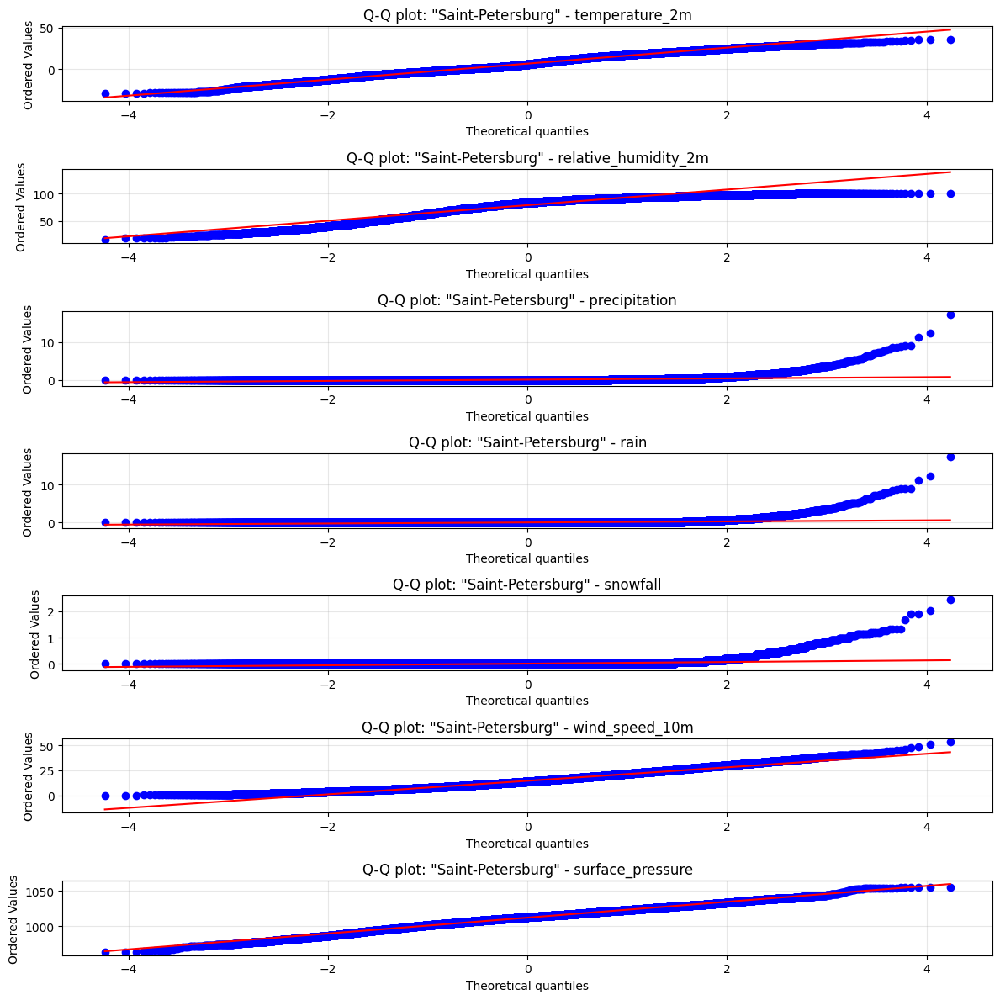

---- Анализ распределений для Sochi ----
Построение гистограмм...


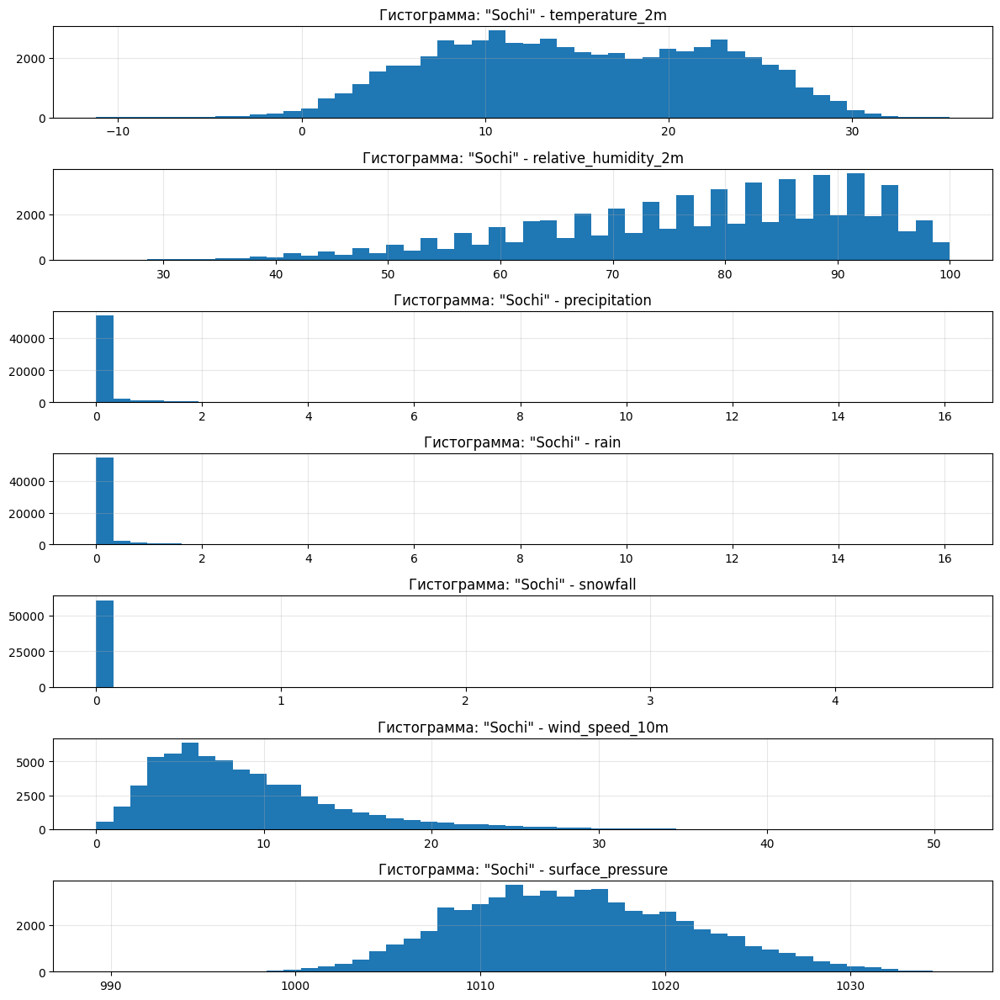

Построение Q-Q plot...


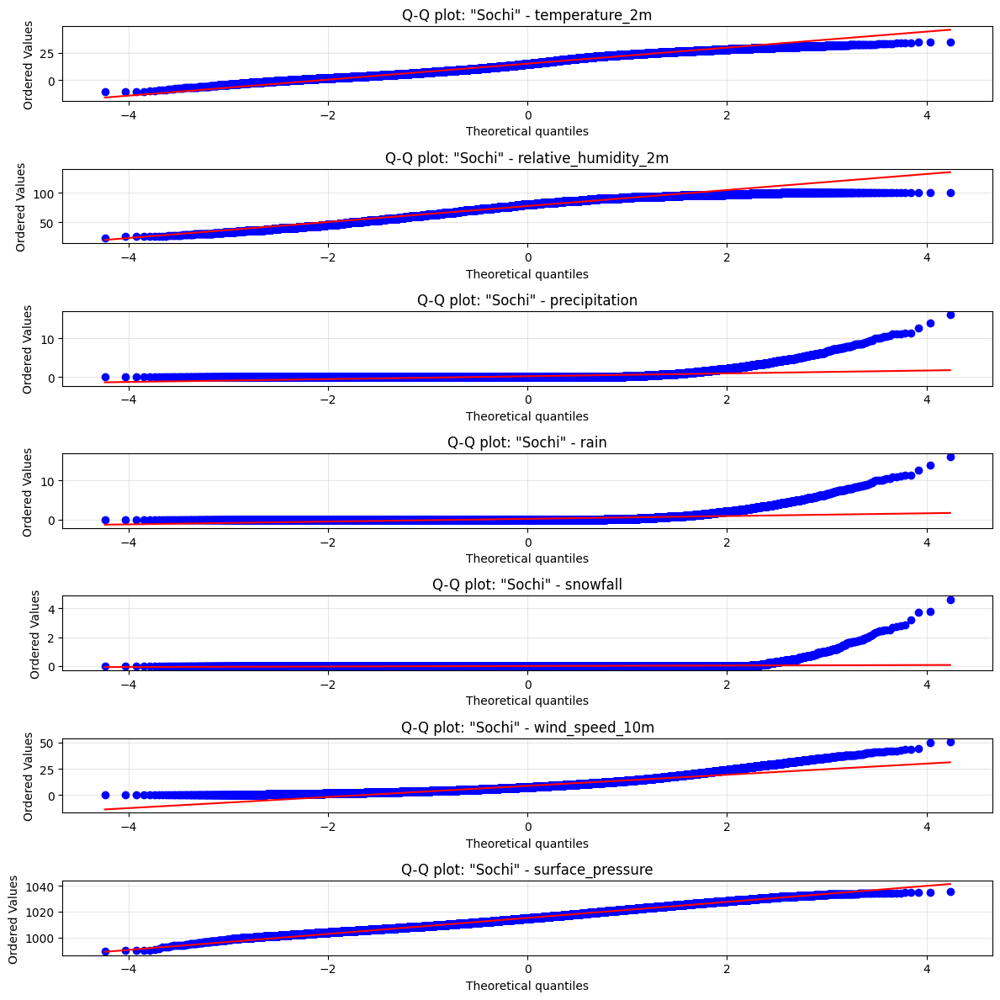

---- Анализ распределений для Gelendzhik ----
Построение гистограмм...


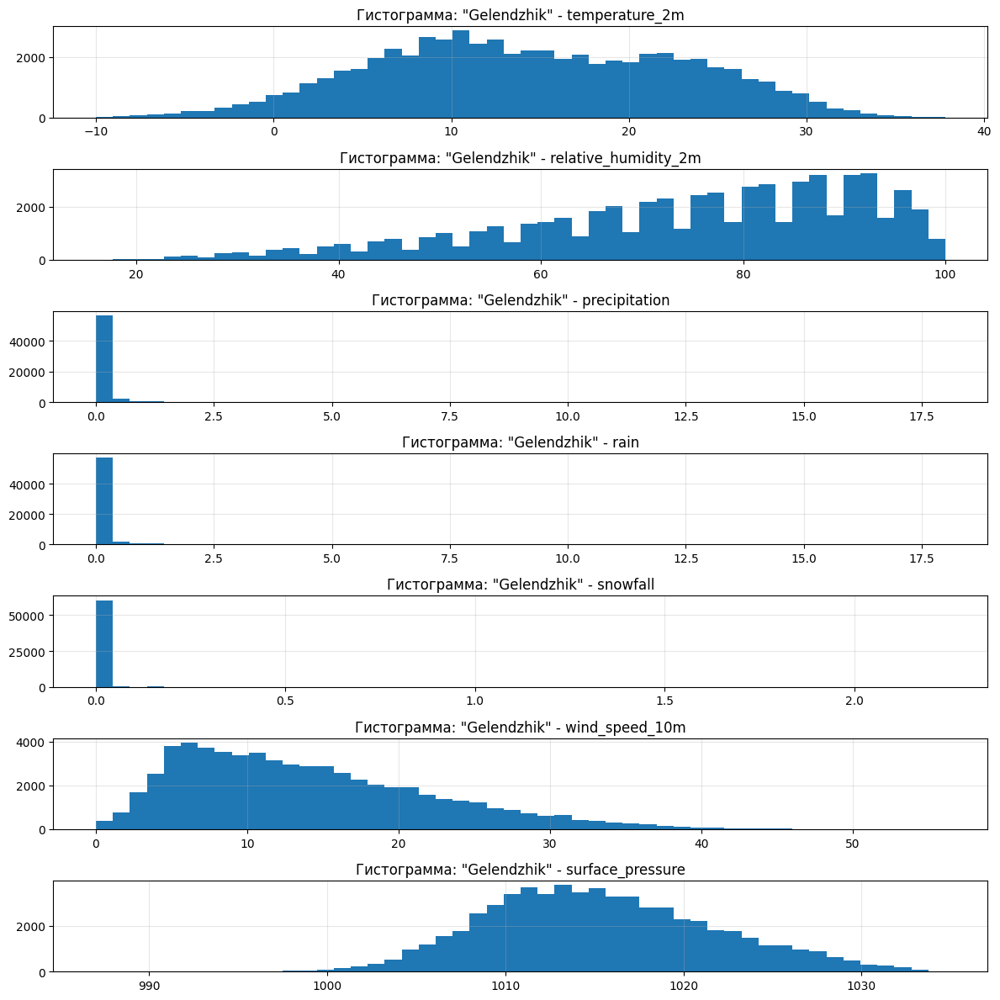

Построение Q-Q plot...


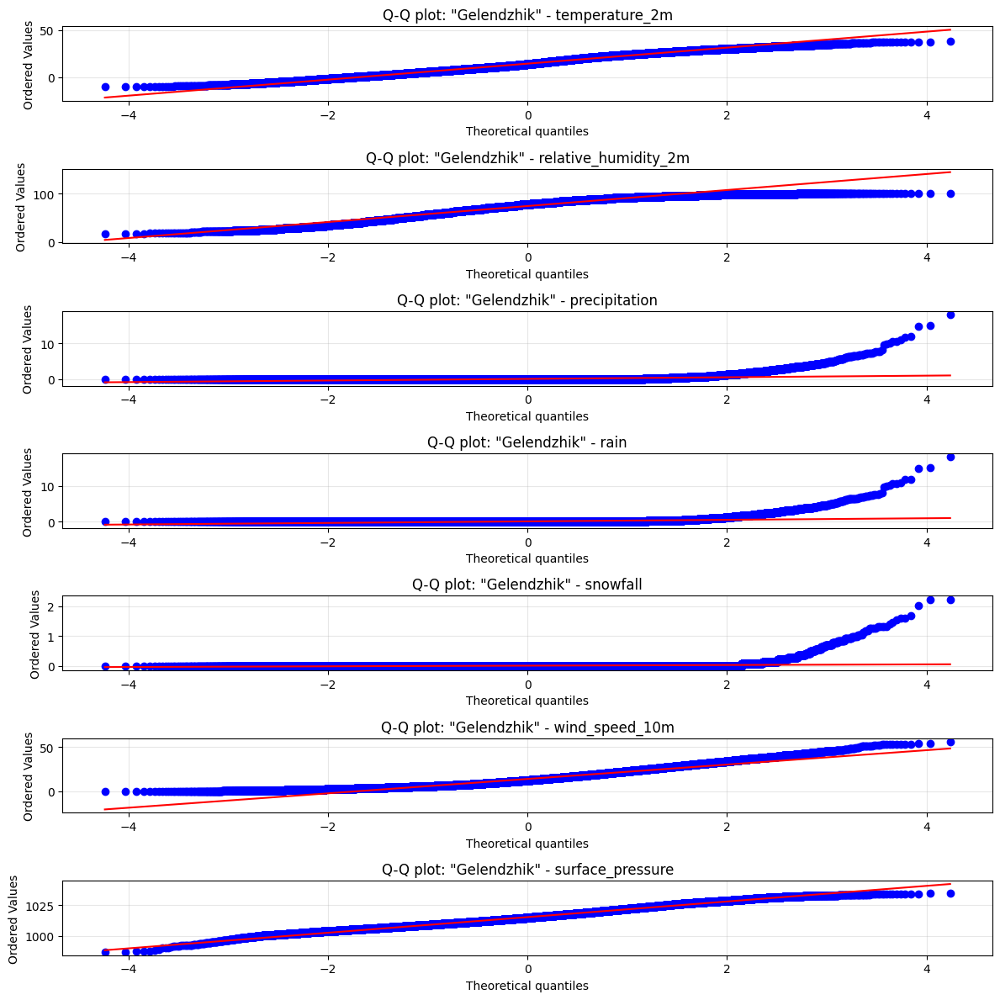

In [20]:
# Исследовать распределение каждого признака (гистограммы, box-plot, Q-Q plot для проверки нормальности)
def norm_check(df: pd.DataFrame, df_name: str) -> None:
    """ 
        Исследование распределения каждого признака:
            - Гистограммы;
            - box-plot;
            - Q-Q plot
    """

    print(f"---- Анализ распределений для {df_name} ----")
    figsize_x, figsize_y = 12, 12

    cols = ['temperature_2m', 'relative_humidity_2m', 'precipitation', 
            'rain', 'snowfall', 'wind_speed_10m', 'surface_pressure']

    # гистограммы
    print("Построение гистограмм...")
    fig, axes = plt.subplots(len(cols), 1, figsize=(figsize_x, figsize_y))

    for i in range(len(cols)):
        axes[i].hist(df[cols[i]].dropna(), bins=50)
        axes[i].set_title(f'Гистограмма: "{df_name}" - {cols[i]}')
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Q-Q plot
    print("Построение Q-Q plot...")
    fig, axes = plt.subplots(len(cols), 1, figsize=(figsize_x, figsize_y))

    for i in range(len(cols)):
        stats.probplot(df[cols[i]].dropna(), dist="norm", plot=axes[i])
        axes[i].set_title(f'Q-Q plot: "{df_name}" - {cols[i]}')
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

for sub_df, df_name in zip(dfs, CITIES_LIST):
    norm_check(df=sub_df, df_name=df_name)

- temperature_2m — распределение близко к нормальному во всех городах, гистограмма имеет колоколообразную форму, Q-Q plot почти совпадает с прямой. Исключение — хвосты слегка отклоняются, что связано с сезонностью.

- relative_humidity_2m — распределение скошено влево, основная масса значений сосредоточена в диапазоне 70–100%. Q-Q plot показывает заметное отклонение от нормальности в левом хвосте.

- precipitation и rain — сильно правосторонний скос во всех городах без исключения: большинство часов осадков нет совсем, а редкие интенсивные события формируют длинный правый хвост. Q-Q plot резко уходит вверх — распределение явно не нормальное.

- snowfall — аналогично осадкам, только ещё более выражено: почти все значения равны нулю. Нормальным не является ни в одном городе.

- wind_speed_10m — распределение похоже на нормальное или слегка правосторонее, Q-Q plot в целом близок к прямой, но правый хвост немного задирается из-за редких сильных порывов.

- surface_pressure — наиболее близко к нормальному из всех признаков, гистограмма симметричная, Q-Q plot практически идеально ложится на прямую во всех городах.

---- Анализ сезонных паттернов для Nakhodka ----
Построение паттернов по месяцам...


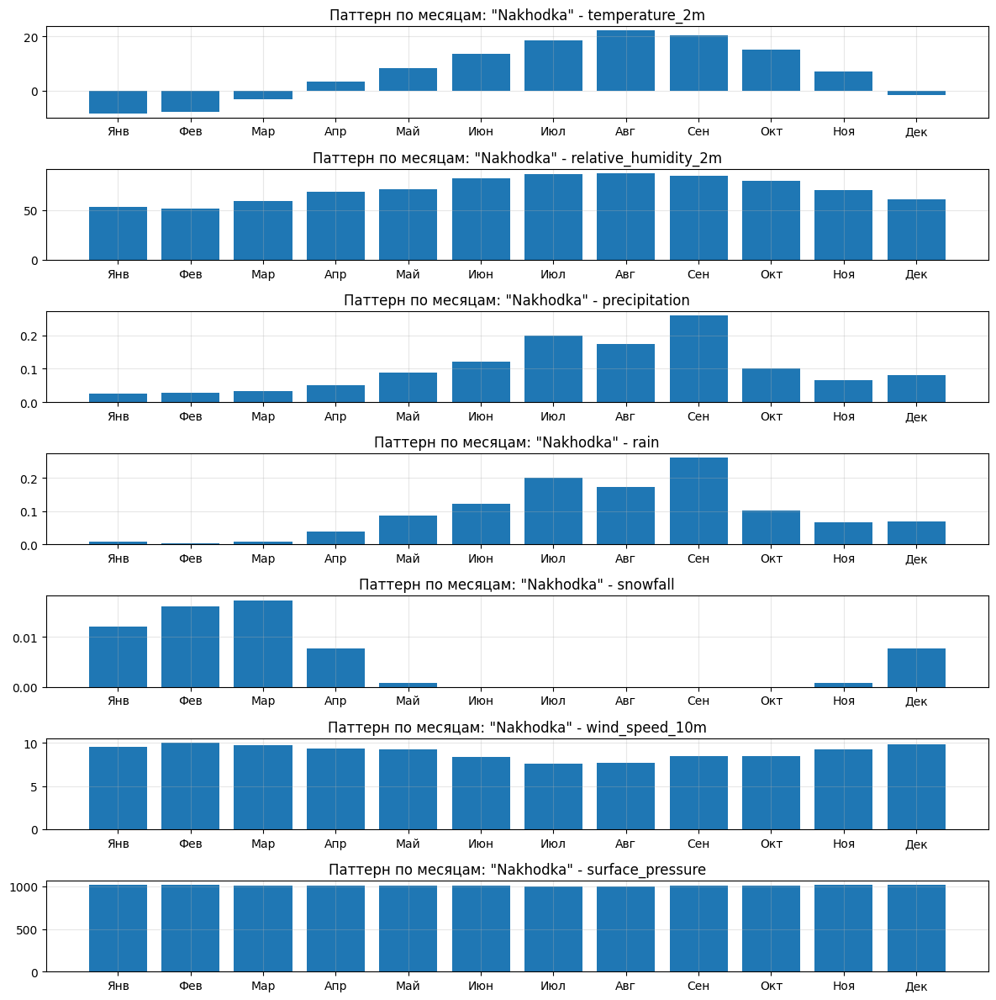

Построение паттернов по временам года...


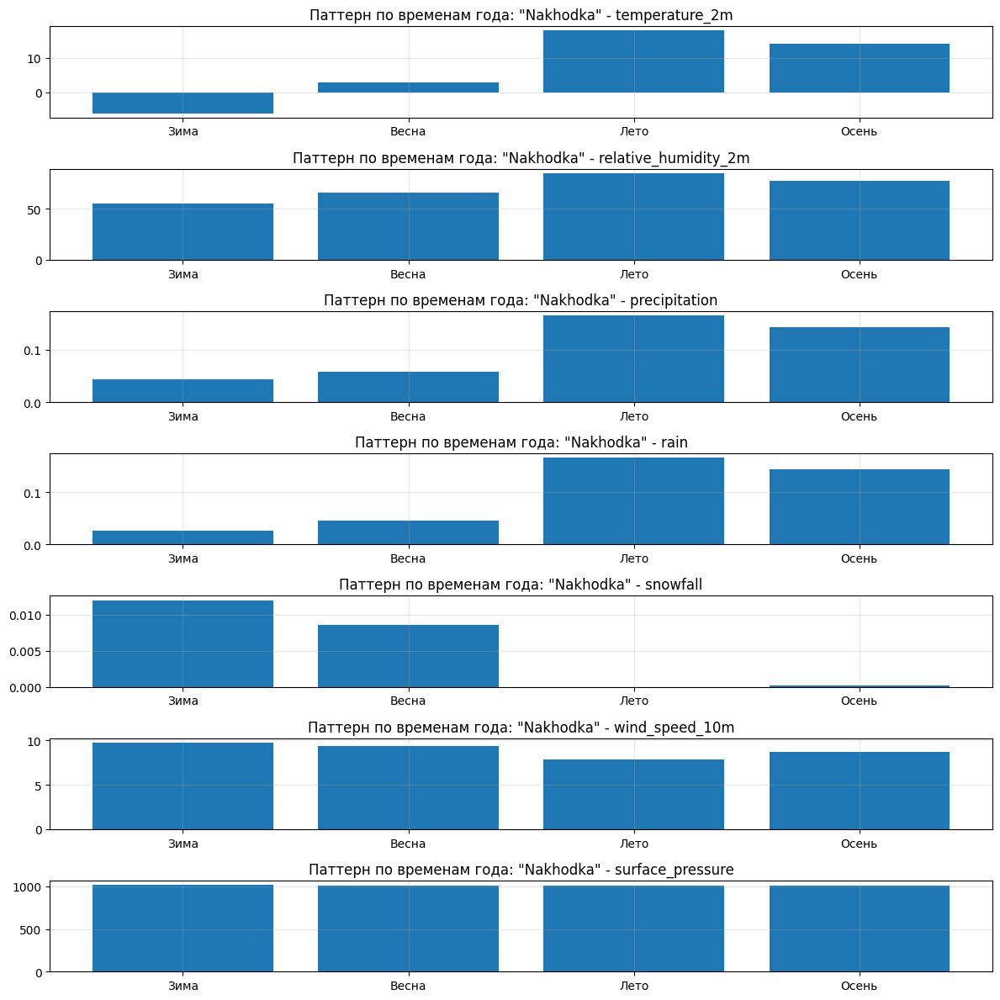

---- Анализ сезонных паттернов для Moscow ----
Построение паттернов по месяцам...


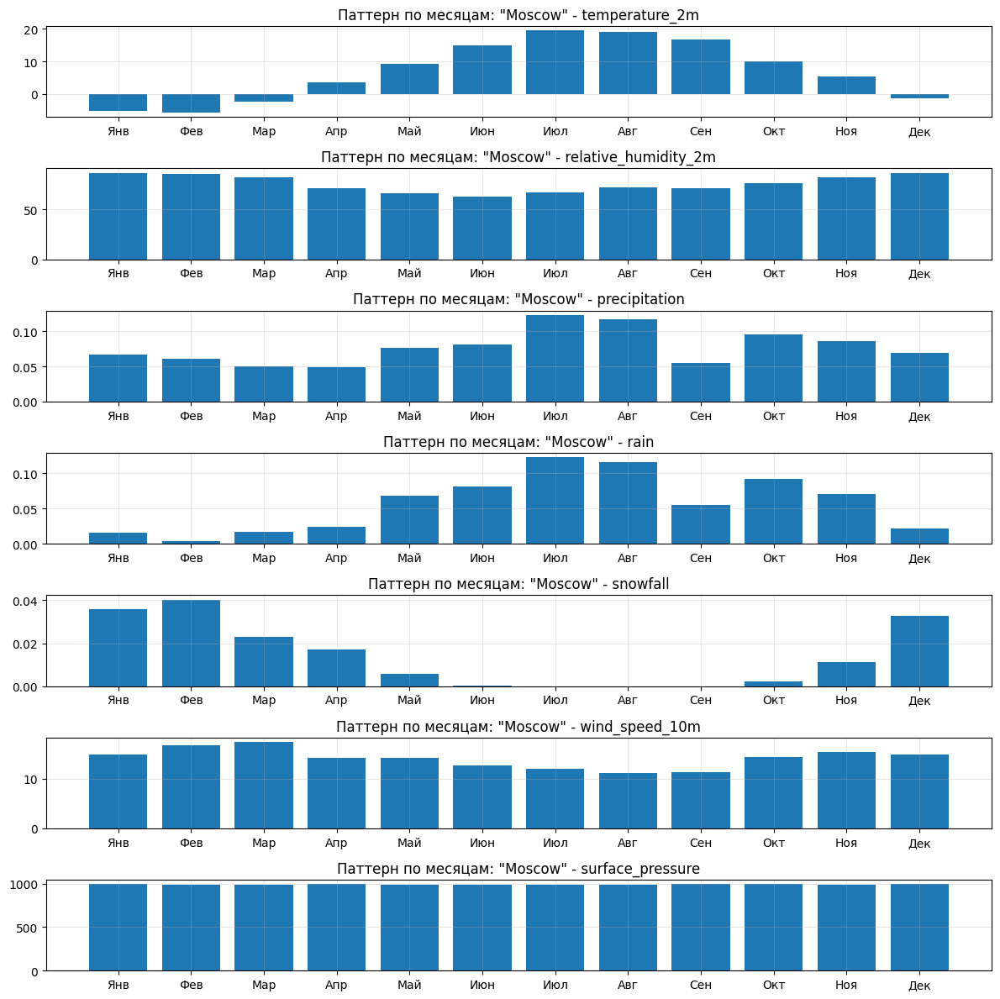

Построение паттернов по временам года...


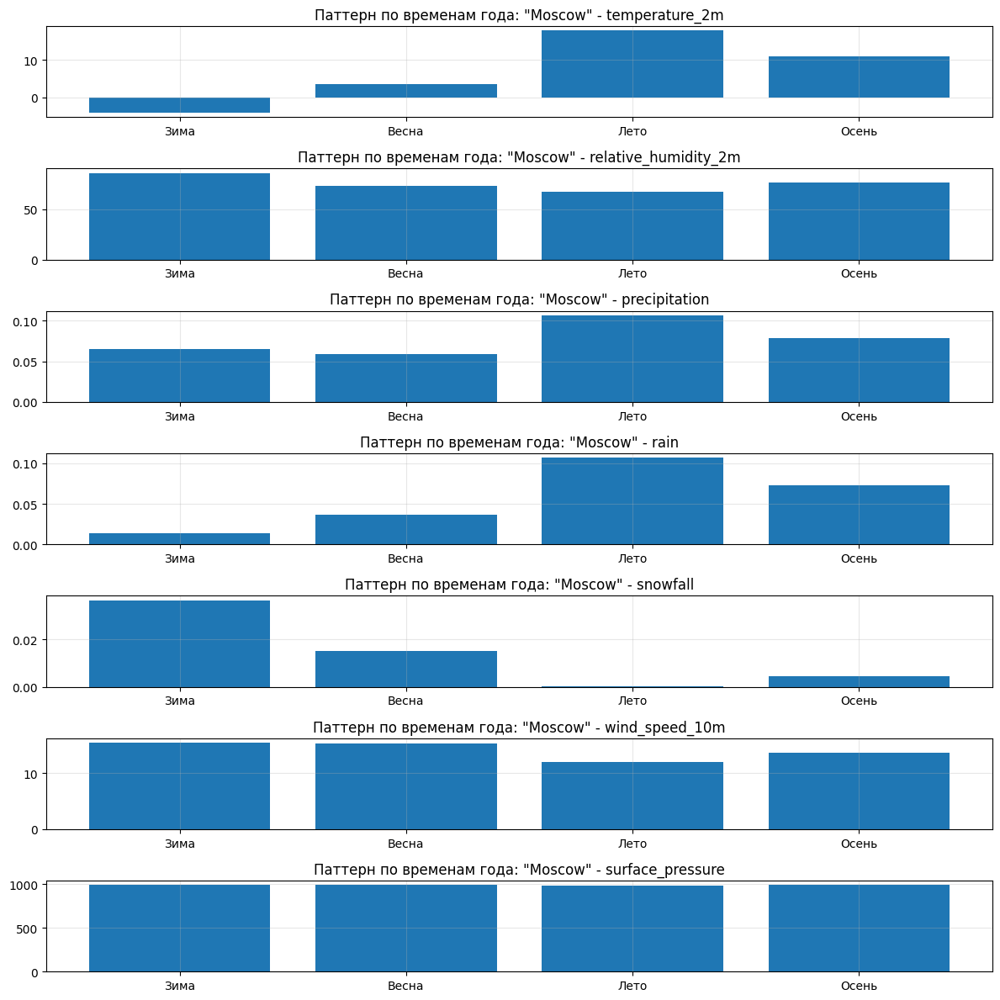

---- Анализ сезонных паттернов для Blagoveshchensk ----
Построение паттернов по месяцам...


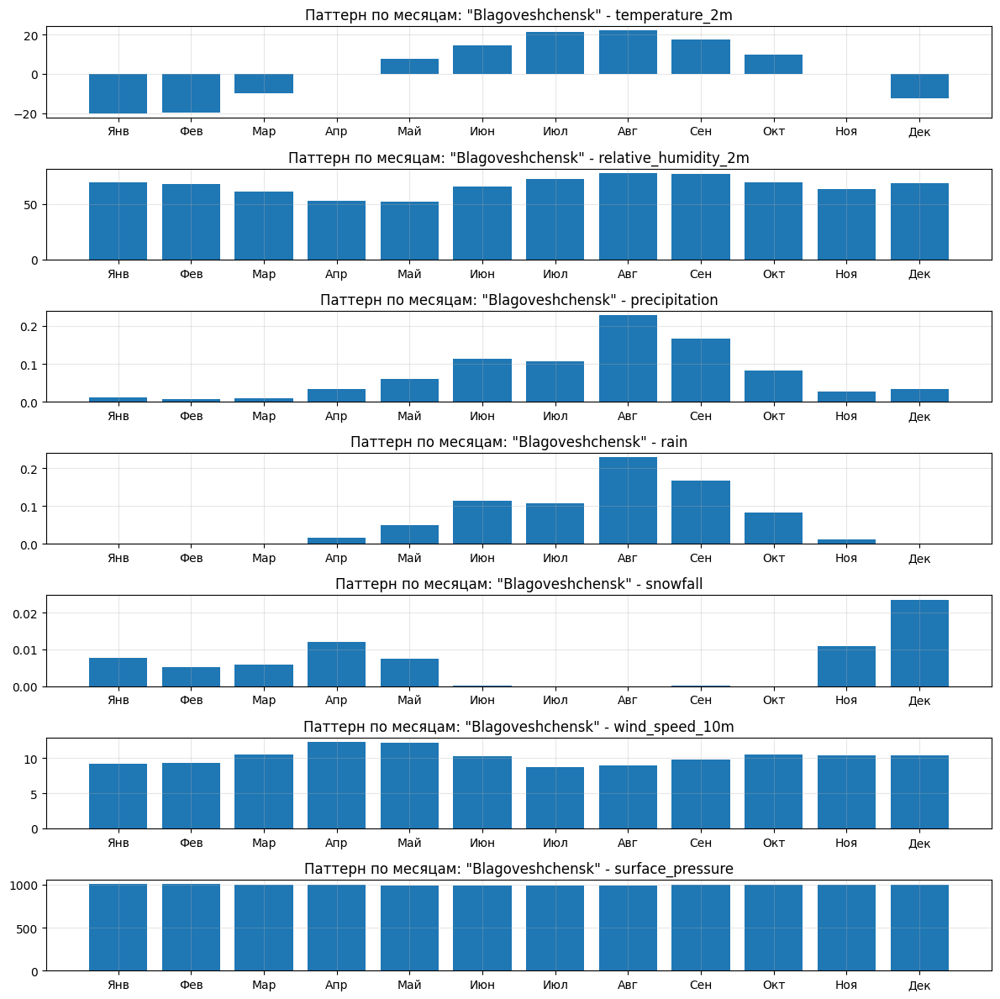

Построение паттернов по временам года...


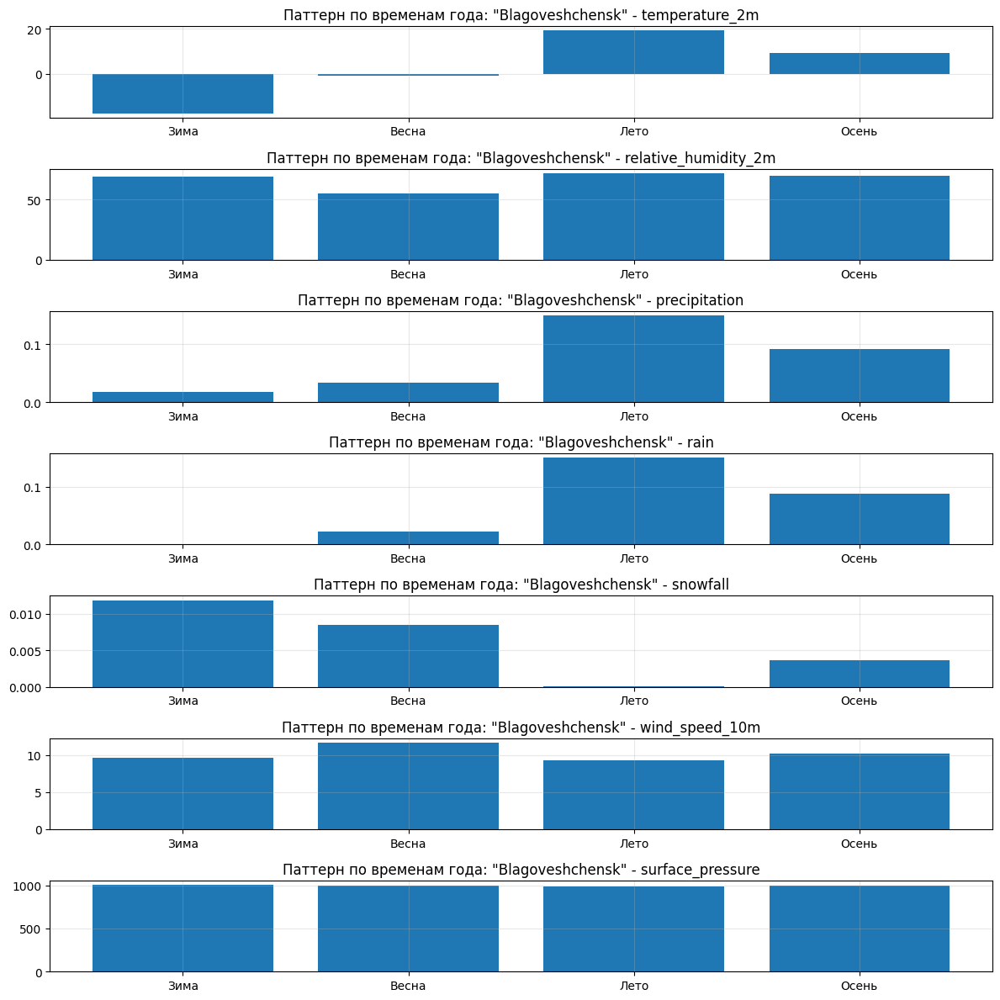

---- Анализ сезонных паттернов для Saint-Petersburg ----
Построение паттернов по месяцам...


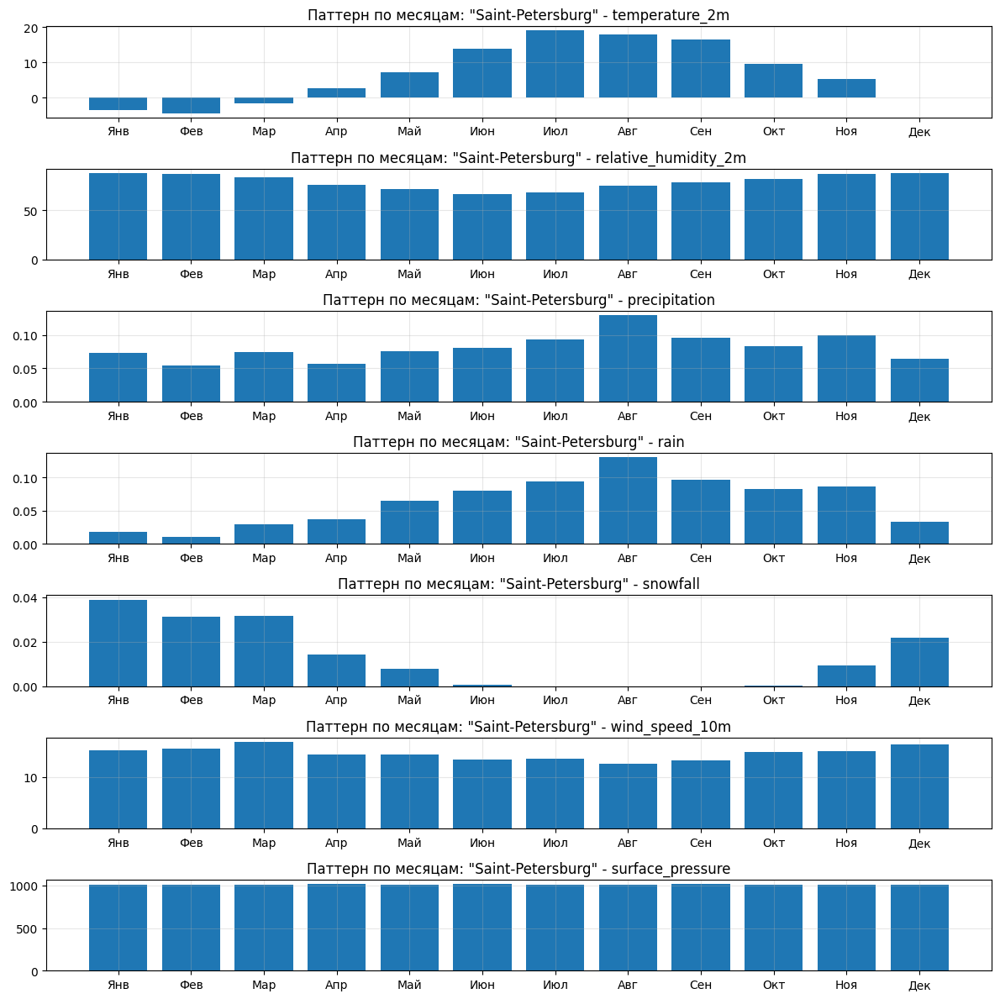

Построение паттернов по временам года...


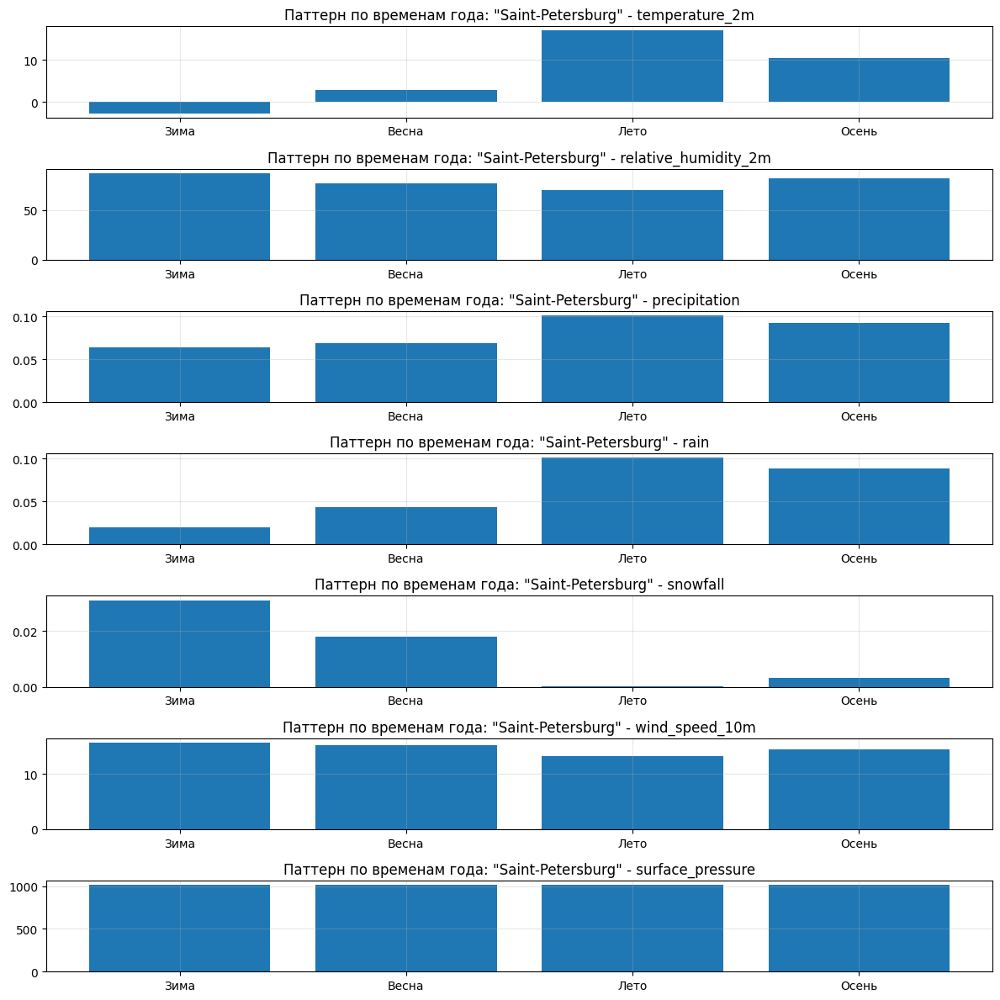

---- Анализ сезонных паттернов для Sochi ----
Построение паттернов по месяцам...


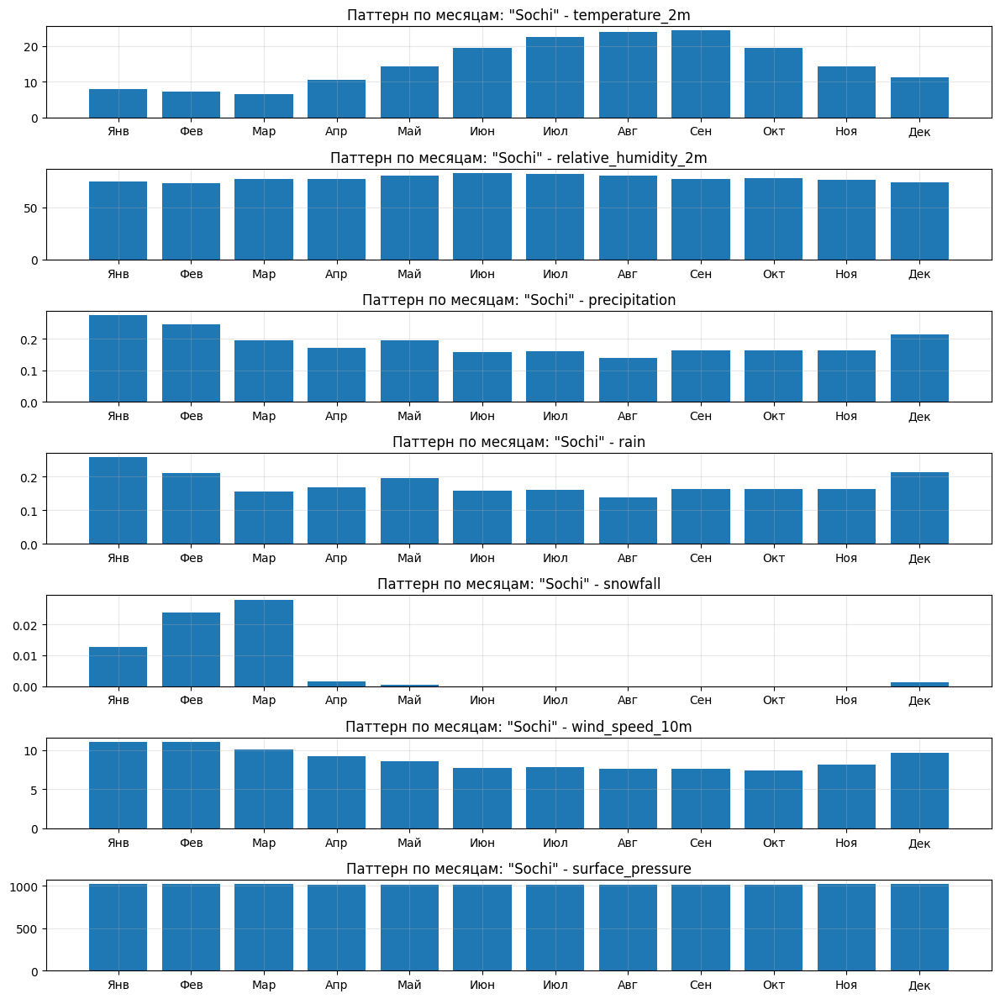

Построение паттернов по временам года...


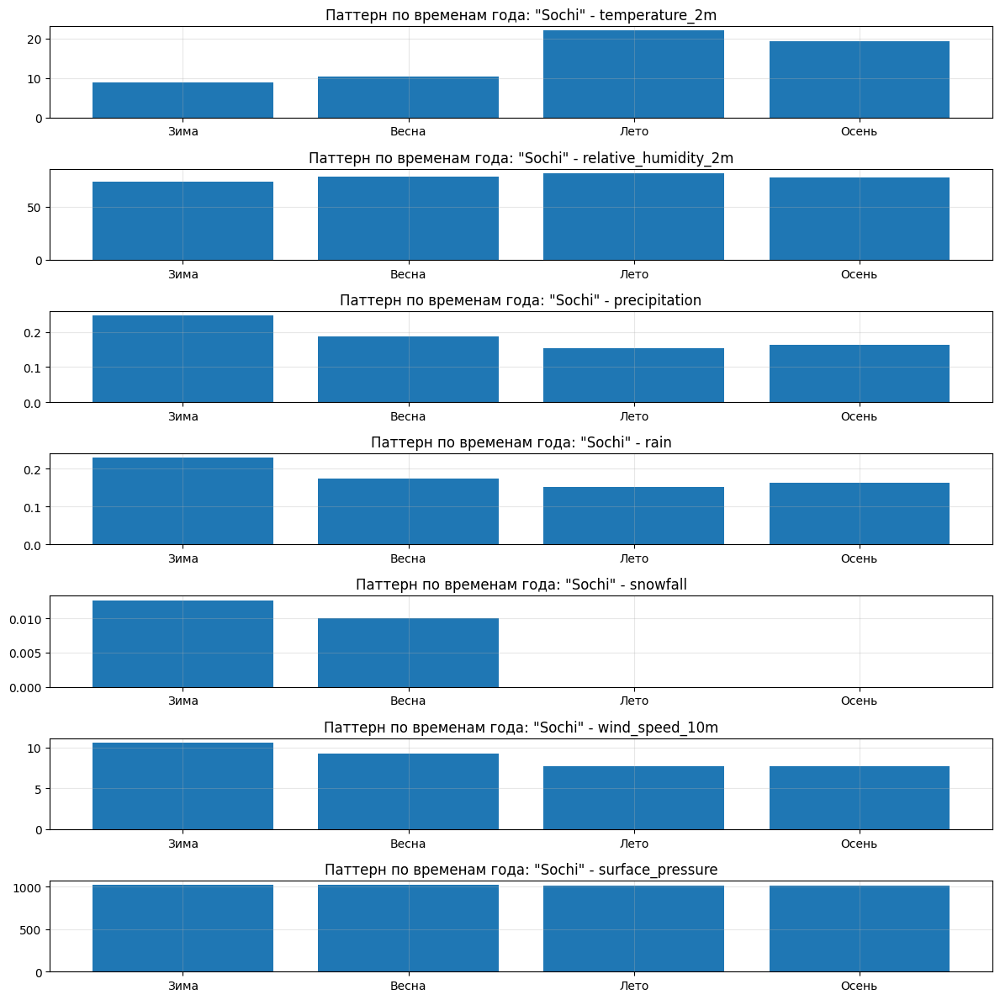

---- Анализ сезонных паттернов для Gelendzhik ----
Построение паттернов по месяцам...


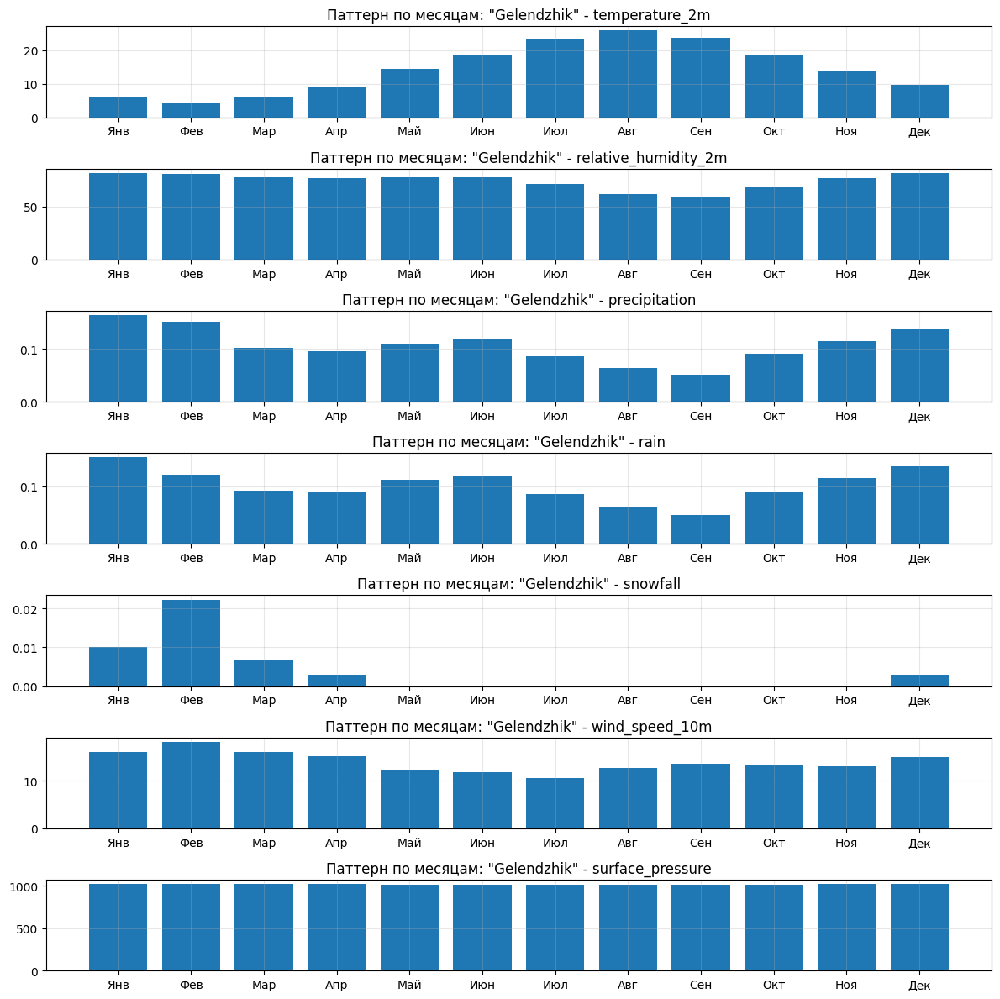

Построение паттернов по временам года...


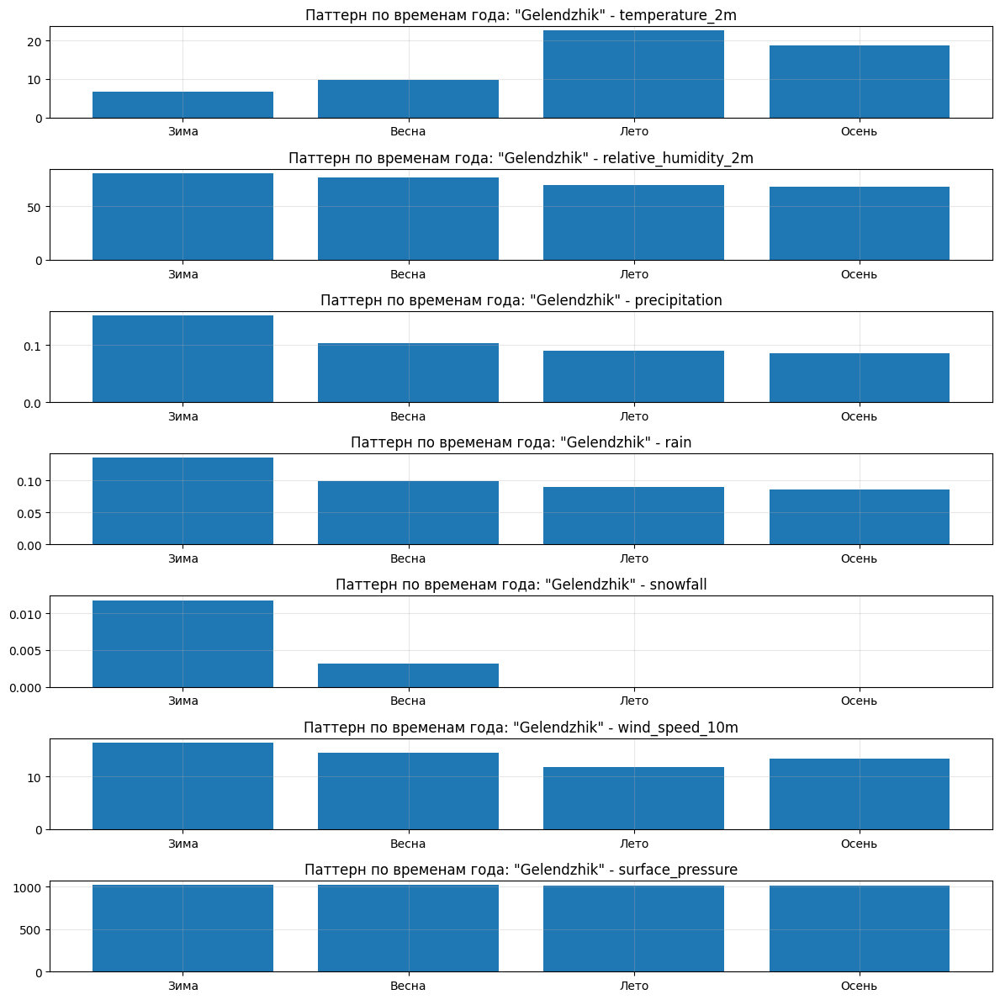

In [21]:
# Выявить и визуализировать сезонные паттерны (по месяцам, по временам года)
def season_analyze(df: pd.DataFrame, df_name: str) -> None:
    """
        Визуализация сезонных паттернов:
            - по месяцам;
            - по временам года
    """
    print(f"---- Анализ сезонных паттернов для {df_name} ----")
    figsize_x, figsize_y = 12, 12

    cols = ['temperature_2m', 'relative_humidity_2m', 'precipitation',
            'rain', 'snowfall', 'wind_speed_10m', 'surface_pressure']

    # по месяцам
    print("Построение паттернов по месяцам...")

    month_num = (df.index // 720) % 12
    monthly_avg = df.groupby(month_num)[cols].mean()
    monthly_avg.index = ['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн',
                         'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']

    fig, axes = plt.subplots(len(cols), 1, figsize=(figsize_x, figsize_y))

    for i in range(len(cols)):
        axes[i].bar(monthly_avg.index, monthly_avg[cols[i]])
        axes[i].set_title(f'Паттерн по месяцам: "{df_name}" - {cols[i]}')
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # по временам года
    print("Построение паттернов по временам года...")

    season_map = {12: 'Зима', 1: 'Зима', 2: 'Зима',
                  3: 'Весна', 4: 'Весна', 5: 'Весна',
                  6: 'Лето', 7: 'Лето', 8: 'Лето',
                  9: 'Осень', 10: 'Осень', 11: 'Осень'}

    month_idx = (df.index // 720) % 12 + 1
    seasons = month_idx.map(season_map)
    season_order = ['Зима', 'Весна', 'Лето', 'Осень']
    seasonal_avg = df.groupby(seasons)[cols].mean().reindex(season_order)

    fig, axes = plt.subplots(len(cols), 1, figsize=(figsize_x, figsize_y))

    for i in range(len(cols)):
        axes[i].bar(seasonal_avg.index, seasonal_avg[cols[i]])
        axes[i].set_title(f'Паттерн по временам года: "{df_name}" - {cols[i]}')
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

for sub_df, df_name in zip(dfs, CITIES_LIST):
    season_analyze(df=sub_df, df_name=df_name)

- Температура — самый информативный признак, чёткая сезонность везде. Города делятся на два кластера: южные (Сочи, Геленджик — зима >5°) и континентальные/северные (Москва, СПб, Находка, Благовещенск — зима <0°, Благовещенск до -10°).

- Осадки (precipitation, rain) — Сочи и Геленджик уникальны: осадки равномерны весь год. У остальных пик летом. Находка выделяется максимумом в сентябре.

- Снег (snowfall) — логично коррелирует с температурой: у южных городов почти 0, у северных — выраженный зимний пик. СПб и Москва лидируют по снегу.

- Влажность (relative_humidity) — слабая сезонность, различия между городами минимальны (~50-70% везде). Слабый признак.

- Скорость ветра (wind_speed) — почти без сезонности ни в одном городе. Слабый признак. surface_pressure — нет вариации вообще. Можно удалить из модели.

In [22]:
df.columns

Index(['temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain',
       'snowfall', 'weathercode', 'wind_speed_10m', 'surface_pressure'],
      dtype='object')

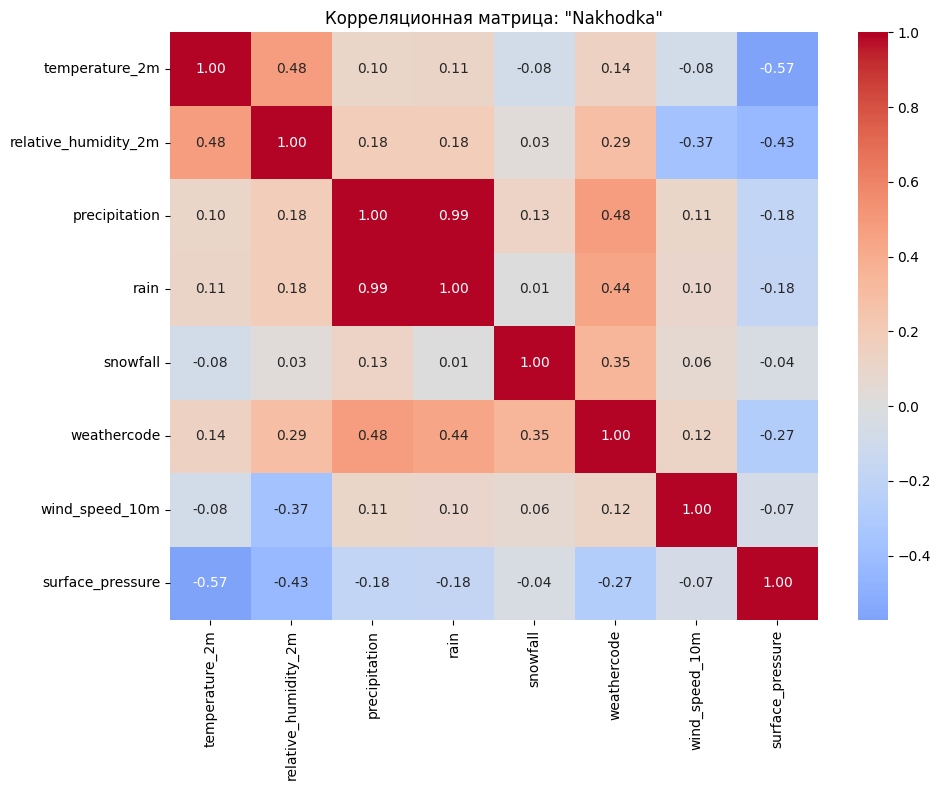

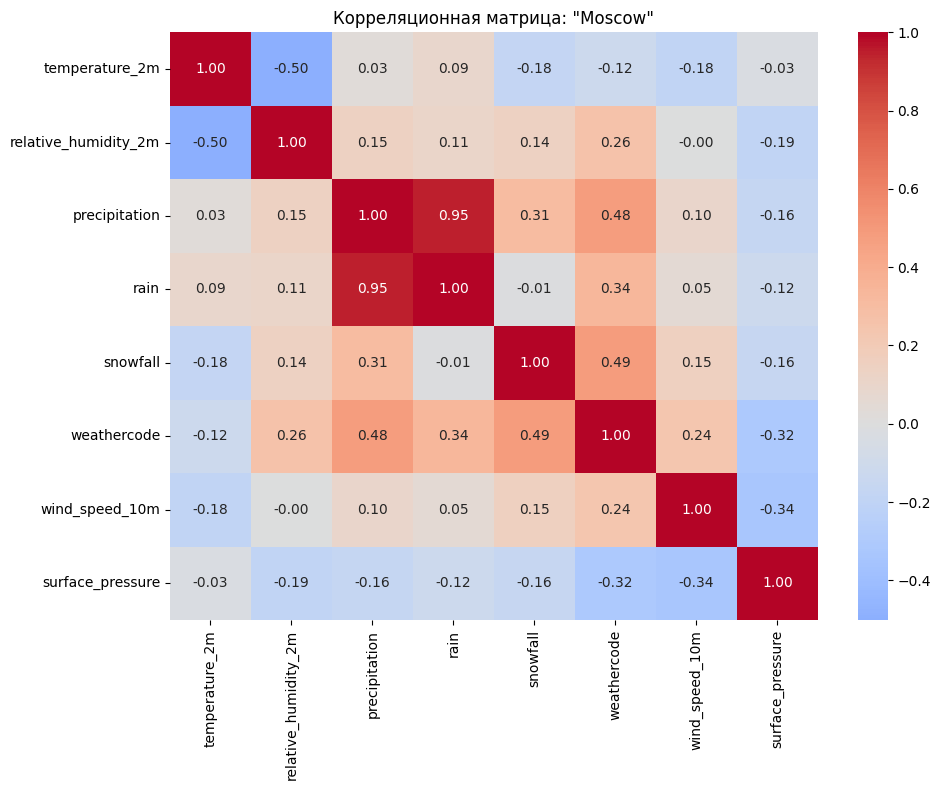

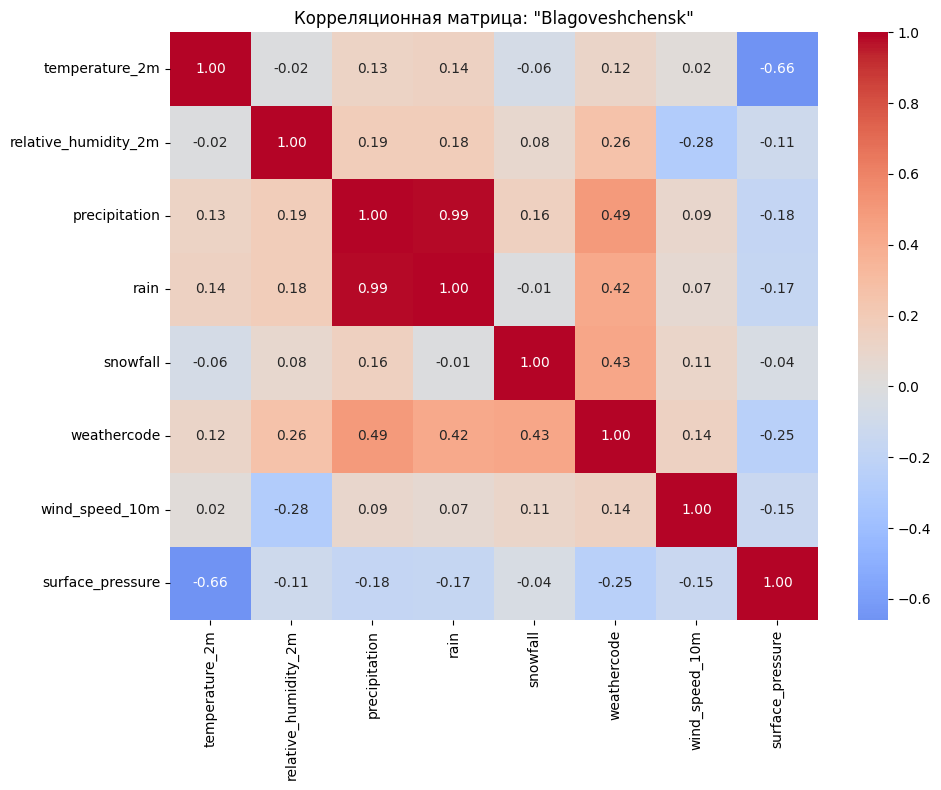

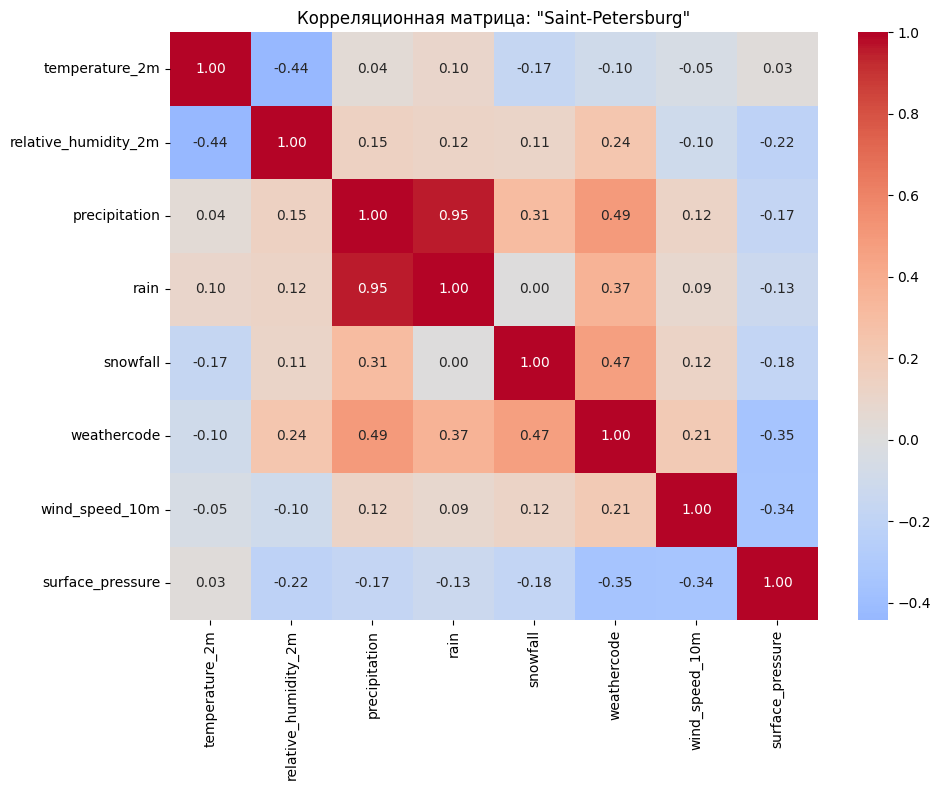

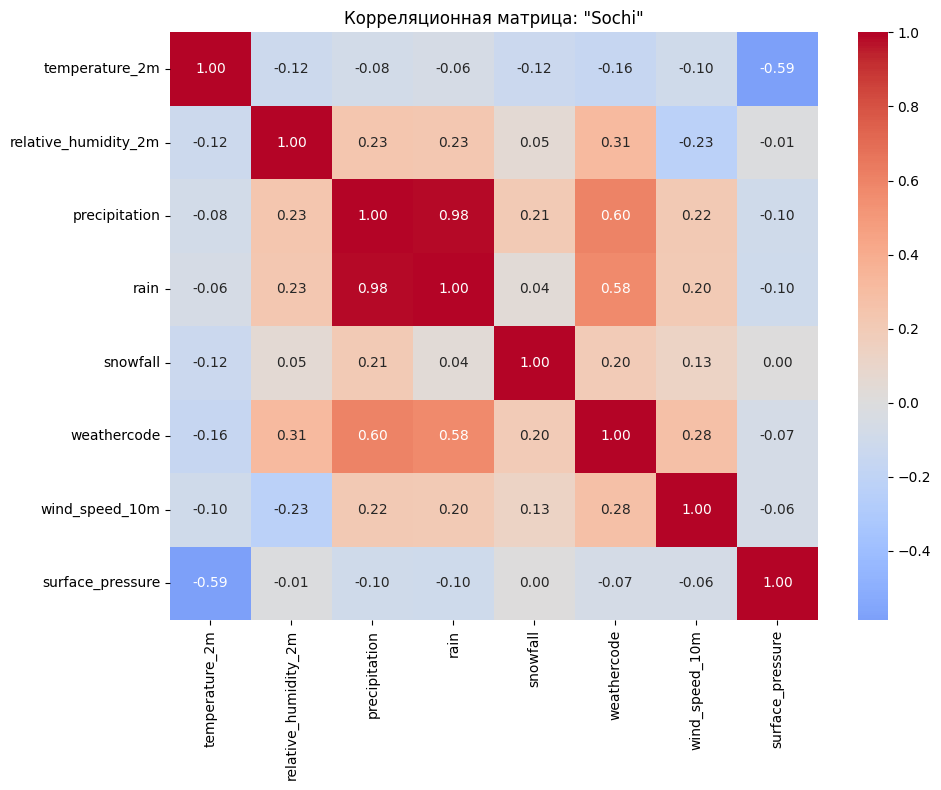

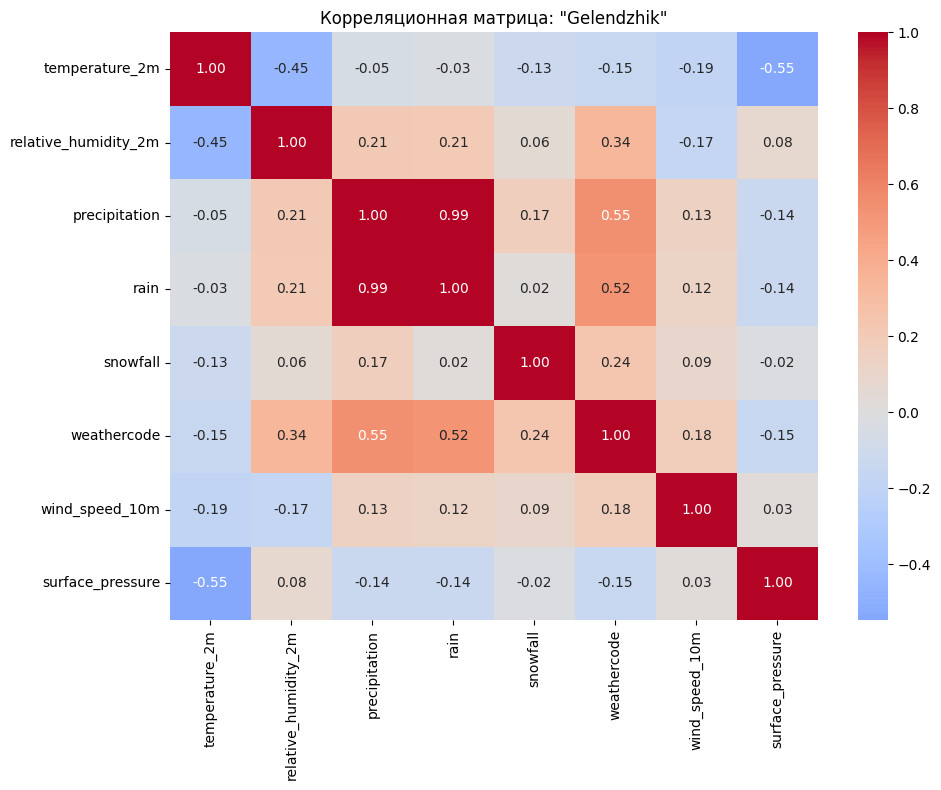

In [23]:
# Проанализировать корреляции между всеми признаками (тепловая карта корреляционной матрицы)
def plot_correlation(df: pd.DataFrame, df_name: str) -> None:
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        df.corr(),
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0
    )
    plt.title(f'Корреляционная матрица: "{df_name}"')
    plt.tight_layout()
    plt.show()

for df, name in zip(dfs, CITIES_LIST):
    plot_correlation(df, name)

По всем городам картина примерно одинаковая. Precipitation и rain — это по сути одно и то же, их корреляция почти 1. Температура и давление связаны отрицательно — когда тепло, давление обычно ниже, и наоборот (кроме СПБ и МСК). Температура и влажность обратно связаны в Геленджике, в СПБ и в Москве, в Находке прямая. Weathercode ожидаемо растёт вместе с осадками — чем хуже погода, тем больше дождя и снега. Ветер почти ни с чем не коррелирует.

**Кросс-городской анализ**

Сравнить распределения температуры и осадков между городами:
- Находка: распределение похоже на нормальное с пиком в авгусет, с ростом температру растет и кол-во осадков.
- Москва: распределение температуры в МСК похоже на распределение в Находке, однако кол-во осадков в Москве в целом больше.
- Благовещинск: температруа плюс-минус похожа на два предыдущих города, однако тепло в город приходит позже на месяц, а холод наступает раньше на месяц.
- Санкт-Петербург: распределение в Санкт-Петербурге в целом выглядит похоже на распределение в Москве.
- Сочи: согласно распределению, температура не опускается ниже нуля, а кол-во осадков там наибольшее, что логично, учитывая теплый климат и расположение.
- Геленджик: обстановка с погодой в Геленджике похожа на Сочи, города расположены очень близко друг к другу.

---- Построение климатических профилей городов ----
Построение среднемесячных температур...


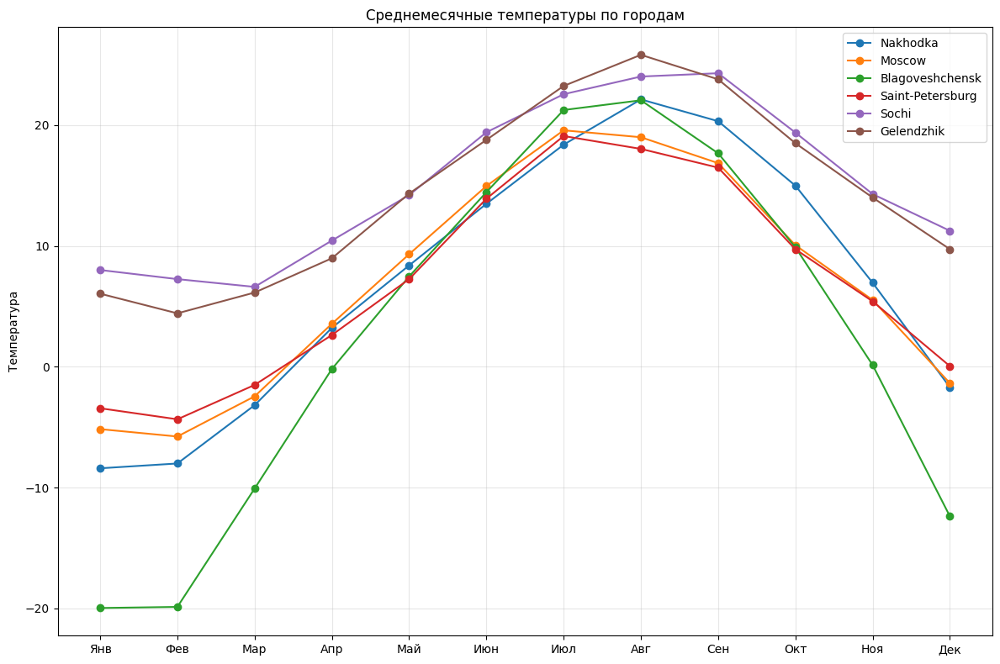

Построение среднегодовых осадков...


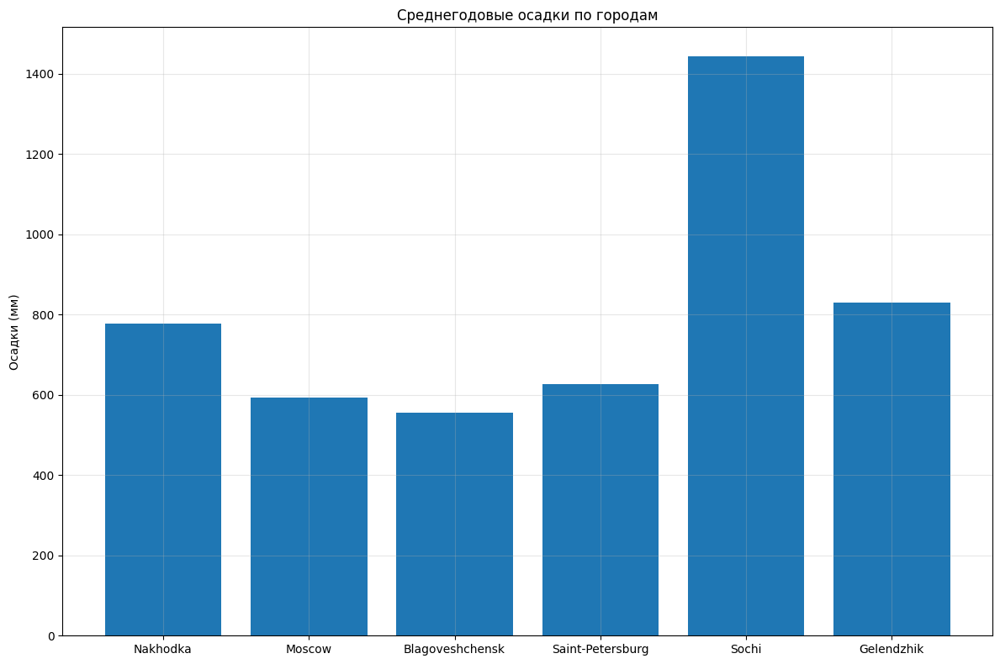

In [24]:
# Визуализировать климатические профили городов (среднемесячные температуры, среднегодовые осадки)
def climate_profile(dfs: list, city_names: list) -> None:
    """
        Визуализация климатических профилей городов:
            - среднемесячные температуры;
            - среднегодовые осадки
    """
    print("---- Построение климатических профилей городов ----")
    figsize_x, figsize_y = 12, 8

    month_labels = ['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн',
                    'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']

    # среднемесячные температуры
    print("Построение среднемесячных температур...")

    fig, ax = plt.subplots(figsize=(figsize_x, figsize_y))

    for df, city_name in zip(dfs, city_names):
        month_num = (df.index // 720) % 12
        monthly_temp = df.groupby(month_num)['temperature_2m'].mean()
        ax.plot(month_labels, monthly_temp.values, marker='o', label=city_name)

    ax.set_title('Среднемесячные температуры по городам')
    ax.set_ylabel('Температура')
    ax.legend()
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # среднегодовые осадки
    print("Построение среднегодовых осадков...")

    fig, ax = plt.subplots(figsize=(figsize_x, figsize_y))

    yearly_precip = []
    for df, city_name in zip(dfs, city_names):
        year_num = df.index // 8760
        annual = df.groupby(year_num)['precipitation'].sum().mean()
        yearly_precip.append(annual)

    ax.bar(city_names, yearly_precip)
    ax.set_title('Среднегодовые осадки по городам')
    ax.set_ylabel('Осадки (мм)')
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

climate_profile(dfs=dfs, city_names=CITIES_LIST)

Выявить аномалии и выбросы в межгородском сравнении:
- Находка: выбросы наблюдаются по всем показателям, кроме температуры и влажности вохдуха
- Москва: выбросы наблюдаются по всем показателям
- Благовещинск: ситуация с выбросами аналогична Находке
- Санкт-Петербург: выбросы наблюдаются по всем показателям
- Сочи: выбросы по всем показателям 
- Геленджик: выбросы по всем показателям, кроме температуры
- Наибольшие выбросы по ветру наблюдаются в Сочи, Геленджики, Санкт-Петербурге (достигают до 50)
- По снегу кол-во выбросов примерно однаковое во всех городах
- По дождю выбросы наибольшее значение принимают в Москве и Находке
- Самая низкая температура наблюдается в Благовещенске, самый большой выброс (более -30) в Москве

Провести анализ пропусков: определить характер пропусков, предложить стратегию их обработки:
    
    - Пропуски не были обнаружены 

Анализ стационарности

In [25]:
# Проверить ряды на стационарность (тест Дики-Фуллера)
def check_stationarity(df: pd.DataFrame, df_name: str) -> None:
    """
        Проверка рядов на стационарность:
            - тест Дики-Фуллера
    """
    print(f"---- Тест Дики-Фуллера для {df_name} ----")

    cols = ['temperature_2m', 'relative_humidity_2m', 'precipitation',
            'rain', 'snowfall', 'wind_speed_10m', 'surface_pressure']

    for col in cols:
        res = adfuller(df[col].dropna())
        p_val = res[1]
        is_stat = p_val < 0.05
        print(f"  {col}: p-value = {p_val} -> {'стационарный' if is_stat else 'нестационарный'}")

    print()

for sub_df, df_name in zip(dfs, CITIES_LIST):
    check_stationarity(df=sub_df, df_name=df_name)

---- Тест Дики-Фуллера для Nakhodka ----
  temperature_2m: p-value = 2.2327659227269762e-05 -> стационарный
  relative_humidity_2m: p-value = 3.6894895628748774e-28 -> стационарный
  precipitation: p-value = 0.0 -> стационарный
  rain: p-value = 0.0 -> стационарный
  snowfall: p-value = 0.0 -> стационарный
  wind_speed_10m: p-value = 0.0 -> стационарный
  surface_pressure: p-value = 1.1992983991692254e-25 -> стационарный

---- Тест Дики-Фуллера для Moscow ----
  temperature_2m: p-value = 3.760547840251945e-08 -> стационарный
  relative_humidity_2m: p-value = 2.7266135441396443e-25 -> стационарный
  precipitation: p-value = 0.0 -> стационарный
  rain: p-value = 0.0 -> стационарный
  snowfall: p-value = 0.0 -> стационарный
  wind_speed_10m: p-value = 0.0 -> стационарный
  surface_pressure: p-value = 6.299702371426867e-29 -> стационарный

---- Тест Дики-Фуллера для Blagoveshchensk ----
  temperature_2m: p-value = 0.00219061259097428 -> стационарный
  relative_humidity_2m: p-value = 5.4069

Все ряды во всех городах стационарны

"Применить дифференцирование для приведения к стационарному виду при необходимости" + "обосновать выбор методов обработки нестационарности в контексте прогнозирования":
    
    - Приведение к стационарному виду не требуется

In [26]:
for df in dfs:
    print(df.index)

RangeIndex(start=0, stop=61368, step=1)
RangeIndex(start=0, stop=61368, step=1)
RangeIndex(start=0, stop=61368, step=1)
RangeIndex(start=0, stop=61368, step=1)
RangeIndex(start=0, stop=61368, step=1)
RangeIndex(start=0, stop=61368, step=1)


Обосновать:

    - Интерполяция: не требуется, так как выбросы не были обнаружены;
    - Выбросы: данные метеорологические, экстримальные значения реалны, принял решение их не удалять;
    - Ресемплинг: не нужен (период с 2019 до 2025 гг, (5 из них по 365 дней, два - 366 дней = 2557 дней всего) 2557 * 24 = 61_368). В каждом датафрейме 61_368 строк, каждая строка соответствует каждому часу. 

Задание 2.2. Инжиниринг признаков для временных рядов

In [27]:
# Извлечь из временного индекса: час, день недели, день месяца, месяц, сезон, год
def create_time_col(df: pd.DataFrame) -> pd.DataFrame:
    """Извлечение временных признаков из порядкового индекса"""

    start_year = 2019

    def get_days_in_month(year, month) -> int:
        """Кол-во дней в феврале"""
        is_leap = (year % 4 == 0 and (year % 100 != 0 or year % 400 == 0))
        days = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
        if is_leap:
            days[1] = 29
        return days[month - 1]

    def get_days_in_year(year) -> int:
        """Кол-во дней в году"""
        is_leap = (year % 4 == 0 and (year % 100 != 0 or year % 400 == 0))
        return 366 if is_leap else 365

    res = []

    for h in df.index.tolist():
        h_left = h

        year = start_year
        while h_left >= get_days_in_year(year) * 24:
            h_left -= get_days_in_year(year) * 24
            year += 1

        month = 1
        while h_left >= get_days_in_month(year, month) * 24:
            h_left -= get_days_in_month(year, month) * 24
            month += 1

        day = h_left // 24 + 1
        hour = h_left % 24

        day_of_the_week = date(year, month, day).weekday()

        if month in [12, 1, 2]:
            season = 'Зима'

        elif month in [3, 4, 5]:
            season = 'Весна'

        elif month in [6, 7, 8]:
            season = 'Лето'

        else:
            season = 'Осень'

        res.append(
            {
                'hour': hour,
                'day_of_week': day_of_the_week,
                'day': day,
                'month': month,
                'season': season,
                'year': year
            }
        )

    time_df = pd.DataFrame(res, index=df.index)
    return pd.concat([df, time_df], axis=1)

dfs = [create_time_col(df=df) for df in dfs]

In [28]:
# Создать циклические признаки (sin/cos) для часа и месяца для учета циклического характера времени
def create_cyclic_col(df: pd.DataFrame) -> pd.DataFrame:
    """Создать циклические признаки (sin/cos) для часа и месяца"""
    df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

    return df

dfs = [create_cyclic_col(df=df) for df in dfs]

Лаговые признаки + Скользящие статистики

Признаки динамики

In [29]:
# Вычислить производные (скорость изменения температуры: разница между текущим и предыдущим значением)
def create_derivative_col(df: pd.DataFrame) -> pd.DataFrame:
    """
        - Вычислить производные (скорость изменения температуры: разница между текущим и предыдущим значением)
    """
    df['temperature_diff'] = df['temperature_2m'].diff()

    return df

dfs = [create_derivative_col(df=df) for df in dfs]

In [30]:
# Вычислить ускорение (разница скоростей)
def create_acceleration_col(df: pd.DataFrame) -> pd.DataFrame:
    """Вычисление ускорения"""
    df['temperature_acceleration'] = df['temperature_diff'].diff()

    return df

dfs = [create_acceleration_col(df=df) for df in dfs]

In [31]:
# Добавить признаки темпа роста давления
def create_pressure_col(df: pd.DataFrame) -> pd.DataFrame:
    """Вычисление признаков темпа роста давления"""
    df['pressure_diff'] = df['surface_pressure'].diff()
    df['pressure_growth_rate'] = df['surface_pressure'].pct_change() * 100

    return df

dfs = [create_pressure_col(df=df) for df in dfs]

Агрегированные признаки для классификации

In [32]:
# Для каждого окна вычислить статистики, характеризующие тип погодного режима 
# (амплитуда температур, количество дней с осадками, максимальный порыв ветра, средняя температура, стандартное отклонение)
def create_window_col(df: pd.DataFrame, window: int = 24) -> pd.DataFrame:
    """Вычисление статистик для скользящего окна"""
    df[f'temp_amplitude_{window}h'] = df['temperature_2m'].rolling(window).max() - df['temperature_2m'].rolling(window).min()
    df[f'precip_count_{window}h'] = (df['precipitation'] > 0).rolling(window).sum()
    df[f'max_wind_{window}h'] = df['wind_speed_10m'].rolling(window).max()
    df[f'temp_mean_{window}h'] = df['temperature_2m'].rolling(window).mean()
    df[f'temp_std_{window}h'] = df['temperature_2m'].rolling(window).std()

    return df

dfs = [create_window_col(df=df) for df in dfs]

In [33]:
# Создать признак «климатическая норма» для данного дня года (среднее за все годы)
def create_climate_norm(df: pd.DataFrame) -> pd.DataFrame:
    """Создание признака «климатическая норма»"""
    climate_norm = df.groupby(['month', 'day'])['temperature_2m'].mean()
    climate_norm.name = 'temp_climate_norm'

    df = df.join(climate_norm, on=['month', 'day'])

    return df

dfs = [create_climate_norm(df=df) for df in dfs]

Снижение размерности

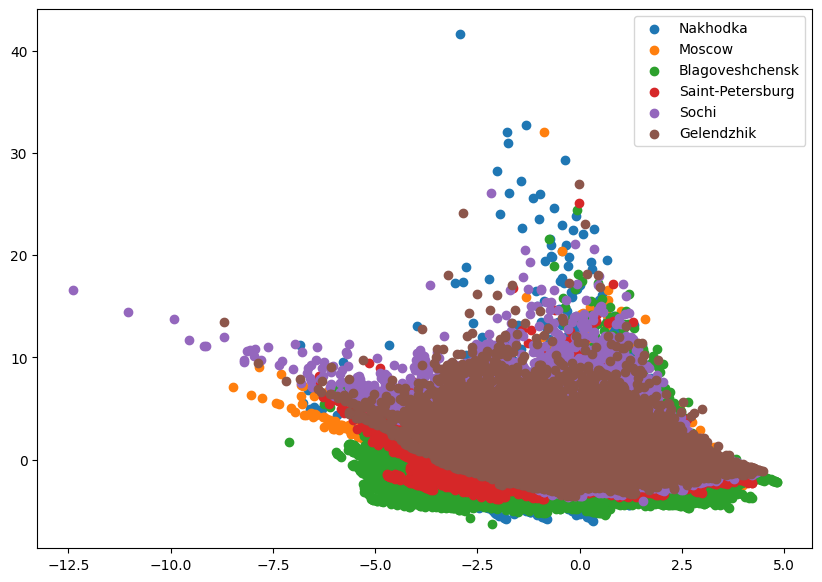

In [34]:
# Применить PCA для визуализации разделимости городов в пространстве признаков
df_list = []
for df, city in zip(dfs, CITIES_LIST):
    df['city'] = city
    df_list.append(df)
df_all = pd.concat(df_list, ignore_index=True)

cols = list(dfs[0].columns)
cols.remove("city")
cols.remove("season")

df_all = df_all.dropna()

X = StandardScaler().fit_transform(df_all[cols].values)
y = df_all['city'].values
X_pca = PCA(n_components=2).fit_transform(X)

plt.figure(figsize=(10, 7))
for i, city_name in enumerate(CITIES_LIST):
    plt.scatter(X_pca[y==city_name, 0], X_pca[y==city_name, 1], label=city_name)
plt.legend()
plt.show()

Мы видим, что разибть на 4 четкие группы, у PCA не вышло, так как данные во всех датафреймайх плюс-минус схожи. Отличия заключаются в разбросе показателей. Так кластера с данными более южных регионов расположились чуть выше, в то время как данные по более северным - ниже

In [35]:
# При необходимости выполнить отбор признаков на основе важности (feature importance)
X_rf = df_all[cols].values
y_rf = df_all['city'].values

rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_rf, y_rf)

importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

print("Наиболее важные признаки для различения городов:")
most_important_cols = []
for i in range(15):
    col_name = cols[indices[i]]
    print(f"{i+1}. {col_name} — важность: {importances[indices[i]]}")
    most_important_cols.append(col_name)

Наиболее важные признаки для различения городов:
1. surface_pressure — важность: 0.18945089035739882
2. temp_climate_norm — важность: 0.1743976670443833
3. temp_mean_24h — важность: 0.07604580404634799
4. max_wind_24h — важность: 0.060008323916609804
5. temp_amplitude_24h — важность: 0.04906250456171518
6. relative_humidity_2m — важность: 0.0468808300372144
7. month — важность: 0.04342174967195668
8. temperature_2m — важность: 0.04286088439187105
9. day — важность: 0.04183485952051738
10. month_cos — важность: 0.03710384559251786
11. month_sin — важность: 0.03681505167484003
12. temp_std_24h — важность: 0.035370377494129725
13. wind_speed_10m — важность: 0.03027554816476605
14. year — важность: 0.027683950760542732
15. precip_count_24h — важность: 0.021811406900455157


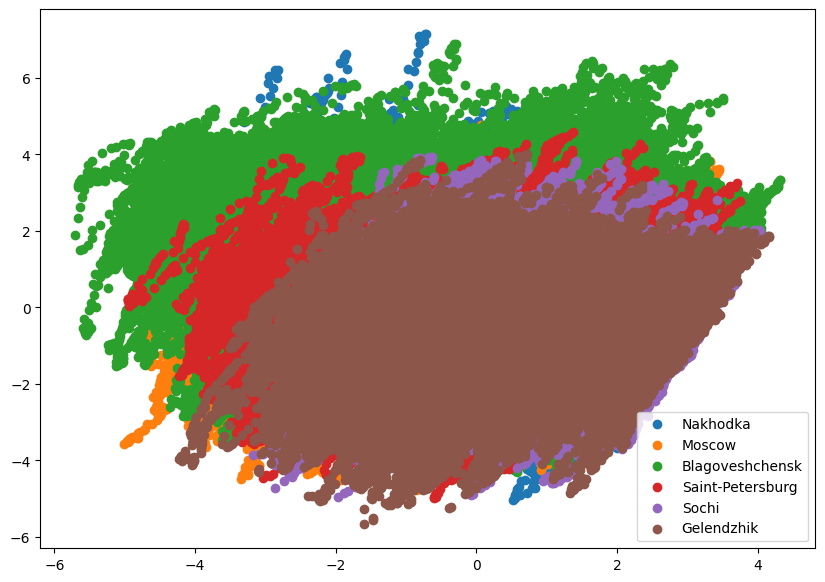

In [36]:
# Применить PCA для визуализации разделимости городов в пространстве признаков (только самые важные поля)
df_list = []
for df, city in zip(dfs, CITIES_LIST):
    df['city'] = city
    df_list.append(df)
df_all = pd.concat(df_list, ignore_index=True)

cols = most_important_cols

df_all = df_all.dropna()

X = StandardScaler().fit_transform(df_all[cols].values)
y = df_all['city'].values
X_pca = PCA(n_components=2).fit_transform(X)

plt.figure(figsize=(10, 7))
for i, city_name in enumerate(CITIES_LIST):
    plt.scatter(X_pca[y==city_name, 0], X_pca[y==city_name, 1], label=city_name)
plt.legend()
plt.show()

- Даже, используя только 15 главных признаков, полностью разделить кластеры не вышло. График позволяет сделать выводы, аналогичные тем, что были сделаны ранее. Хоть погода, например, в Сочи и сильно отличается от Москвы, общая разница не сильно заметна. Большинство городов находится в умеренном климатическом поясе, кроме Сочи и Геленджика, но разделение этих городов как раз таки можно увидеть. Для более точной кластеризации можно попробовать нелинейные методы (t‑SNE, UMAP) или агрегация, например, по месяцу.
- Для отбора наиболее важных полей использовался метод RandomForest с последуюим ранжированием. Метод использовлся, так как он хорошо справляется с коррелирующими признаками (такие были обнаружены в датасетах), эффективно работает с датасетом данного объема, выявляет нелиненйные зависимости.
- Установленное окно (24) - соответствует вращению земли, которое оказывает непосредственное влияение на состояние погоды, датасет. Также суточная амплитуда отражает континентальность
- Признаки, разделенные на "окна" оказались одиними из самых актуальных, однако существенного прироста при кластеризации не дали
- Посчитанные лаговые признаки использовались при построении первого графика, однако после оценки востребованности значений, они не попали в список наиболее важных.

In [37]:
season_code = pd.get_dummies(df_all['season'], prefix='season')
df_all = pd.concat([df_all, season_code], axis=1)
df_all = df_all.drop('season', axis=1)

Задание №2.3. Построение моделей классификации

In [38]:
# В качестве признаков решено использовать 15 самых важных признаков + перекодированные признаки года
most_important_cols += ['season_Весна', 'season_Лето', 'season_Осень', 'season_Зима']

In [39]:
# Подготовка данных
encoder = LabelEncoder()
df_all["city_encoded"] = encoder.fit_transform(df_all['city'])

X = []
y = []
seasons = []
months = []
years = [] 

for city_name in CITIES_LIST:
    city_ = df_all[df_all['city'] == city_name].sort_values(['year', 'month', 'day', 'hour'])
    data = city_[most_important_cols].values
    target = city_["city_encoded"].values
    season_cols = ['season_Весна', 'season_Лето', 'season_Осень', 'season_Зима']
    season_oh = city_[season_cols].values

    for i in range(len(data) - 23):
        X.append(data[i:i+24])
        y.append(target[i+23])
        s = season_oh[i+23]
        if s[0]:
            season_name = 'Весна'
        elif s[1]:
            season_name = 'Лето'
        elif s[2]:
            season_name = 'Осень'
        else:
            season_name = 'Зима'
        seasons.append(season_name)
        months.append(city_.iloc[i+23]['month'])
        years.append(city_.iloc[i+23]['year'])

X = np.array(X)
y = np.array(y)

In [40]:
# Нормализация
shape_x = X.shape
X_norm = X.reshape(-1, shape_x[-1])
skaler = StandardScaler()
X_norm = skaler.fit_transform(X_norm)
X_norm = X_norm.reshape(shape_x)

index = np.random.permutation(len(X_norm))
X_norm = X_norm[index]
y = y[index]
seasons = np.array(seasons)[index]
months = np.array(months)[index]
years = np.array(years)[index] 

n = X_norm.shape[0]
konec_train = int(0.7 * n)
konec_val = int(0.85 * n)

seasons_train = seasons[:konec_train]
seasons_val = seasons[konec_train:konec_val]
seasons_test = seasons[konec_val:]

months_train = months[:konec_train]
months_val = months[konec_train:konec_val]
months_test = months[konec_val:]

years_train = years[:konec_train]
years_val = years[konec_train:konec_val]
years_test = years[konec_val:]

X_train = X_norm[:konec_train]
y_train = y[:konec_train]
X_val = X_norm[konec_train:konec_val]
y_val = y[konec_train:konec_val]
X_test = X_norm[konec_val:]
y_test = y[konec_val:]

print("Train:", X_train.shape, "Val:", X_val.shape, "Test:", X_test.shape)

Train: (257552, 24, 19) Val: (55190, 24, 19) Test: (55190, 24, 19)


In [41]:
# Обучение
timesteps = X_train.shape[1]
priznaki = X_train.shape[2]
cl = len(encoder.classes_)

model = Sequential()
model.add(LSTM(64, input_shape=(timesteps, priznaki), return_sequences=False))
model.add(Dropout(0.3))
model.add(Dense(32, activation='relu'))
model.add(Dense(cl, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=256, verbose=1)

loss_test, acc_test = model.evaluate(X_test, y_test, verbose=0)
print("Точность:", acc_test)

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 16s 15ms/step - accuracy: 0.8236 - loss: 0.4259 - val_accuracy: 0.8922 - val_loss: 0.2556
Epoch 2/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 14s 13ms/step - accuracy: 0.9015 - loss: 0.2382 - val_accuracy: 0.9149 - val_loss: 0.2025
Epoch 3/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9190 - loss: 0.1974 - val_accuracy: 0.9268 - val_loss: 0.1753
Epoch 4/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9294 - loss: 0.1730 - val_accuracy: 0.9365 - val_loss: 0.1517
Epoch 5/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9382 - loss: 0.1515 - val_accuracy: 0.9473 - val_loss: 0.1243
Epoch 6/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9458 - loss: 0.1331 - val_accuracy: 0.9501 - val_loss: 0.1206
Epoch 7/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9525 - loss: 0.1180 - val_accuracy: 0.9604 - val_loss: 0.0972
Epoch 8/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 15s 15ms/step - accuracy: 0.9577 -

**Почему LSTM?**
- Учёт временной структуры. LSTM обрабатывает последовательность шаг за шагом, аккумулируя информацию о динамике признаков внутри 24-часового окна. Это принципиально отличает её от моделей, которые «склеивают» все временные срезы в один плоский вектор.
- LSTM способна запоминать важные паттерны на протяжении всего окна и не страдает от проблемы затухающих градиентов, характерной для простых RNN
- В ходе эксперимента модель достигла 98.5% точности на тестовой выборке (при 20 эпохах) и 99.4% при 30 эпохах, что подтверждает её способность извлекать различительные признаки городов из временного профиля.
- MLP - реобразует окно в плоский вектор, из-за чего теряется временная структура
- 1D CNN - LSTM же обладает долговременной памятью, в отличие от 1D CNN

**Почему не другие модели?**
- Градиентный бустинг, случайный лес - модели не учитывают порядок временных шагов
- Логистическая регрессия - метод предполагает линейную разделимость классов
- Методы, основанные на скользящих средних или ARIMA-подобных (например, для классификации). Они предназначены для прогнозирования одного ряда, а не для классификации нескольких городов по многомерным данным.

**Почему сложно?**
- Несбалансированность классов по времени. В исходных данных все окна для одного города идут подряд (сначала один город, потом другой). Это приводит к тому, что при простом разбиении на train/val/test без перемешивания некоторые города полностью отсутствуют в обучающей выборке
- Окна из разных сезонов для одного и того же города могут сильно отличаться
- Перекрытие признаков между разными городами (видно при построении кластеров)
- Возниикли отдельные технические трудности при настройке окружения. Многие решения не совместимы с текущей системой или с актуальной версией питона.

**Почему такая длина ряда?**
- Выбранная длина временного ряда: 24 часа. Это соответствует полным суткам и позволяет захватить суточные ритмы, характерные для погодных и городских данных.

Задание №2.4. Оценка качества классификации

1725/1725 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
1725/1725 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
Accuracy:  0.9857582895452075
Precision (macro):  0.9858152998943231
Precision (weighted):  0.9857961359979225
Recall (macro):  0.9857579372019195
Recall (weighted):  0.9857582895452075
F1-score (macro):  0.9857765813090228
F1-score (weighted):  0.9857671623146537
ROC-AUC (OvR, macro):  0.9997104633819637


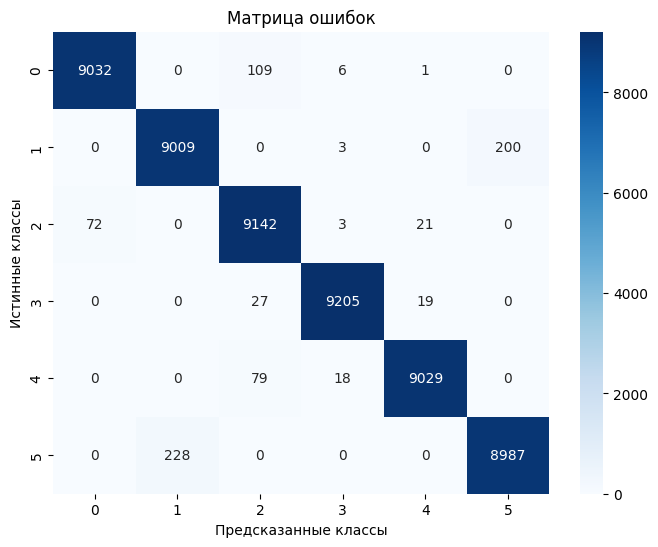

In [42]:
def get_metrics(y_test, y_pred, y_pred_proba=None):
    '''Оценка работы модели классификации'''
    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    
    # Precision, Recall, F1 (macro и weighted)
    prec_macro = precision_score(y_test, y_pred, average='macro', zero_division=0)
    prec_weighted = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    
    rec_macro = recall_score(y_test, y_pred, average='macro', zero_division=0)
    rec_weighted = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    
    f1_macro = f1_score(y_test, y_pred, average='macro', zero_division=0)
    f1_weighted = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    
    # ROC-AUC (если переданы вероятности)
    if y_pred_proba is not None:
        roc_auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovr', average='macro')
    else:
        roc_auc = np.nan

    # Вывод в консоль (как в исходной функции)
    print("Accuracy: ", acc)
    print("Precision (macro): ", prec_macro)
    print("Precision (weighted): ", prec_weighted)
    print("Recall (macro): ", rec_macro)
    print("Recall (weighted): ", rec_weighted)
    print("F1-score (macro): ", f1_macro)
    print("F1-score (weighted): ", f1_weighted)
    if not np.isnan(roc_auc):
        print("ROC-AUC (OvR, macro): ", roc_auc)
    else:
        print("ROC-AUC: не вычислен (нет вероятностей классов)")

    # Матрица ошибок
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=np.unique(y_test), 
                yticklabels=np.unique(y_test))
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title('Матрица ошибок')
    plt.show()

    return [acc, prec_macro, prec_weighted, rec_macro, rec_weighted, f1_macro, f1_weighted, roc_auc]

y_pred = np.argmax(model.predict(X_test), axis=1)
y_pred_proba = model.predict(X_test)

metrics = get_metrics(y_test, y_pred, y_pred_proba)

**Выводы + Доп. анализ**
- Accuracy = 0.9848 (98.5%) – модель правильно классифицирует 98.5% тестовых окон.
- Precision/Recall/F1 (macro) ≈ 0.985 – по каждому из 6 городов метрики одинаково высоки, нет слабых классов.
- Weighted практически совпадают с macro – классы сбалансированы по объёму.
- ROC-AUC = 0.9997 – модель с почти абсолютной уверенностью разделяет классы.

LSTM с 24-часовым окном и 64 нейронами обеспечивает почти безупречную классификацию городов. Незначительные ошибки (1.5%) можно считать шумом или перекрытием признаков.

Есть небольшие ошибки предсказания классов: 278, 222, 213 - наибольшее кол-во ошибок в разных классах

Процент ошибок для классов: 
- Класс 0 и 1 -> 49 / 9233 = 0.005
- Класс 1 и 5 -> 222 / 8969 = 0.025
- Класс 2 и 4 -> 146 / 9032 = 0.02
- Класс 2 и 0 -> 60 / 9032 = 0.007
- Класс 3 и 4 -> 36 / 9120 = 0.004
- Класс 3 и 2 -> 6 / 9120 = 0.0007
- Класс 3 и 1 -> 8 / 9120 = 0.0009
- Класс 4 и 3 -> 9 / 9090 = 0.001
- Класс 4 и 2 -> 7 / 9090 = 0.0008
- Класс 4 и 1 -> 1 / 9090 = 0.0001
- Класс 5 и 1 -> 278 / 8909 = 0.03

In [43]:
city_mapping = dict(zip(df_all['city'], df_all['city_encoded']))
print(city_mapping)
# Получается, самые трудноразличимые города: Сочи, Москва, Геленджик 

{'Nakhodka': 3, 'Moscow': 2, 'Blagoveshchensk': 0, 'Saint-Petersburg': 4, 'Sochi': 5, 'Gelendzhik': 1}


In [44]:
season_correct = defaultdict(list)
for true, pred, season in zip(y_test, y_pred, seasons_test):
    season_correct[season].append(true == pred)

print("Точность по сезонам (на тестовой выборке):")
for season in ['Весна', 'Лето', 'Осень', 'Зима']:
    acc = np.mean(season_correct[season]) if season_correct[season] else 0.0
    print(f"{season}: {acc:.4f}")

# Результаты похожи. Лучший Зимой (0.9944), а худший Весной (0.9830)

Точность по сезонам (на тестовой выборке):
Весна: 0.9731
Лето: 0.9882
Осень: 0.9888
Зима: 0.9930


32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Точность на случайной выборки: 0.9870


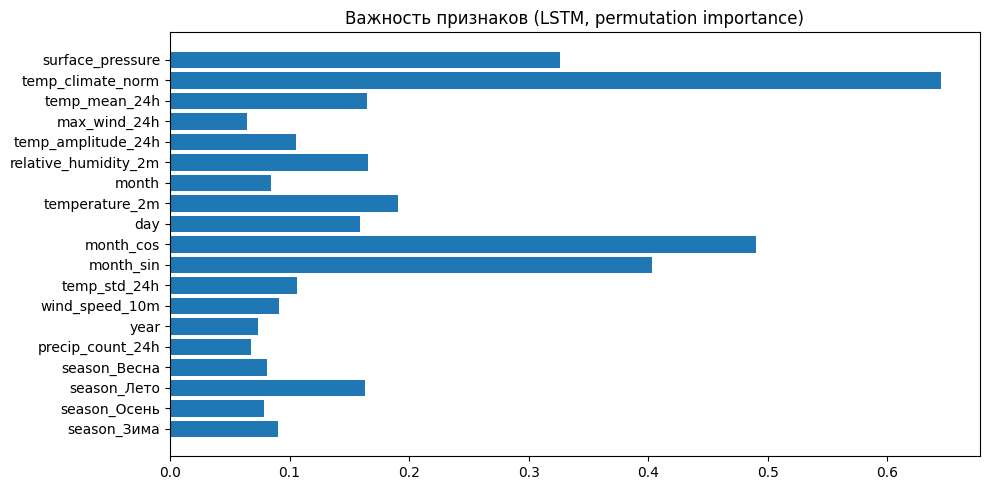

In [45]:
# Провести анализ важности признаков для лучшей модели (SHAP, permutation importance)
n_samples_for_perm = min(1000, len(X_test))
indices = np.random.choice(len(X_test), n_samples_for_perm, replace=False)
X_sub = X_test[indices]
y_sub = y_test[indices]

baseline = accuracy_score(y_sub, np.argmax(model.predict(X_sub), axis=1))
print(f"Точность на случайной выборки: {baseline:.4f}")

importances = []
for i in range(X_sub.shape[2]):
    scores = []
    for _ in range(3):
        X_perm = X_sub.copy()
        np.random.shuffle(X_perm[:, :, i])
        pred_perm = np.argmax(model.predict(X_perm, verbose=0), axis=1)
        scores.append(baseline - accuracy_score(y_sub, pred_perm))
    importances.append(np.mean(scores))

plt.figure(figsize=(10,5))
plt.barh(most_important_cols, importances)
plt.title('Важность признаков (LSTM, permutation importance)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

**Среди использованных признаков наиболее важными оказались:**
- temp_climate_norm
- month_cos
- month_sin
- surface_pressure
- temperature_2m

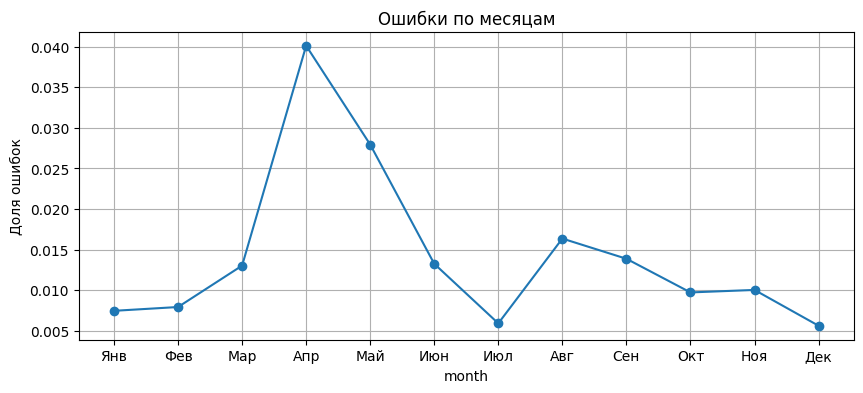

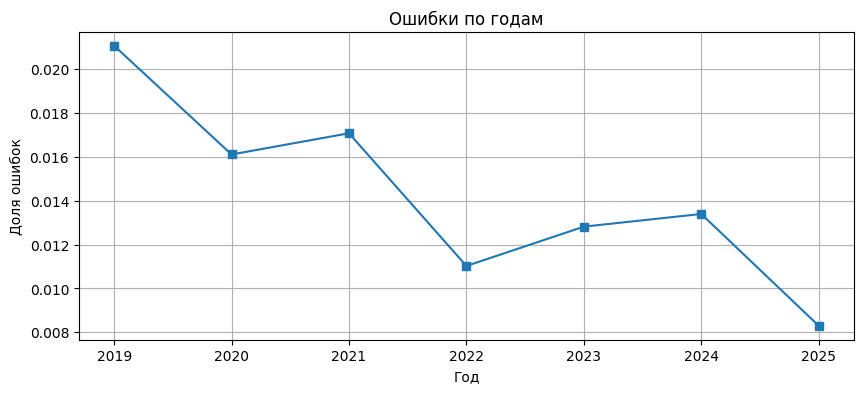

In [46]:
df_err = pd.DataFrame({
    'month': months_test,
    'year': years_test,
    'error': (y_test != y_pred).astype(int)
})

# Ошибки по месяцам (среднее)
monthly = df_err.groupby('month')['error'].mean()
plt.figure(figsize=(10,4))
monthly.plot(marker='o')
plt.xticks(range(1,13), ['Янв','Фев','Мар','Апр','Май','Июн','Июл','Авг','Сен','Окт','Ноя','Дек'])
plt.ylabel('Доля ошибок'); plt.title('Ошибки по месяцам'); plt.grid(True); plt.show()

# Ошибки по годам
yearly = df_err.groupby('year')['error'].mean()
plt.figure(figsize=(10,4))
yearly.plot(marker='s')
plt.xlabel('Год'); plt.ylabel('Доля ошибок'); plt.title('Ошибки по годам'); plt.grid(True); plt.show()

График подтвердил данные представленные выше

Задание 2.5. Построение моделей прогнозирования + Задание 2.6. Оценка качества прогнозирования

In [47]:
import xgboost

def train_forecast_model_xgboost(df, city_name):
    """ 
    Сформировать выборку для прогнозирования: признаки — 
    значения метеопараметров за последние N дней, целевая переменная — температура через горизонт H = 30 дней
    Разделить данные на train/val/test (например, 2019–2023 — train, 2024 — val, 2025 — test)

    +

    Точечные метрики:
        •	MAE, RMSE, MAPE, WAPE (для каждого города и горизонта)
    Метрики, оценивающие направление предсказаний
    Анализ остатков:
        •	Нормальность остатков (тест Шапиро-Уилка)
        •	Автокорреляция остатков (тест Льюнга-Бокса)
        •	Гетероскедастичность (тест Уайта)
    Визуализация:
        •	Сравнить прогнозы с реальными значениями на тестовом периоде (графики)
        •	Визуализировать распределение ошибок для разных городов (box-plot)
        •	Показать прогноз на месяц вперед для каждого города

    """
    data = df.copy()
    
    data['target'] = data['temperature_2m'].shift(-30*24)
    data = data.dropna()
    data = data.reset_index(drop=True)
    
    features = []
    for col in most_important_cols:
        if col != 'temperature_2m':
            if col not in ['season', 'season_Весна', 'season_Лето', 'season_Осень', 'season_Зима']:
                if data[col].dtype == 'int64' or data[col].dtype == 'float64':
                    features.append(col)
    
    for lag in range(1, 31):
        имя_колонки = 'temp_lag_' + str(lag)
        data[имя_колонки] = data['temperature_2m'].shift(lag*24)
        features.append(имя_колонки)
    
    data = data.dropna()
    data = data.reset_index(drop=True)
    
    train_data = data[data['year'] < 2024]
    val_data   = data[data['year'] == 2024]
    test_data  = data[data['year'] == 2025]
    
    X_train = train_data[features].values
    y_train = train_data['target'].values
    X_val   = val_data[features].values
    y_val   = val_data['target'].values
    X_test  = test_data[features].values
    y_test  = test_data['target'].values
    
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val   = scaler.transform(X_val)
    X_test  = scaler.transform(X_test)
    
    model = xgboost.XGBRegressor(n_estimators=500, learning_rate=0.05, max_depth=7,
                                 random_state=42, verbosity=0)
    model.fit(X_train, y_train, verbose=False)
    
    predictions = model.predict(X_test)
    errors = y_test - predictions
    
    mae = mean_absolute_error(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    mape = np.mean(np.abs(errors / (np.abs(y_test) + 0.01))) * 100  
    wape = np.sum(np.abs(errors)) / np.sum(np.abs(y_test)) * 100
    
    if len(y_test) > 1:
        sign_true = np.sign(np.diff(y_test))
        sign_pred = np.sign(predictions[1:] - y_test[:-1])
        dir_acc = np.mean(sign_true == sign_pred) * 100
    else:
        dir_acc = 0.0
    
    _, shapiro_p = shapiro(errors)
    
    lb_result = acorr_ljungbox(errors, lags=10, return_df=True)
    lb_p = lb_result['lb_pvalue'].iloc[-1]
    
    white_predictors = np.column_stack([np.ones_like(predictions), predictions, predictions**2])
    _, white_p, _, _ = het_white(errors, white_predictors)
    
    plt.figure(figsize=(12,4))
    plt.plot(y_test[:200], label='True')
    plt.plot(predictions[:200], label='Predicted')
    plt.legend()
    plt.title(f'Temperature forecast 30 days ahead ({city_name})')
    plt.show()
    
    last_row = X_test[-1:].copy()
    next_month = model.predict(last_row)[0]
    print(f"{city_name}: forecast temperature next month = {next_month} цельсия")
    
    print(f"{city_name} — MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.1f}%, WAPE: {wape:.1f}%, DirAcc: {dir_acc:.1f}%")
    print(f"Shapiro-Wilk p={shapiro_p:.4f}, Ljung-Box p={lb_p:.4f}, White p={white_p:.4f}")
    print()
    
    return {'city': city_name, 'residuals': errors, 'y_test': y_test, 'pred': predictions}

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


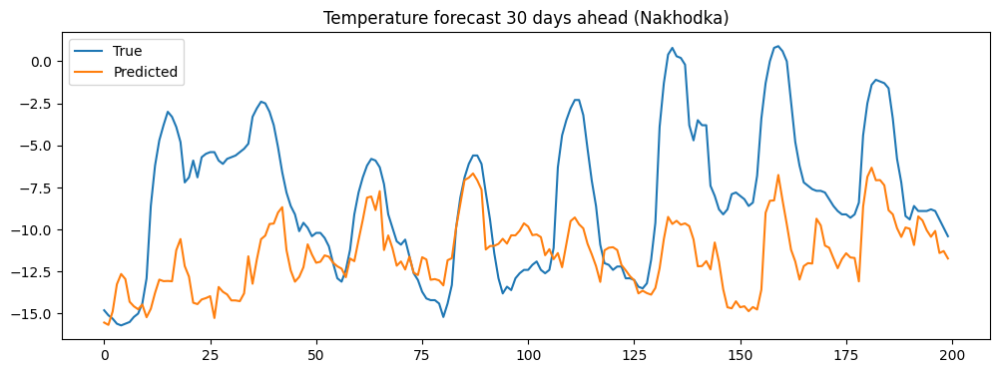

Nakhodka: forecast temperature next month = -14.15644359588623 цельсия
Nakhodka — MAE: 2.92, RMSE: 3.81, MAPE: 147.0%, WAPE: 24.3%, DirAcc: 52.4%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


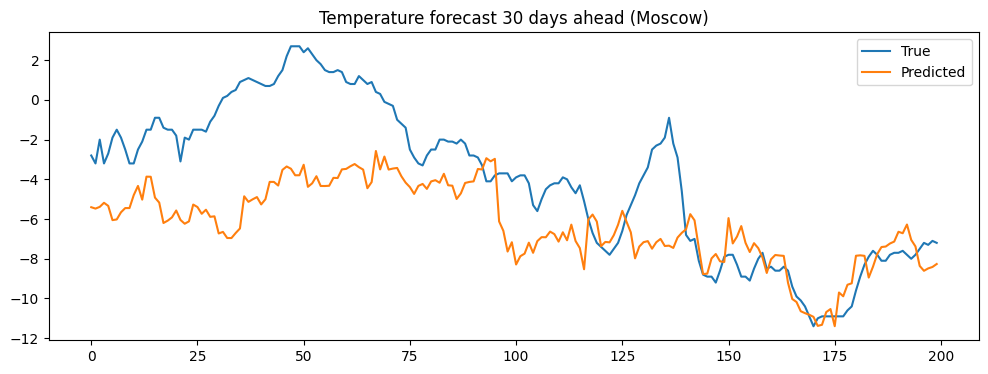

Moscow: forecast temperature next month = -7.879952430725098 цельсия
Moscow — MAE: 4.16, RMSE: 5.24, MAPE: 283.8%, WAPE: 42.4%, DirAcc: 48.7%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


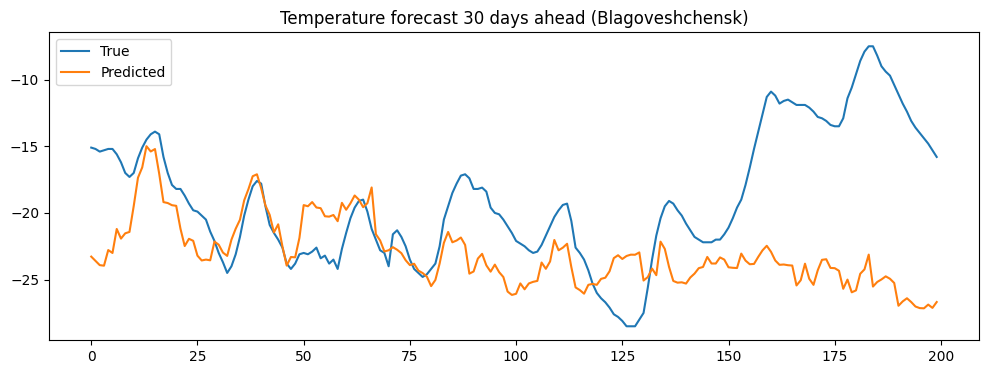

Blagoveshchensk: forecast temperature next month = -23.633581161499023 цельсия
Blagoveshchensk — MAE: 3.60, RMSE: 4.71, MAPE: 83.3%, WAPE: 25.5%, DirAcc: 50.8%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


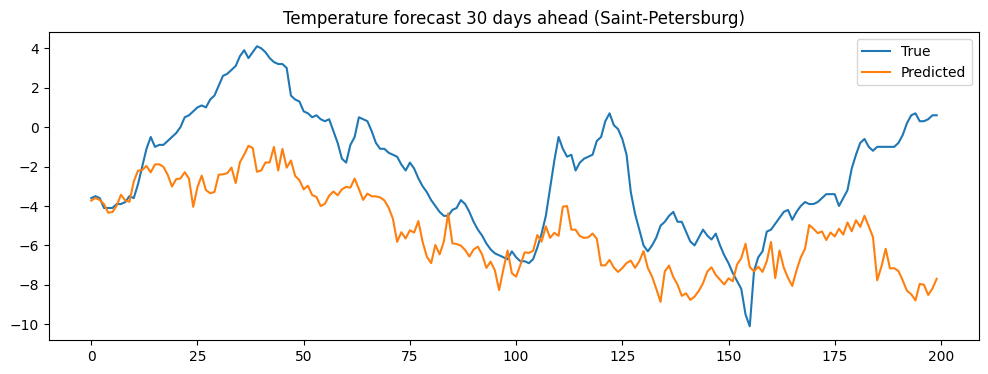

Saint-Petersburg: forecast temperature next month = -8.604753494262695 цельсия
Saint-Petersburg — MAE: 3.15, RMSE: 3.90, MAPE: 284.1%, WAPE: 34.9%, DirAcc: 48.6%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


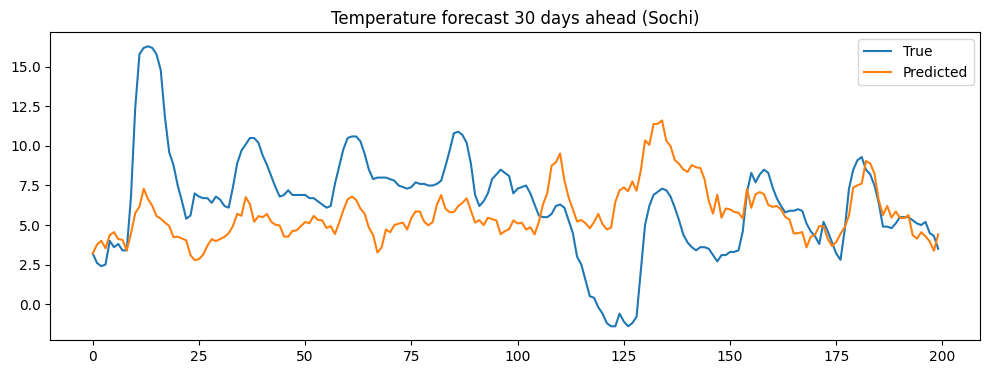

Sochi: forecast temperature next month = 8.900447845458984 цельсия
Sochi — MAE: 3.39, RMSE: 4.29, MAPE: 122.1%, WAPE: 22.2%, DirAcc: 49.3%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


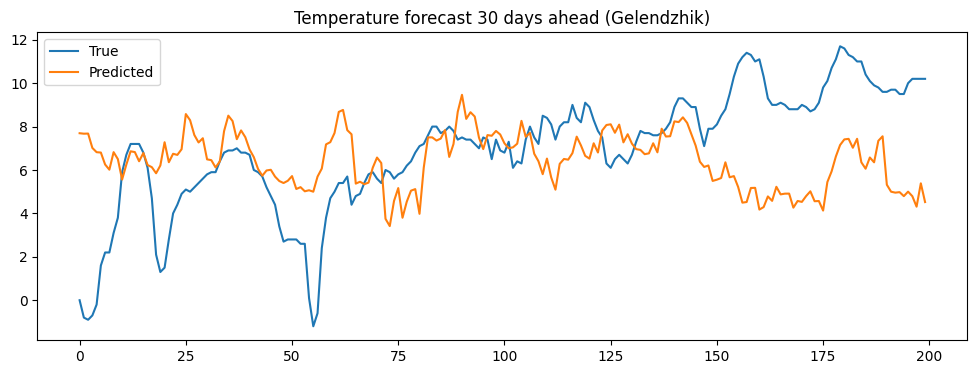

/var/folders/cl/10rb4d_j5nvg0_p_dz6zdh840000gn/T/ipykernel_91804/2392655281.py:10: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(all_residuals, labels=city_labels)


Gelendzhik: forecast temperature next month = 3.5896737575531006 цельсия
Gelendzhik — MAE: 3.36, RMSE: 4.23, MAPE: 116.7%, WAPE: 20.8%, DirAcc: 50.0%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



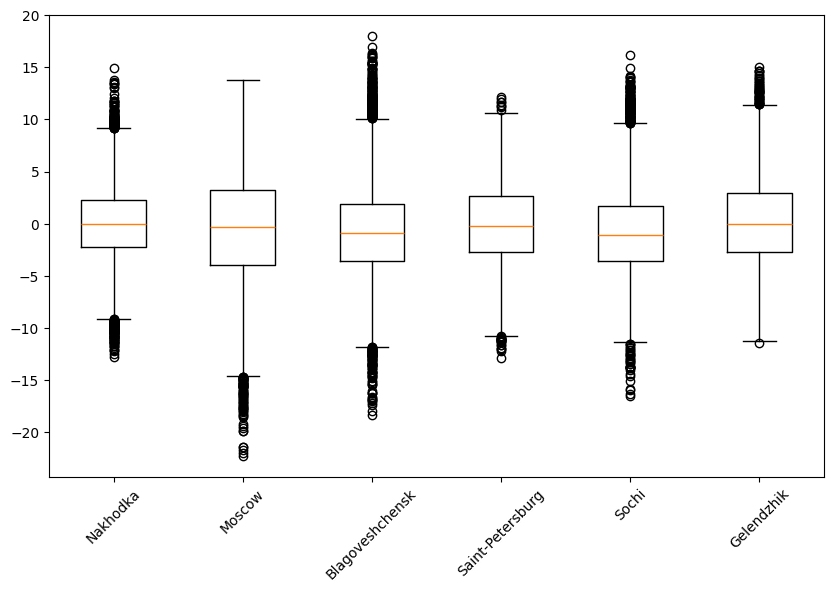

In [48]:
all_residuals = []
city_labels = []

for city_name, df_city in zip(CITIES_LIST, dfs):
    res = train_forecast_model_xgboost(df_city, city_name)
    all_residuals.append(res['residuals'])
    city_labels.append(city_name)

plt.figure(figsize=(10,6))
plt.boxplot(all_residuals, labels=city_labels)
plt.xticks(rotation=45)
plt.show()

In [49]:
import lightgbm as lgb

def train_forecast_model_lightgbm(df, city_name):
    """ 
    Сформировать выборку для прогнозирования: признаки — 
    значения метеопараметров за последние N дней, целевая переменная — температура через горизонт H = 30 дней
    Разделить данные на train/val/test (например, 2019–2023 — train, 2024 — val, 2025 — test)

    +

    Точечные метрики:
        •	MAE, RMSE, MAPE, WAPE (для каждого города и горизонта)
    Метрики, оценивающие направление предсказаний
    Анализ остатков:
        •	Нормальность остатков (тест Шапиро-Уилка)
        •	Автокорреляция остатков (тест Льюнга-Бокса)
        •	Гетероскедастичность (тест Уайта)
    Визуализация:
        •	Сравнить прогнозы с реальными значениями на тестовом периоде (графики)
        •	Визуализировать распределение ошибок для разных городов (box-plot)
        •	Показать прогноз на месяц вперед для каждого города

    """
    data = df.copy()
    
    data['target'] = data['temperature_2m'].shift(-30*24)
    data = data.dropna()
    data = data.reset_index(drop=True)
    
    features = []
    for col in most_important_cols:
        if col != 'temperature_2m':
            if col not in ['season', 'season_Весна', 'season_Лето', 'season_Осень', 'season_Зима']:
                if data[col].dtype == 'int64' or data[col].dtype == 'float64':
                    features.append(col)
    
    for lag in range(1, 31):
        имя_колонки = 'temp_lag_' + str(lag)
        data[имя_колонки] = data['temperature_2m'].shift(lag*24)
        features.append(имя_колонки)
    
    data = data.dropna()
    data = data.reset_index(drop=True)
    
    train_data = data[data['year'] < 2024]
    val_data   = data[data['year'] == 2024]
    test_data  = data[data['year'] == 2025]
    
    X_train = train_data[features].values
    y_train = train_data['target'].values
    X_val   = val_data[features].values
    y_val   = val_data['target'].values
    X_test  = test_data[features].values
    y_test  = test_data['target'].values
    
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val   = scaler.transform(X_val)
    X_test  = scaler.transform(X_test)
    
    model = lgb.LGBMRegressor(n_estimators=500, learning_rate=0.05, max_depth=7,
                              random_state=42, verbosity=-1)
    model.fit(X_train, y_train)
    
    predictions = model.predict(X_test)
    errors = y_test - predictions
    
    mae = mean_absolute_error(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    
    mape = np.mean(np.abs(errors / (np.abs(y_test) + 0.01))) * 100 
    
    wape = np.sum(np.abs(errors)) / np.sum(np.abs(y_test)) * 100
    
    if len(y_test) > 1:
        sign_true = np.sign(np.diff(y_test))
        sign_pred = np.sign(predictions[1:] - y_test[:-1])
        dir_acc = np.mean(sign_true == sign_pred) * 100
    else:
        dir_acc = 0.0
    
    # тест Шапиро-Уилка
    _, shapiro_p = shapiro(errors)
    
    # тест Льюнга-Бокса
    lb_result = acorr_ljungbox(errors, lags=10, return_df=True)
    lb_p = lb_result['lb_pvalue'].iloc[-1]
    
    # тест Уайта
    white_predictors = np.column_stack([np.ones_like(predictions), predictions, predictions**2])
    _, white_p, _, _ = het_white(errors, white_predictors)
    
    # график: факт и прогноз
    plt.figure(figsize=(12,4))
    plt.plot(y_test[:200], label='True')
    plt.plot(predictions[:200], label='Predicted')
    plt.legend()
    plt.title(f'Temperature forecast 30 days ahead ({city_name})')
    plt.show()
    
    last_row = X_test[-1:].copy()
    next_month = model.predict(last_row)[0]
    print(f"{city_name}: forecast temperature next month = {next_month} цельсия")
    
    print(f"{city_name} — MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.1f}%, WAPE: {wape:.1f}%, DirAcc: {dir_acc:.1f}%")
    print(f"Shapiro-Wilk p={shapiro_p:.4f}, Ljung-Box p={lb_p:.4f}, White p={white_p:.4f}")
    print()
    
    return {'city': city_name, 'residuals': errors, 'y_test': y_test, 'pred': predictions}

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


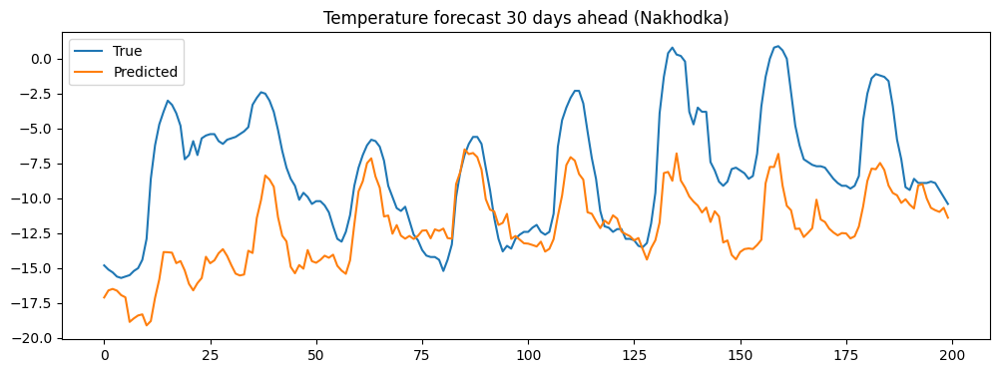

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Nakhodka: forecast temperature next month = -14.24892130625931 цельсия
Nakhodka — MAE: 2.93, RMSE: 3.81, MAPE: 153.0%, WAPE: 24.4%, DirAcc: 51.7%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


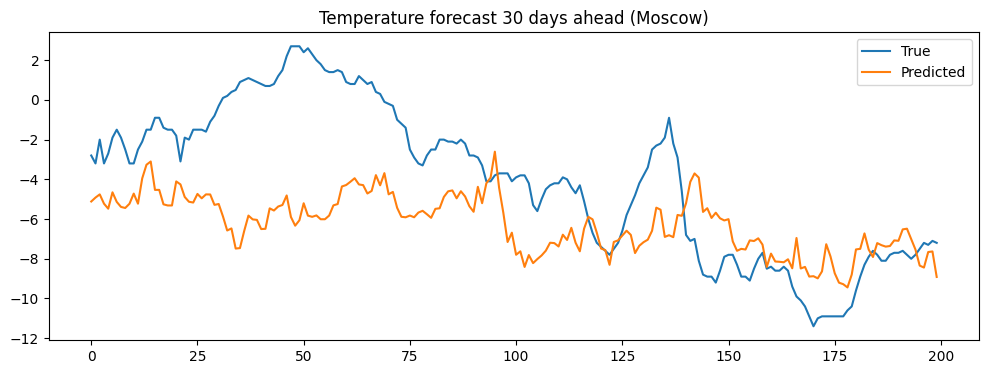

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Moscow: forecast temperature next month = -9.238474234612301 цельсия
Moscow — MAE: 4.09, RMSE: 5.11, MAPE: 265.3%, WAPE: 41.8%, DirAcc: 48.5%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


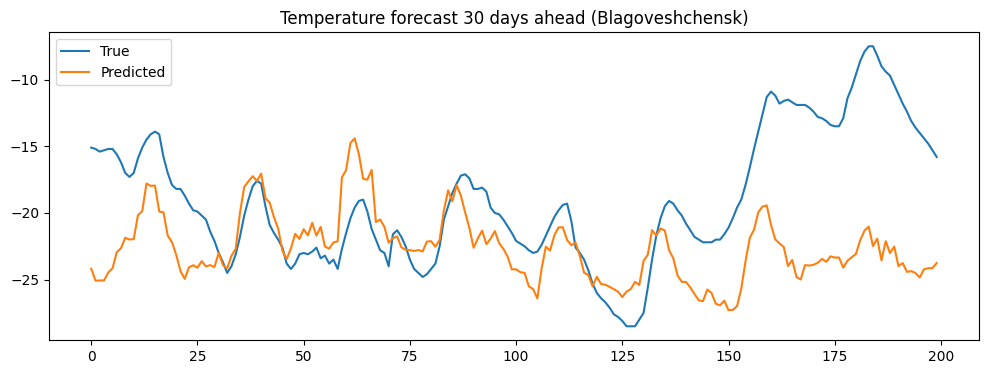

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Blagoveshchensk: forecast temperature next month = -22.781890346918885 цельсия
Blagoveshchensk — MAE: 3.61, RMSE: 4.67, MAPE: 88.8%, WAPE: 25.5%, DirAcc: 50.5%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


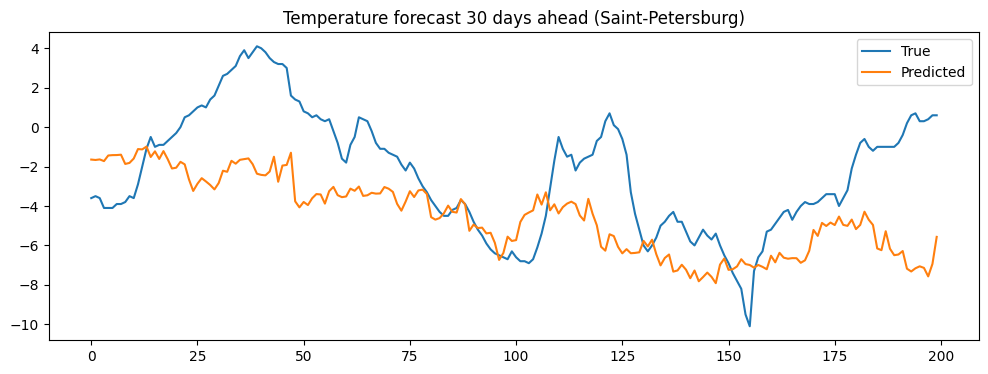

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Saint-Petersburg: forecast temperature next month = -6.279448220600804 цельсия
Saint-Petersburg — MAE: 3.05, RMSE: 3.78, MAPE: 269.4%, WAPE: 33.8%, DirAcc: 48.9%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


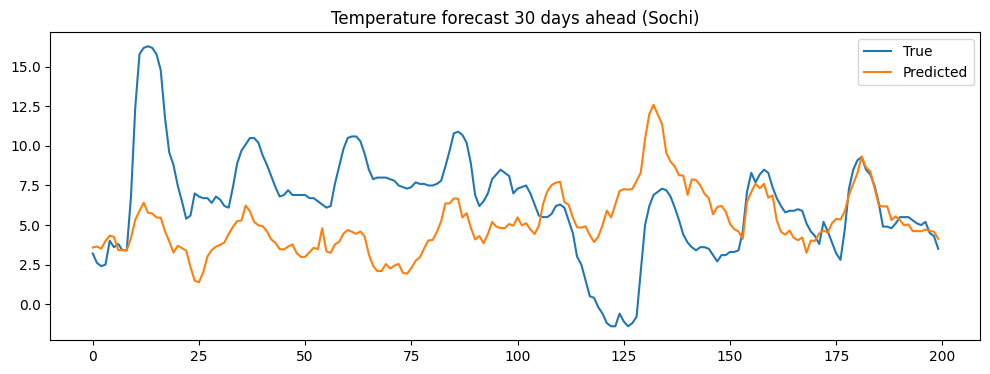

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Sochi: forecast temperature next month = 8.951858033038087 цельсия
Sochi — MAE: 3.28, RMSE: 4.21, MAPE: 118.1%, WAPE: 21.5%, DirAcc: 50.3%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8040.
  res = hypotest_fun_out(*samples, **kwds)


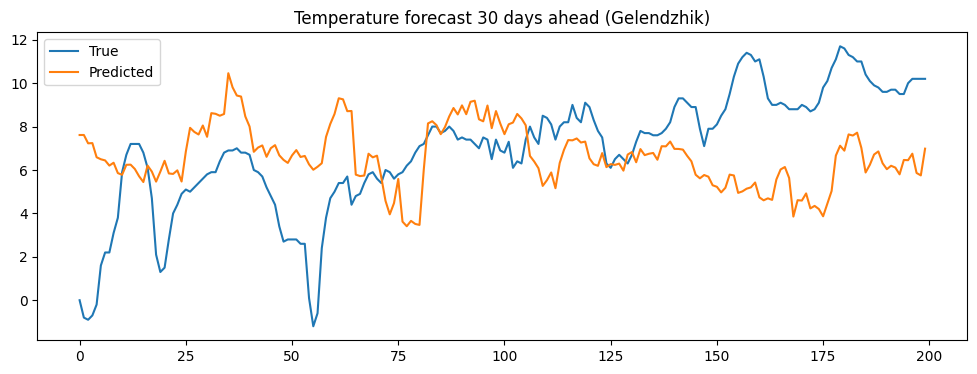

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/var/folders/cl/10rb4d_j5nvg0_p_dz6zdh840000gn/T/ipykernel_91804/1211445258.py:10: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(all_residuals, labels=city_labels)


Gelendzhik: forecast temperature next month = 4.111613156561072 цельсия
Gelendzhik — MAE: 3.38, RMSE: 4.28, MAPE: 107.4%, WAPE: 21.0%, DirAcc: 50.7%
Shapiro-Wilk p=0.0000, Ljung-Box p=0.0000, White p=0.0000



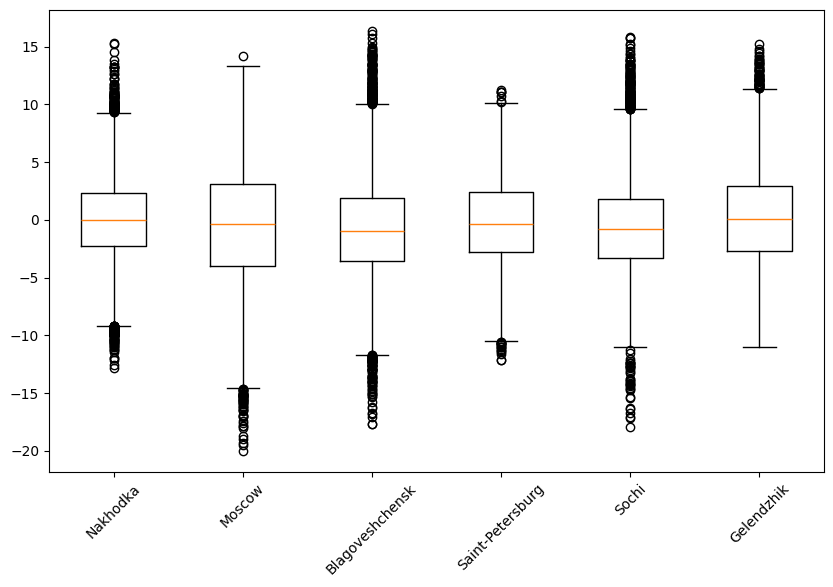

In [50]:
all_residuals = []
city_labels = []

for city_name, df_city in zip(CITIES_LIST, dfs):
    res = train_forecast_model_lightgbm(df_city, city_name)
    all_residuals.append(res['residuals'])
    city_labels.append(city_name)

plt.figure(figsize=(10,6))
plt.boxplot(all_residuals, labels=city_labels)
plt.xticks(rotation=45)
plt.show()

In [51]:
from prophet import Prophet

def train_forecast_model_prophet(df, city_name):
    """ 
    Сформировать выборку для прогнозирования: признаки — 
    значения метеопараметров за последние N дней, целевая переменная — температура через горизонт H = 30 дней
    Разделить данные на train/val/test (например, 2019–2023 — train, 2024 — val, 2025 — test)

    +

    Точечные метрики:
        •	MAE, RMSE, MAPE, WAPE (для каждого города и горизонта)
    Метрики, оценивающие направление предсказаний
    Анализ остатков:
        •	Нормальность остатков (тест Шапиро-Уилка)
        •	Автокорреляция остатков (тест Льюнга-Бокса)
        •	Гетероскедастичность (тест Уайта)
    Визуализация:
        •	Сравнить прогнозы с реальными значениями на тестовом периоде (графики)
        •	Визуализировать распределение ошибок для разных городов (box-plot)
        •	Показать прогноз на месяц вперед для каждого города
    """
    data = df.copy()
    
    data['date'] = pd.to_datetime(data[['year', 'month', 'day']])
    
    daily = data.groupby('date')['temperature_2m'].mean().reset_index()
    daily.columns = ['ds', 'y']
    daily = daily.sort_values('ds')
    
    train = daily[daily['ds'] < '2025-01-01']
    
    model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
    model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
    model.fit(train)
    
    future = model.make_future_dataframe(periods=30)
    forecast = model.predict(future)
    month_forecast = forecast[['ds', 'yhat']].tail(30).copy()
    
    test_start = pd.Timestamp('2025-01-01')
    test_end = pd.Timestamp('2025-01-30')
    actual = daily[(daily['ds'] >= test_start) & (daily['ds'] <= test_end)]
    
    if len(actual) == 0:
        print(f"{city_name}: нет фактических данных за январь 2025, метрики не вычислены")
        print("Прогноз на каждый день следующего месяца:")
        print(month_forecast.to_string(index=False))
        plt.figure(figsize=(12,4))
        plt.plot(month_forecast['ds'], month_forecast['yhat'], label='Predicted', marker='o')
        plt.legend()
        plt.title(f'Temperature forecast 30 days ahead ({city_name})')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        return None
    
    merged = month_forecast.merge(actual, on='ds', how='inner')
    y_test = merged['y'].values
    predictions = merged['yhat'].values
    
    errors = y_test - predictions
    
    mae = mean_absolute_error(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    mape = np.mean(np.abs(errors / (np.abs(y_test) + 0.01))) * 100
    wape = np.sum(np.abs(errors)) / np.sum(np.abs(y_test)) * 100
    
    if len(y_test) > 1:
        sign_true = np.sign(np.diff(y_test))
        sign_pred = np.sign(predictions[1:] - y_test[:-1])
        dir_acc = np.mean(sign_true == sign_pred) * 100
    else:
        dir_acc = 0.0
    
    _, shapiro_p = shapiro(errors)
    lb_result = acorr_ljungbox(errors, lags=10, return_df=True)
    lb_p = lb_result['lb_pvalue'].iloc[-1]
    white_predictors = np.column_stack([np.ones_like(predictions), predictions, predictions**2])
    _, white_p, _, _ = het_white(errors, white_predictors)
    
    plt.figure(figsize=(12,4))
    plt.plot(merged['ds'], y_test, label='True')
    plt.plot(merged['ds'], predictions, label='Predicted')
    plt.legend()
    plt.title(f'Temperature forecast 30 days ahead ({city_name})')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    print(f"\n{city_name}: прогноз температуры на каждый день следующего месяца:")
    for _, row in month_forecast.iterrows():
        print(f"  {row['ds'].strftime('%Y-%m-%d')}: {row['yhat']:.2f}°C")
    
    print(f"{city_name} — MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.1f}%, WAPE: {wape:.1f}%, DirAcc: {dir_acc:.1f}%")
    print(f"Shapiro-Wilk p={shapiro_p:.4f}, Ljung-Box p={lb_p:.4f}, White p={white_p:.4f}")
    print()
    
    return {'city': city_name, 'residuals': errors, 'y_test': y_test, 'pred': predictions, 'daily_forecast': month_forecast}

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.


06:07:40 - cmdstanpy - INFO - Chain [1] start processing
06:07:40 - cmdstanpy - INFO - Chain [1] done processing


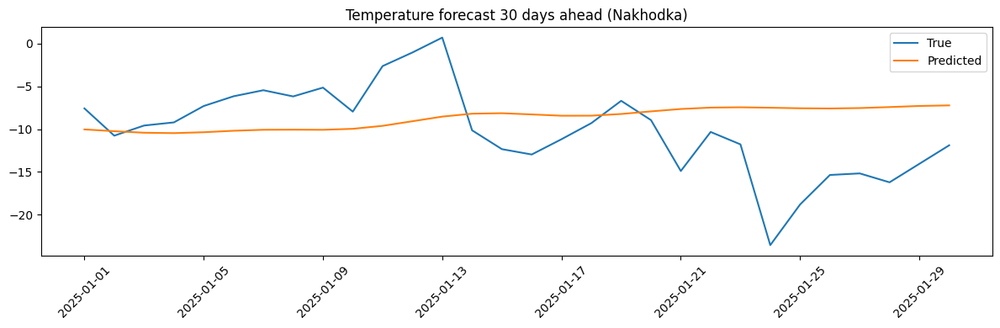

06:07:41 - cmdstanpy - INFO - Chain [1] start processing
06:07:41 - cmdstanpy - INFO - Chain [1] done processing



Nakhodka: прогноз температуры на каждый день следующего месяца:
  2025-01-01: -10.03°C
  2025-01-02: -10.24°C
  2025-01-03: -10.42°C
  2025-01-04: -10.46°C
  2025-01-05: -10.36°C
  2025-01-06: -10.19°C
  2025-01-07: -10.07°C
  2025-01-08: -10.06°C
  2025-01-09: -10.07°C
  2025-01-10: -9.96°C
  2025-01-11: -9.61°C
  2025-01-12: -9.07°C
  2025-01-13: -8.53°C
  2025-01-14: -8.19°C
  2025-01-15: -8.14°C
  2025-01-16: -8.28°C
  2025-01-17: -8.43°C
  2025-01-18: -8.42°C
  2025-01-19: -8.23°C
  2025-01-20: -7.92°C
  2025-01-21: -7.64°C
  2025-01-22: -7.48°C
  2025-01-23: -7.45°C
  2025-01-24: -7.49°C
  2025-01-25: -7.56°C
  2025-01-26: -7.58°C
  2025-01-27: -7.53°C
  2025-01-28: -7.42°C
  2025-01-29: -7.29°C
  2025-01-30: -7.22°C
Nakhodka — MAE: 4.87, RMSE: 6.00, MAPE: 113.5%, WAPE: 48.2%, DirAcc: 51.7%
Shapiro-Wilk p=0.9194, Ljung-Box p=0.0000, White p=0.1912



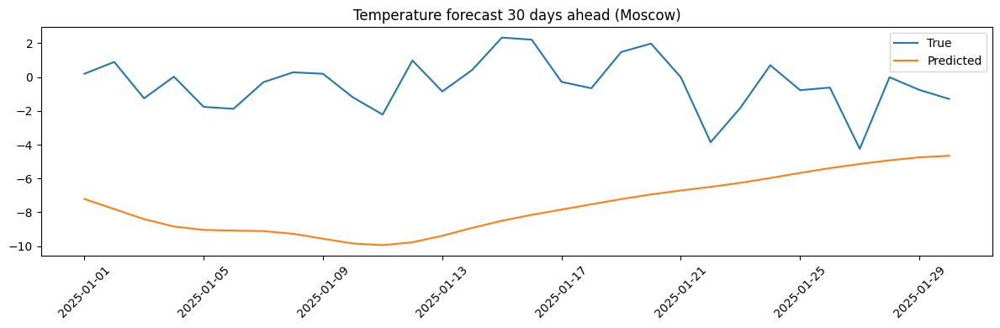

06:07:41 - cmdstanpy - INFO - Chain [1] start processing
06:07:41 - cmdstanpy - INFO - Chain [1] done processing



Moscow: прогноз температуры на каждый день следующего месяца:
  2025-01-01: -7.21°C
  2025-01-02: -7.81°C
  2025-01-03: -8.40°C
  2025-01-04: -8.84°C
  2025-01-05: -9.04°C
  2025-01-06: -9.08°C
  2025-01-07: -9.11°C
  2025-01-08: -9.27°C
  2025-01-09: -9.56°C
  2025-01-10: -9.84°C
  2025-01-11: -9.94°C
  2025-01-12: -9.77°C
  2025-01-13: -9.39°C
  2025-01-14: -8.92°C
  2025-01-15: -8.50°C
  2025-01-16: -8.15°C
  2025-01-17: -7.84°C
  2025-01-18: -7.53°C
  2025-01-19: -7.22°C
  2025-01-20: -6.94°C
  2025-01-21: -6.71°C
  2025-01-22: -6.50°C
  2025-01-23: -6.25°C
  2025-01-24: -5.97°C
  2025-01-25: -5.67°C
  2025-01-26: -5.39°C
  2025-01-27: -5.14°C
  2025-01-28: -4.92°C
  2025-01-29: -4.75°C
  2025-01-30: -4.65°C
Moscow — MAE: 7.21, RMSE: 7.61, MAPE: 3990.6%, WAPE: 609.2%, DirAcc: 55.2%
Shapiro-Wilk p=0.1109, Ljung-Box p=0.0000, White p=0.0006



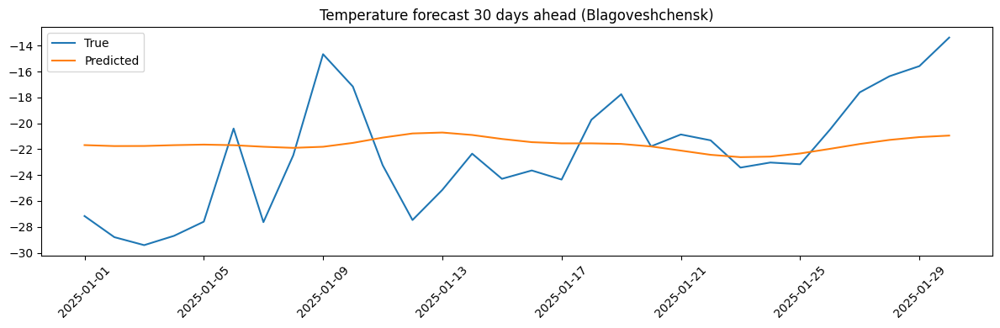

06:07:42 - cmdstanpy - INFO - Chain [1] start processing



Blagoveshchensk: прогноз температуры на каждый день следующего месяца:
  2025-01-01: -21.68°C
  2025-01-02: -21.76°C
  2025-01-03: -21.75°C
  2025-01-04: -21.69°C
  2025-01-05: -21.64°C
  2025-01-06: -21.69°C
  2025-01-07: -21.81°C
  2025-01-08: -21.90°C
  2025-01-09: -21.81°C
  2025-01-10: -21.51°C
  2025-01-11: -21.10°C
  2025-01-12: -20.78°C
  2025-01-13: -20.71°C
  2025-01-14: -20.90°C
  2025-01-15: -21.21°C
  2025-01-16: -21.46°C
  2025-01-17: -21.55°C
  2025-01-18: -21.55°C
  2025-01-19: -21.59°C
  2025-01-20: -21.79°C
  2025-01-21: -22.11°C
  2025-01-22: -22.43°C
  2025-01-23: -22.61°C
  2025-01-24: -22.57°C
  2025-01-25: -22.33°C
  2025-01-26: -21.97°C
  2025-01-27: -21.60°C
  2025-01-28: -21.28°C
  2025-01-29: -21.06°C
  2025-01-30: -20.95°C
Blagoveshchensk — MAE: 3.62, RMSE: 4.37, MAPE: 17.1%, WAPE: 16.2%, DirAcc: 58.6%
Shapiro-Wilk p=0.3517, Ljung-Box p=0.0069, White p=0.2524



06:07:42 - cmdstanpy - INFO - Chain [1] done processing


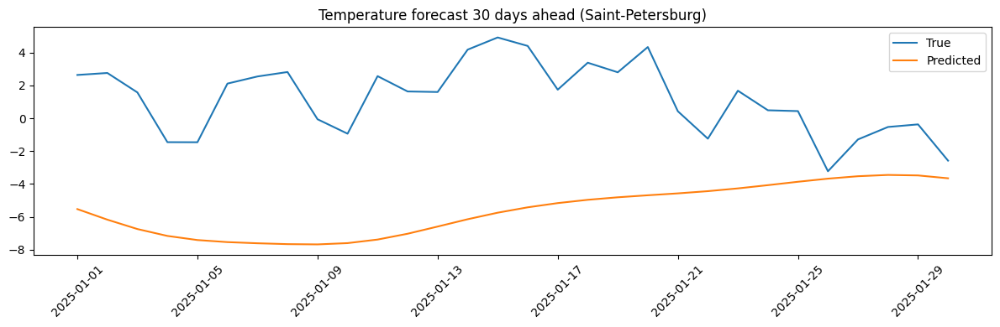

06:07:42 - cmdstanpy - INFO - Chain [1] start processing
06:07:42 - cmdstanpy - INFO - Chain [1] done processing



Saint-Petersburg: прогноз температуры на каждый день следующего месяца:
  2025-01-01: -5.53°C
  2025-01-02: -6.17°C
  2025-01-03: -6.74°C
  2025-01-04: -7.16°C
  2025-01-05: -7.41°C
  2025-01-06: -7.54°C
  2025-01-07: -7.61°C
  2025-01-08: -7.66°C
  2025-01-09: -7.68°C
  2025-01-10: -7.60°C
  2025-01-11: -7.38°C
  2025-01-12: -7.03°C
  2025-01-13: -6.59°C
  2025-01-14: -6.15°C
  2025-01-15: -5.75°C
  2025-01-16: -5.42°C
  2025-01-17: -5.16°C
  2025-01-18: -4.96°C
  2025-01-19: -4.81°C
  2025-01-20: -4.69°C
  2025-01-21: -4.57°C
  2025-01-22: -4.44°C
  2025-01-23: -4.27°C
  2025-01-24: -4.07°C
  2025-01-25: -3.86°C
  2025-01-26: -3.68°C
  2025-01-27: -3.53°C
  2025-01-28: -3.45°C
  2025-01-29: -3.48°C
  2025-01-30: -3.65°C
Saint-Petersburg — MAE: 6.80, RMSE: 7.40, MAPE: 782.1%, WAPE: 327.9%, DirAcc: 55.2%
Shapiro-Wilk p=0.0582, Ljung-Box p=0.0000, White p=0.0003



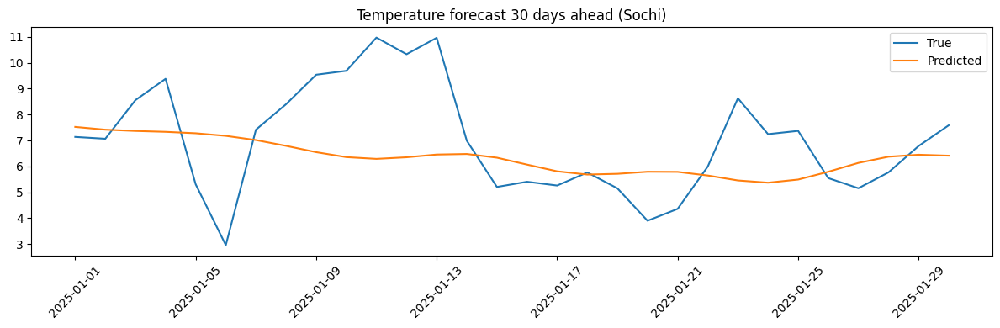

06:07:43 - cmdstanpy - INFO - Chain [1] start processing
06:07:43 - cmdstanpy - INFO - Chain [1] done processing



Sochi: прогноз температуры на каждый день следующего месяца:
  2025-01-01: 7.52°C
  2025-01-02: 7.42°C
  2025-01-03: 7.37°C
  2025-01-04: 7.33°C
  2025-01-05: 7.28°C
  2025-01-06: 7.18°C
  2025-01-07: 7.02°C
  2025-01-08: 6.79°C
  2025-01-09: 6.55°C
  2025-01-10: 6.36°C
  2025-01-11: 6.29°C
  2025-01-12: 6.35°C
  2025-01-13: 6.46°C
  2025-01-14: 6.48°C
  2025-01-15: 6.34°C
  2025-01-16: 6.07°C
  2025-01-17: 5.81°C
  2025-01-18: 5.69°C
  2025-01-19: 5.71°C
  2025-01-20: 5.79°C
  2025-01-21: 5.79°C
  2025-01-22: 5.65°C
  2025-01-23: 5.46°C
  2025-01-24: 5.37°C
  2025-01-25: 5.49°C
  2025-01-26: 5.79°C
  2025-01-27: 6.14°C
  2025-01-28: 6.37°C
  2025-01-29: 6.45°C
  2025-01-30: 6.41°C
Sochi — MAE: 1.64, RMSE: 2.13, MAPE: 24.3%, WAPE: 23.4%, DirAcc: 51.7%
Shapiro-Wilk p=0.5073, Ljung-Box p=0.0007, White p=0.3718



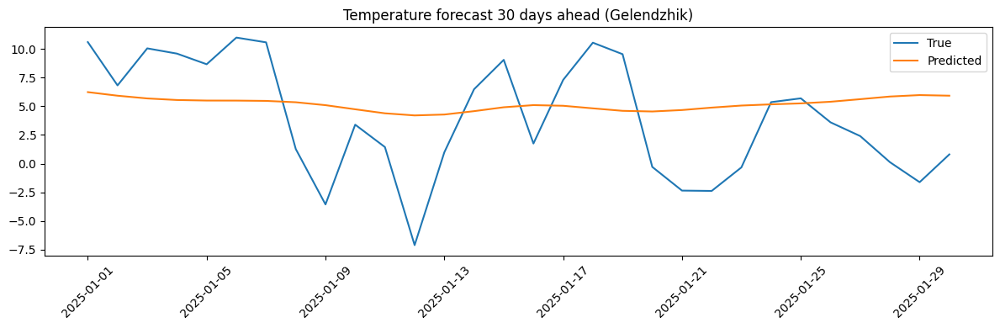


Gelendzhik: прогноз температуры на каждый день следующего месяца:
  2025-01-01: 6.24°C
  2025-01-02: 5.93°C
  2025-01-03: 5.69°C
  2025-01-04: 5.55°C
  2025-01-05: 5.51°C
  2025-01-06: 5.50°C
  2025-01-07: 5.48°C
  2025-01-08: 5.36°C
  2025-01-09: 5.10°C
  2025-01-10: 4.74°C
  2025-01-11: 4.39°C
  2025-01-12: 4.21°C
  2025-01-13: 4.29°C
  2025-01-14: 4.58°C
  2025-01-15: 4.92°C
  2025-01-16: 5.11°C
  2025-01-17: 5.05°C
  2025-01-18: 4.83°C
  2025-01-19: 4.61°C
  2025-01-20: 4.55°C
  2025-01-21: 4.68°C
  2025-01-22: 4.89°C
  2025-01-23: 5.07°C
  2025-01-24: 5.17°C
  2025-01-25: 5.26°C
  2025-01-26: 5.40°C
  2025-01-27: 5.63°C
  2025-01-28: 5.86°C
  2025-01-29: 5.98°C
  2025-01-30: 5.93°C
Gelendzhik — MAE: 4.34, RMSE: 4.98, MAPE: 377.5%, WAPE: 84.0%, DirAcc: 55.2%
Shapiro-Wilk p=0.1094, Ljung-Box p=0.1129, White p=0.1611



/var/folders/cl/10rb4d_j5nvg0_p_dz6zdh840000gn/T/ipykernel_91804/365683390.py:11: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(prophet_residuals, labels=prophet_city_labels)


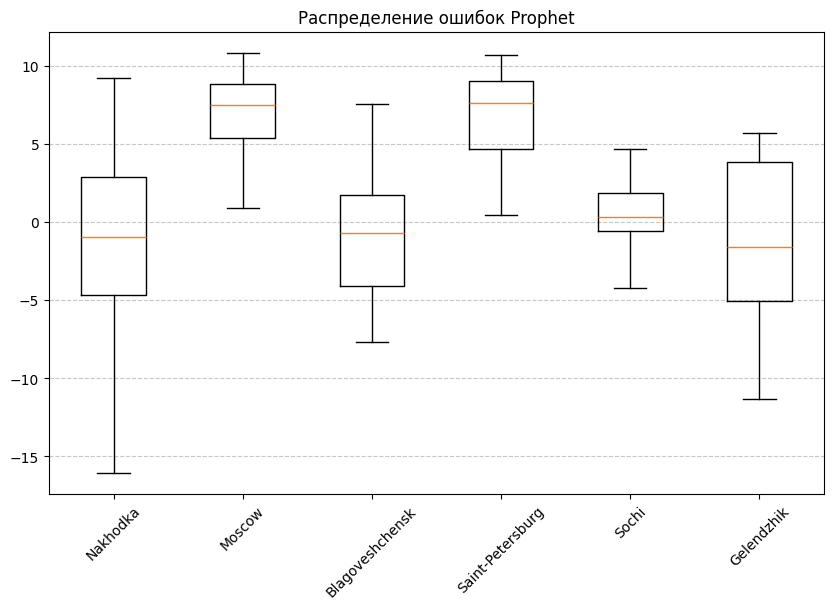

In [52]:
prophet_residuals = []
prophet_city_labels = []

for city_name, df_city in zip(CITIES_LIST, dfs):
    res = train_forecast_model_prophet(df_city, city_name)
    if res is not None and len(res['residuals']) > 0:
        prophet_residuals.append(res['residuals'])
        prophet_city_labels.append(city_name)

plt.figure(figsize=(10,6))
plt.boxplot(prophet_residuals, labels=prophet_city_labels)
plt.title('Распределение ошибок Prophet')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

XGBoost и LightGBM показали очень похожие результаты. Лучше всего они работают для Геленджика и Сочи — там ошибка (WAPE) около 20-22%, а хуже всего для Москвы и Санкт-Петербурга — ошибка до 42%. По направлению изменения температуры модели угадывают чуть лучше половины случаев (около 50%). Все статистические тесты показали, что остатки моделей не идеальны — есть автокорреляция и непостоянство ошибок.

Prophet предсказывает температуру на каждый день следующего месяца. Он отлично справился с Сочи (ошибка всего 1.6 градусов) и Благовещенском (WAPE 16%), но полностью провалился в Москве и Петербурге — там ошибка огромная, больше 300%. Интересно, что у Prophet почти нет выбросов на боксплоте, то есть его ошибки более стабильны по величине, но в некоторых городах они просто очень большие.

В итоге, для стабильного прогноза на месяц лучше использовать XGBoost или LightGBM — они дают предсказуемую ошибку 3-4 градуса для всех городов. Prophet стоит применять только для тех городов, где он показал хороший результат, например для Сочи или Благовещенска. Направление изменения температуры ни одна модель толком не предсказывает.

В рамках работы я использовал три модели: XGBoost, LightGBM и Prophet. Первые две — это градиентный бустинг, третья — модель, специально созданная для прогнозирования временных рядов с сезонностью.

Почему для разных климатических зон могут быть оптимальны разные модели?

Климатические зоны отличаются характером изменения температуры. Например, в Сочи и Геленджике климат мягкий, перепады температуры небольшие, сезонность выражена чётко. Здесь Prophet показал отличные результаты (ошибка MAE 1.6–4.3 градусов), потому что он хорошо улавливает повторяющиеся годовые циклы.
В Благовещенске климат резко континентальный — зимой очень холодно, летом жарко, но при этом смена сезонов стабильна. Prophet здесь тоже сработал хорошо (WAPE 16%). А бустинги (XGBoost/LightGBM) справились чуть хуже, но тоже приемлемо.
В Москве и Санкт-Петербурге климат неустойчивый, частые оттепели зимой и похолодания летом, температура часто переходит через ноль. Здесь Prophet «провалился» — ошибка WAPE достигла 327–609%. Это связано с тем, что Prophet сильно опирается на среднюю сезонность и плохо реагирует на резкие аномалии. В то же время бустинги показали стабильные результаты (MAE около 3–4 градусов), потому что они используют больше признаков (влажность, давление, ветер, лаги температуры) и могут адаптироваться к нестандартным ситуациям.
Таким образом, для устойчивых климатов с чёткой сезонностью можно использовать Prophet, а для нестабильных или переходных зон лучше подходят бустинговые модели, которые учитывают много факторов.

Какие модели точно не подойдут для прогнозирования на месяц и почему?

- Линейная регрессия без лагов — она не учитывает автокорреляцию (зависимость температуры от предыдущих дней). Прогноз на месяц будет просто средним значением или линейным трендом, что для погоды не работает.

- Скользящее среднее (MA) или экспоненциальное сглаживание — эти методы сглаживают ряд, но не могут предсказать резкие изменения и долгосрочную сезонность. На месячном горизонте они дадут очень инерционный прогноз (например, будет предсказывать температуру, близкую к последним дням).

- Случайный лес — он плохо экстраполирует за пределы обученных значений. Если в обучающей выборке не было температуры -30 в январе, модель не сможет её предсказать. А для климата Благовещенска такие морозы обычны, но могут не попасть в обучающий период.

- SARIMA без подбора параметров — хотя SARIMA создана для сезонных рядов, она требует стационарности и правильной настройки порядка. Для разных городов параметры будут сильно различаться, и без автоматического подбора модель покажет плохие результаты. К тому же SARIMA не использует внешние признаки (влажность, давление), которые важны для точного прогноза.

В итоге, для месячного прогноза температуры лучше всего подходят градиентный бустинг (XGBoost, LightGBM) или специализированные модели вроде Prophet, но с проверкой на конкретном городе.

Что можно было бы сделать лучше?

Добавить больше данных — например, данные за 10–15 лет вместо 5. Чем больше истории, тем лучше модель понимает климатические циклы и редкие аномалии.

Использовать ансамбль моделей — объединить предсказания XGBoost, LightGBM и Prophet (взвешенное среднее). Это часто даёт более стабильный результат, чем каждая модель по отдельности.

Применить LSTM или GRU — эти нейросети специально созданы для временных рядов и могли бы лучше улавливать долгосрочные зависимости. Особенно это помогло бы для Москвы и Петербурга, где Prophet провалился.

Добавить внешние признаки — например, индексы Северо-Атлантического колебания, фазы Эль-Ниньо, данные с атмосферных зондов. Это могло бы улучшить предсказание аномалий.

Настроить гиперпараметры для каждого города отдельно — сейчас параметры моделей были одинаковыми для всех городов. Подбор под каждый климат мог бы повысить точность.

Препядствия:

Недостаточно вычислительных ресурсов — LSTM и GRU требуют много памяти и времени для обучения, особенно на почасовых данных за несколько лет

Ограниченный объём данных - достаточно для бустингов, но для LSTM желательно 10+ лет, чтобы сеть не переобучалась

Prophet плохо масштабируется — на почасовых данных он работал очень медленно, поэтому пришлось агрегировать до среднесуточных значений

['Nakhodka', 'Moscow', 'Blagoveshchensk', 'Saint-Petersburg', 'Sochi', 'Gelendzhik']
---- EDA для Nakhodka ----


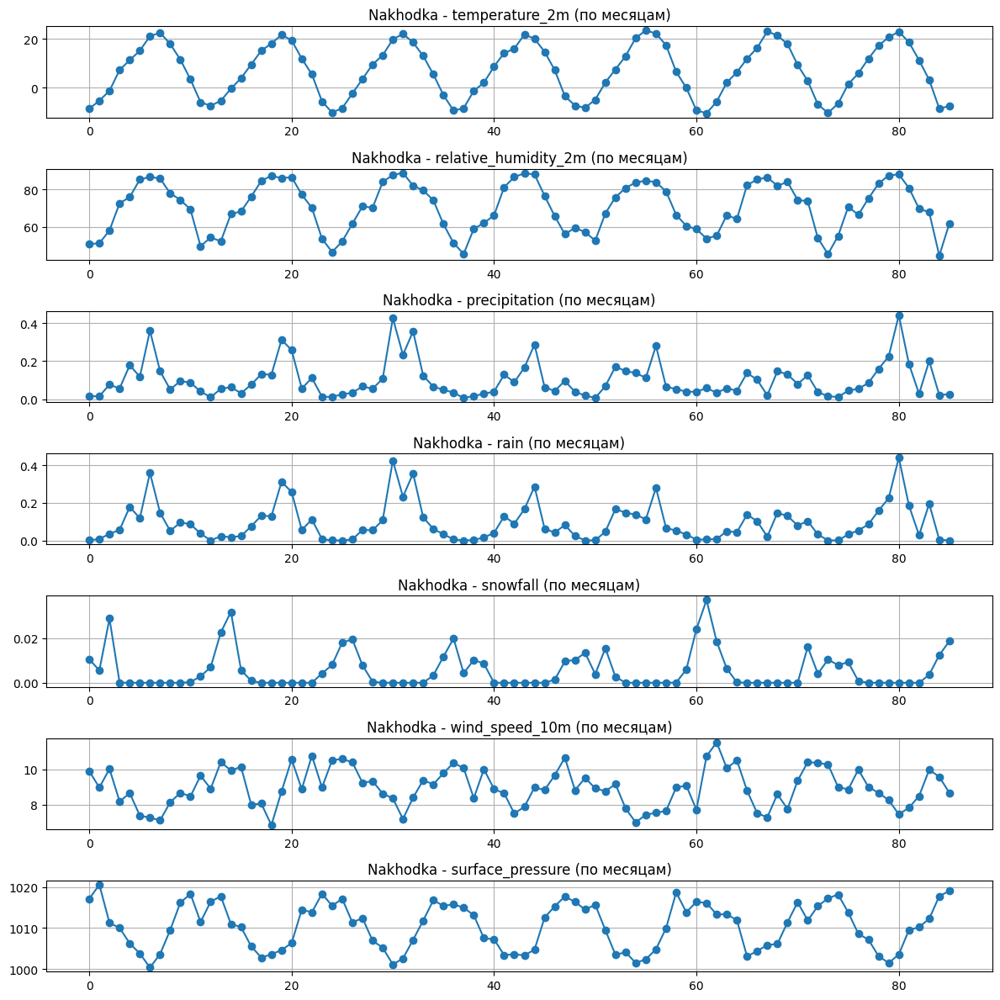

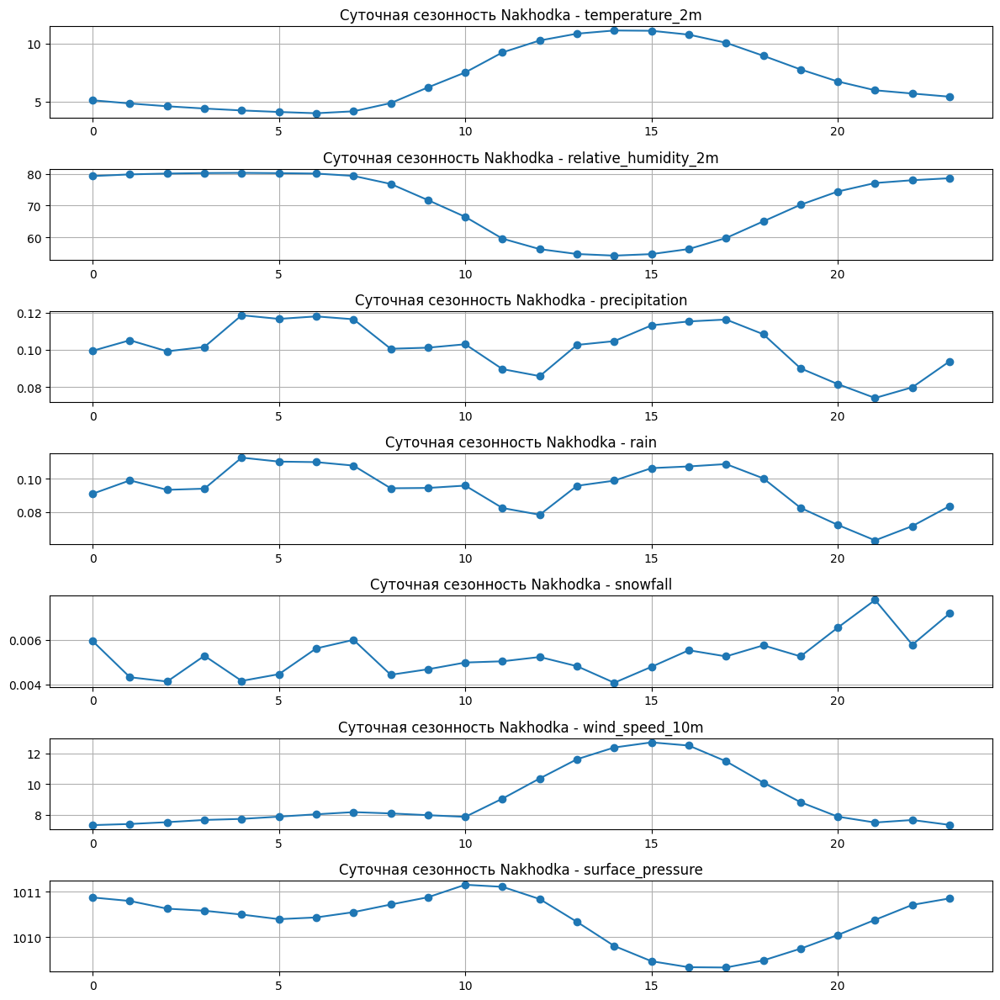

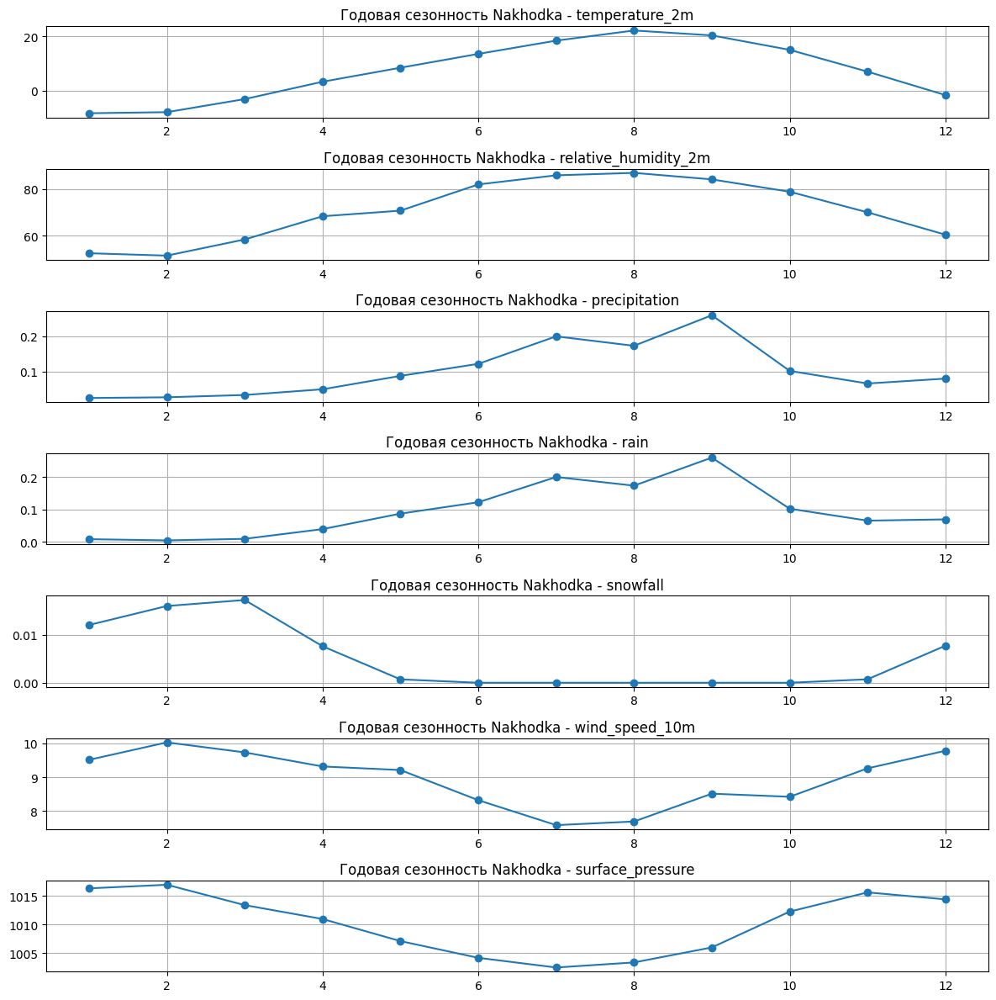

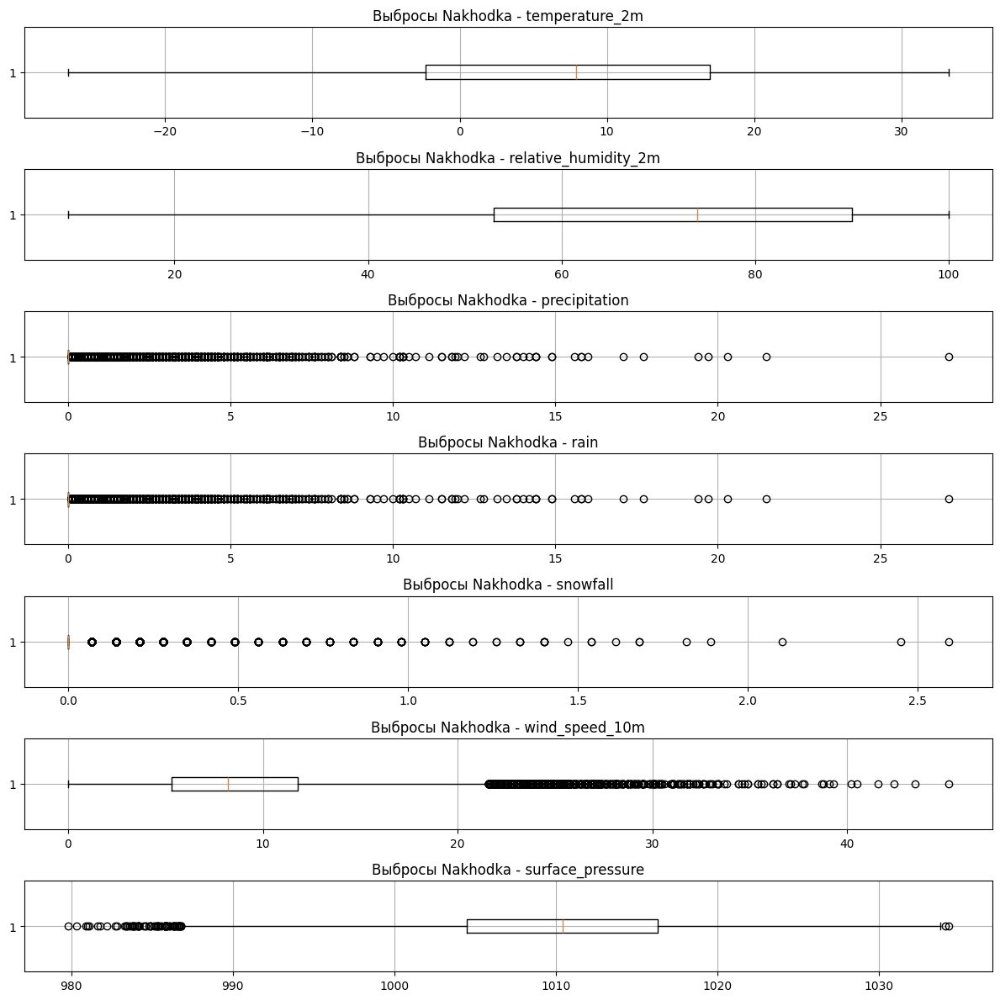

---- EDA для Moscow ----


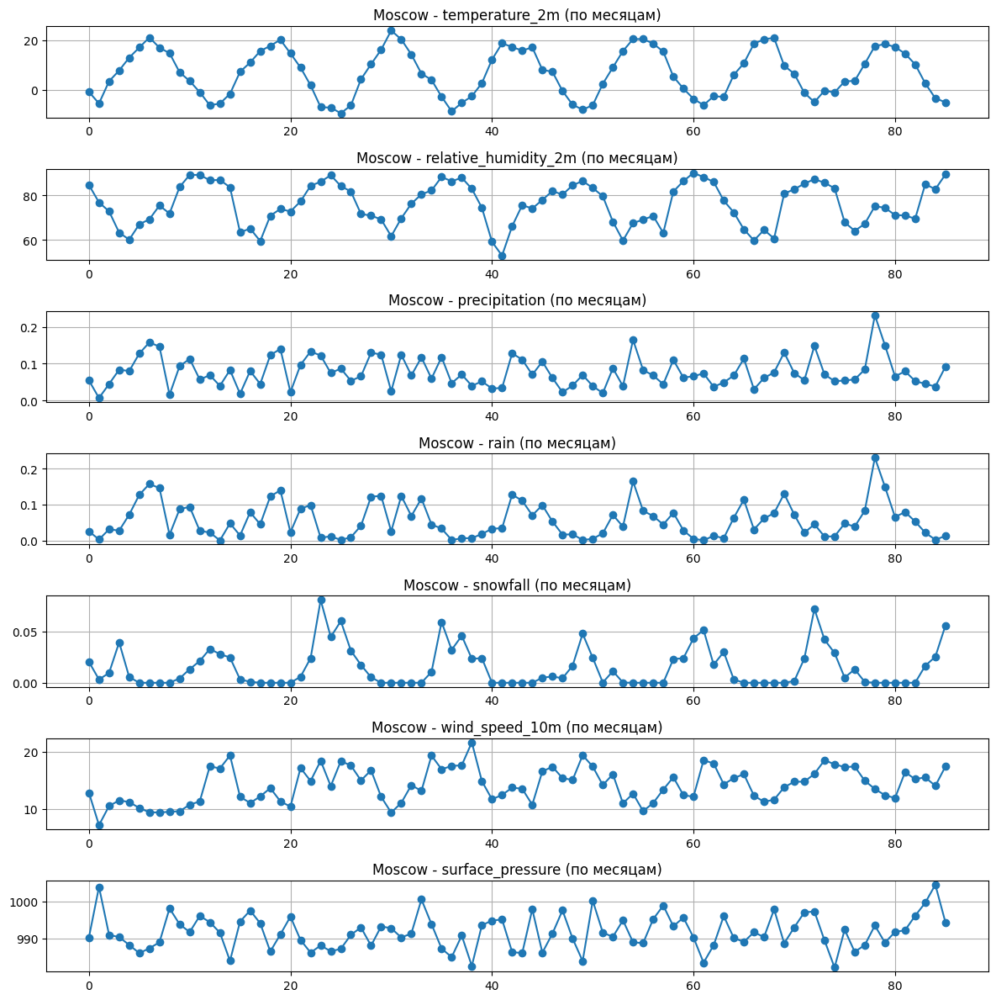

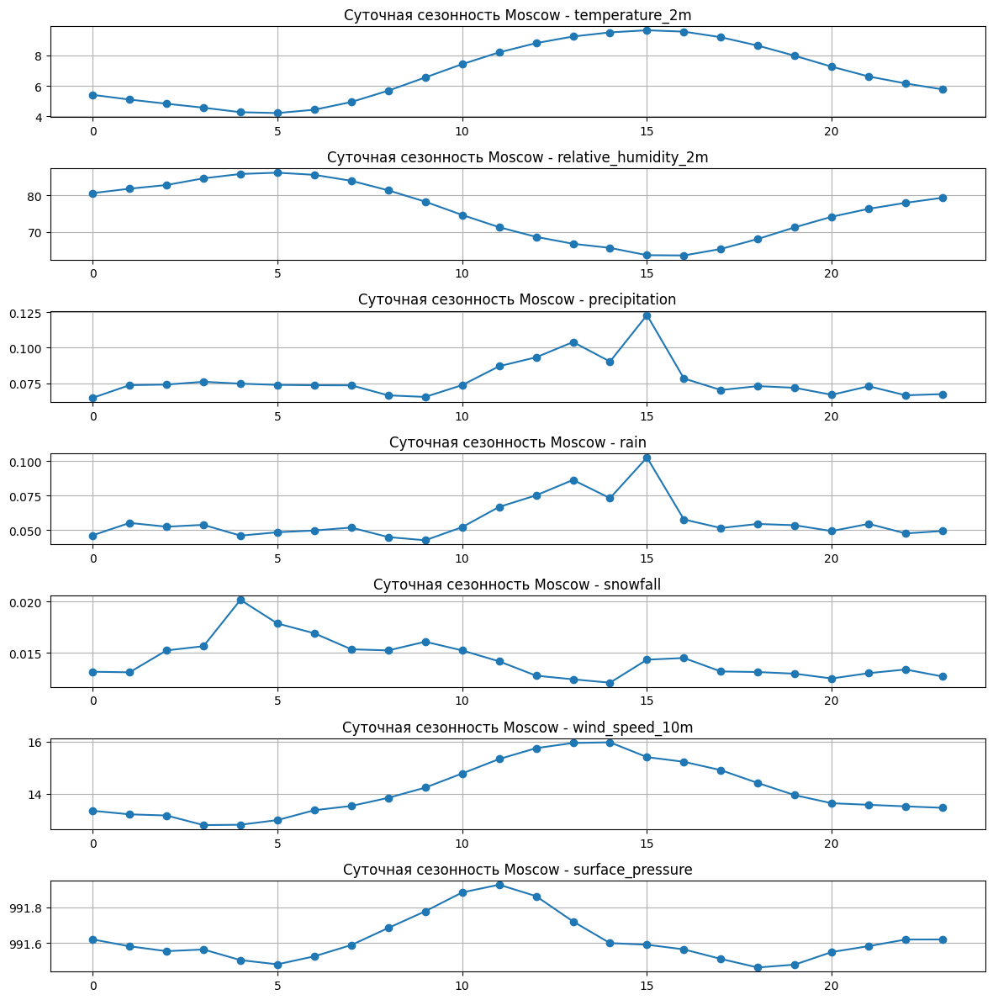

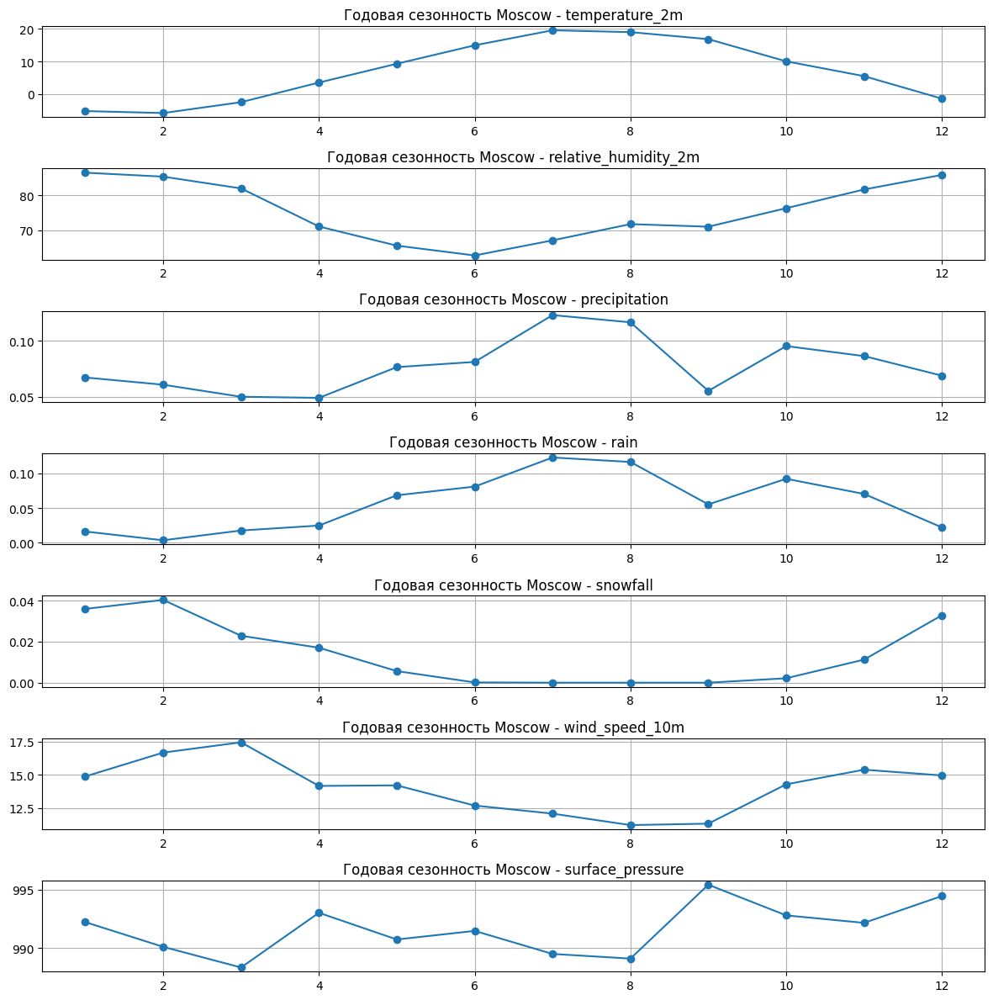

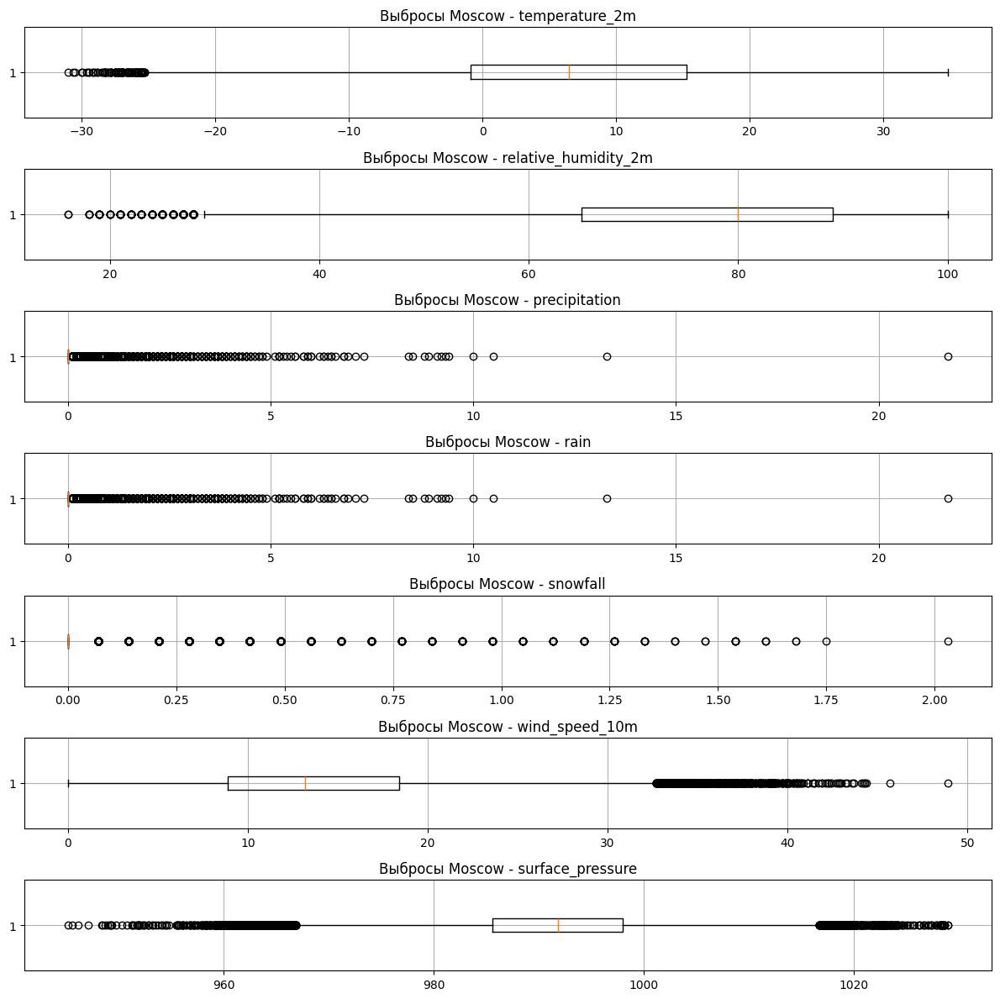

---- EDA для Blagoveshchensk ----


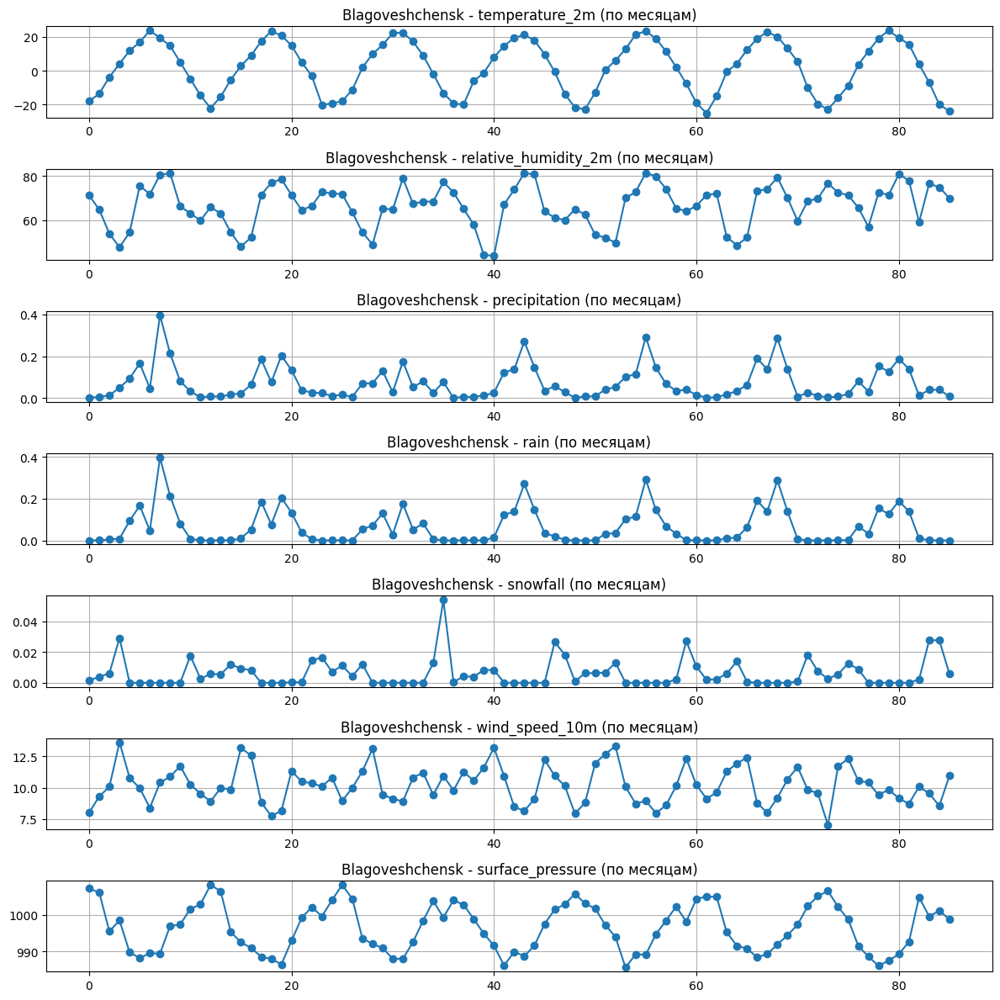

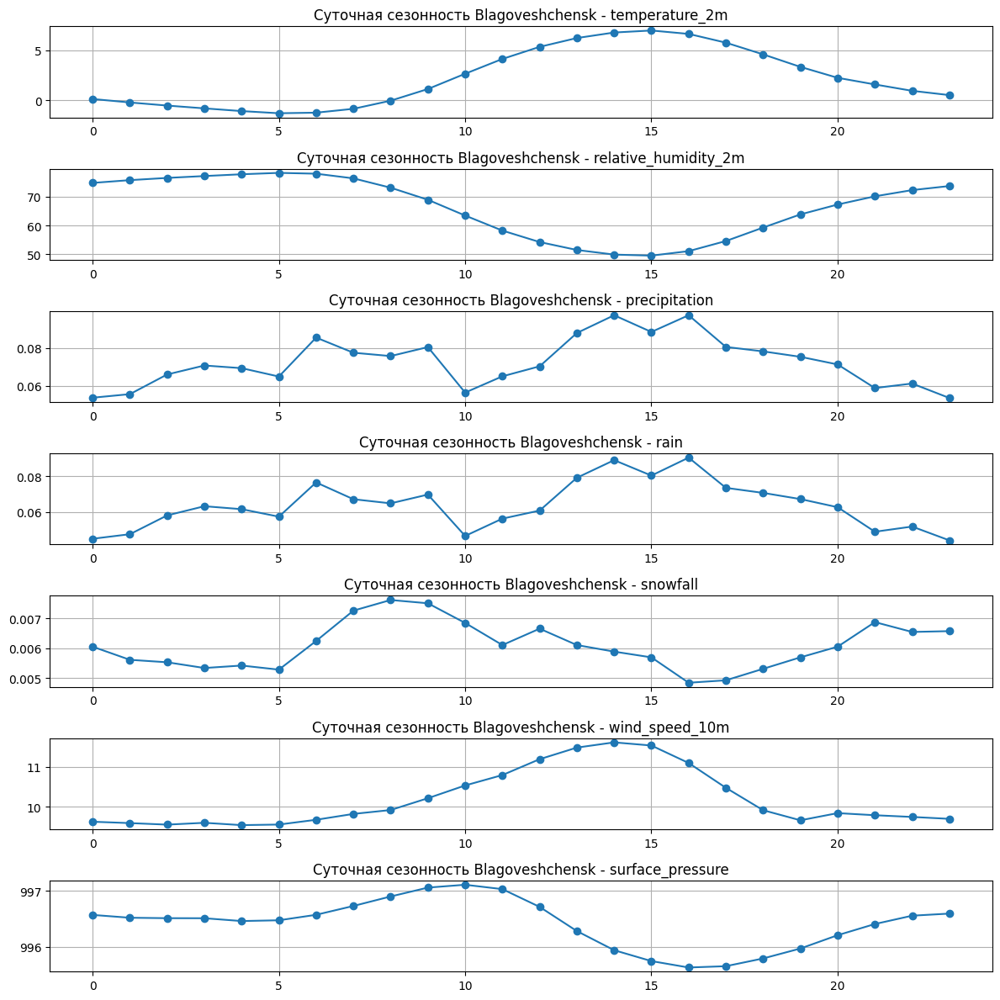

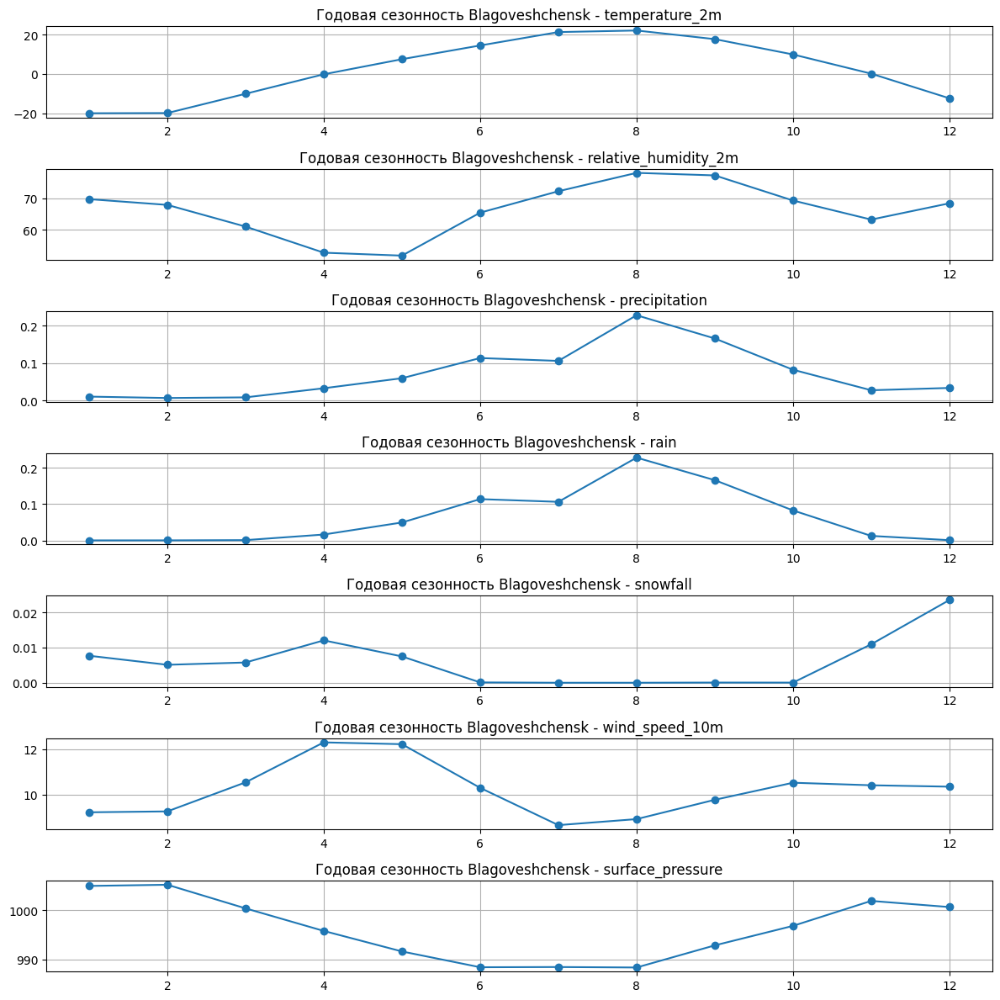

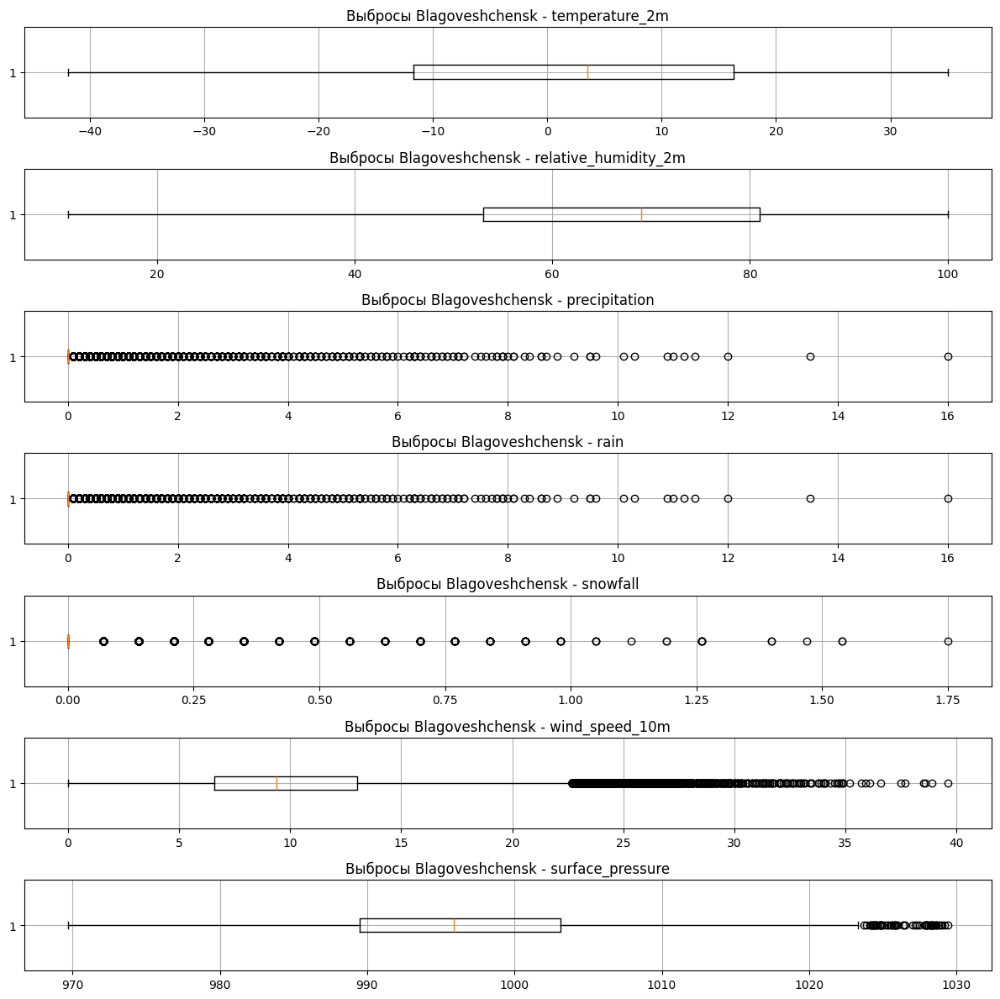

---- EDA для Saint-Petersburg ----


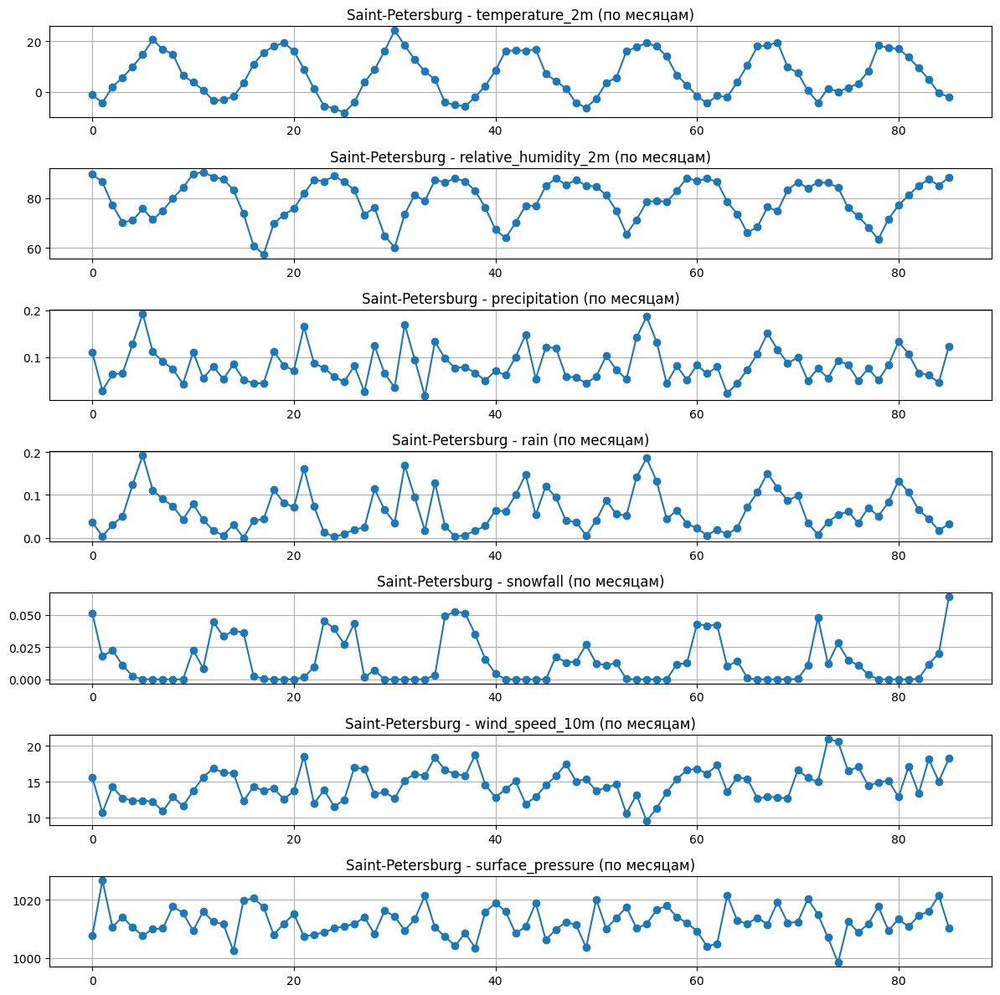

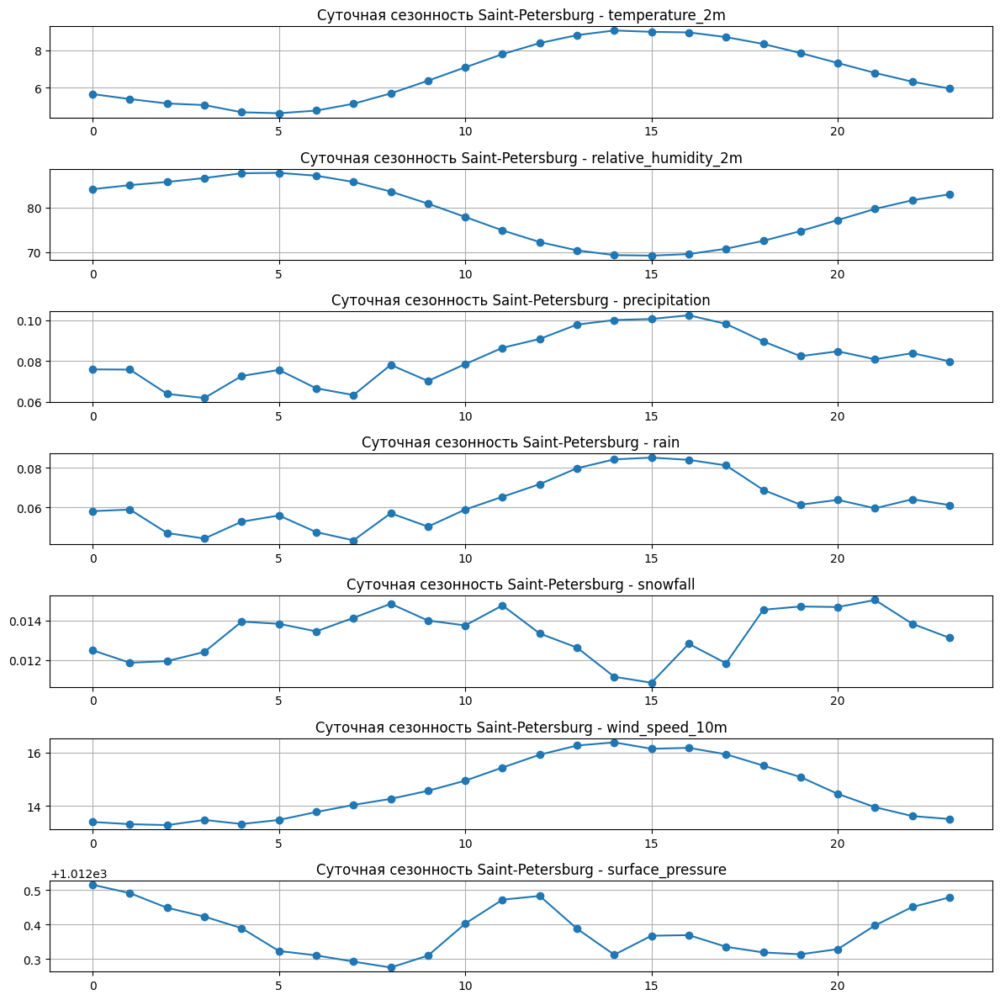

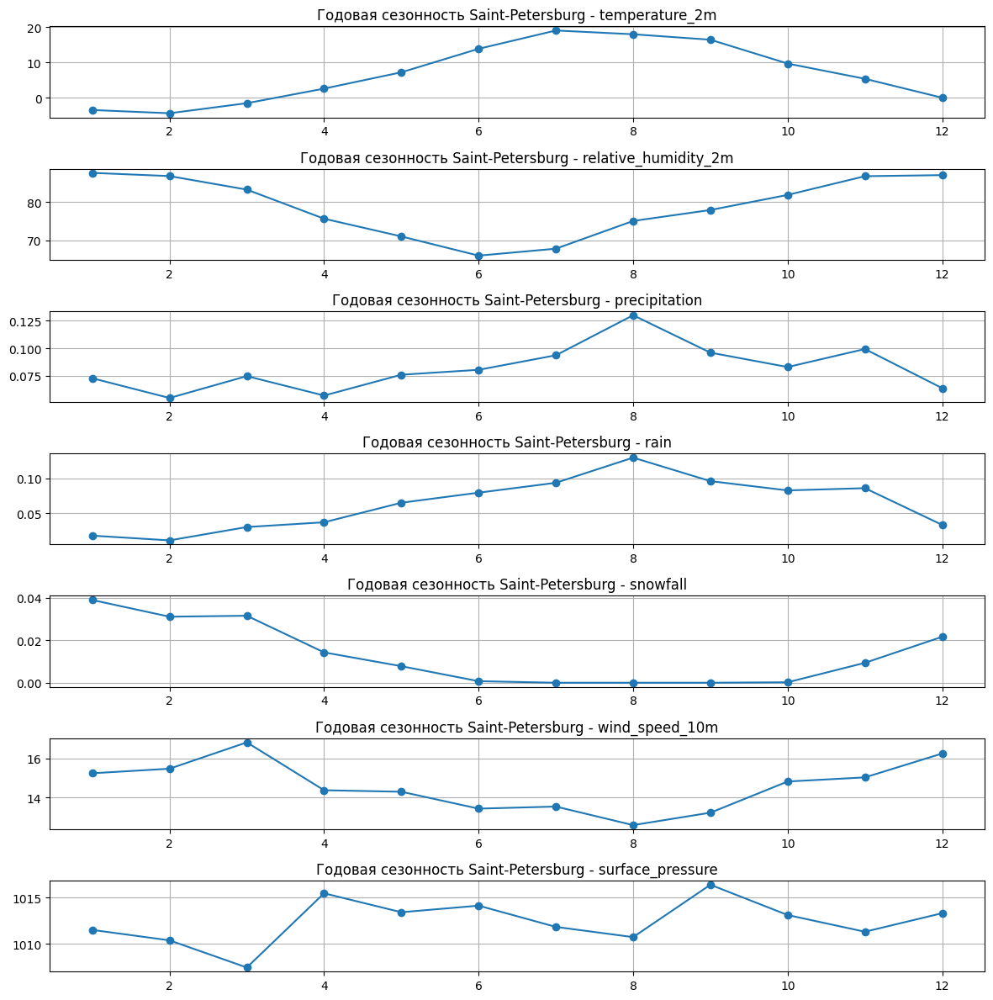

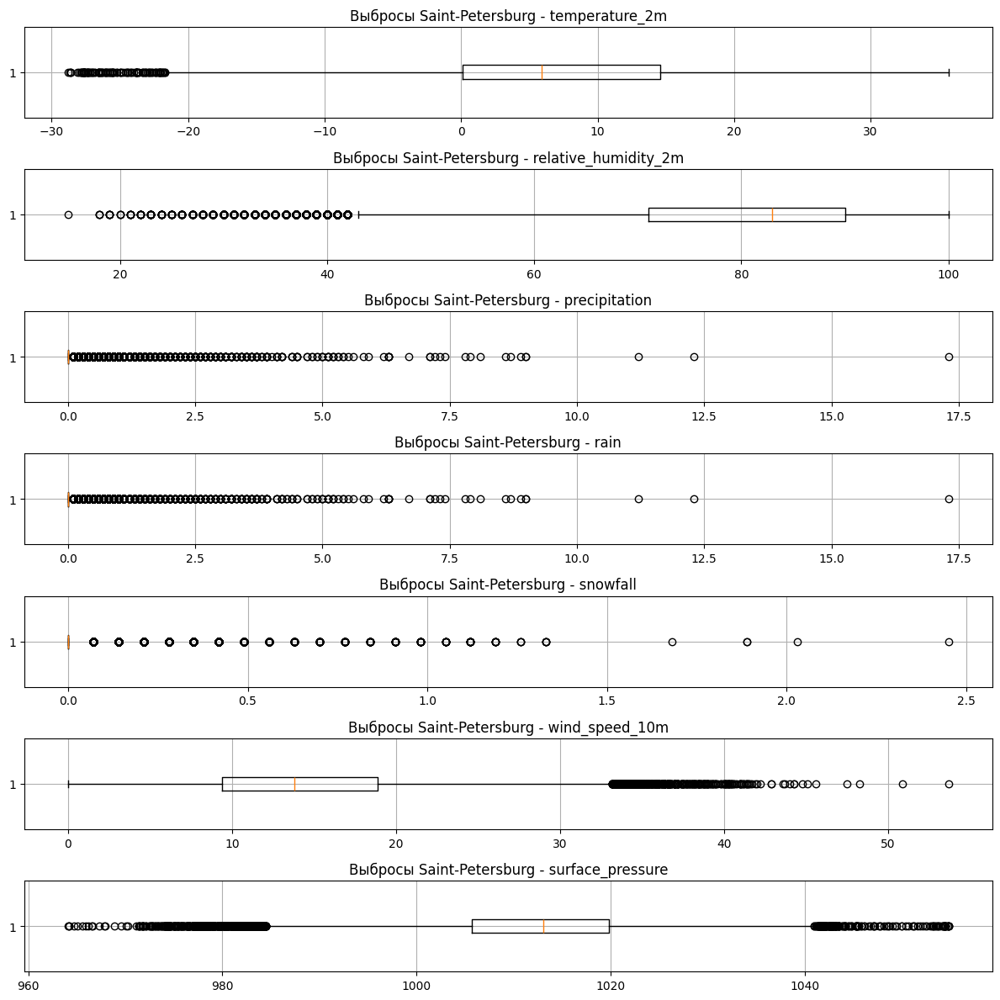

---- EDA для Sochi ----


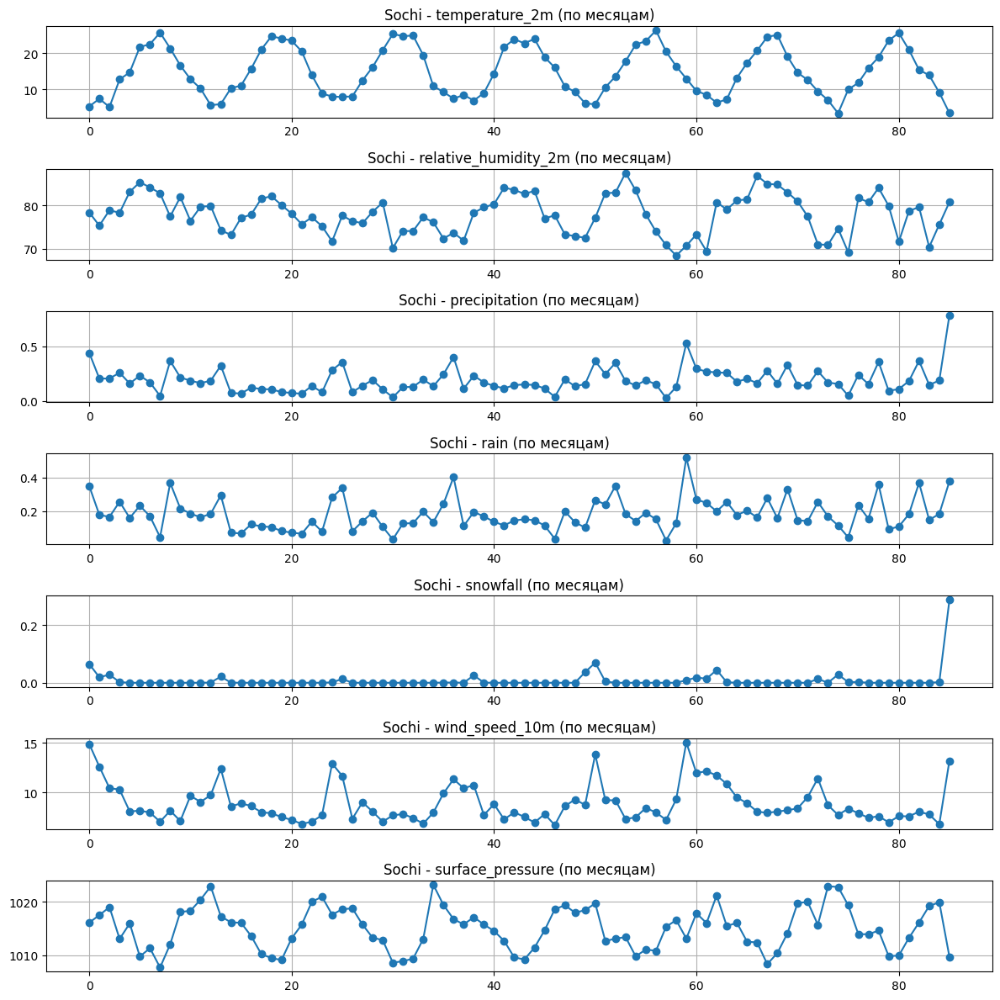

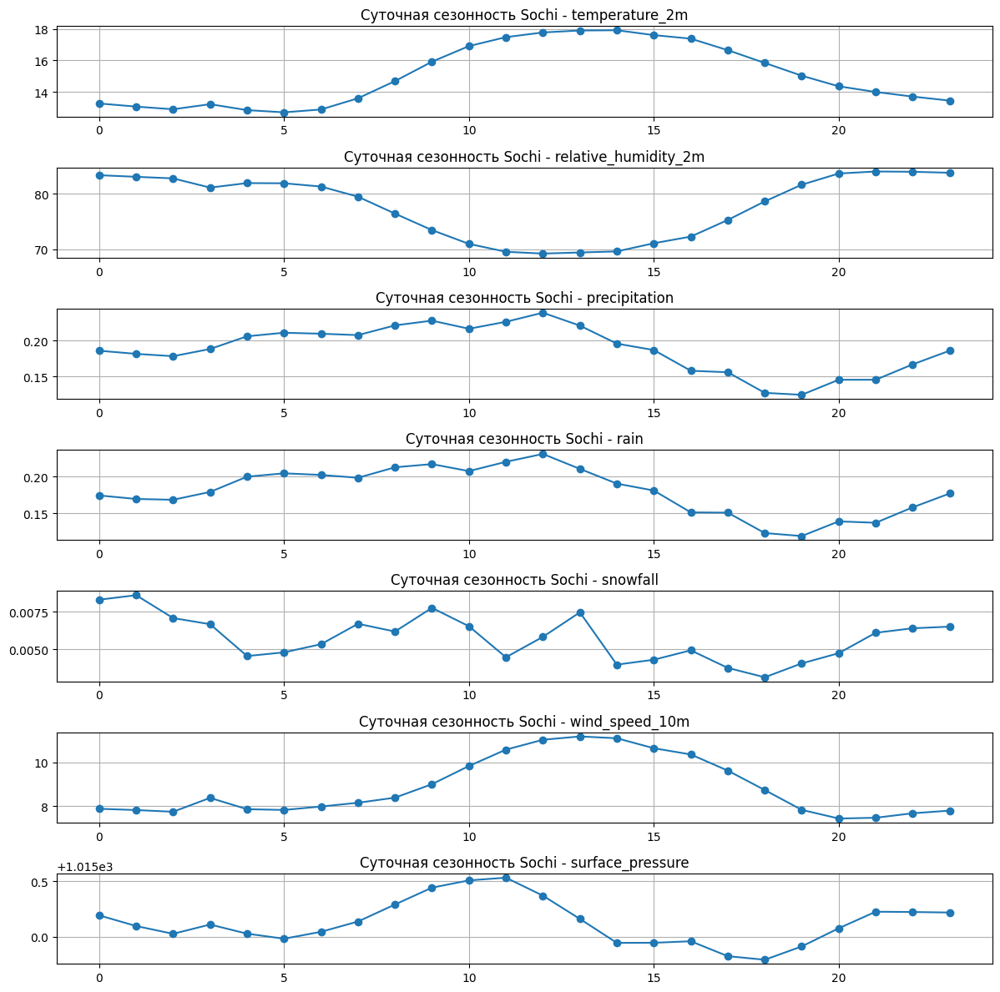

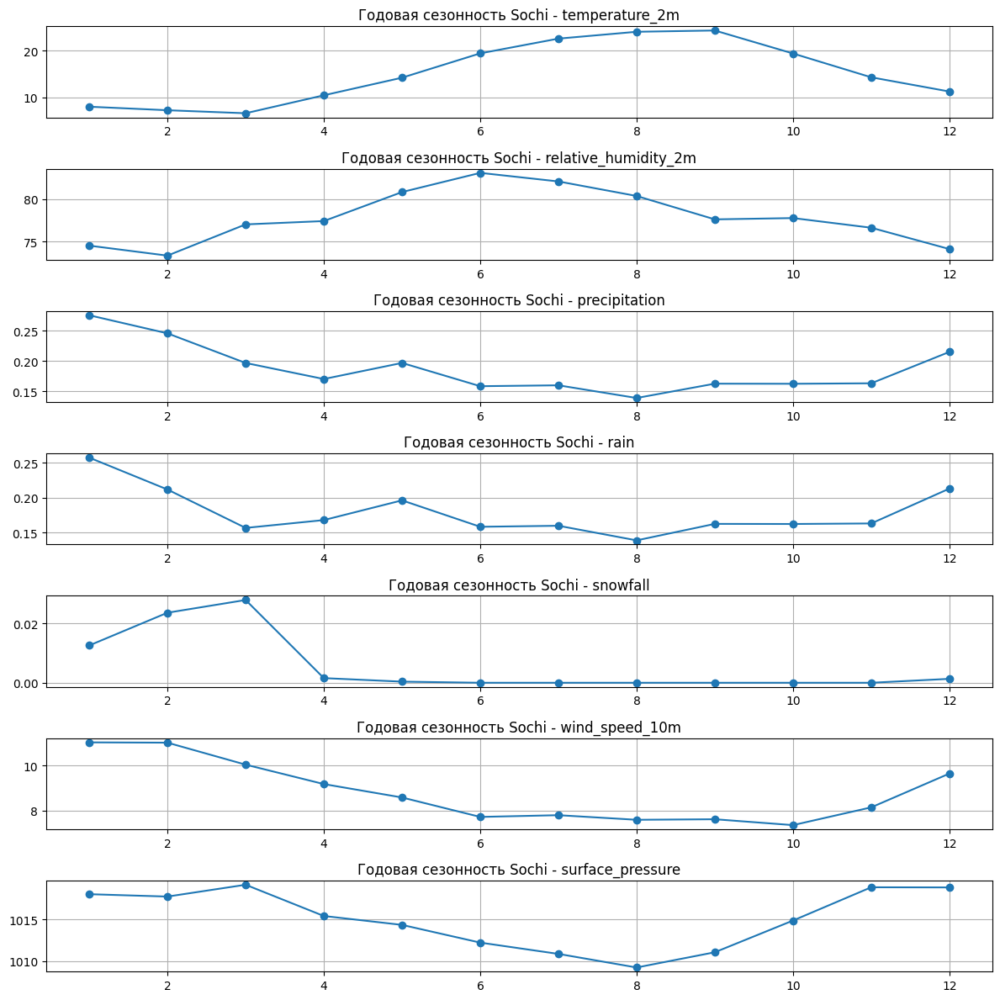

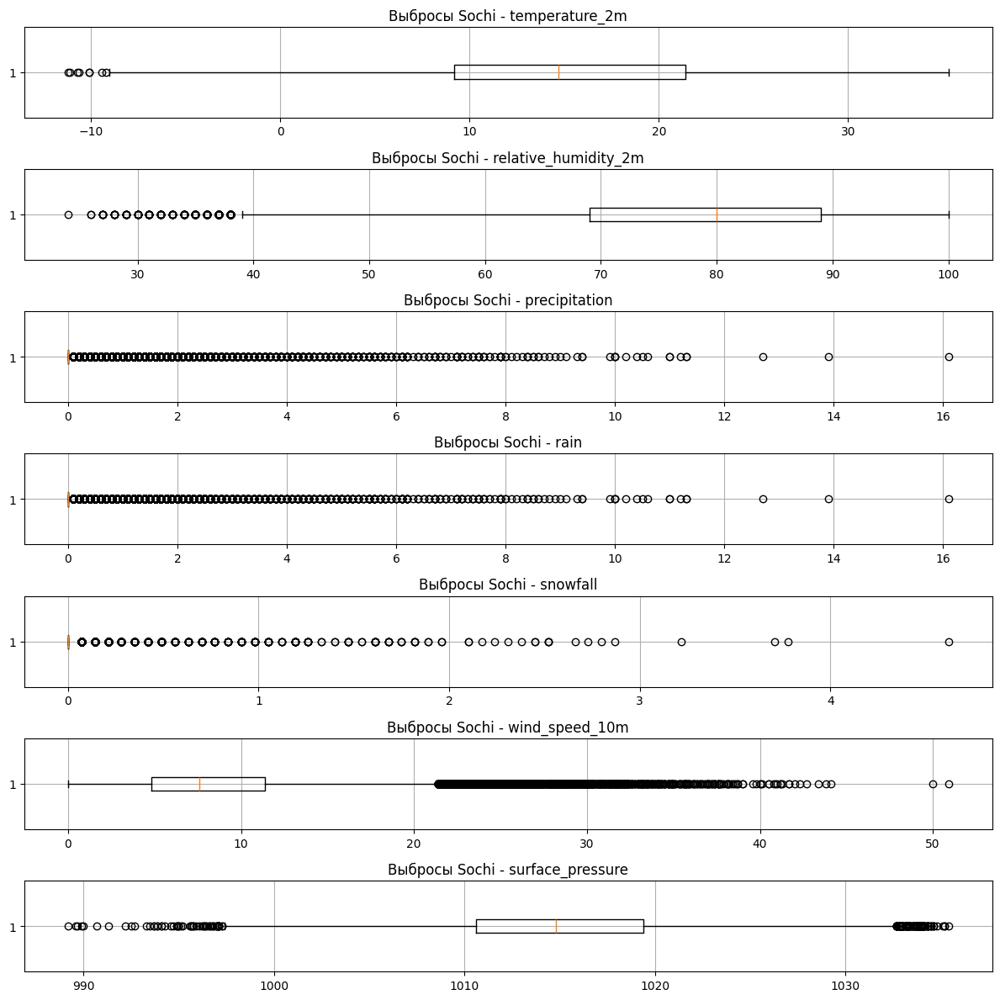

---- EDA для Gelendzhik ----


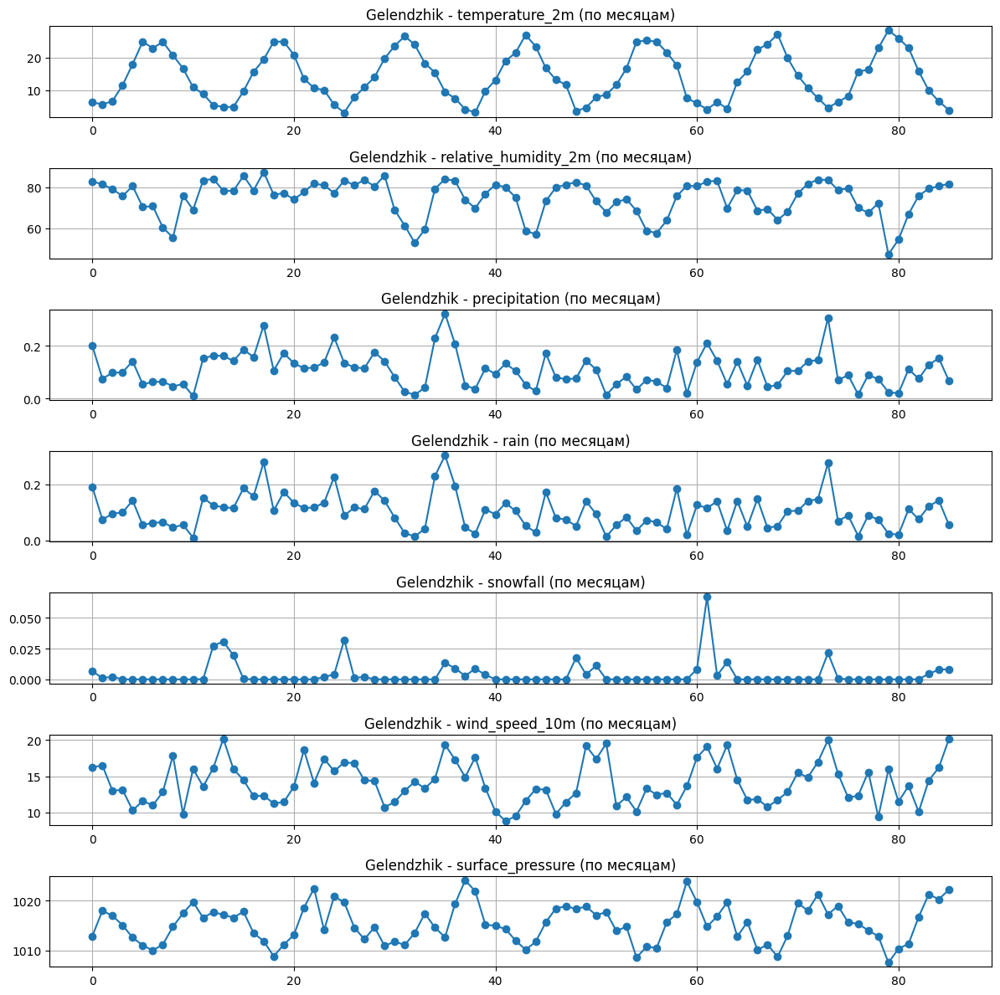

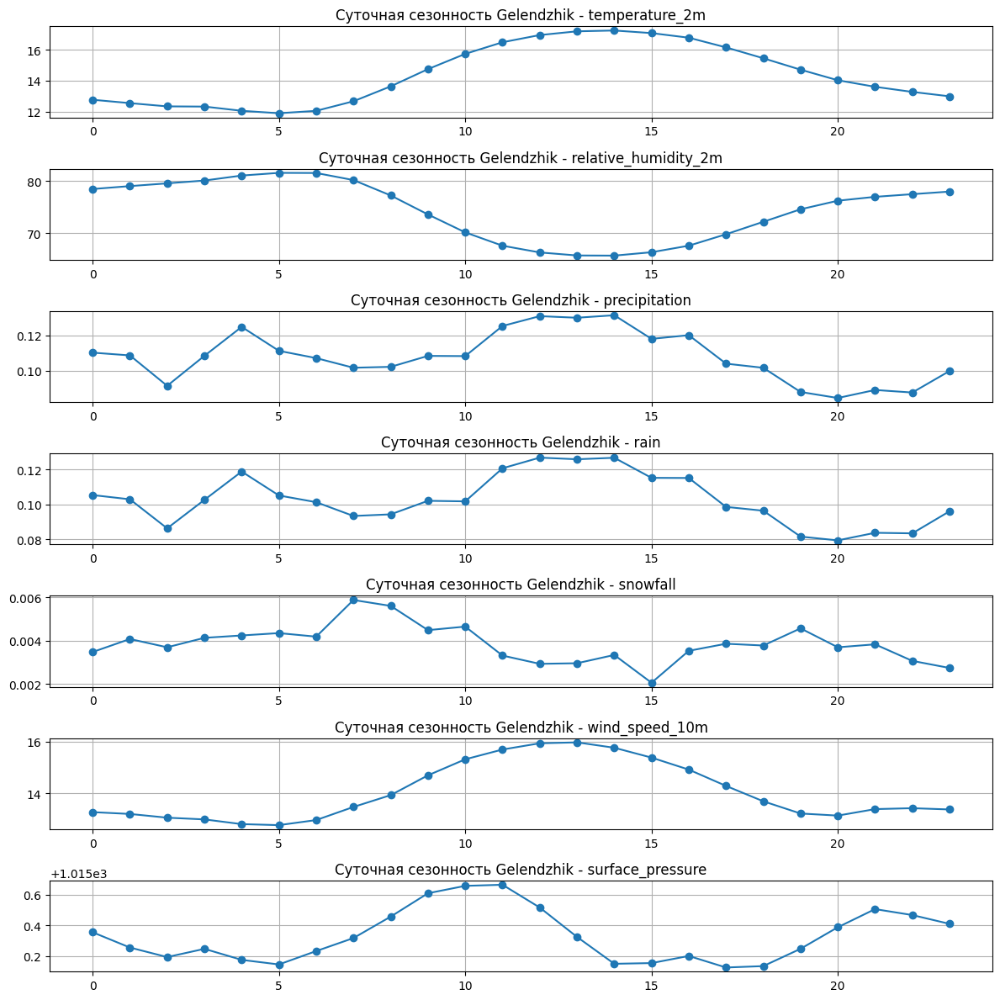

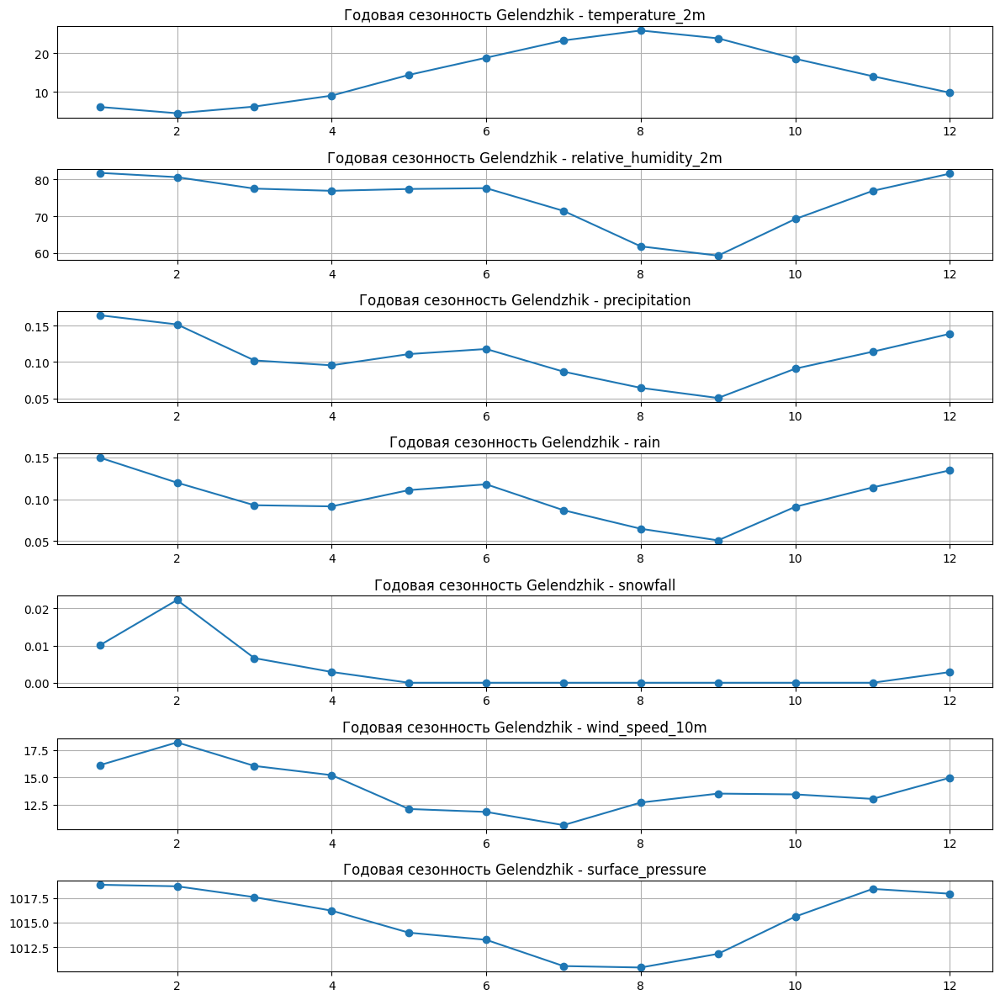

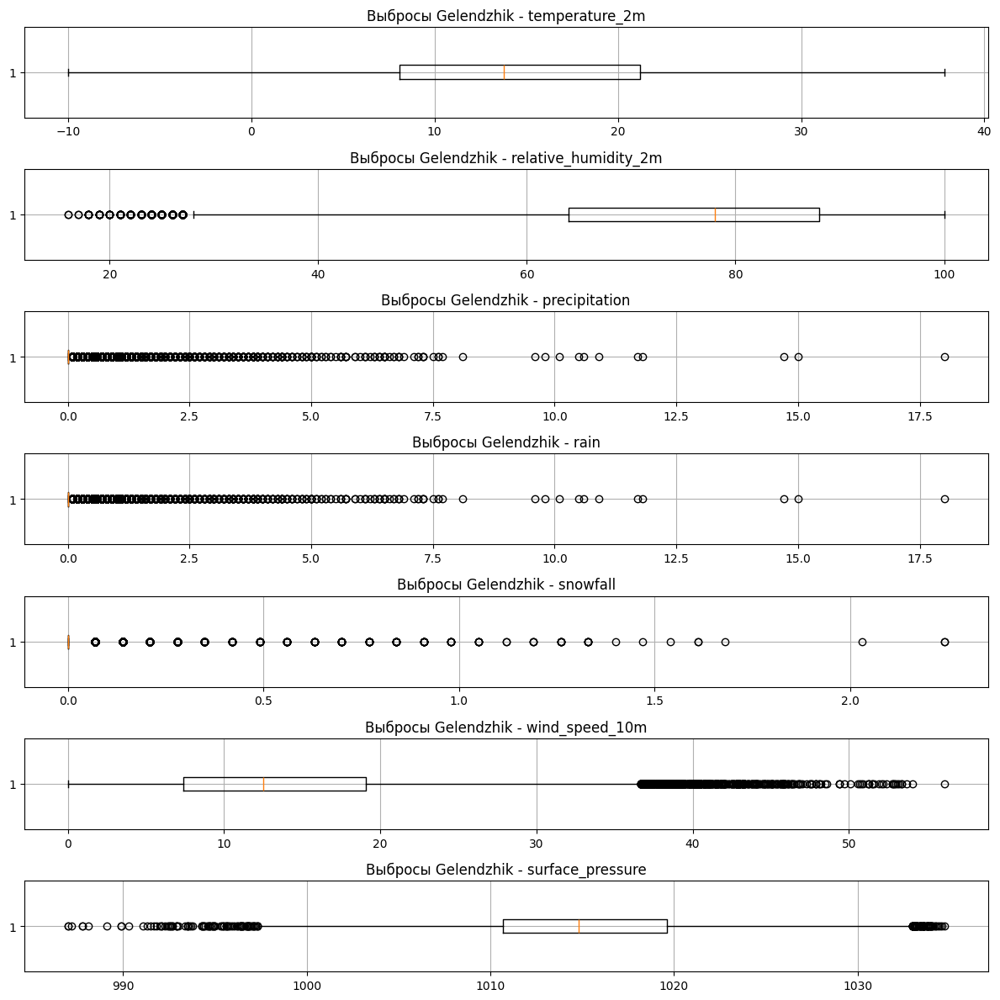

---- Распределения для Nakhodka ----


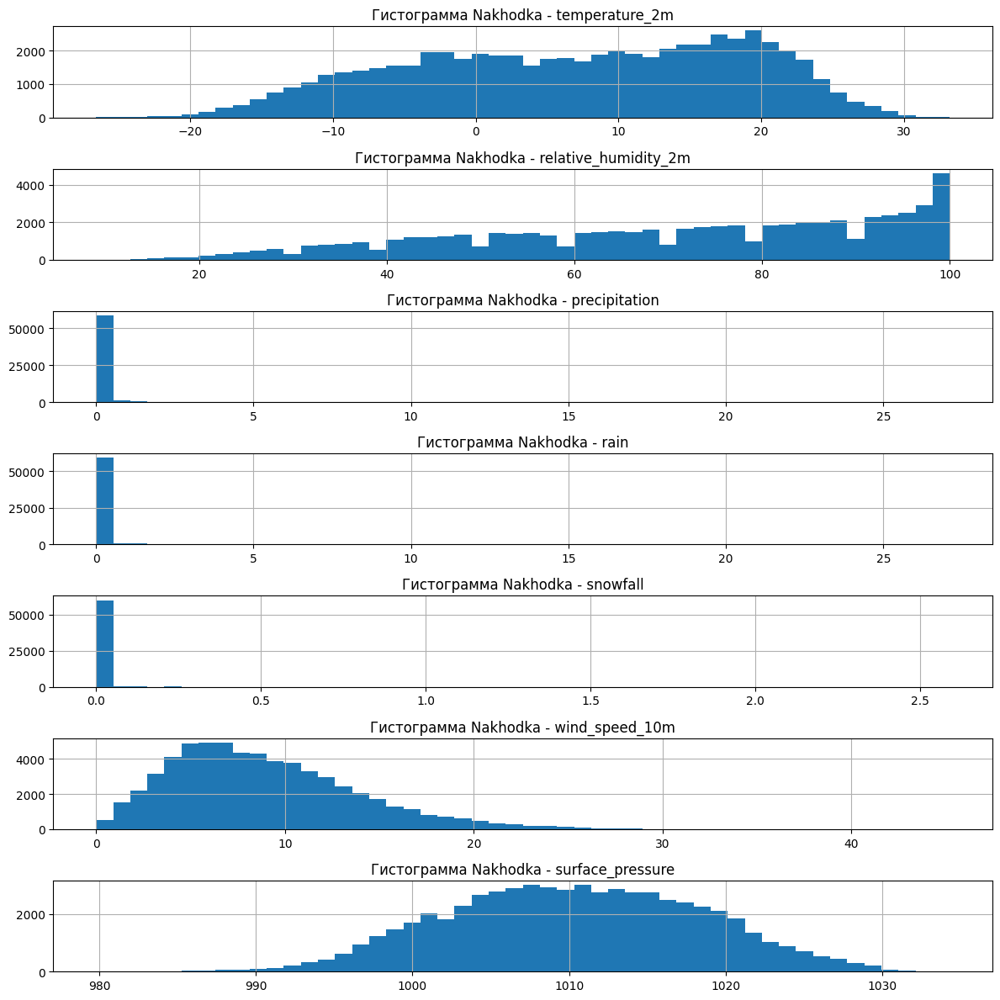

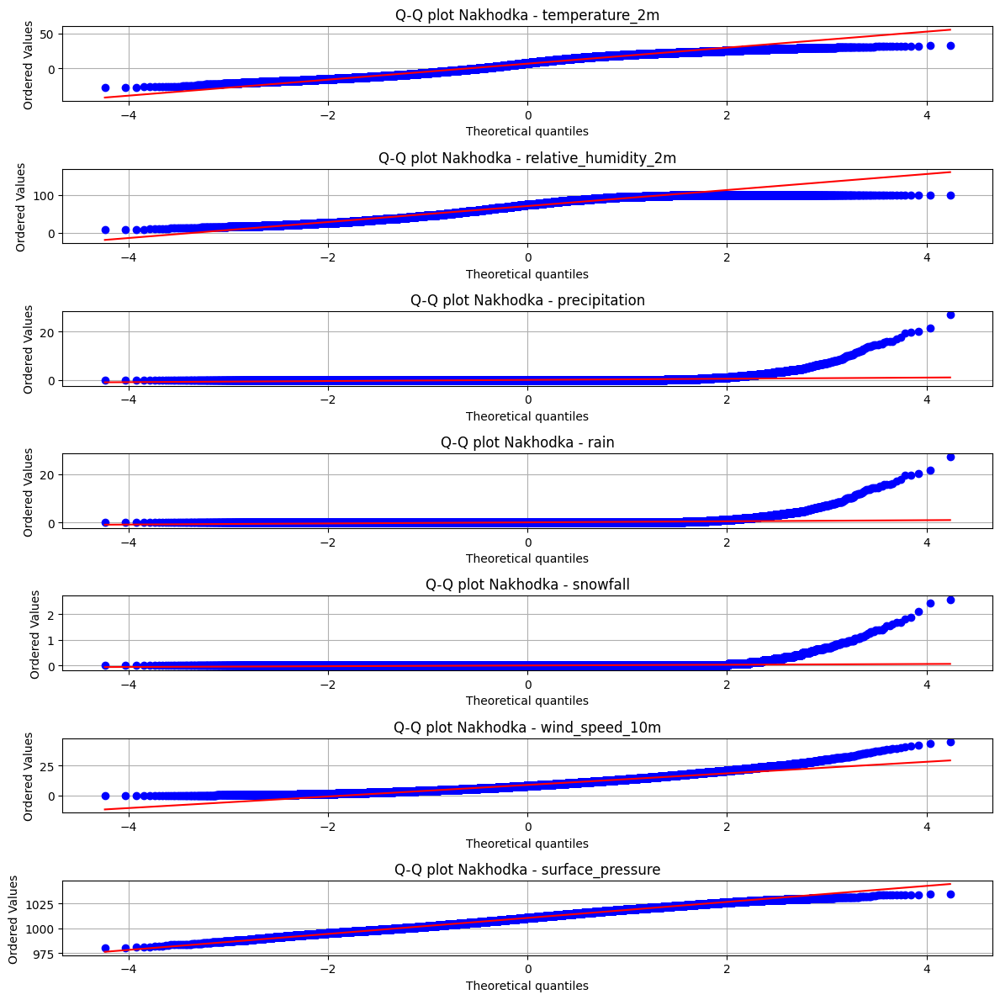

---- Распределения для Moscow ----


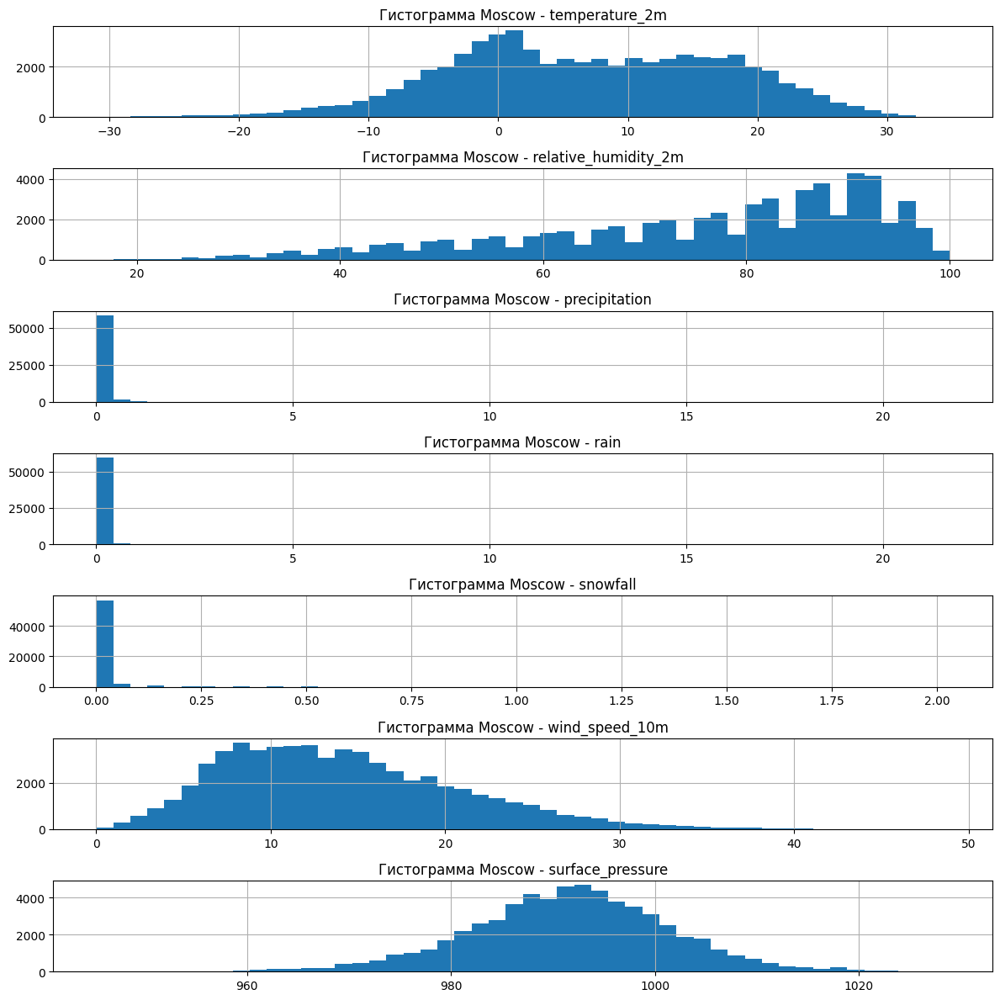

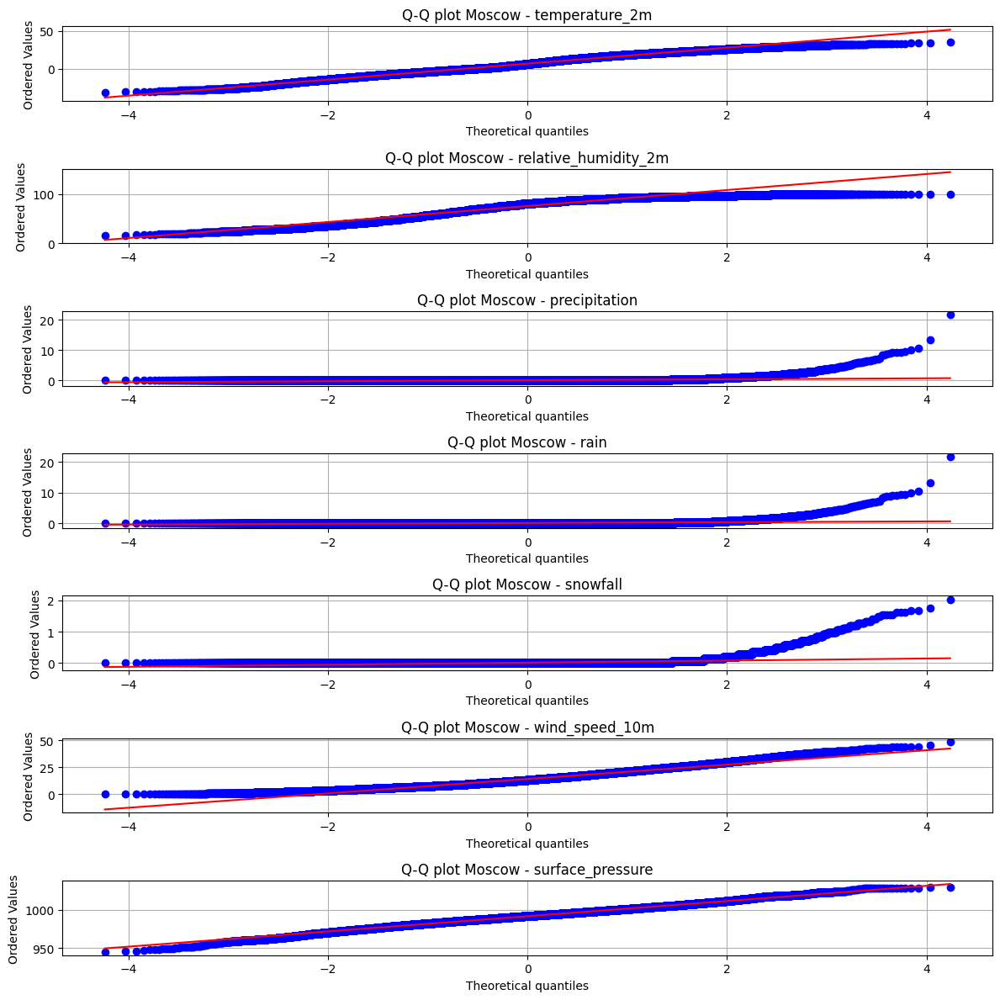

---- Распределения для Blagoveshchensk ----


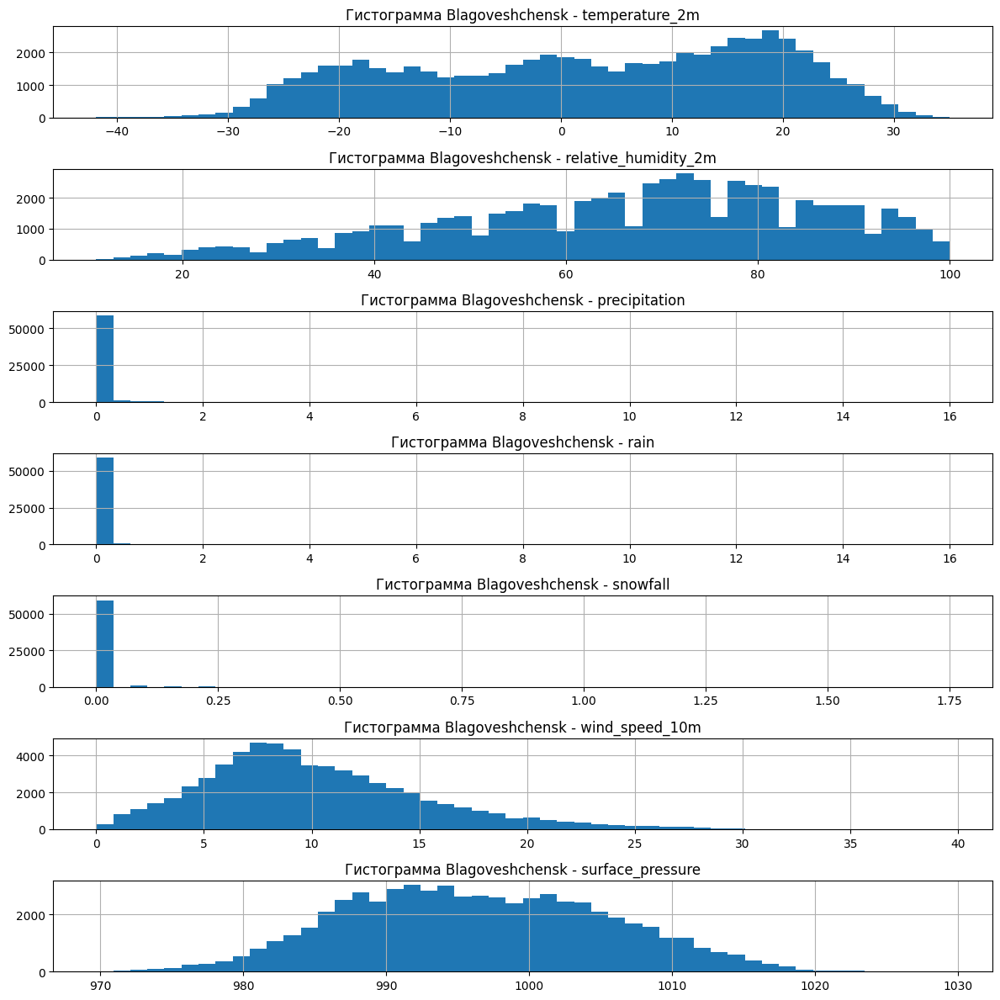

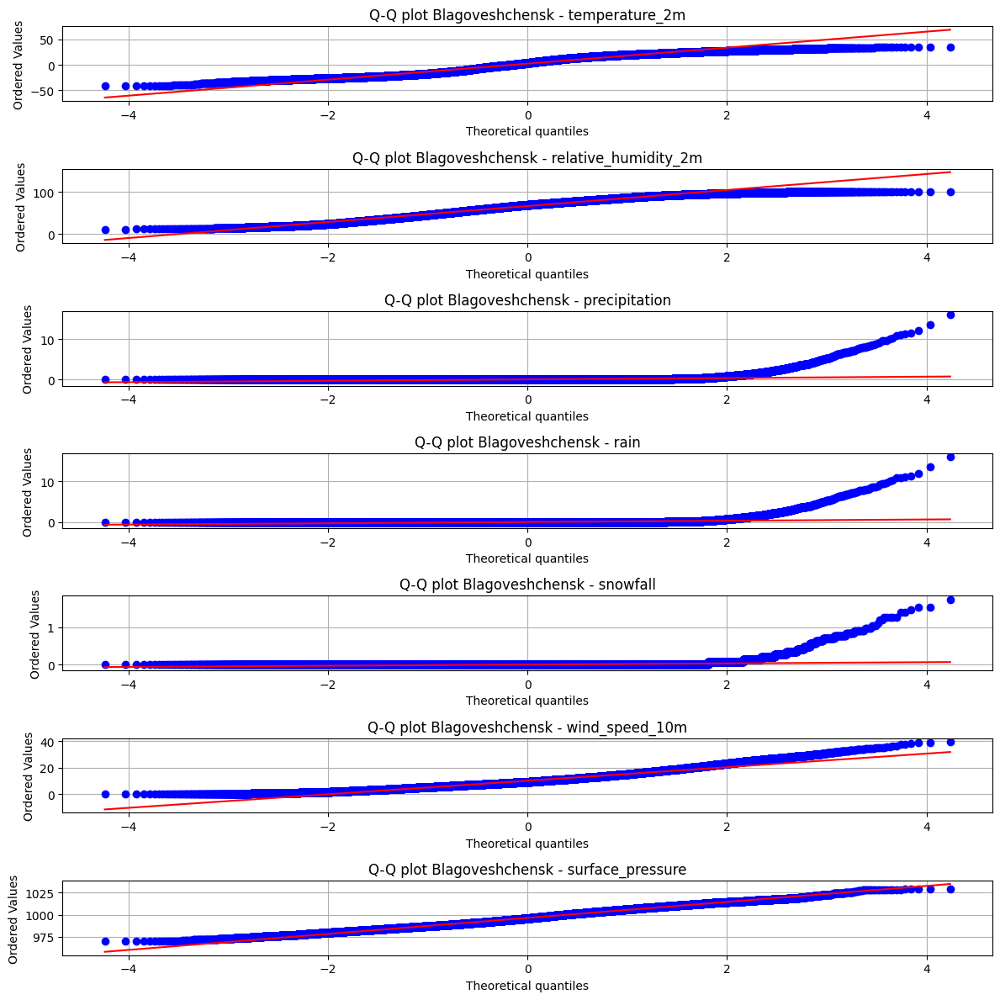

---- Распределения для Saint-Petersburg ----


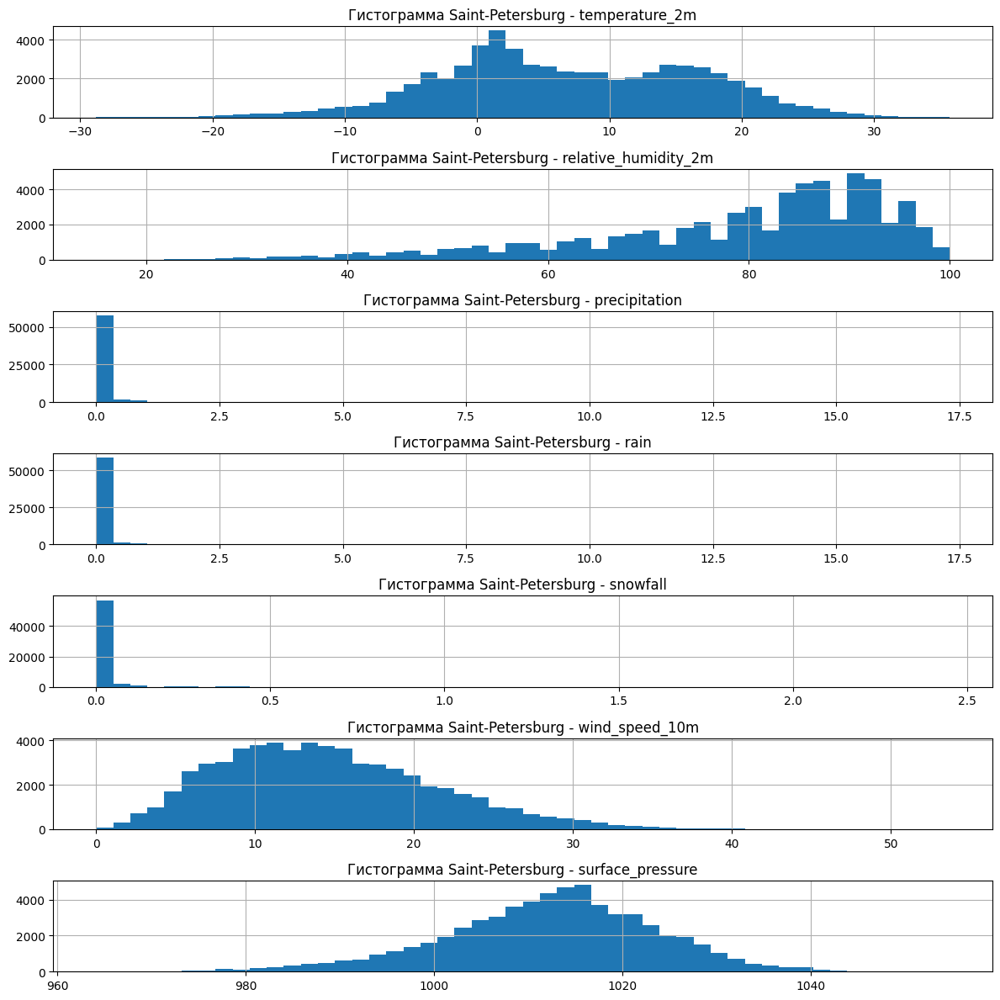

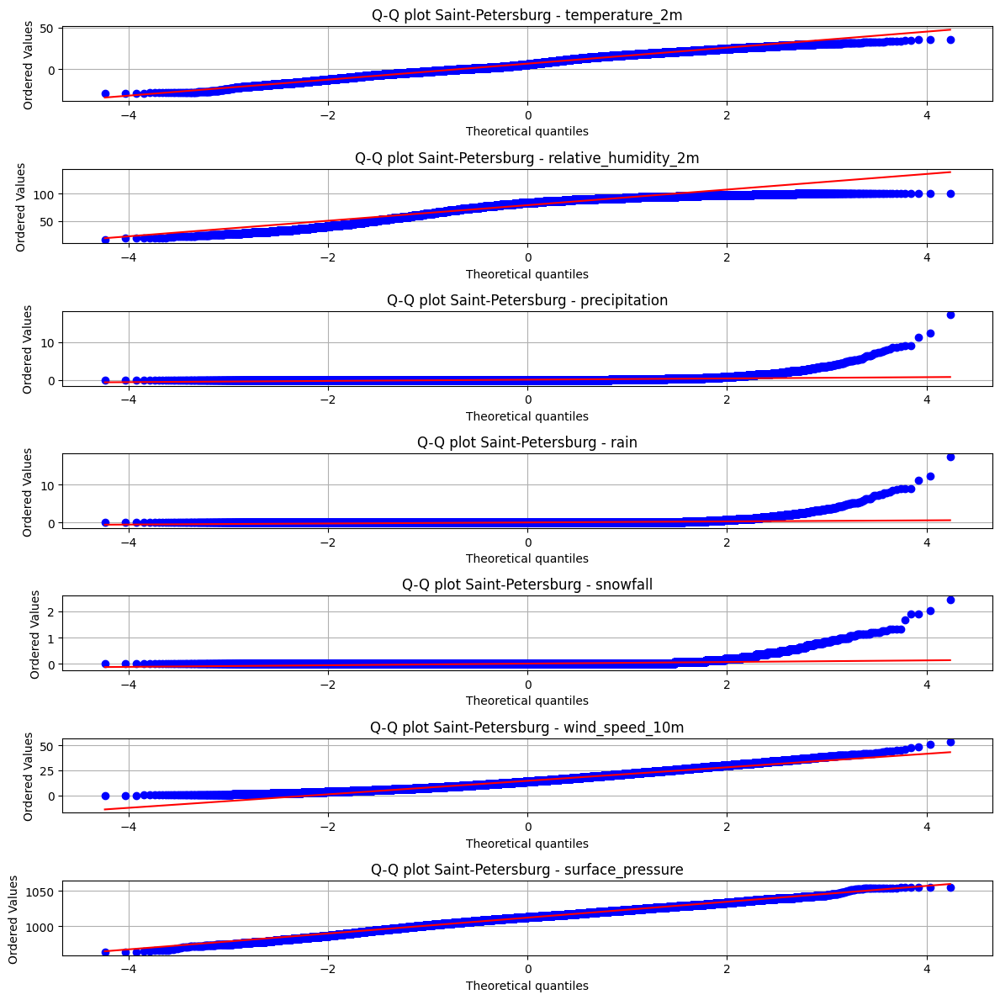

---- Распределения для Sochi ----


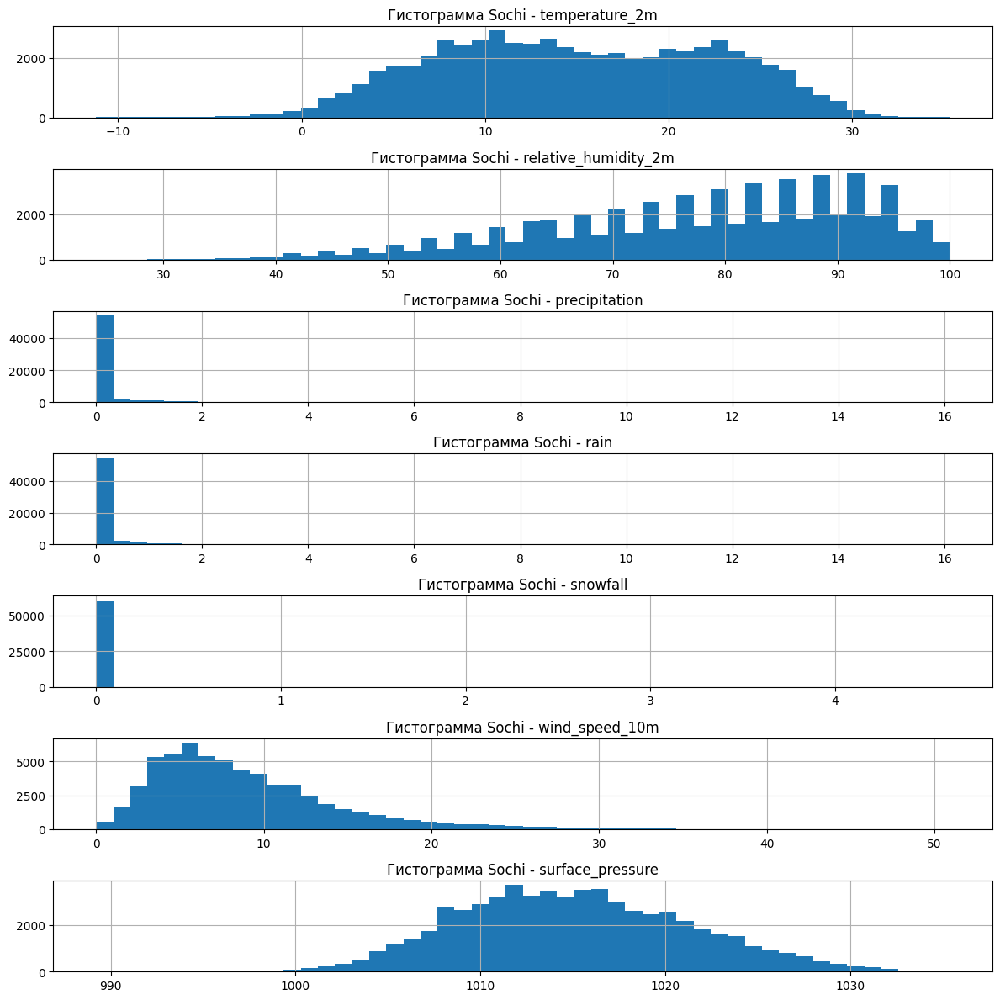

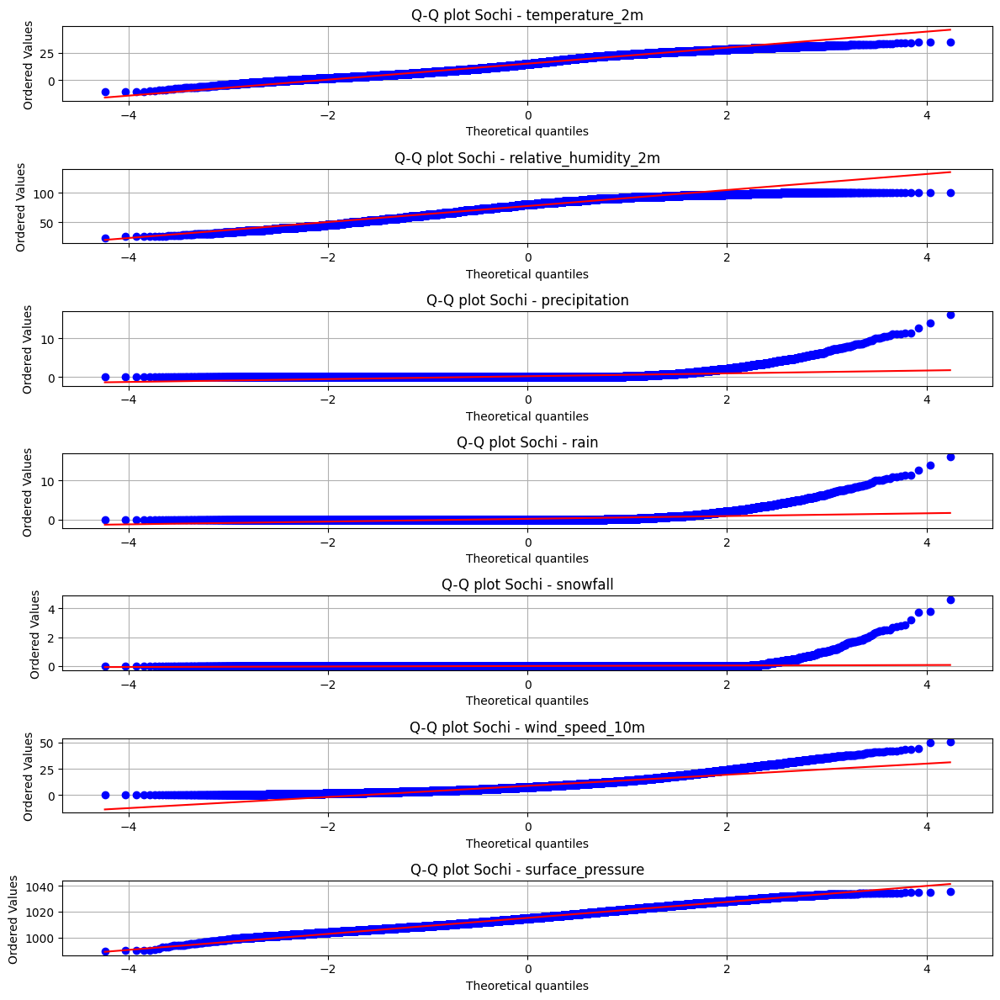

---- Распределения для Gelendzhik ----


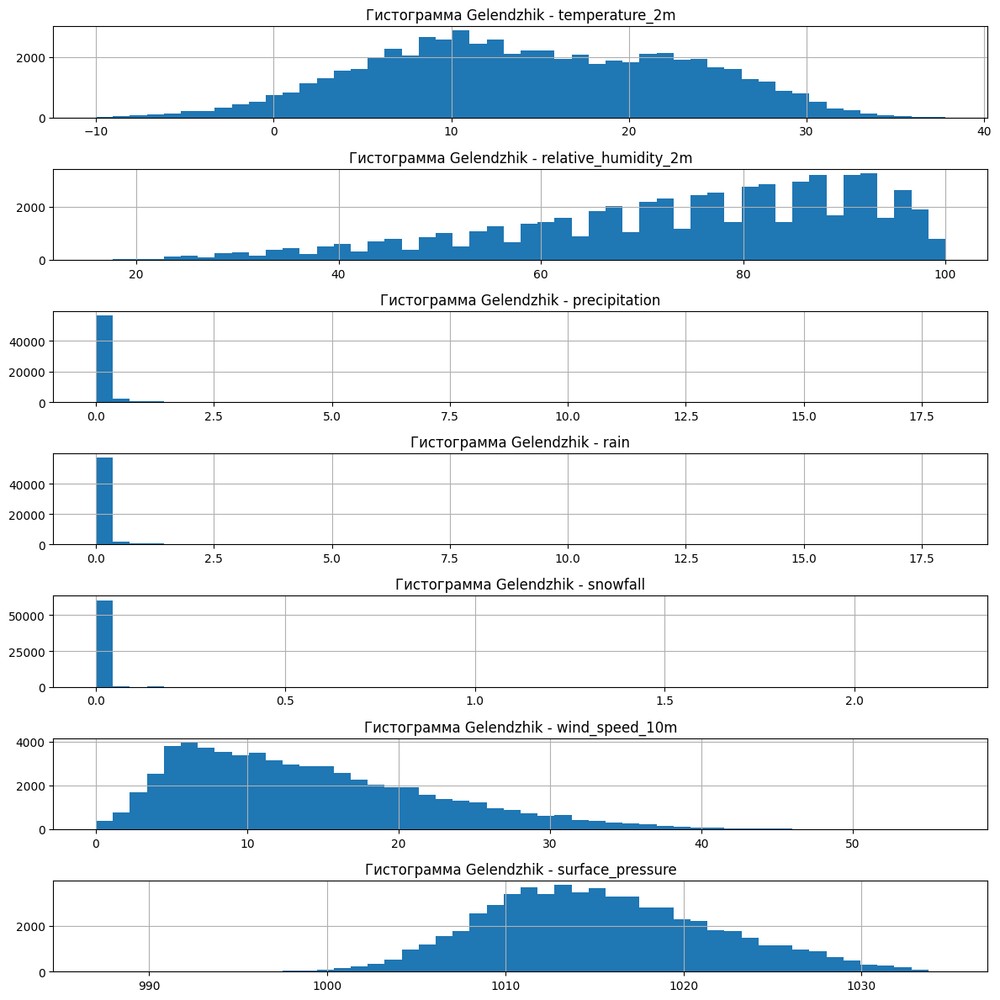

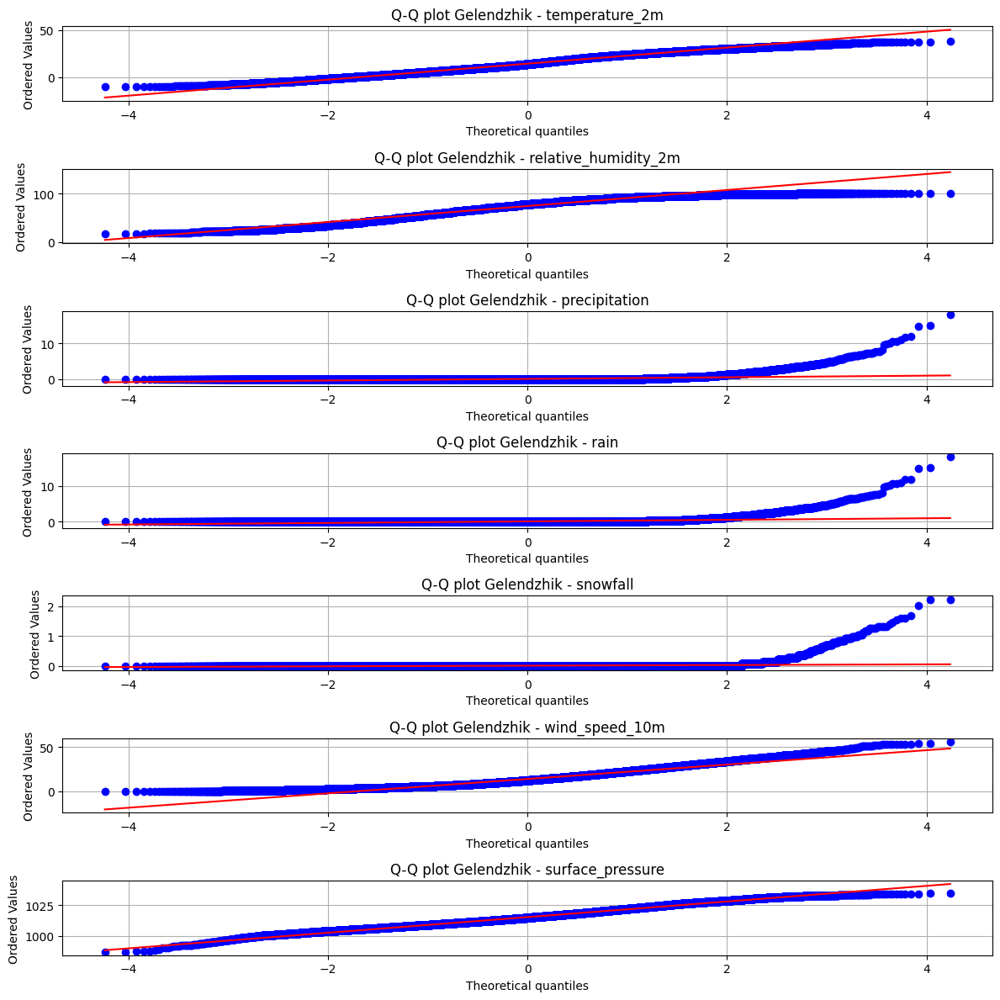

---- Сезонные паттерны Nakhodka ----


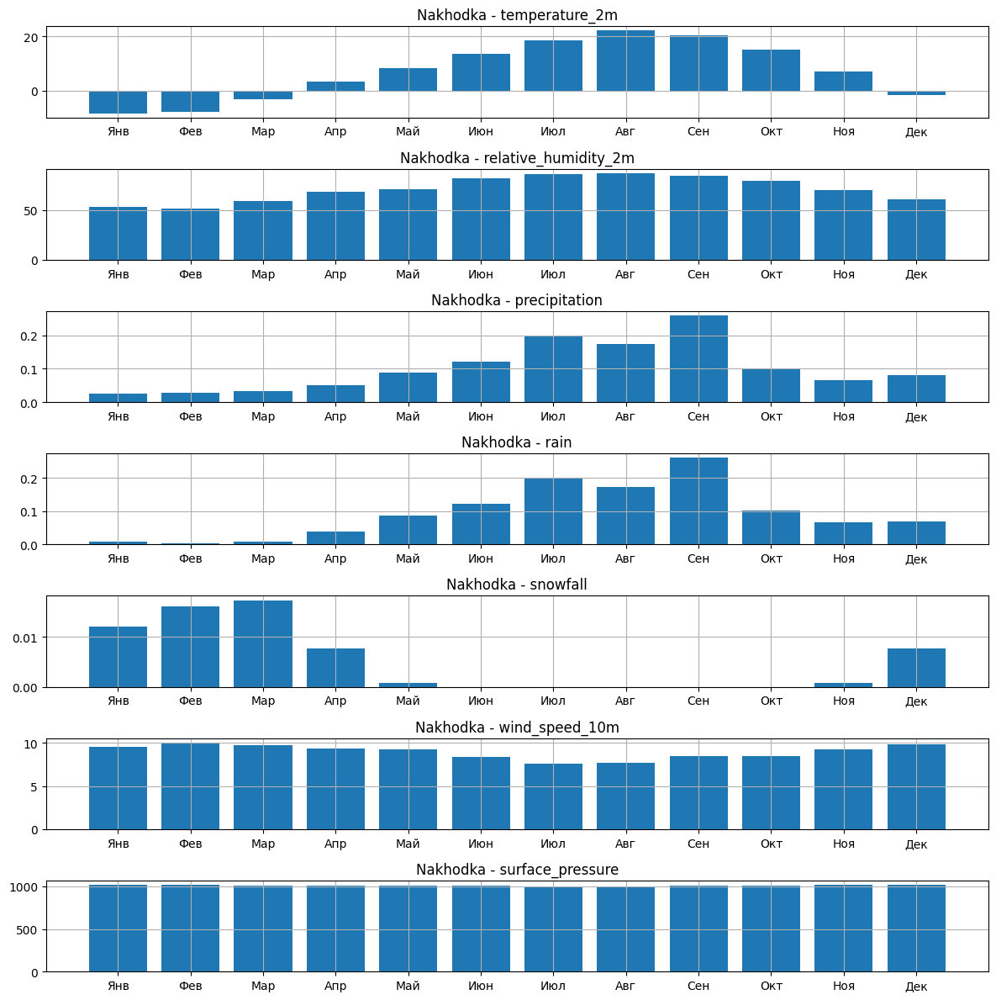

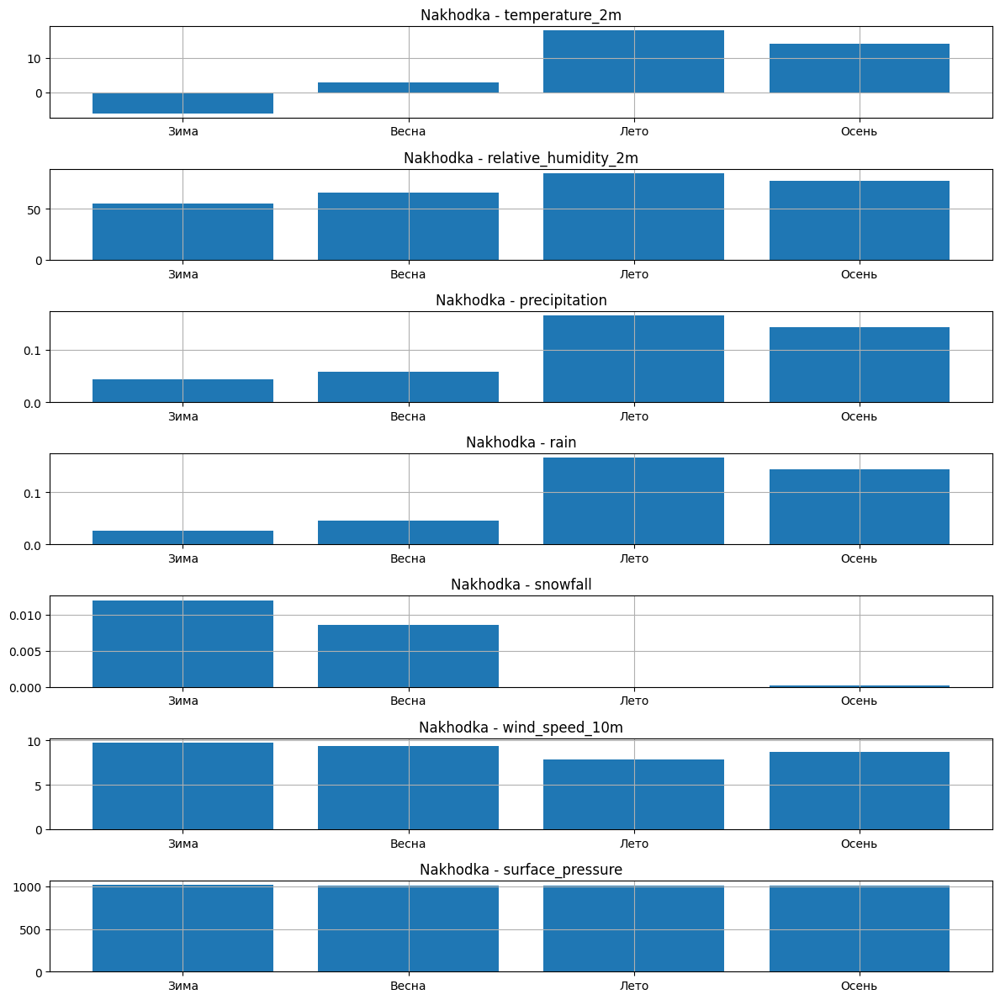

---- Сезонные паттерны Moscow ----


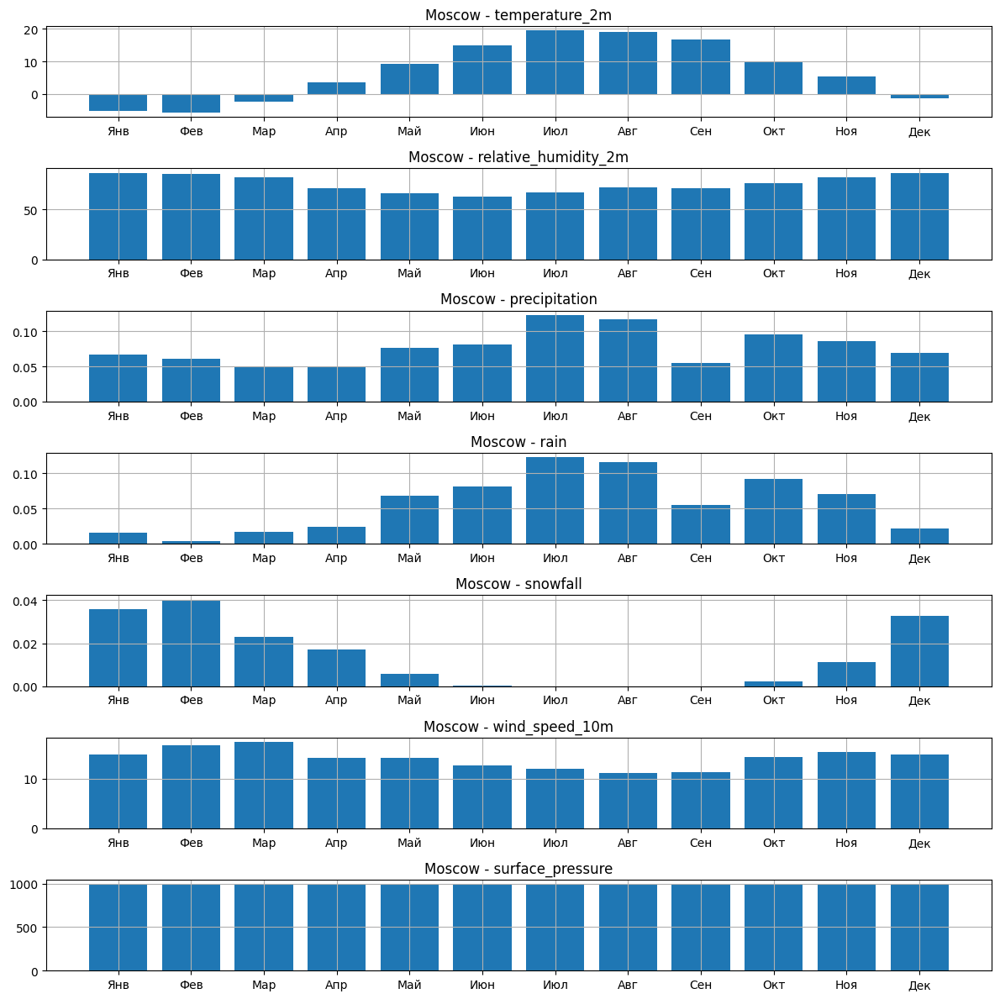

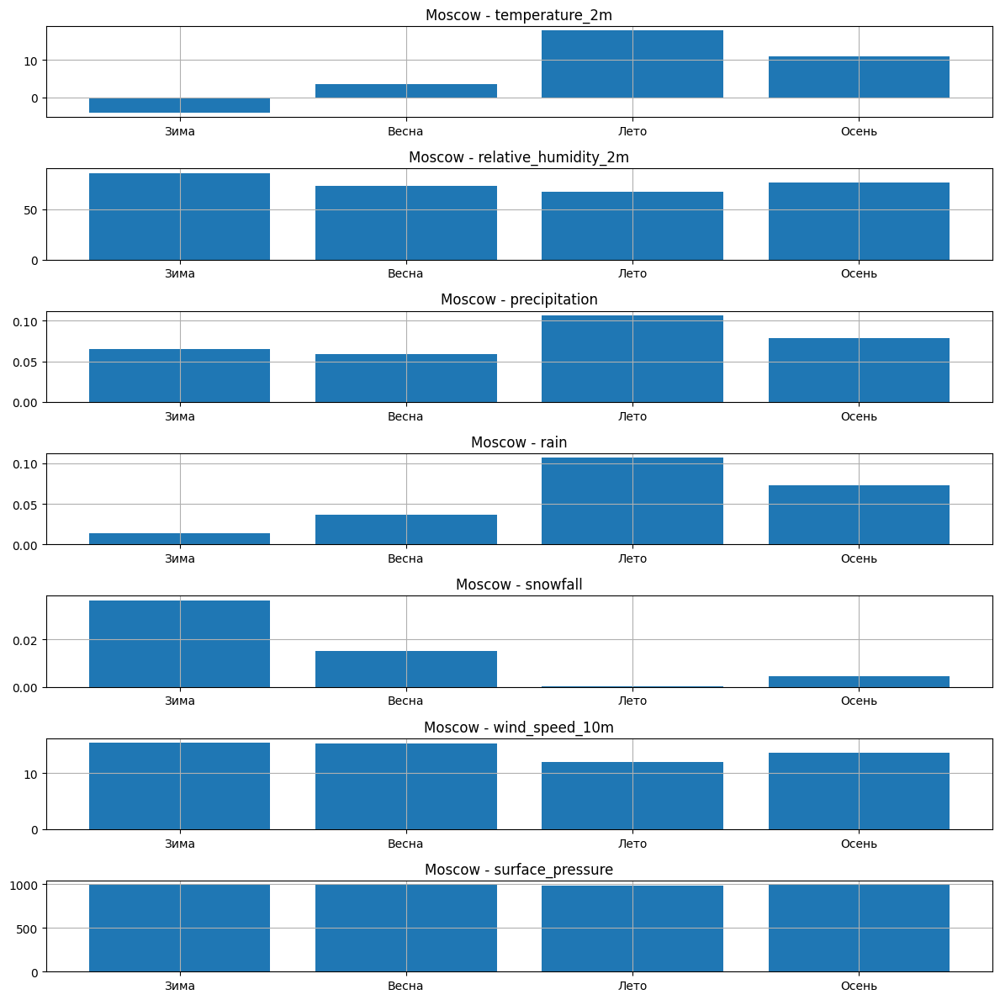

---- Сезонные паттерны Blagoveshchensk ----


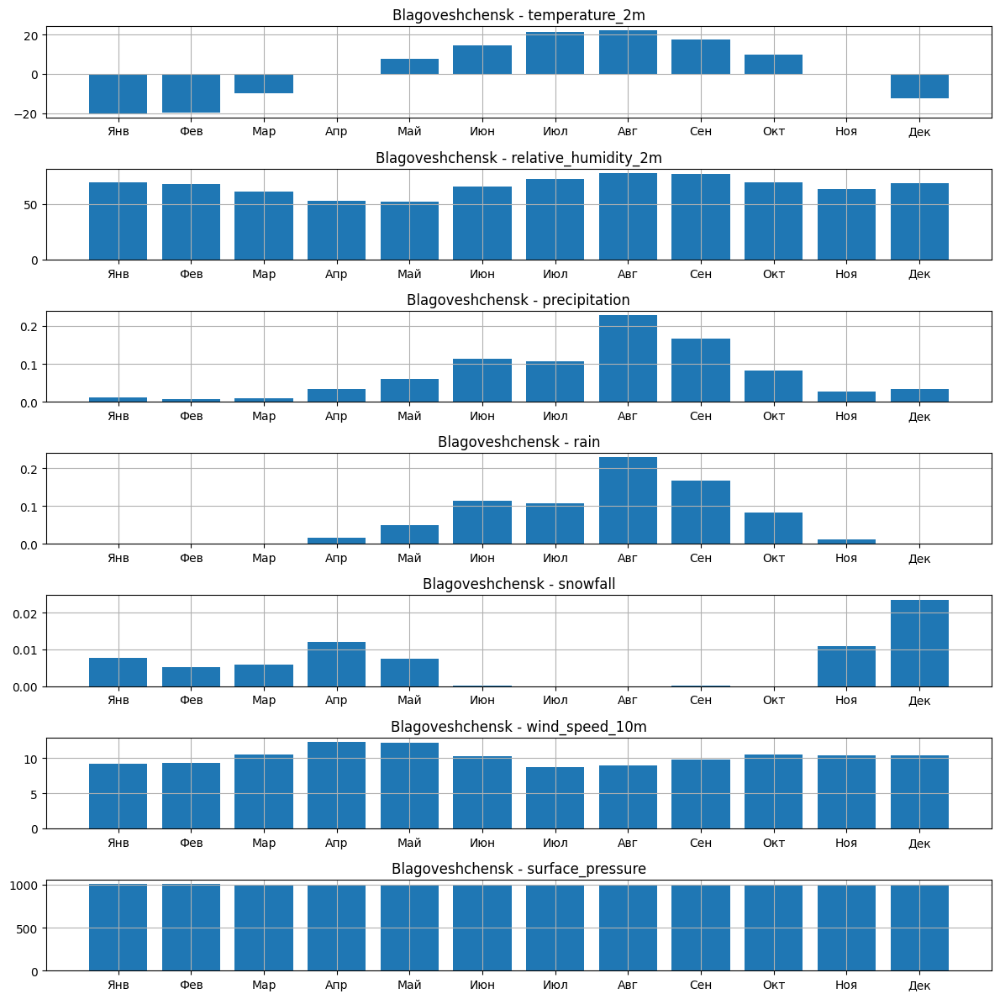

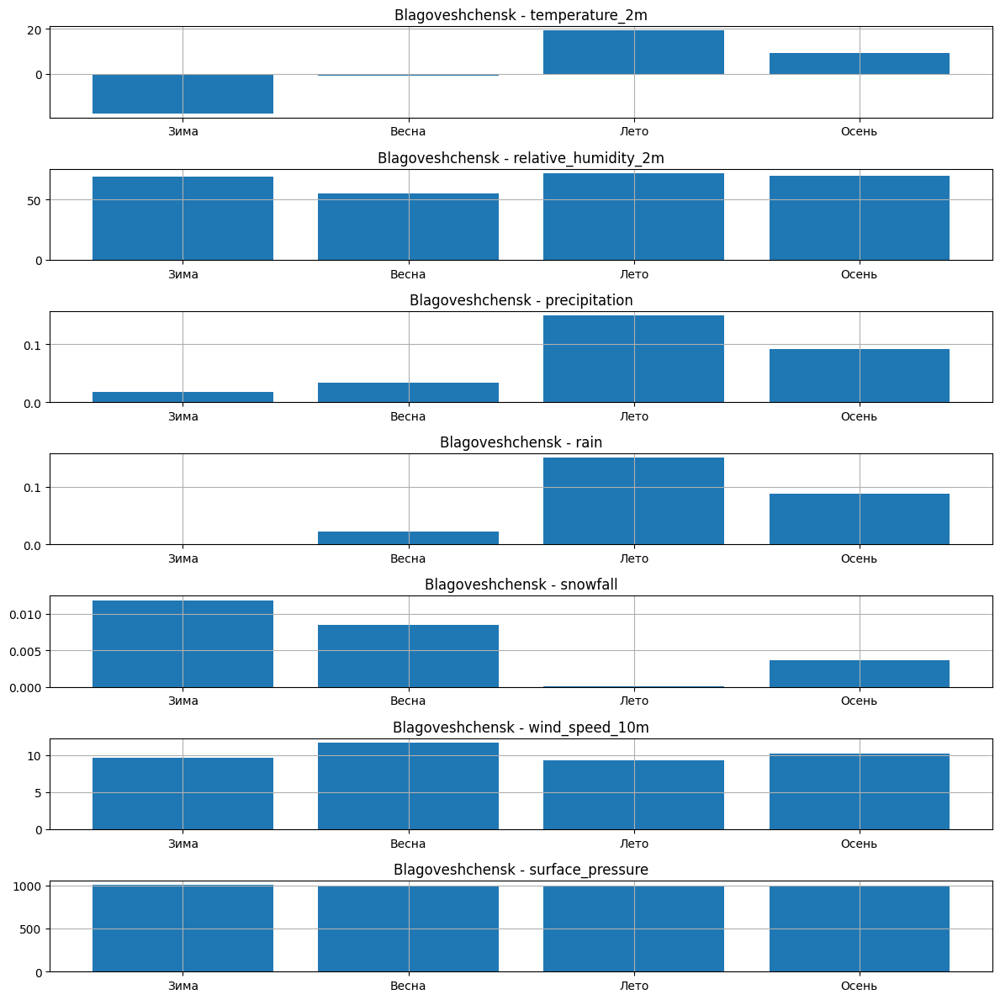

---- Сезонные паттерны Saint-Petersburg ----


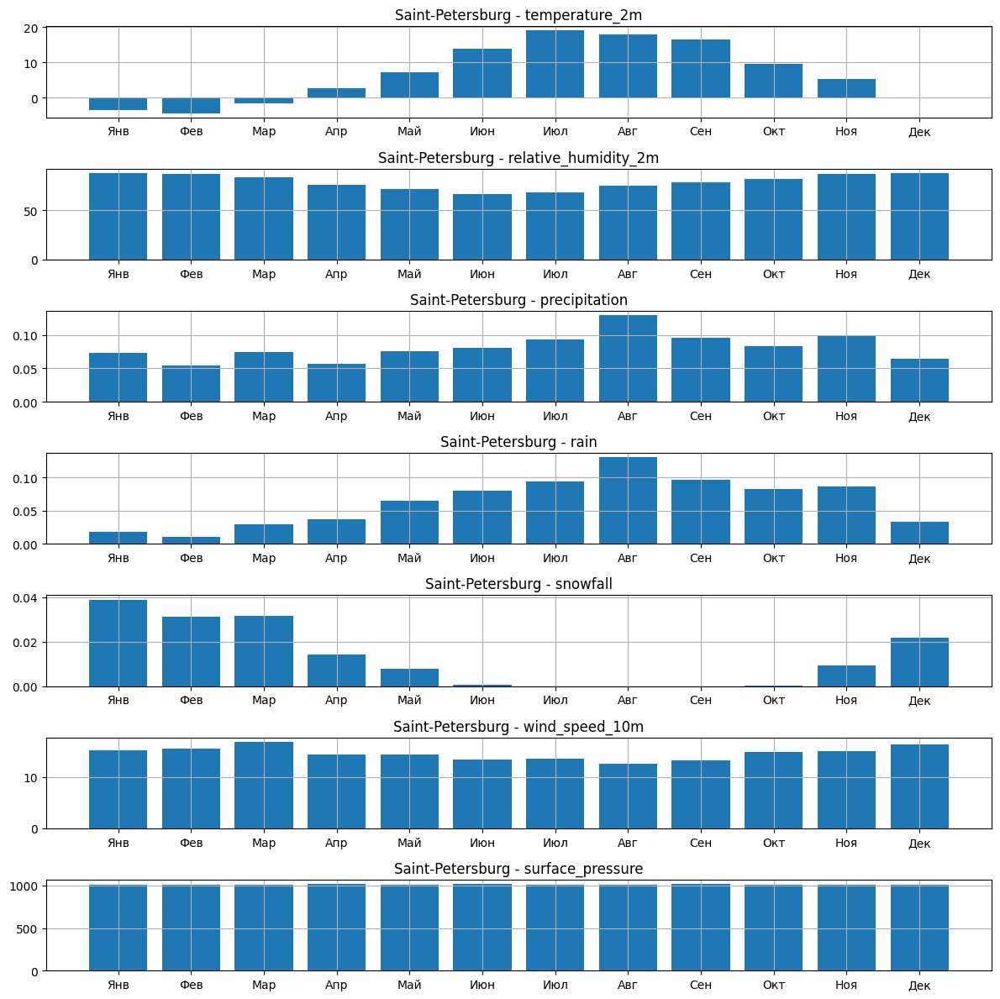

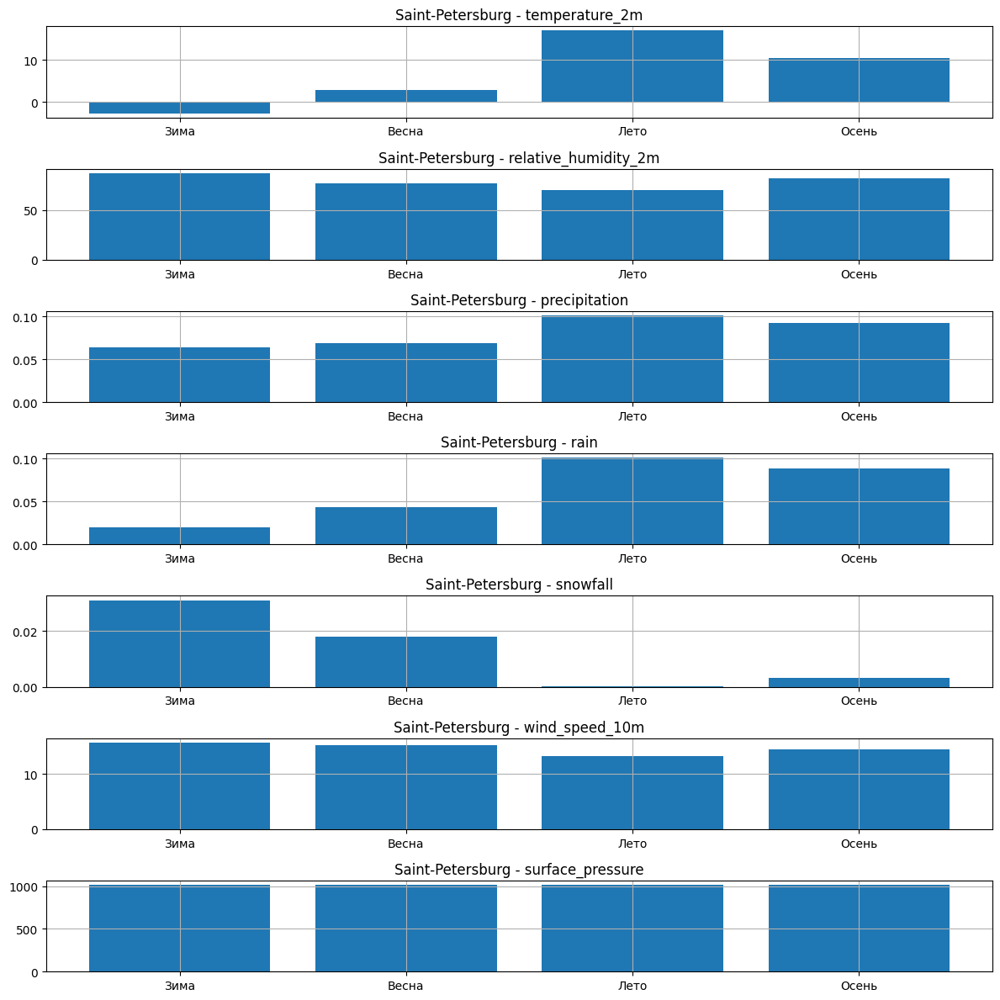

---- Сезонные паттерны Sochi ----


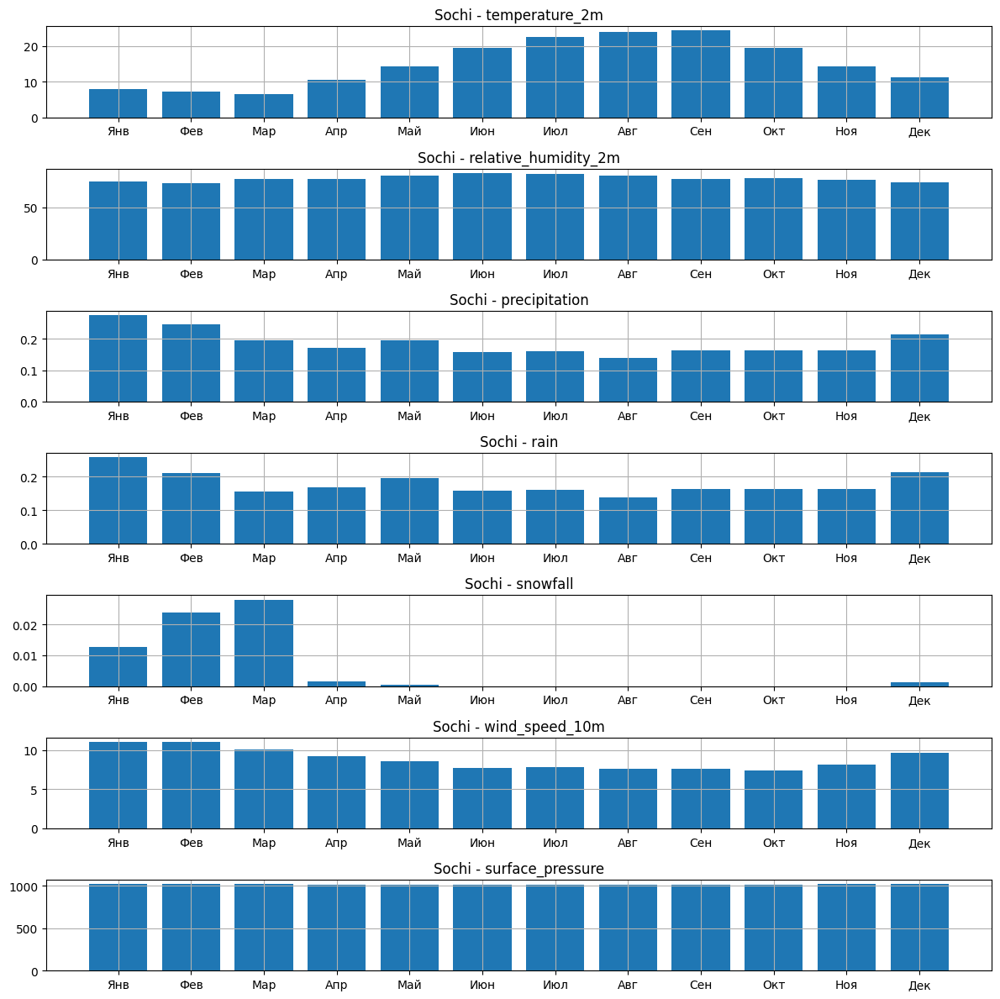

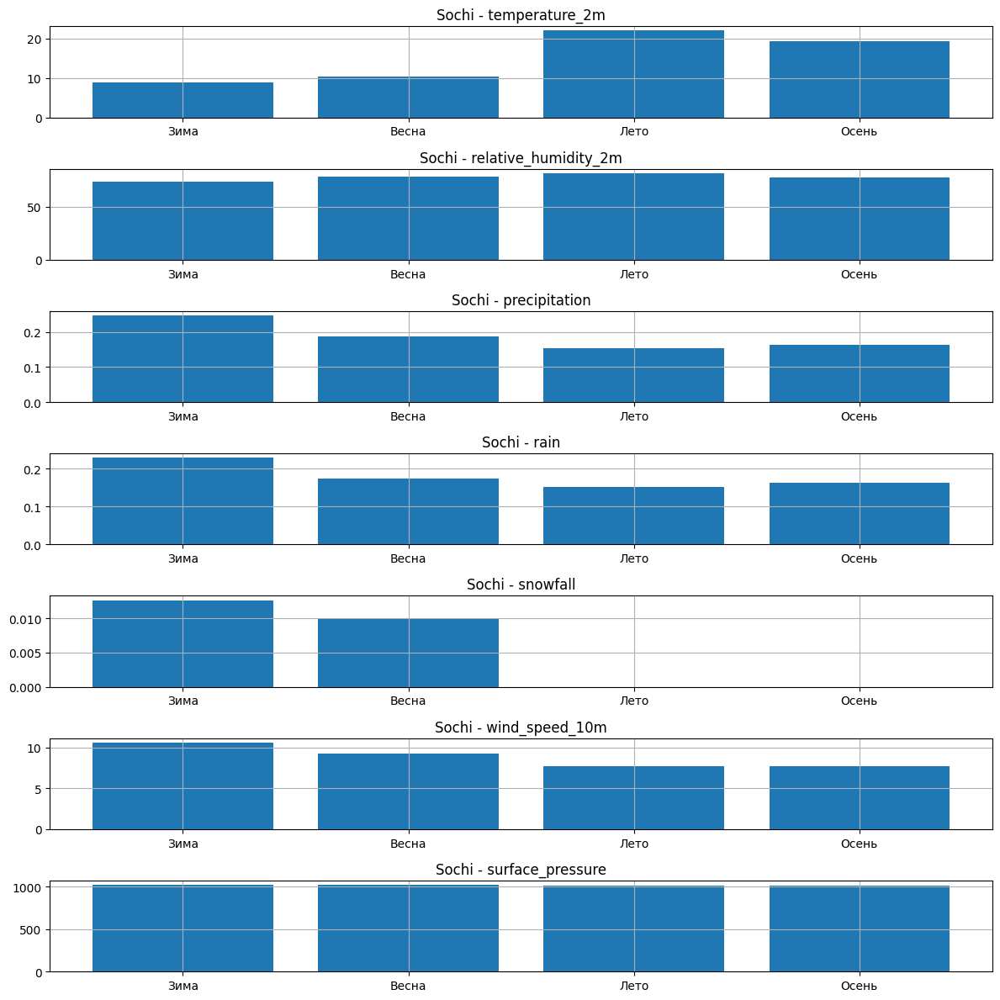

---- Сезонные паттерны Gelendzhik ----


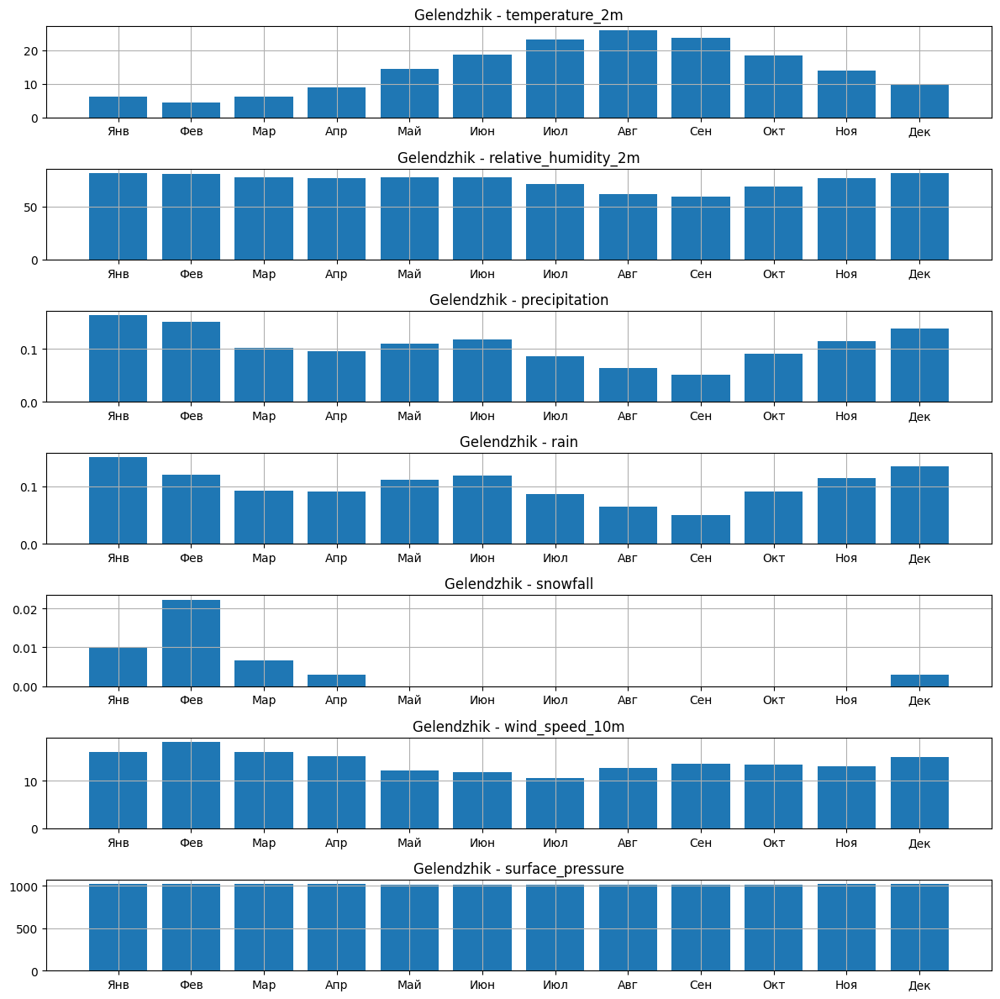

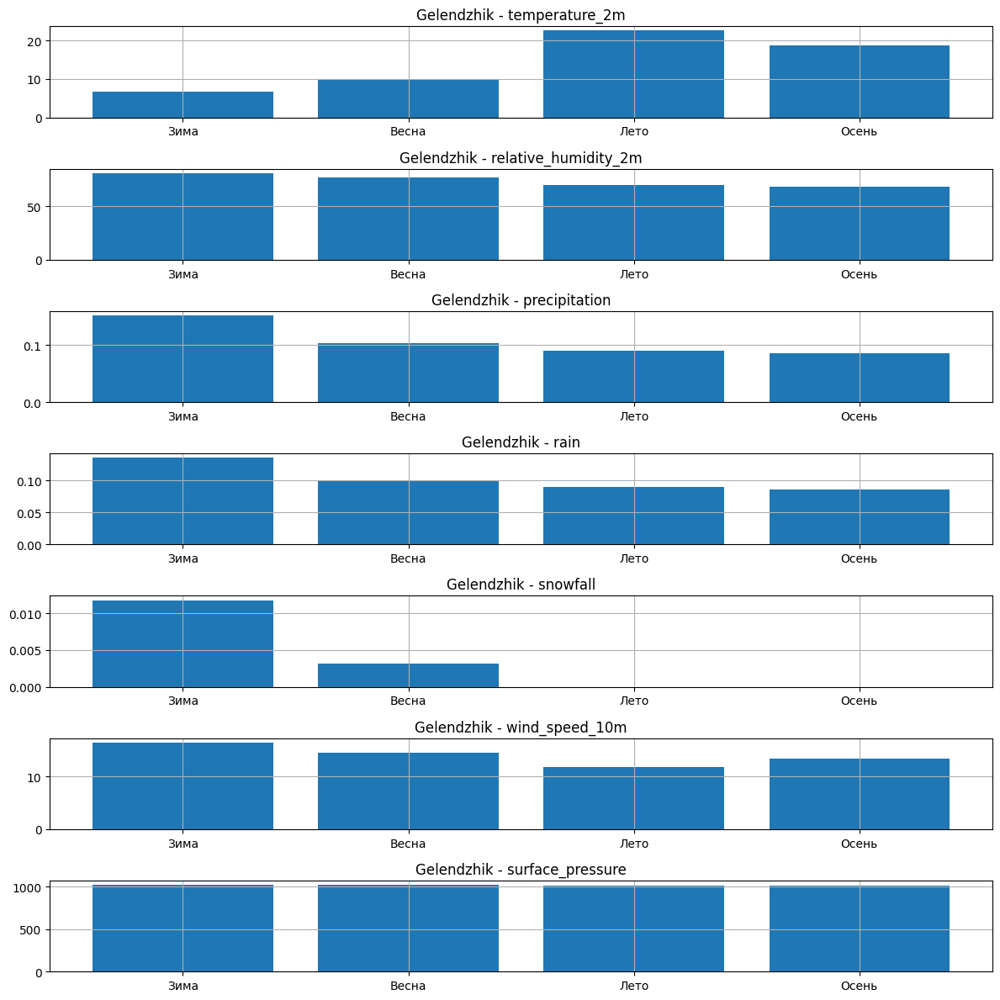

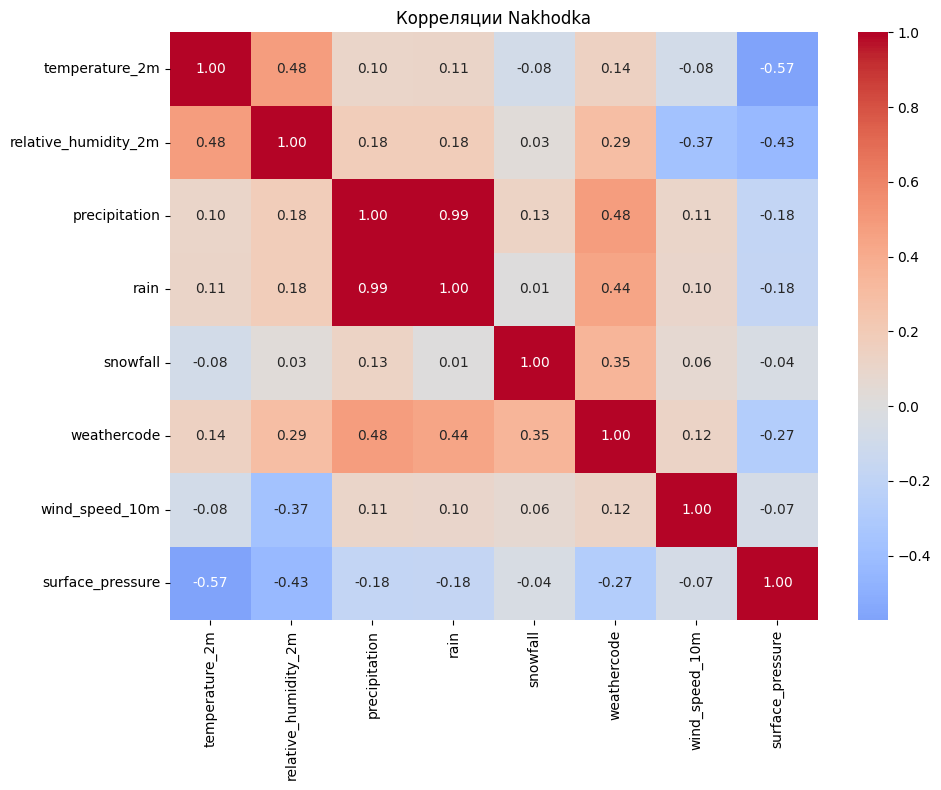

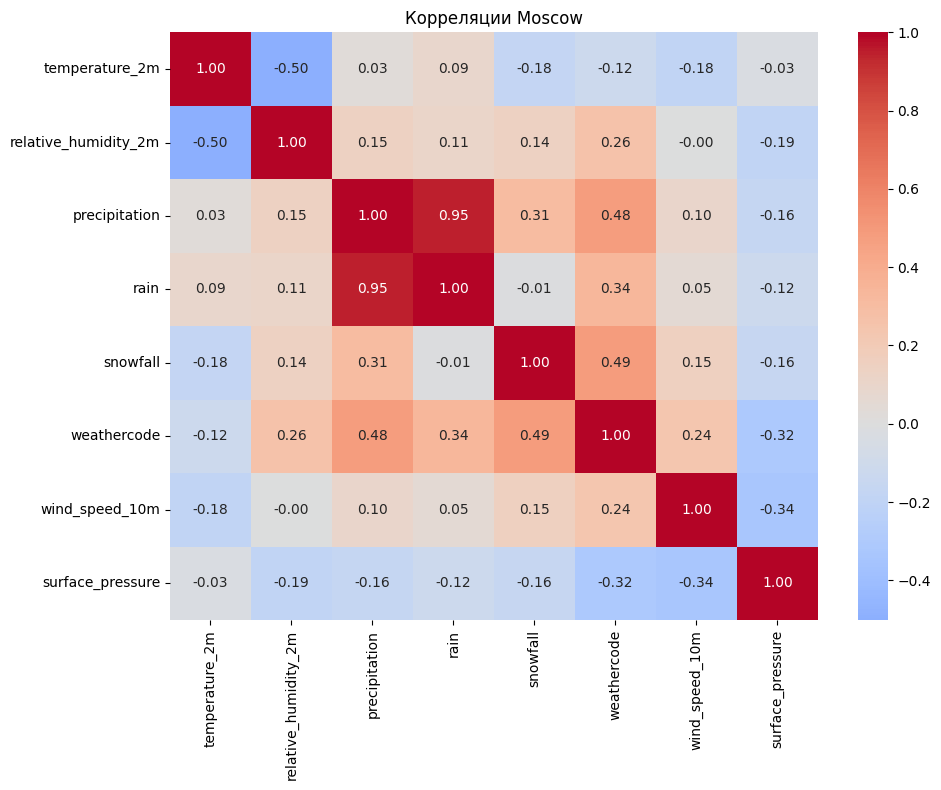

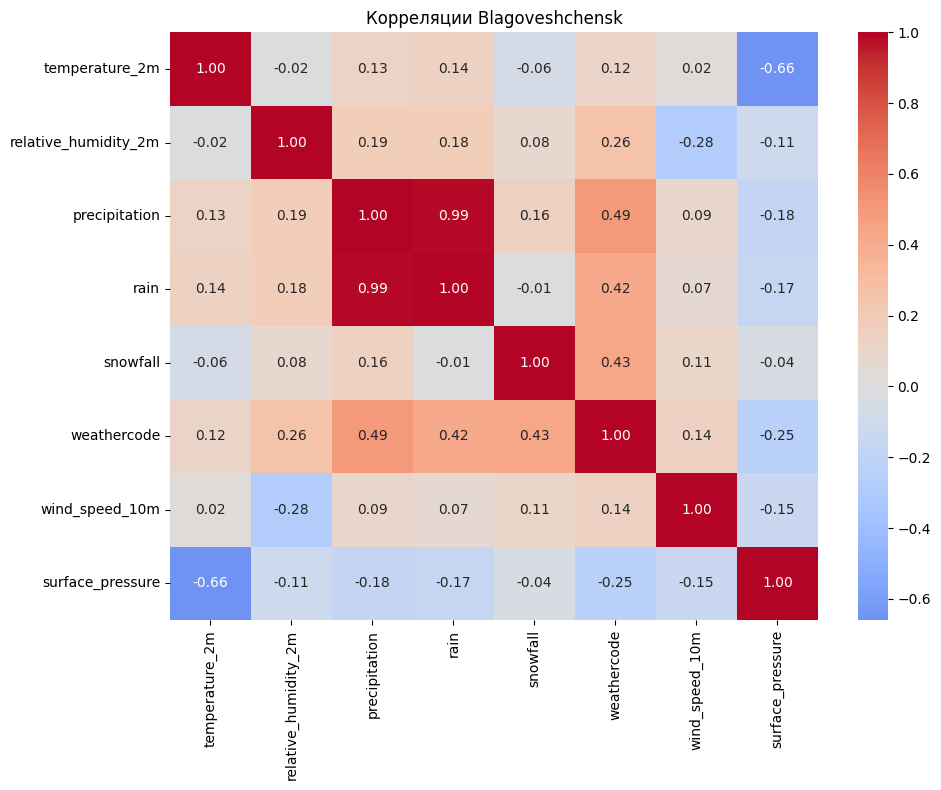

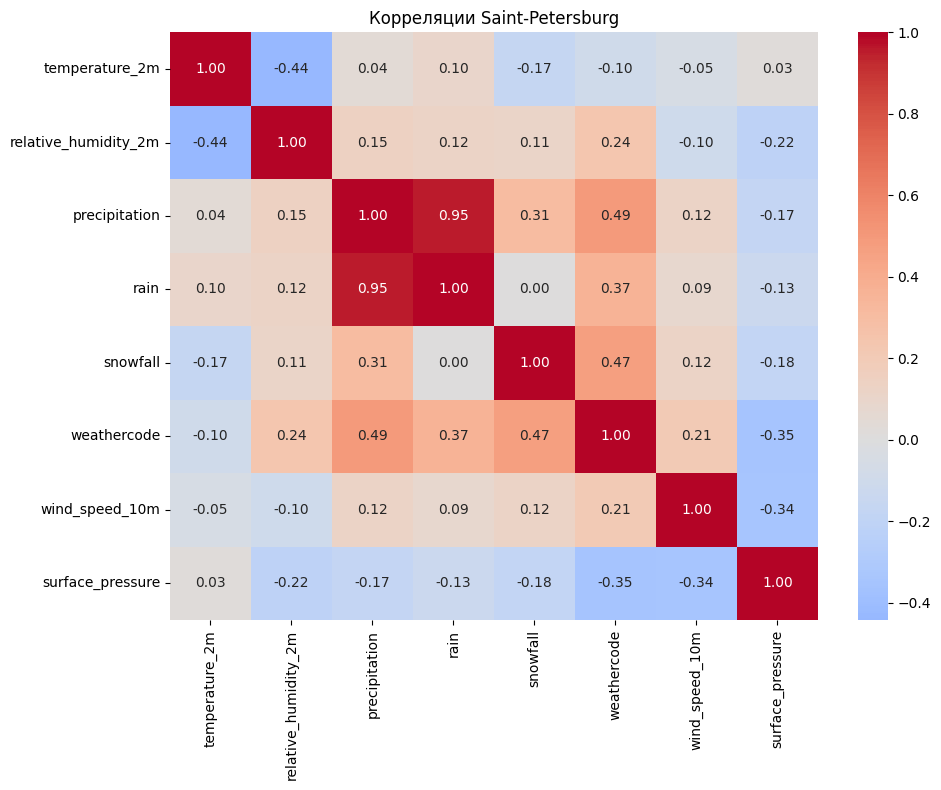

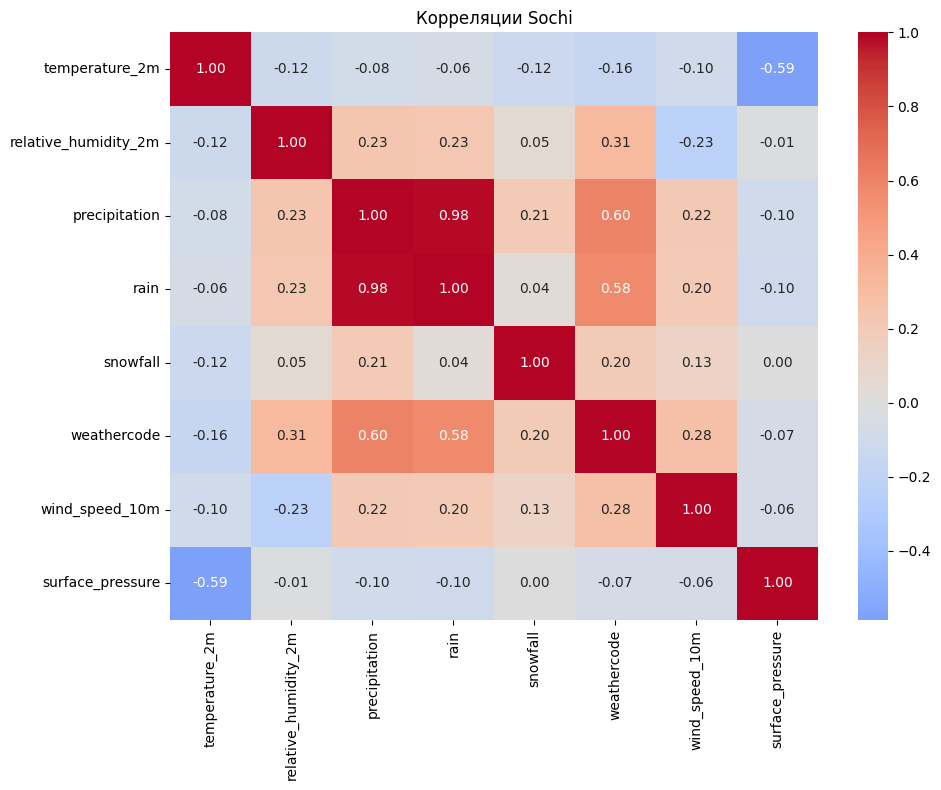

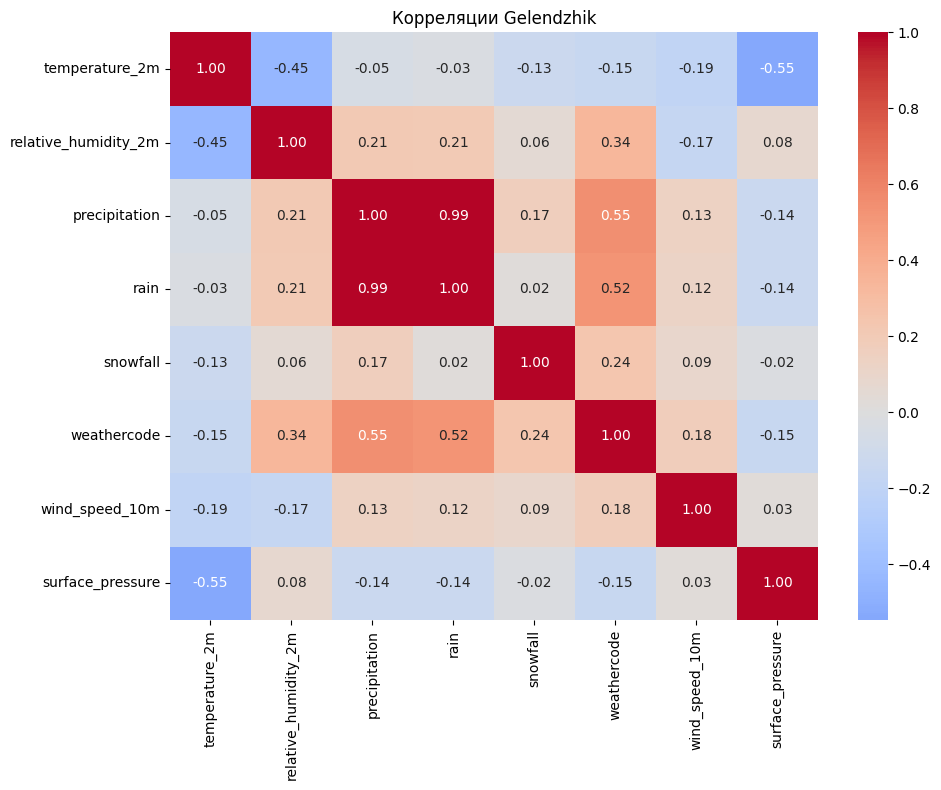

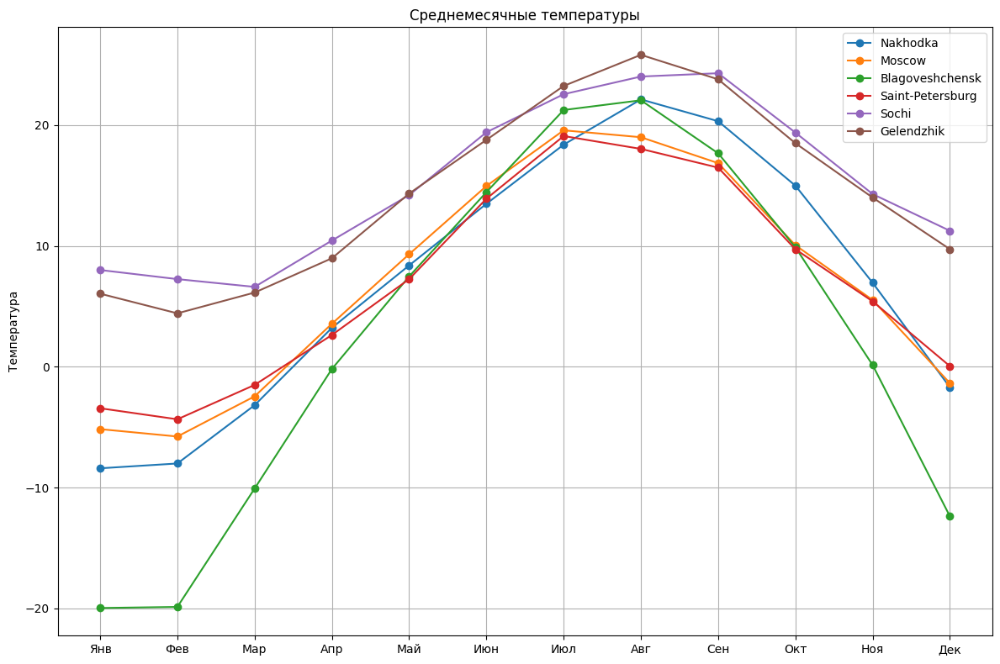

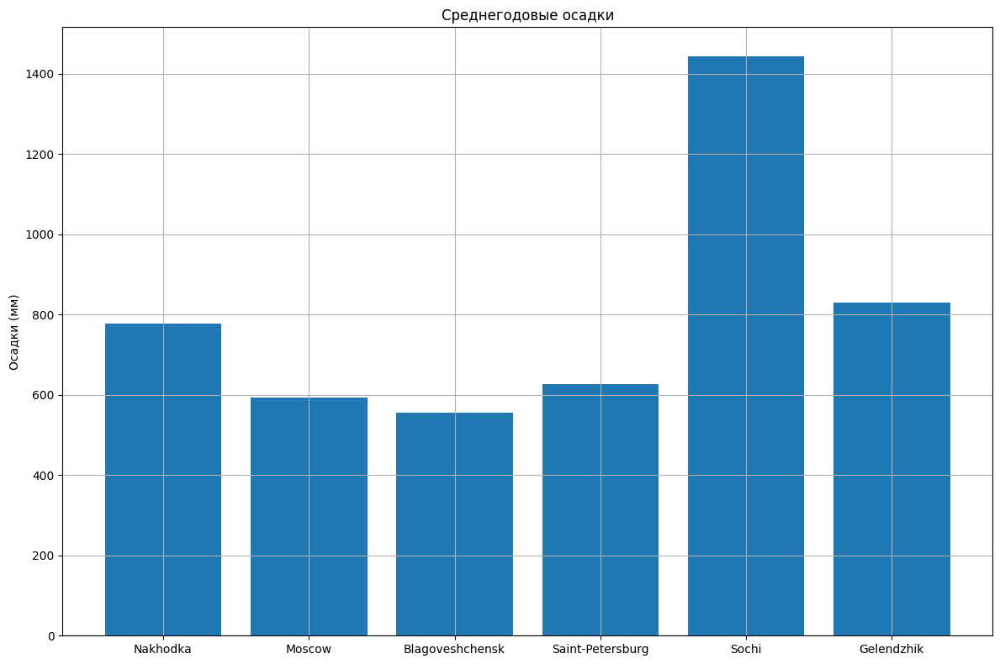

---- Тест Дики-Фуллера для Nakhodka ----
temperature_2m: p-value = 0.0000 -> стационарный
relative_humidity_2m: p-value = 0.0000 -> стационарный
precipitation: p-value = 0.0000 -> стационарный
rain: p-value = 0.0000 -> стационарный
snowfall: p-value = 0.0000 -> стационарный
wind_speed_10m: p-value = 0.0000 -> стационарный
surface_pressure: p-value = 0.0000 -> стационарный

---- Тест Дики-Фуллера для Moscow ----
temperature_2m: p-value = 0.0000 -> стационарный
relative_humidity_2m: p-value = 0.0000 -> стационарный
precipitation: p-value = 0.0000 -> стационарный
rain: p-value = 0.0000 -> стационарный
snowfall: p-value = 0.0000 -> стационарный
wind_speed_10m: p-value = 0.0000 -> стационарный
surface_pressure: p-value = 0.0000 -> стационарный

---- Тест Дики-Фуллера для Blagoveshchensk ----
temperature_2m: p-value = 0.0022 -> стационарный
relative_humidity_2m: p-value = 0.0000 -> стационарный
precipitation: p-value = 0.0000 -> стационарный
rain: p-value = 0.0000 -> стационарный
snowfall: p

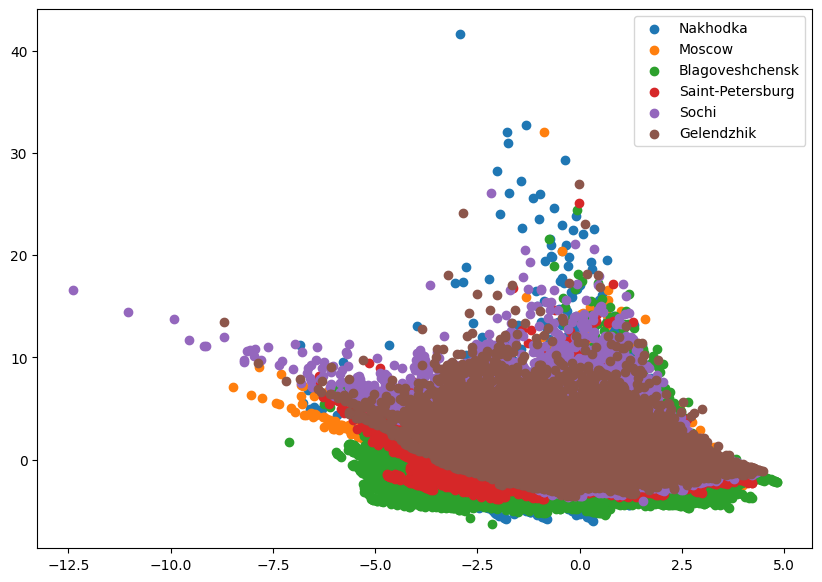

Наиболее важные признаки для различения городов:
1. surface_pressure — важность: 0.1895
2. temp_climate_norm — важность: 0.1744
3. temp_mean_24h — важность: 0.0760
4. max_wind_24h — важность: 0.0600
5. temp_amplitude_24h — важность: 0.0491
6. relative_humidity_2m — важность: 0.0469
7. month — важность: 0.0434
8. temperature_2m — важность: 0.0429
9. day — важность: 0.0418
10. month_cos — важность: 0.0371
11. month_sin — важность: 0.0368
12. temp_std_24h — важность: 0.0354
13. wind_speed_10m — важность: 0.0303
14. year — важность: 0.0277
15. precip_count_24h — важность: 0.0218


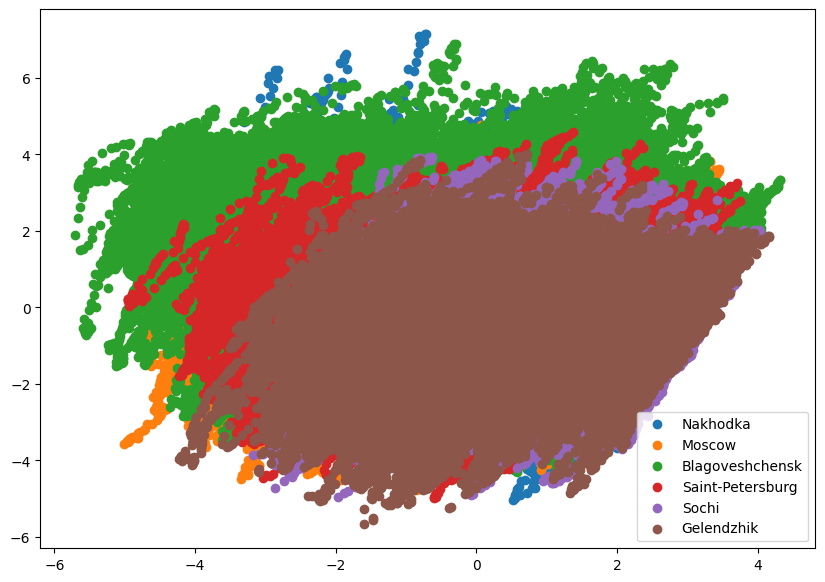

Train: (257552, 24, 19) Val: (55190, 24, 19) Test: (55190, 24, 19)


/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 14s 13ms/step - accuracy: 0.8193 - loss: 0.4291 - val_accuracy: 0.8971 - val_loss: 0.2439
Epoch 2/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.9047 - loss: 0.2304 - val_accuracy: 0.9129 - val_loss: 0.2072
Epoch 3/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.9205 - loss: 0.1923 - val_accuracy: 0.9244 - val_loss: 0.1791
Epoch 4/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.9312 - loss: 0.1662 - val_accuracy: 0.9353 - val_loss: 0.1509
Epoch 5/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.9396 - loss: 0.1469 - val_accuracy: 0.9458 - val_loss: 0.1313
Epoch 6/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.9466 - loss: 0.1325 - val_accuracy: 0.9530 - val_loss: 0.1135
Epoch 7/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 13s 12ms/step - accuracy: 0.9516 - loss: 0.1198 - val_accuracy: 0.9494 - val_loss: 0.1237
Epoch 8/20
1007/1007 ━━━━━━━━━━━━━━━━━━━━ 13s 12ms/step - accuracy: 0.9565 -

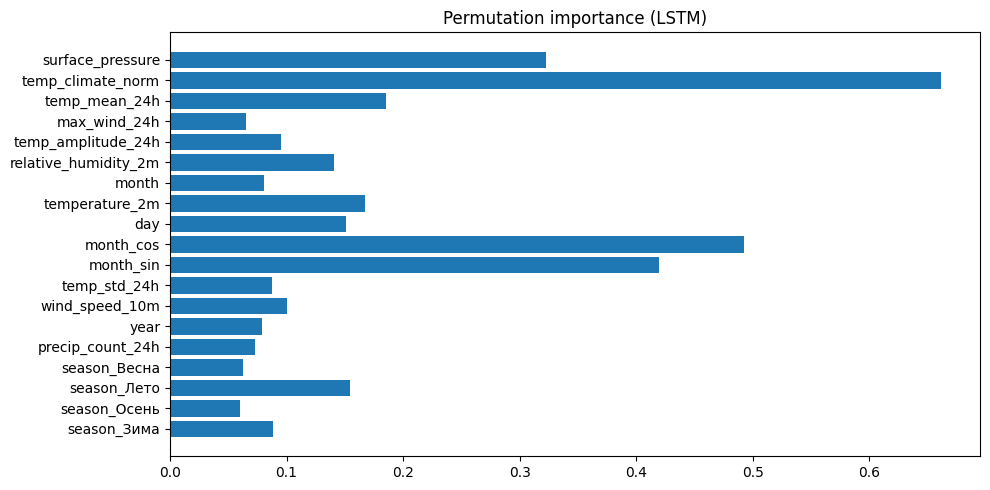

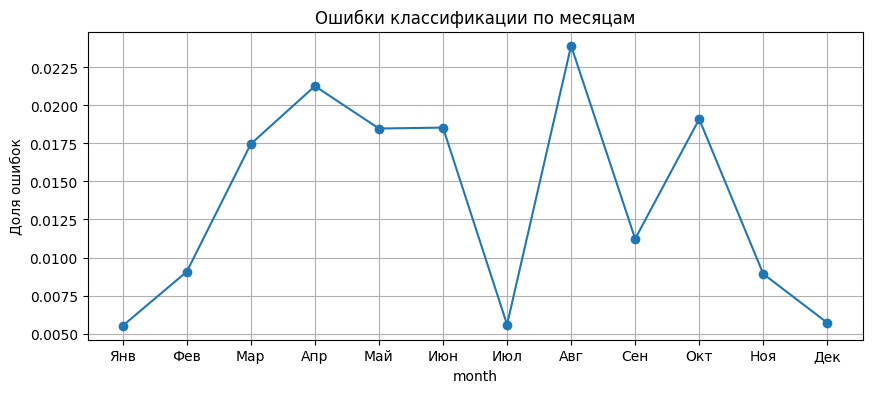

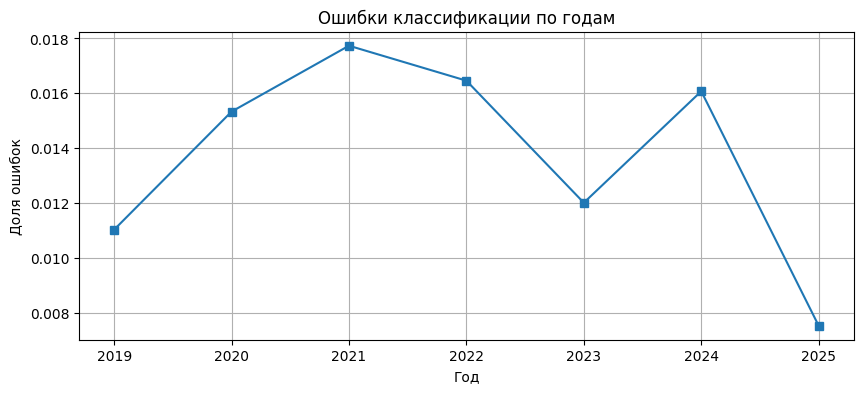

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feat

Nakhodka: прогноз температуры на каждый день следующего месяца:
  День  1: -10.39°C
  День  2: -2.52°C
  День  3: -1.21°C
  День  4: -1.40°C
  День  5: -4.20°C
  День  6: -7.22°C
  День  7: -8.62°C
  День  8: -8.43°C
  День  9: -8.40°C
  День 10: -8.40°C
  День 11: -8.40°C
  День 12: -8.40°C
  День 13: -8.40°C
  День 14: -8.40°C
  День 15: -8.40°C
  День 16: -8.40°C
  День 17: -8.40°C
  День 18: -8.40°C
  День 19: -8.40°C
  День 20: -8.40°C
  День 21: -8.40°C
  День 22: -8.40°C
  День 23: -8.40°C
  День 24: -8.40°C
  День 25: -8.40°C
  День 26: -8.40°C
  День 27: -8.40°C
  День 28: -8.40°C
  День 29: -8.40°C
  День 30: -8.40°C
Nakhodka — MAE: 2.50, RMSE: 3.41, MAPE: 101.0%, WAPE: 21.1%, DirAcc: 54.0%



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feat

Moscow: прогноз температуры на каждый день следующего месяца:
  День  1: -1.60°C
  День  2: -4.02°C
  День  3: -3.45°C
  День  4: -3.97°C
  День  5: -4.84°C
  День  6: -4.95°C
  День  7: -5.16°C
  День  8: -5.62°C
  День  9: -5.90°C
  День 10: -5.90°C
  День 11: -5.90°C
  День 12: -5.90°C
  День 13: -5.90°C
  День 14: -5.90°C
  День 15: -5.90°C
  День 16: -5.90°C
  День 17: -5.90°C
  День 18: -5.90°C
  День 19: -5.90°C
  День 20: -5.90°C
  День 21: -5.90°C
  День 22: -5.90°C
  День 23: -5.90°C
  День 24: -5.90°C
  День 25: -5.90°C
  День 26: -5.90°C
  День 27: -5.90°C
  День 28: -5.90°C
  День 29: -5.90°C
  День 30: -5.90°C
Moscow — MAE: 2.67, RMSE: 3.46, MAPE: 214.2%, WAPE: 29.2%, DirAcc: 49.6%



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feat

Blagoveshchensk: прогноз температуры на каждый день следующего месяца:
  День  1: -25.66°C
  День  2: -6.98°C
  День  3: 2.76°C
  День  4: -2.95°C
  День  5: -1.45°C
  День  6: -1.76°C
  День  7: -1.76°C
  День  8: -1.76°C
  День  9: -1.76°C
  День 10: -1.76°C
  День 11: -1.76°C
  День 12: -1.76°C
  День 13: -1.76°C
  День 14: -1.76°C
  День 15: -1.76°C
  День 16: -1.76°C
  День 17: -1.76°C
  День 18: -1.76°C
  День 19: -1.76°C
  День 20: -1.76°C
  День 21: -1.76°C
  День 22: -1.76°C
  День 23: -1.76°C
  День 24: -1.76°C
  День 25: -1.76°C
  День 26: -1.76°C
  День 27: -1.76°C
  День 28: -1.76°C
  День 29: -1.76°C
  День 30: -1.76°C
Blagoveshchensk — MAE: 2.80, RMSE: 3.67, MAPE: 83.4%, WAPE: 18.9%, DirAcc: 53.0%



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feat

Saint-Petersburg: прогноз температуры на каждый день следующего месяца:
  День  1: -0.98°C
  День  2: -2.94°C
  День  3: -2.49°C
  День  4: -3.18°C
  День  5: -3.71°C
  День  6: -4.90°C
  День  7: -5.76°C
  День  8: -6.19°C
  День  9: -7.66°C
  День 10: -7.91°C
  День 11: -7.91°C
  День 12: -7.91°C
  День 13: -7.91°C
  День 14: -7.91°C
  День 15: -7.91°C
  День 16: -7.91°C
  День 17: -7.91°C
  День 18: -7.91°C
  День 19: -7.91°C
  День 20: -7.91°C
  День 21: -7.91°C
  День 22: -7.91°C
  День 23: -7.91°C
  День 24: -7.91°C
  День 25: -7.91°C
  День 26: -7.91°C
  День 27: -7.91°C
  День 28: -7.91°C
  День 29: -7.91°C
  День 30: -7.91°C
Saint-Petersburg — MAE: 2.22, RMSE: 2.83, MAPE: 228.2%, WAPE: 26.1%, DirAcc: 49.1%



/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feat

Sochi: прогноз температуры на каждый день следующего месяца:
  День  1: 4.01°C
  День  2: 7.02°C
  День  3: 8.90°C
  День  4: 8.70°C
  День  5: 8.65°C
  День  6: 8.65°C
  День  7: 8.65°C
  День  8: 8.65°C
  День  9: 8.65°C
  День 10: 8.65°C
  День 11: 8.65°C
  День 12: 8.65°C
  День 13: 8.65°C
  День 14: 8.65°C
  День 15: 8.65°C
  День 16: 8.65°C
  День 17: 8.65°C
  День 18: 8.65°C
  День 19: 8.65°C
  День 20: 8.65°C
  День 21: 8.65°C
  День 22: 8.65°C
  День 23: 8.65°C
  День 24: 8.65°C
  День 25: 8.65°C
  День 26: 8.65°C
  День 27: 8.65°C
  День 28: 8.65°C
  День 29: 8.65°C
  День 30: 8.65°C
Sochi — MAE: 2.18, RMSE: 2.83, MAPE: 80.2%, WAPE: 14.9%, DirAcc: 53.0%

Gelendzhik: прогноз температуры на каждый день следующего месяца:
  День  1: 5.28°C
  День  2: 8.29°C
  День  3: 9.36°C
  День  4: 7.39°C
  День  5: 5.79°C
  День  6: 5.31°C
  День  7: 5.10°C
  День  8: 4.75°C
  День  9: 4.30°C
  День 10: 4.32°C
  День 11: 4.32°C
  День 12: 4.32°C
  День 13: 4.32°C
  День 14: 4.32°C
  День 15

/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/Users/superuser/mai/mai_2/2/analitics/lr3/envenv/lib/python3.11/site-packages/sklearn/utils/validation.py:2684: UserWarning: X has feat

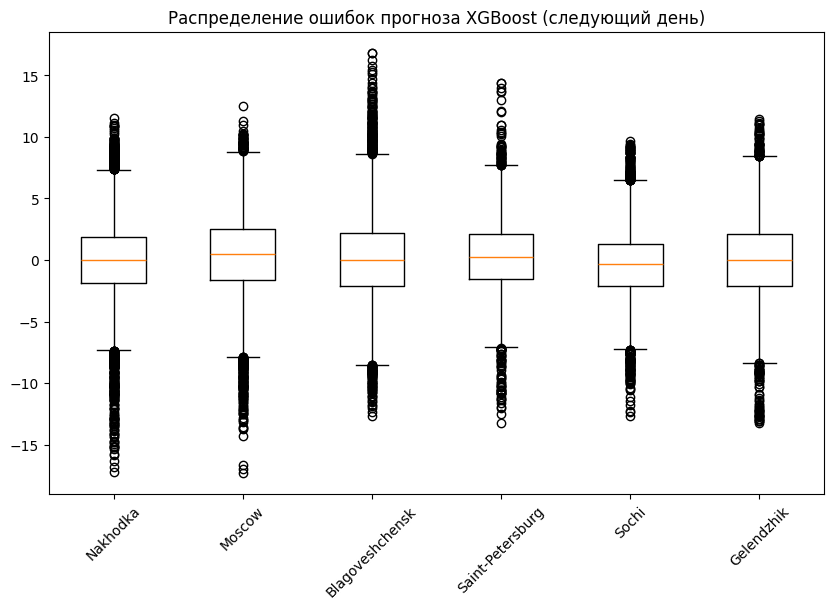

In [ ]:
# полный пайплайн + предсказание xgboost на каждый день, последовательно 
import math
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import fastparquet
import os
import seaborn as sns
import tensorflow as tf

from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import shapiro
from statsmodels.stats.diagnostic import acorr_ljungbox, het_white
from sklearn.model_selection import train_test_split
from collections import defaultdict
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from datetime import date
from scipy import stats
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
import xgboost

CITIES_LIST = os.listdir('data')
if ".DS_Store" in CITIES_LIST:
    CITIES_LIST.remove(".DS_Store")
print(CITIES_LIST)

def read_data(city_name: str) -> pd.DataFrame:
    dataset_list = os.listdir(f"data/{city_name}")
    if ".DS_Store" in dataset_list:
        dataset_list.remove(".DS_Store")
    df = pd.DataFrame()
    for dataset_name in dataset_list:
        sub_df = pd.read_parquet(f"data/{city_name}/{dataset_name}", engine='fastparquet')
        df = pd.concat([df, sub_df], ignore_index=True)
    return df

df_nak = read_data(city_name=CITIES_LIST[0])
df_msc = read_data(city_name=CITIES_LIST[1])
df_bla = read_data(city_name=CITIES_LIST[2])
df_spb = read_data(city_name=CITIES_LIST[3])
df_soc = read_data(city_name=CITIES_LIST[4])
df_gel = read_data(city_name=CITIES_LIST[5])
dfs = [df_nak, df_msc, df_bla, df_spb, df_soc, df_gel]

def eda_analize(df: pd.DataFrame, df_name: str) -> None:
    print(f"---- EDA для {df_name} ----")
    miss_count = df.isnull().sum()
    miss_count = miss_count[miss_count > 0]
    if len(miss_count) > 0:
        plt.figure(figsize=(12,12))
        miss_count.plot(kind='bar')
        plt.title(f'Пропуски: {df_name}')
        plt.show()
    cols = ['temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain', 'snowfall', 'wind_speed_10m', 'surface_pressure']
    months = df.index // 720
    df_month = df.groupby(months)[cols].mean()
    fig, axes = plt.subplots(len(cols), 1, figsize=(12,12))
    for i in range(len(cols)):
        axes[i].plot(df_month.index, df_month[cols[i]], marker='o')
        axes[i].set_title(f'{df_name} - {cols[i]} (по месяцам)')
        axes[i].grid(True)
    plt.tight_layout()
    plt.show()
    hour_num = df.index % 24
    hourly_avg = df.groupby(hour_num)[cols].mean()
    fig, axes = plt.subplots(len(cols), 1, figsize=(12,12))
    for i in range(len(cols)):
        axes[i].plot(hourly_avg.index, hourly_avg[cols[i]], marker='o')
        axes[i].set_title(f'Суточная сезонность {df_name} - {cols[i]}')
        axes[i].grid(True)
    plt.tight_layout()
    plt.show()
    month_num = (df.index // 720) % 12
    monthly_avg = df.groupby(month_num)[cols].mean()
    fig, axes = plt.subplots(len(cols), 1, figsize=(12,12))
    for i in range(len(cols)):
        axes[i].plot(monthly_avg.index+1, monthly_avg[cols[i]], marker='o')
        axes[i].set_title(f'Годовая сезонность {df_name} - {cols[i]}')
        axes[i].grid(True)
    plt.tight_layout()
    plt.show()
    fig, axes = plt.subplots(len(cols), 1, figsize=(12,12))
    for i in range(len(cols)):
        axes[i].boxplot(df[cols[i]].dropna(), vert=False)
        axes[i].set_title(f'Выбросы {df_name} - {cols[i]}')
        axes[i].grid(True)
    plt.tight_layout()
    plt.show()

for sub_df, df_name in zip(dfs, CITIES_LIST):
    eda_analize(df=sub_df, df_name=df_name)

def norm_check(df: pd.DataFrame, df_name: str) -> None:
    print(f"---- Распределения для {df_name} ----")
    cols = ['temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain', 'snowfall', 'wind_speed_10m', 'surface_pressure']
    fig, axes = plt.subplots(len(cols), 1, figsize=(12,12))
    for i in range(len(cols)):
        axes[i].hist(df[cols[i]].dropna(), bins=50)
        axes[i].set_title(f'Гистограмма {df_name} - {cols[i]}')
        axes[i].grid(True)
    plt.tight_layout()
    plt.show()
    fig, axes = plt.subplots(len(cols), 1, figsize=(12,12))
    for i in range(len(cols)):
        stats.probplot(df[cols[i]].dropna(), dist="norm", plot=axes[i])
        axes[i].set_title(f'Q-Q plot {df_name} - {cols[i]}')
        axes[i].grid(True)
    plt.tight_layout()
    plt.show()

for sub_df, df_name in zip(dfs, CITIES_LIST):
    norm_check(df=sub_df, df_name=df_name)

def season_analyze(df: pd.DataFrame, df_name: str) -> None:
    print(f"---- Сезонные паттерны {df_name} ----")
    cols = ['temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain', 'snowfall', 'wind_speed_10m', 'surface_pressure']
    month_num = (df.index // 720) % 12
    monthly_avg = df.groupby(month_num)[cols].mean()
    monthly_avg.index = ['Янв','Фев','Мар','Апр','Май','Июн','Июл','Авг','Сен','Окт','Ноя','Дек']
    fig, axes = plt.subplots(len(cols), 1, figsize=(12,12))
    for i in range(len(cols)):
        axes[i].bar(monthly_avg.index, monthly_avg[cols[i]])
        axes[i].set_title(f'{df_name} - {cols[i]}')
        axes[i].grid(True)
    plt.tight_layout()
    plt.show()
    season_map = {12:'Зима',1:'Зима',2:'Зима',3:'Весна',4:'Весна',5:'Весна',6:'Лето',7:'Лето',8:'Лето',9:'Осень',10:'Осень',11:'Осень'}
    month_idx = (df.index // 720) % 12 + 1
    seasons = month_idx.map(season_map)
    season_order = ['Зима','Весна','Лето','Осень']
    seasonal_avg = df.groupby(seasons)[cols].mean().reindex(season_order)
    fig, axes = plt.subplots(len(cols), 1, figsize=(12,12))
    for i in range(len(cols)):
        axes[i].bar(seasonal_avg.index, seasonal_avg[cols[i]])
        axes[i].set_title(f'{df_name} - {cols[i]}')
        axes[i].grid(True)
    plt.tight_layout()
    plt.show()

for sub_df, df_name in zip(dfs, CITIES_LIST):
    season_analyze(df=sub_df, df_name=df_name)

def plot_correlation(df: pd.DataFrame, df_name: str) -> None:
    plt.figure(figsize=(10,8))
    sns.heatmap(df.corr(), annot=True, fmt=".2f", cmap="coolwarm", center=0)
    plt.title(f'Корреляции {df_name}')
    plt.tight_layout()
    plt.show()

for df, name in zip(dfs, CITIES_LIST):
    plot_correlation(df, name)

def climate_profile(dfs: list, city_names: list) -> None:
    month_labels = ['Янв','Фев','Мар','Апр','Май','Июн','Июл','Авг','Сен','Окт','Ноя','Дек']
    plt.figure(figsize=(12,8))
    for df, city_name in zip(dfs, city_names):
        month_num = (df.index // 720) % 12
        monthly_temp = df.groupby(month_num)['temperature_2m'].mean()
        plt.plot(month_labels, monthly_temp.values, marker='o', label=city_name)
    plt.title('Среднемесячные температуры')
    plt.ylabel('Температура')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()
    yearly_precip = []
    for df, city_name in zip(dfs, city_names):
        year_num = df.index // 8760
        annual = df.groupby(year_num)['precipitation'].sum().mean()
        yearly_precip.append(annual)
    plt.figure(figsize=(12,8))
    plt.bar(city_names, yearly_precip)
    plt.title('Среднегодовые осадки')
    plt.ylabel('Осадки (мм)')
    plt.grid()
    plt.tight_layout()
    plt.show()

climate_profile(dfs=dfs, city_names=CITIES_LIST)

def check_stationarity(df: pd.DataFrame, df_name: str) -> None:
    print(f"---- Тест Дики-Фуллера для {df_name} ----")
    cols = ['temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain', 'snowfall', 'wind_speed_10m', 'surface_pressure']
    for col in cols:
        res = adfuller(df[col].dropna())
        print(f"{col}: p-value = {res[1]:.4f} -> {'стационарный' if res[1]<0.05 else 'нестационарный'}")
    print()

for sub_df, df_name in zip(dfs, CITIES_LIST):
    check_stationarity(df=sub_df, df_name=df_name)

def create_time_col(df: pd.DataFrame) -> pd.DataFrame:
    start_year = 2019
    def get_days_in_month(year, month):
        is_leap = (year % 4 == 0 and (year % 100 != 0 or year % 400 == 0))
        days = [31,28,31,30,31,30,31,31,30,31,30,31]
        if is_leap: days[1]=29
        return days[month-1]
    def get_days_in_year(year):
        is_leap = (year % 4 == 0 and (year % 100 != 0 or year % 400 == 0))
        return 366 if is_leap else 365
    res = []
    for h in df.index.tolist():
        h_left = h
        year = start_year
        while h_left >= get_days_in_year(year)*24:
            h_left -= get_days_in_year(year)*24
            year += 1
        month = 1
        while h_left >= get_days_in_month(year, month)*24:
            h_left -= get_days_in_month(year, month)*24
            month += 1
        day = h_left//24 + 1
        hour = h_left % 24
        day_of_week = date(year, month, day).weekday()
        if month in [12,1,2]: season='Зима'
        elif month in [3,4,5]: season='Весна'
        elif month in [6,7,8]: season='Лето'
        else: season='Осень'
        res.append({'hour':hour,'day_of_week':day_of_week,'day':day,'month':month,'season':season,'year':year})
    time_df = pd.DataFrame(res, index=df.index)
    return pd.concat([df, time_df], axis=1)

dfs = [create_time_col(df=df) for df in dfs]

def create_cyclic_col(df: pd.DataFrame) -> pd.DataFrame:
    df['hour_sin'] = np.sin(2*np.pi*df['hour']/24)
    df['hour_cos'] = np.cos(2*np.pi*df['hour']/24)
    df['month_sin'] = np.sin(2*np.pi*df['month']/12)
    df['month_cos'] = np.cos(2*np.pi*df['month']/12)
    return df

dfs = [create_cyclic_col(df=df) for df in dfs]

def create_derivative_col(df: pd.DataFrame) -> pd.DataFrame:
    df['temperature_diff'] = df['temperature_2m'].diff()
    return df

dfs = [create_derivative_col(df=df) for df in dfs]

def create_acceleration_col(df: pd.DataFrame) -> pd.DataFrame:
    df['temperature_acceleration'] = df['temperature_diff'].diff()
    return df

dfs = [create_acceleration_col(df=df) for df in dfs]

def create_pressure_col(df: pd.DataFrame) -> pd.DataFrame:
    df['pressure_diff'] = df['surface_pressure'].diff()
    df['pressure_growth_rate'] = df['surface_pressure'].pct_change()*100
    return df

dfs = [create_pressure_col(df=df) for df in dfs]

def create_window_col(df: pd.DataFrame, window: int = 24) -> pd.DataFrame:
    df[f'temp_amplitude_{window}h'] = df['temperature_2m'].rolling(window).max() - df['temperature_2m'].rolling(window).min()
    df[f'precip_count_{window}h'] = (df['precipitation']>0).rolling(window).sum()
    df[f'max_wind_{window}h'] = df['wind_speed_10m'].rolling(window).max()
    df[f'temp_mean_{window}h'] = df['temperature_2m'].rolling(window).mean()
    df[f'temp_std_{window}h'] = df['temperature_2m'].rolling(window).std()
    return df

dfs = [create_window_col(df=df) for df in dfs]

def create_climate_norm(df: pd.DataFrame) -> pd.DataFrame:
    climate_norm = df.groupby(['month','day'])['temperature_2m'].mean()
    climate_norm.name = 'temp_climate_norm'
    df = df.join(climate_norm, on=['month','day'])
    return df

dfs = [create_climate_norm(df=df) for df in dfs]

df_list = []
for df, city in zip(dfs, CITIES_LIST):
    df['city'] = city
    df_list.append(df)
df_all = pd.concat(df_list, ignore_index=True)

cols = list(dfs[0].columns)
cols.remove("city")
cols.remove("season")
df_all = df_all.dropna()

X = StandardScaler().fit_transform(df_all[cols].values)
y = df_all['city'].values
X_pca = PCA(n_components=2).fit_transform(X)
plt.figure(figsize=(10,7))
for i, city_name in enumerate(CITIES_LIST):
    plt.scatter(X_pca[y==city_name,0], X_pca[y==city_name,1], label=city_name)
plt.legend()
plt.show()

X_rf = df_all[cols].values
y_rf = df_all['city'].values
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_rf, y_rf)
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
print("Наиболее важные признаки для различения городов:")
most_important_cols = []
for i in range(15):
    col_name = cols[indices[i]]
    print(f"{i+1}. {col_name} — важность: {importances[indices[i]]:.4f}")
    most_important_cols.append(col_name)

df_list = []
for df, city in zip(dfs, CITIES_LIST):
    df['city'] = city
    df_list.append(df)
df_all = pd.concat(df_list, ignore_index=True)
cols = most_important_cols
df_all = df_all.dropna()
X = StandardScaler().fit_transform(df_all[cols].values)
y = df_all['city'].values
X_pca = PCA(n_components=2).fit_transform(X)
plt.figure(figsize=(10,7))
for i, city_name in enumerate(CITIES_LIST):
    plt.scatter(X_pca[y==city_name,0], X_pca[y==city_name,1], label=city_name)
plt.legend()
plt.show()

season_code = pd.get_dummies(df_all['season'], prefix='season')
df_all = pd.concat([df_all, season_code], axis=1)
df_all = df_all.drop('season', axis=1)
most_important_cols += ['season_Весна', 'season_Лето', 'season_Осень', 'season_Зима']

encoder = LabelEncoder()
df_all["city_encoded"] = encoder.fit_transform(df_all['city'])

X = []
y = []
seasons = []
months = []
years = []
for city_name in CITIES_LIST:
    city_ = df_all[df_all['city'] == city_name].sort_values(['year','month','day','hour'])
    data = city_[most_important_cols].values
    target = city_["city_encoded"].values
    season_oh = city_[['season_Весна','season_Лето','season_Осень','season_Зима']].values
    for i in range(len(data)-23):
        X.append(data[i:i+24])
        y.append(target[i+23])
        s = season_oh[i+23]
        if s[0]: season_name='Весна'
        elif s[1]: season_name='Лето'
        elif s[2]: season_name='Осень'
        else: season_name='Зима'
        seasons.append(season_name)
        months.append(city_.iloc[i+23]['month'])
        years.append(city_.iloc[i+23]['year'])
X = np.array(X)
y = np.array(y)
shape_x = X.shape
X_norm = X.reshape(-1, shape_x[-1])
skaler = StandardScaler()
X_norm = skaler.fit_transform(X_norm)
X_norm = X_norm.reshape(shape_x)
index = np.random.permutation(len(X_norm))
X_norm = X_norm[index]
y = y[index]
seasons = np.array(seasons)[index]
months = np.array(months)[index]
years = np.array(years)[index]
n = X_norm.shape[0]
konec_train = int(0.7*n)
konec_val = int(0.85*n)
X_train = X_norm[:konec_train]
y_train = y[:konec_train]
X_val = X_norm[konec_train:konec_val]
y_val = y[konec_train:konec_val]
X_test = X_norm[konec_val:]
y_test = y[konec_val:]
seasons_test = seasons[konec_val:]
print("Train:", X_train.shape, "Val:", X_val.shape, "Test:", X_test.shape)

timesteps = X_train.shape[1]
priznaki = X_train.shape[2]
cl = len(encoder.classes_)
model = Sequential()
model.add(LSTM(64, input_shape=(timesteps, priznaki), return_sequences=False))
model.add(Dropout(0.3))
model.add(Dense(32, activation='relu'))
model.add(Dense(cl, activation='softmax'))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=256, verbose=1)
loss_test, acc_test = model.evaluate(X_test, y_test, verbose=0)
print("Точность классификатора LSTM:", acc_test)

y_pred = np.argmax(model.predict(X_test), axis=1)
y_pred_proba = model.predict(X_test)
metrics = accuracy_score(y_test, y_pred)
print("Accuracy:", metrics)

season_correct = defaultdict(list)
for true, pred, season in zip(y_test, y_pred, seasons_test):
    season_correct[season].append(true==pred)
print("Точность по сезонам:")
for season in ['Весна','Лето','Осень','Зима']:
    acc = np.mean(season_correct[season]) if season_correct[season] else 0.0
    print(f"{season}: {acc:.4f}")

n_samples_for_perm = min(1000, len(X_test))
indices = np.random.choice(len(X_test), n_samples_for_perm, replace=False)
X_sub = X_test[indices]
y_sub = y_test[indices]
baseline = accuracy_score(y_sub, np.argmax(model.predict(X_sub), axis=1))
importances_perm = []
for i in range(X_sub.shape[2]):
    scores = []
    for _ in range(3):
        X_perm = X_sub.copy()
        np.random.shuffle(X_perm[:,:,i])
        pred_perm = np.argmax(model.predict(X_perm, verbose=0), axis=1)
        scores.append(baseline - accuracy_score(y_sub, pred_perm))
    importances_perm.append(np.mean(scores))
plt.figure(figsize=(10,5))
plt.barh(most_important_cols, importances_perm)
plt.title('Permutation importance (LSTM)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

df_err = pd.DataFrame({'month': months[konec_val:], 'year': years[konec_val:], 'error': (y_test != y_pred).astype(int)})
monthly = df_err.groupby('month')['error'].mean()
plt.figure(figsize=(10,4))
monthly.plot(marker='o')
plt.xticks(range(1,13), ['Янв','Фев','Мар','Апр','Май','Июн','Июл','Авг','Сен','Окт','Ноя','Дек'])
plt.ylabel('Доля ошибок')
plt.title('Ошибки классификации по месяцам')
plt.grid()
plt.show()
yearly = df_err.groupby('year')['error'].mean()
plt.figure(figsize=(10,4))
yearly.plot(marker='s')
plt.xlabel('Год')
plt.ylabel('Доля ошибок')
plt.title('Ошибки классификации по годам')
plt.grid()
plt.show()

def train_forecast_model_xgboost_daily(df, city_name):
    data = df.copy()
    data['target'] = data['temperature_2m'].shift(-24)
    data = data.dropna().reset_index(drop=True)
    features = []
    for col in most_important_cols:
        if col != 'temperature_2m':
            if col not in ['season', 'season_Весна', 'season_Лето', 'season_Осень', 'season_Зима']:
                if data[col].dtype in ['int64','float64']:
                    features.append(col)
    for lag in range(1, 31):
        data[f'temp_lag_{lag}'] = data['temperature_2m'].shift(lag*24)
        features.append(f'temp_lag_{lag}')
    data = data.dropna().reset_index(drop=True)
    train_data = data[data['year'] < 2024]
    test_data = data[data['year'] == 2025]
    X_train = train_data[features].values
    y_train = train_data['target'].values
    X_test = test_data[features].values
    y_test = test_data['target'].values
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    model = xgboost.XGBRegressor(n_estimators=500, learning_rate=0.05, max_depth=7, random_state=42, verbosity=0)
    model.fit(X_train, y_train, verbose=False)
    return model, scaler, features, X_test, y_test

def recursive_forecast_30_days(model, scaler, last_known_row, features, n_days=30):
    forecasts = []
    current_row = last_known_row.copy()
    for day in range(n_days):
        pred = model.predict(current_row)[0]
        forecasts.append(pred)
        current_row = current_row.copy()
        new_row = pd.DataFrame([current_row[0]], columns=features)
        new_row = new_row.shift(1, axis=1)
        new_row.iloc[0,0] = pred
        current_row = scaler.transform(new_row)
    return forecasts

all_residuals_xgb = []
city_labels_xgb = []
for city_name, df_city in zip(CITIES_LIST, dfs):
    model, scaler, features, X_test, y_test = train_forecast_model_xgboost_daily(df_city, city_name)
    predictions = model.predict(X_test)
    errors = y_test - predictions
    all_residuals_xgb.append(errors)
    city_labels_xgb.append(city_name)
    last_row = X_test[-1:].copy()
    daily_forecast = recursive_forecast_30_days(model, scaler, last_row, features)
    print(f"{city_name}: прогноз температуры на каждый день следующего месяца:")
    for i, temp in enumerate(daily_forecast, 1):
        print(f"  День {i:2d}: {temp:.2f}°C")
    mae = mean_absolute_error(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    mape = np.mean(np.abs(errors/(np.abs(y_test)+0.01)))*100
    wape = np.sum(np.abs(errors))/np.sum(np.abs(y_test))*100
    if len(y_test)>1:
        sign_true = np.sign(np.diff(y_test))
        sign_pred = np.sign(predictions[1:]-y_test[:-1])
        dir_acc = np.mean(sign_true==sign_pred)*100
    else:
        dir_acc=0.0
    print(f"{city_name} — MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.1f}%, WAPE: {wape:.1f}%, DirAcc: {dir_acc:.1f}%")
    print()
plt.figure(figsize=(10,6))
plt.boxplot(all_residuals_xgb, labels=city_labels_xgb)
plt.xticks(rotation=45)
plt.title('Распределение ошибок прогноза XGBoost (следующий день)')
plt.show()